In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from scipy import stats
pd.set_option('display.max_columns', None)

In [2]:
#Custom figures
import matplotlib 
matplotlib.rc('xtick', labelsize=18) 
matplotlib.rc('ytick', labelsize=18) 
matplotlib.rc('font', size=18)

In [3]:
import warnings
warnings.filterwarnings('ignore')

## 1. Import study data

In [4]:
ADNIMERGE = pd.read_csv("ADNIMERGE.csv",low_memory=False)
ADNIMERGE = ADNIMERGE[ADNIMERGE['VISCODE']=='bl']
ADNIMERGE.head()

,RID,COLPROT,ORIGPROT,PTID,SITE,VISCODE,EXAMDATE,DX_bl,AGE,PTGENDER,PTEDUCAT,PTETHCAT,PTRACCAT,PTMARRY,APOE4,FDG,PIB,AV45,FBB,ABETA,TAU,PTAU,CDRSB,ADAS11,ADAS13,ADASQ4,MMSE,RAVLT_immediate,RAVLT_learning,RAVLT_forgetting,RAVLT_perc_forgetting,LDELTOTAL,DIGITSCOR,TRABSCOR,FAQ,MOCA,EcogPtMem,EcogPtLang,EcogPtVisspat,EcogPtPlan,EcogPtOrgan,EcogPtDivatt,EcogPtTotal,EcogSPMem,EcogSPLang,EcogSPVisspat,EcogSPPlan,EcogSPOrgan,EcogSPDivatt,EcogSPTotal,FLDSTRENG,FSVERSION,IMAGEUID,Ventricles,Hippocampus,WholeBrain,Entorhinal,Fusiform,MidTemp,ICV,DX,mPACCdigit,mPACCtrailsB,EXAMDATE_bl,CDRSB_bl,ADAS11_bl,ADAS13_bl,ADASQ4_bl,MMSE_bl,RAVLT_immediate_bl,RAVLT_learning_bl,RAVLT_forgetting_bl,RAVLT_perc_forgetting_bl,LDELTOTAL_BL,DIGITSCOR_bl,TRABSCOR_bl,FAQ_bl,mPACCdigit_bl,mPACCtrailsB_bl,FLDSTRENG_bl,FSVERSION_bl,IMAGEUID_bl,Ventricles_bl,Hippocampus_bl,WholeBrain_bl,Entorhinal_bl,Fusiform_bl,MidTemp_bl,ICV_bl,MOCA_bl,EcogPtMem_bl,EcogPtLang_bl,EcogPtVisspat_bl,EcogPtPlan_bl,EcogPtOrgan_bl,EcogPtDivatt_bl,EcogPtTotal_bl,EcogSPMem_bl,EcogSPLang_bl,EcogSPVisspat_bl,EcogSPPlan_bl,EcogSPOrgan_bl,EcogSPDivatt_bl,EcogSPTotal_bl,ABETA_bl,TAU_bl,PTAU_bl,FDG_bl,PIB_bl,AV45_bl,FBB_bl,Years_bl,Month_bl,Month,M,update_stamp
0,2,ADNI1,ADNI1,011_S_0002,11,bl,2005-09-08,CN,74.3,Male,16,Not Hisp/Latino,White,Married,0.0,1.33615,NaN,NaN,NaN,NaN,NaN,NaN,0.0,10.67,18.67,5.0,28.0,44.0,4.0,6.0,54.5455,10.0,34.0,112.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.5 Tesla MRI,Cross-Sectional FreeSurfer (FreeSurfer Version...,35475.0,118233.0,8336.0,1229740.0,4177.0,16559.0,27936.0,1984660.0,CN,-4.31670,-4.11991,2005-09-08,0.0,10.67,18.67,5.0,28.0,44.0,4.0,6.0,54.5455,10.0,34.0,112.0,0.0,-4.31670,-4.11991,1.5 Tesla MRI,Cross-Sectional FreeSurfer (FreeSurfer Version...,35475.0,118233.0,8336.0,1229740.0,4177.0,16559.0,27936.0,1984660.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.33615,NaN,NaN,NaN,0.0,0.0,0,0,2022-10-26 04:58:48.0
1,3,ADNI1,ADNI1,011_S_0003,11,bl,2005-09-12,AD,81.3,Male,18,Not Hisp/Latino,White,Married,1.0,1.10860,NaN,NaN,NaN,741.5,239.7,22.83,4.5,22.00,31.00,8.0,20.0,22.0,1.0,4.0,100.0000,2.0,25.0,148.0,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.5 Tesla MRI,Cross-Sectional FreeSurfer (FreeSurfer Version...,32237.0,84599.0,5319.0,1129830.0,1791.0,15506.0,18422.0,1920690.0,Dementia,-16.29050,-15.87370,2005-09-12,4.5,22.00,31.00,8.0,20.0,22.0,1.0,4.0,100.0000,2.0,25.0,148.0,10.0,-16.29050,-15.87370,1.5 Tesla MRI,Cross-Sectional FreeSurfer (FreeSurfer Version...,32237.0,84599.0,5319.0,1129830.0,1791.0,15506.0,18422.0,1920690.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,741.5,239.7,22.83,1.10860,NaN,NaN,NaN,0.0,0.0,0,0,2022-10-26 04:58:48.0
5,4,ADNI1,ADNI1,022_S_0004,22,bl,2005-11-08,LMCI,67.5,Male,10,Hisp/Latino,White,Married,0.0,NaN,NaN,NaN,NaN,1501,153.1,13.29,1.0,14.33,21.33,6.0,27.0,37.0,7.0,4.0,36.3636,4.0,25.0,271.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.5 Tesla MRI,Cross-Sectional FreeSurfer (FreeSurfer Version...,64631.0,39605.0,6869.0,1154980.0,3983.0,19036.0,19615.0,1679440.0,MCI,-8.43305,-9.45734,2005-11-08,1.0,14.33,21.33,6.0,27.0,37.0,7.0,4.0,36.3636,4.0,25.0,271.0,0.0,-8.43305,-9.45734,1.5 Tesla MRI,Cross-Sectional FreeSurfer (FreeSurfer Version...,64631.0,39605.0,6869.0,1154980.0,3983.0,19036.0,19615.0,1679440.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1501,153.1,13.29,NaN,NaN,NaN,NaN,0.0,0.0,0,0,2022-07-19 05:01:40.0
10,5,ADNI1,ADNI1,011_S_0005,11,bl,2005-09-07,CN,73.7,Male,16,Not Hisp/Latino,White,Married,0.0,1.25956,NaN,NaN,NaN,547.3,337,33.43,0.0,8.67,14.67,4.0,29.0,37.0,4.0,4.0,44.4444,12.0,38.0,90.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.5 Tesla MRI,Cross-Sectional FreeSurfer (FreeSurfer Version...,32246.0,34062.0,7075.0,1116630.0,4433.0,24788.0,21614.0,1640770.0,CN,-1.89018,-1.56702,2005-09-07,0.0,8.67,14.67,4.0,29.0,37.0,4.0,4.0,44.4444,12.0,38.0,90.0,0.0,-1.89018,-1.56

In [5]:
print("Number of rows: ", ADNIMERGE.shape[0])
print("Number of columns: ", ADNIMERGE.shape[1])

Number of rows:  2428
Number of columns:  116


## 2. EDA (Study Data)

### 2.1. Age distribution by diagnostic status in baseline

Diagnostic codes (in baseline):

- **CN**: controls
- **AD**: alzheimer's disease (dementia diagnostic)
- **LMCI**: late mild cognitive impairment
- **EMCI**: early mild cognitive impairment
- **SMC**: subjective memory concerns (it is considered cognitive normal)

LMCI and EMCI will be merged into the same group (MCI). SMC will be included in the CN group. In addition, we are only going to consider those MCI subjets that eventually develop dementia. 

In [6]:
ADNIMERGE['DX_bl'] = ADNIMERGE['DX_bl'].replace({'EMCI':'MCI', 'LMCI':'MCI',"SMC":"CN"})
ADNIMERGE['DX_bl'].unique()

array(['CN', 'AD', 'MCI', nan], dtype=object)

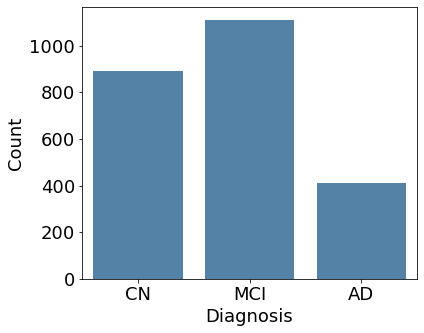

In [7]:
#calculate sum of values by group
ADNIMERGE_dx = ADNIMERGE.groupby(['DX_bl']).agg(Count=("RID", 'count'))
ADNIMERGE_dx = ADNIMERGE_dx.reset_index()

#print barplot
fig = plt.figure(figsize=(6,5))

sns.barplot(x="DX_bl",
           y="Count",
           data=ADNIMERGE_dx,
           color='steelblue',
           order=["CN","MCI","AD"])

plt.xlabel("Diagnosis")
plt.ylabel("Count")

plt.show()

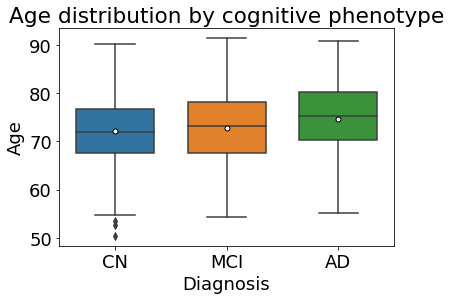

In [8]:
sns.boxplot( x=ADNIMERGE["DX_bl"], y=ADNIMERGE["AGE"], width=0.7,
            order=["CN","MCI","AD"],
            showmeans=True,
            meanprops={"marker":"o",
                       "markerfacecolor":"white", 
                       "markeredgecolor":"black",
                      "markersize":"5"});
plt.title("Age distribution by cognitive phenotype")
plt.xlabel("Diagnosis")
plt.ylabel("Age")
plt.show()

Find out which MCI will eventually be diagnosed with dementia and filter the original table to only keep those patients. 

In [9]:
ADNIMERGE_aux = pd.read_csv("ADNIMERGE.csv",low_memory=False)
ADNIMERGE_aux['DX_bl'] = ADNIMERGE_aux['DX_bl'].replace({'EMCI':'MCI', 'LMCI':'MCI',"SMC":"CN"})
ADNIMERGE_MCI = ADNIMERGE_aux[ADNIMERGE_aux['DX_bl']=='MCI']
#Get MCI patients that evolve to dementia
ADNIMERGE_MCI_AD = ADNIMERGE_MCI.loc[(ADNIMERGE_MCI['VISCODE'] != 'bl') & (ADNIMERGE_MCI['DX'] == 'Dementia')]
ADNIMERGE_MCI_AD = ADNIMERGE_MCI_AD['RID'].unique()
#Filter original table to keep only this MCI patients
ADNIMERGE_CN_AD = ADNIMERGE[ADNIMERGE['DX_bl']!='MCI'].copy() #dataframe with CN and AD info
ADNIMERGE_MCI = ADNIMERGE[(ADNIMERGE['DX_bl'] == 'MCI') & (ADNIMERGE['RID'].isin(ADNIMERGE_MCI_AD))]
ADNIMERGE = pd.concat([ADNIMERGE_CN_AD, ADNIMERGE_MCI])

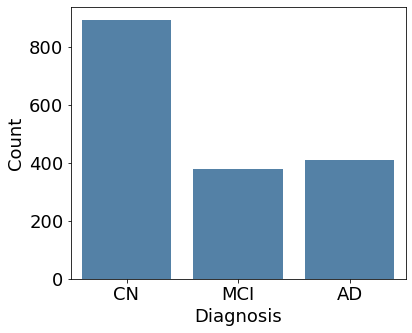

In [10]:
#calculate sum of values by group
ADNIMERGE_dx = ADNIMERGE.groupby(['DX_bl']).agg(Count=("RID", 'count'))
ADNIMERGE_dx = ADNIMERGE_dx.reset_index()

#print barplot
fig = plt.figure(figsize=(6,5))

sns.barplot(x="DX_bl",
           y="Count",
           data=ADNIMERGE_dx,
           color='steelblue',
           order=["CN","MCI","AD"])

plt.xlabel("Diagnosis")
plt.ylabel("Count")

plt.show()

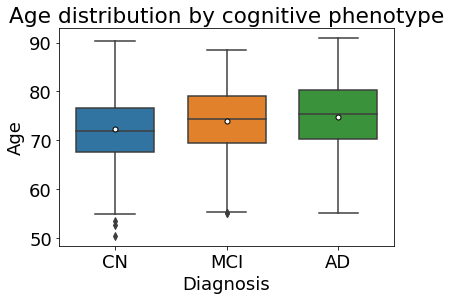

In [11]:
sns.boxplot( x=ADNIMERGE["DX_bl"], y=ADNIMERGE["AGE"], width=0.7,
            order=["CN","MCI","AD"],
            showmeans=True,
            meanprops={"marker":"o",
                       "markerfacecolor":"white", 
                       "markeredgecolor":"black",
                      "markersize":"5"});
plt.title("Age distribution by cognitive phenotype")
plt.xlabel("Diagnosis")
plt.ylabel("Age")
plt.show()

#### Kruskal-Wallis Test

To compare the distributions, we have performed a **Kruskal-Wallis** test which is a non-parametric test and an alternative to one-way Anova. By non-parametric we mean, the data is not assumed to become from a particular distribution. The main objective of this test is used to determine whether there is a statistical difference between the medians of at least three independent groups. 

The hypothesese are: 
- **Null hypothesis (H0)**: the median is the same for all the data groups
- **Alternative hypothesis (Ha)**: the median is not equal for all data groups. 

In [12]:
#Import required package
from scipy import stats

In [13]:
#Count NAs
print("Number of missing values for the age: ", ADNIMERGE['AGE'].isna().sum())

Number of missing values for the age:  1


In [14]:
#drop rows with NANs as they are giving problems in the statistical analysis
ADNIMERGE = ADNIMERGE.dropna(subset = ['AGE'])
print("Number of missing values for the age: ", ADNIMERGE['AGE'].isna().sum())

Number of missing values for the age:  0


In [15]:
#Prepare data for statistical tests
CN_age = ADNIMERGE[ADNIMERGE["DX_bl"]=='CN']['AGE'].values.tolist()
MCI_age = ADNIMERGE[ADNIMERGE["DX_bl"]=='MCI']['AGE'].values.tolist()
AD_age = ADNIMERGE[ADNIMERGE["DX_bl"]=='AD']['AGE'].values.tolist()

In [16]:
#Run Kruskal-Wallis test
KW_age = stats.kruskal(CN_age, MCI_age, AD_age)
print(KW_age)

KruskalResult(statistic=49.448590860415884, pvalue=1.8296790934881835e-11)


The p-value is below 0.05 and thus, we can reject the null hypothesis, suggesting that the at least one of the groups do not have the same age distribution as the others.

#### Mann-Whitney Test

In addition, we can compare the distributions of each of the cognitive impairment groups with the controls using a **Mann-Whitney** test. This test is equivalent to the Kruskal-Wallis test, but compares only two grous at a time. 

In [17]:
#Mann-Whitney tests
print("Controls-AD: ", stats.mannwhitneyu(CN_age,AD_age))
print("Controls-MCI: ", stats.mannwhitneyu(CN_age,MCI_age))
print("AD-MCI: ", stats.mannwhitneyu(AD_age,MCI_age))

Controls-AD:  MannwhitneyuResult(statistic=142956.5, pvalue=1.6294103308314657e-10)
Controls-MCI:  MannwhitneyuResult(statistic=141540.5, pvalue=3.173082069447581e-06)
AD-MCI:  MannwhitneyuResult(statistic=83691.0, pvalue=0.08108753303366102)


The MCI and AD groups have the same age distribution, but they do not share the same distribution than the controls. 

In [18]:
#groupping all patients in the same group
noCN_age = ADNIMERGE[ADNIMERGE["DX_bl"]!='CN']['AGE'].values.tolist()
print("Controls-no controls: ", stats.mannwhitneyu(CN_age,noCN_age))

Controls-no controls:  MannwhitneyuResult(statistic=292308.5, pvalue=3.610120364706114e-11)


### 2.2. Gender distribution by diagnosis group

In [19]:
#calculate sum of values by group
df_sex = ADNIMERGE.groupby(['DX_bl', 'PTGENDER']).agg(Count=("RID", 'count'))
df_sex = df_sex.reset_index()
#df_sex

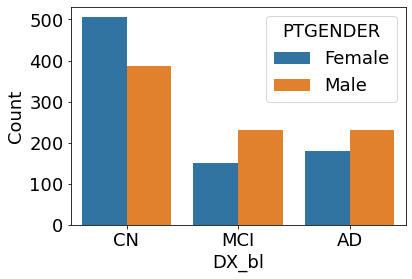

In [20]:
#print barplot
sns.barplot(x="DX_bl",
            y="Count",
            hue="PTGENDER",
            order=['CN','MCI','AD'],
            data=df_sex)

plt.show()

### 2.3. Ethnic distribution by diagnosis group

In [21]:
#calculate sum of values by group
df_eth = ADNIMERGE.groupby(['DX_bl', 'PTRACCAT']).agg(Count=("RID", 'count'))
df_eth = df_eth.reset_index()
#df_eth.head()

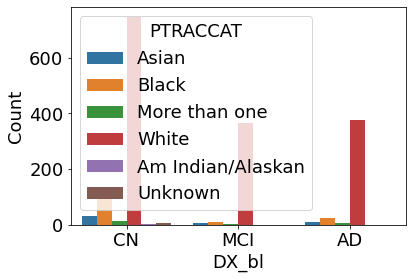

In [22]:
#print barplot
sns.barplot(x="DX_bl",
            y="Count",
            hue="PTRACCAT",
            order=['CN','MCI','AD'],
            data=df_eth)

plt.show()

## 3. Neurocognitive test batteries data inspection

First we are going to find how many patients -in baseline- have been administered with the three batteries (ADAS-cog, MMSE, MoCA).

### 3.1. Data import

#### ADAS-cog

In [23]:
#ADAS-cog (ADNIGO,2,3)
ADAS = pd.read_csv("Neuropsychological/ADAS_ADNIGO23.csv")
ADAS = ADAS[ADAS['VISCODE2']=='bl']
#Delete MCI who do not develop dementia
ADAS = ADAS.merge(ADNIMERGE['RID'])
ADAS['Phase'].unique()

array(['ADNIGO', 'ADNI2', 'ADNI3'], dtype=object)

In [24]:
print("Number of subjects: ", len(ADAS['RID'].unique()))

Number of subjects:  1061


Count missing data

In [25]:
ADAS_columns = ["Q1SCORE","Q2SCORE","Q3SCORE","Q4SCORE","Q5SCORE","Q6SCORE","Q7SCORE",
          "Q8SCORE","Q9SCORE","Q10SCORE","Q11SCORE","Q12SCORE","Q13SCORE"]

for column in ADAS_columns:
    NullSum = ADAS[column].isnull().sum(axis = 0)
    print(f"{column}: {NullSum}")
    
print("Number of rows with missing values: ", ADAS[ADAS_columns].isna().any(axis=1).sum())
    
print("Total number of tests: ", len(ADAS_columns) )

Q1SCORE: 2
Q2SCORE: 2
Q3SCORE: 2
Q4SCORE: 2
Q5SCORE: 4
Q6SCORE: 2
Q7SCORE: 2
Q8SCORE: 3
Q9SCORE: 3
Q10SCORE: 2
Q11SCORE: 2
Q12SCORE: 2
Q13SCORE: 7
Number of rows with missing values:  10
Total number of tests:  13


There are only 13 subjects that have missing data in any test. 

In [26]:
#Drop NaN
ADAS = ADAS.dropna(subset=ADAS_columns)
print("Number of subjects that have completed all tests: ", ADAS.shape[0])

Number of subjects that have completed all tests:  1051


#### MMSE

In [27]:
#MMSE (ADNI1,GO,2,3)
MMSE = pd.read_csv("Neuropsychological/MMSE.csv",low_memory=False)
MMSE = MMSE[MMSE['VISCODE2']=='sc']
#Delete MCI who do not develop dementia
MMSE = MMSE.merge(ADNIMERGE['RID'])
MMSE['Phase'].unique()

array(['ADNI1', 'ADNIGO', 'ADNI2', 'ADNI3'], dtype=object)

In [28]:
print("Number of subjects: ", len(MMSE['RID'].unique()))

Number of subjects:  1697


In [29]:
#Count missing data
MMSE_columns = ["MMDATE","MMYEAR","MMMONTH","MMDAY","MMSEASON","MMHOSPIT","MMFLOOR",
          "MMCITY","MMAREA","MMSTATE","MMBALL","MMFLAG","MMTREE","MMD",
               "MML","MMR","MMO","MMW","MMBALLDL","MMFLAGDL","MMTREEDL","MMWATCH",
               "MMPENCIL","MMREPEAT","MMHAND","MMFOLD","MMONFLR","MMREAD","MMWRITE",
               "MMDRAW"]

for column in MMSE_columns:
    NullSum = MMSE[column].isnull().sum(axis = 0)
    print(f"{column}: {NullSum}")

print("Number of rows with missing values: ", MMSE[MMSE_columns].isna().any(axis=1).sum())

print("Total number of tests: ", len(MMSE_columns) )

MMDATE: 0
MMYEAR: 0
MMMONTH: 0
MMDAY: 0
MMSEASON: 0
MMHOSPIT: 0
MMFLOOR: 0
MMCITY: 0
MMAREA: 0
MMSTATE: 0
MMBALL: 479
MMFLAG: 479
MMTREE: 479
MMD: 479
MML: 479
MMR: 479
MMO: 479
MMW: 479
MMBALLDL: 479
MMFLAGDL: 479
MMTREEDL: 479
MMWATCH: 0
MMPENCIL: 0
MMREPEAT: 0
MMHAND: 0
MMFOLD: 0
MMONFLR: 1
MMREAD: 0
MMWRITE: 0
MMDRAW: 0
Number of rows with missing values:  479
Total number of tests:  30


There are 1605 patients that have missing data so maybe deleting all these rows is not the best strategy to deal with missing values. 

In [30]:
#Drop NaN
MMSE = MMSE.dropna(subset=MMSE_columns)
print("Number of subjects that have completed all tests: ", MMSE.shape[0])

Number of subjects that have completed all tests:  1218


#### MoCA

In [31]:
#MoCA (ADNIGO,2,3)
MOCA = pd.read_csv("Neuropsychological/MOCA.csv")
MOCA = MOCA[MOCA['VISCODE2']=='bl']
#Delete MCI who do not develop dementia
MOCA = MOCA.merge(ADNIMERGE['RID'])
MOCA['Phase'].unique()

array(['ADNIGO', 'ADNI2', 'ADNI3'], dtype=object)

In [32]:
print("Number of subjects: ", len(MOCA['RID'].unique()))

Number of subjects:  1060


In [33]:
#Count missing data
MOCA_columns = MOCA.columns[8:-4].tolist()

for column in MOCA_columns:
    NullSum = MOCA[column].isnull().sum(axis = 0)
    print(f"{column}: {NullSum}")
    
print("Number of rows with missing values: ", MOCA[MOCA_columns].isna().any(axis=1).sum())
    
print("Total number of tests: ", len(MOCA_columns) )

TRAILS: 4
CUBE: 5
CLOCKCON: 6
CLOCKNO: 7
CLOCKHAN: 8
LION: 4
RHINO: 4
CAMEL: 4
IMMT1W1: 5
IMMT1W2: 5
IMMT1W3: 7
IMMT1W4: 6
IMMT1W5: 6
IMMT2W1: 13
IMMT2W2: 10
IMMT2W3: 10
IMMT2W4: 11
IMMT2W5: 10
DIGFOR: 3
DIGBACK: 3
LETTERS: 5
SERIAL1: 6
SERIAL2: 6
SERIAL3: 8
SERIAL4: 8
SERIAL5: 9
REPEAT1: 3
REPEAT2: 3
FFLUENCY: 4
ABSTRAN: 4
ABSMEAS: 5
DELW1: 7
DELW2: 6
DELW3: 6
DELW4: 6
DELW5: 6
DATE: 3
MONTH: 3
YEAR: 3
DAY: 4
PLACE: 3
CITY: 4
Number of rows with missing values:  35
Total number of tests:  42


In [34]:
#Drop NaN
MOCA = MOCA.dropna(subset=MOCA_columns)
print("Number of subjects that have completed all tests: ", MOCA.shape[0])

Number of subjects that have completed all tests:  1025


There are 50 subjects that have missing data. 

#### Merged batteries

Merge the three test batteries (ADAS-cog, MMSE and MoCA).

In [35]:
df = pd.merge(pd.merge(ADAS,MMSE,on='RID'),MOCA,on='RID')
#df.head()

In [36]:
print("Number of subjects with data for all batteries: ", df.shape[0])

Number of subjects with data for all batteries:  565


If we do not discard the rows that have missing values, the total number of patients in the merged table would be 1605. All of them will be patients with information for the 3 batteries -although not necessarily all test completed-.

#### Merged batteries (ADAS+MOCA)

Merge only the ADAS-cog and MoCA batteries.

In [37]:
ADASMOCA = pd.merge(ADAS,MOCA,on='RID')
#ADASMOCA.head()

In [38]:
print("Number of subjects with data for all batteries: ", ADASMOCA.shape[0])

Number of subjects with data for all batteries:  1017


#### NEUROBAT (ADNI1)

In [39]:
#NEUROBAT (ADNI1,GO,2,3)
NEUROBAT = pd.read_csv("Neuropsychological/NEUROBAT.csv",low_memory=False)
NEUROBAT = NEUROBAT[NEUROBAT['VISCODE2']=='bl']
NEUROBAT = NEUROBAT[NEUROBAT['Phase']=='ADNI1']
#Delete MCI who do not develop dementia
NEUROBAT = NEUROBAT.merge(ADNIMERGE['RID'])
NEUROBAT['Phase'].unique()

array(['ADNI1'], dtype=object)

In [40]:
print("Number of subjects: ", len(NEUROBAT['RID'].unique()))

Number of subjects:  636


In [41]:
#Count missing data
#NEUROBAT_columns = ["AVTOT1","AVTOT2","AVTOT3","AVTOT4","AVTOT5","CATANIMSC","CATVEGESC",
#          "CATANPERS","CATANINTR","CATVGPERS","CATVGINTR","BNTSPONT","BNTCSTIM","BNTCPHON",
#               "CLOCKSCOR","COPYSCOR","DSPANFOR","DSPANBAC","TRAASCOR",
#               "TRABSCOR","DIGITSCOR","ANARTERR", "AVDEL30MIN","AVDELTOT"]

NEUROBAT_columns = ["AVTOT1","AVTOT2","AVTOT3","AVTOT4","AVTOT5","CATANIMSC",
          "CATANPERS","CATANINTR","BNTSPONT","BNTCSTIM","BNTCPHON",
               "CLOCKSCOR","COPYSCOR","TRAASCOR",
               "TRABSCOR","ANARTERR", "AVDEL30MIN","AVDELTOT"]

for column in NEUROBAT_columns:
    NullSum = NEUROBAT[column].isnull().sum(axis = 0)
    print(f"{column}: {NullSum}")

print("Number of rows with missing values: ", NEUROBAT[NEUROBAT_columns].isna().any(axis=1).sum())

print("Total number of tests: ", len(NEUROBAT_columns) )

AVTOT1: 0
AVTOT2: 0
AVTOT3: 0
AVTOT4: 0
AVTOT5: 0
CATANIMSC: 0
CATANPERS: 0
CATANINTR: 0
BNTSPONT: 3
BNTCSTIM: 3
BNTCPHON: 3
CLOCKSCOR: 0
COPYSCOR: 0
TRAASCOR: 0
TRABSCOR: 0
ANARTERR: 2
AVDEL30MIN: 0
AVDELTOT: 0
Number of rows with missing values:  3
Total number of tests:  18


There are 1605 patients that have missing data so maybe deleting all these rows is not the best strategy to deal with missing values. 

In [42]:
#Drop NaN
NEUROBAT = NEUROBAT.dropna(subset=NEUROBAT_columns)
print("Number of subjects that have completed all tests: ", NEUROBAT.shape[0])

Number of subjects that have completed all tests:  633


### 3.2. EDA

In [43]:
def table_1(df):
    
    df_ADNIMERGE = pd.merge(df,ADNIMERGE,on='RID')

    df_ADNIMERGE_groupped = df_ADNIMERGE.copy()
    
    quant_variables_ls = ['AGE', 'PTEDUCAT', 'CDRSB_bl', 'ADAS13_bl', 'MMSE_bl', 'MOCA_bl']
    columns = ['CN_median', 'CN_Q1', 'CN_Q3', 'MCI_median', 'MCI_Q1', 'MCI_Q3',
              'AD_median', 'AD_Q1', 'AD_Q3'] #columns
    
    dx_ls = ['CN', 'MCI', 'AD']
    
    table = pd.DataFrame(columns = columns, index = quant_variables_ls) #create table 1
    
    for variable in quant_variables_ls:
        for dx in dx_ls: 
            df_dx = df_ADNIMERGE_groupped[df_ADNIMERGE_groupped['DX_bl']==dx] #filter dataframe by diagnostic group
            #Median (Q2)
            median_col = dx + '_median'
            table.loc[variable, median_col] = np.quantile(df_dx[variable], 0.5)
            #Q1
            Q1_col = dx + '_Q1'
            table.loc[variable, Q1_col] = np.quantile(df_dx[variable], 0.25)
            #Q3
            Q3_col = dx + '_Q3'
            table.loc[variable, Q3_col] = np.quantile(df_dx[variable], 0.75)
    
    return table

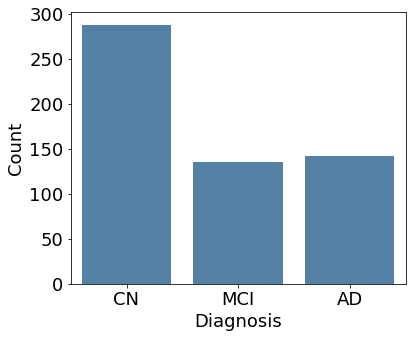

In [44]:
#Diagnosis bar plot
df_ADNIMERGE = pd.merge(df,ADNIMERGE,on='RID')

df_ADNIMERGE_groupped = df_ADNIMERGE.copy()


#calculate sum of values by group
df_dx = df_ADNIMERGE_groupped.groupby(['DX_bl']).agg(Count=("RID", 'count'))
df_dx = df_dx.reset_index()

#print barplot
fig = plt.figure(figsize=(6,5))

sns.barplot(x="DX_bl",
           y="Count",
           data=df_dx,
           color='steelblue',
           order=["CN","MCI","AD"])

plt.xlabel("Diagnosis")
plt.ylabel("Count")

plt.show()

In [45]:
import warnings
warnings.filterwarnings('ignore')

#Count number of instances in each group
df_CN = pd.merge(df,df_ADNIMERGE_groupped[df_ADNIMERGE_groupped["DX_bl"]=='CN'],on='RID')
df_MCI = pd.merge(df,df_ADNIMERGE_groupped[df_ADNIMERGE_groupped["DX_bl"]=='MCI'],on='RID')
df_AD = pd.merge(df,df_ADNIMERGE_groupped[df_ADNIMERGE_groupped["DX_bl"]=='AD'],on='RID')

print("Number of controls: ", df_CN.shape[0])
print("Number of MCI subjects: ", df_MCI.shape[0])
print("Number of AD subjects: ", df_AD.shape[0])

Number of controls:  288
Number of MCI subjects:  135
Number of AD subjects:  142


#### Age distribution

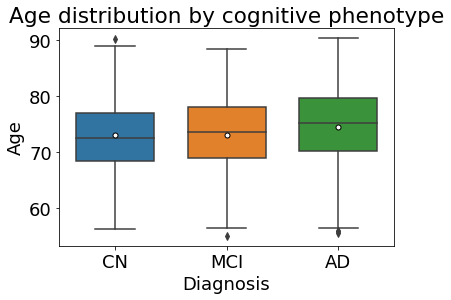

In [46]:
#Age Distribution 
sns.boxplot(x=df_ADNIMERGE_groupped["DX_bl"], y=df_ADNIMERGE["AGE"], width=0.7,
           order=["CN","MCI","AD"],
           showmeans=True,
            meanprops={"marker":"o",
                       "markerfacecolor":"white", 
                       "markeredgecolor":"black",
                      "markersize":"5"})
plt.title("Age distribution by cognitive phenotype")
plt.xlabel("Diagnosis")
plt.ylabel("Age")
plt.show()

#### Kruskal-Wallis test

In [47]:
#Kruskal-Wallis test
KW_age = stats.kruskal(df_CN['AGE'].values.tolist(), df_MCI['AGE'].values.tolist(), df_AD['AGE'].values.tolist())
KW_age

KruskalResult(statistic=7.1130699370411286, pvalue=0.02853753705898306)

#### Mann-Whitney tests

In [48]:
#Mann-Whitney tests
print("Controls-MCI: ", stats.mannwhitneyu(df_CN['AGE'].values.tolist(),df_MCI['AGE'].values.tolist()))
print("Controls-AD: ", stats.mannwhitneyu(df_CN['AGE'].values.tolist(),df_AD['AGE'].values.tolist()))

Controls-MCI:  MannwhitneyuResult(statistic=18592.0, pvalue=0.4696208858181832)
Controls-AD:  MannwhitneyuResult(statistic=17240.0, pvalue=0.008130636399248574)


These results indicate that the MCI group does not have the same age distribution than the controls. Thus, it does not supports a normalization based on age. 

#### Shapiro-Wilk test for normality

In [49]:
#Shapiro-Wilk test for normality
print("Controls: ", stats.shapiro(df_CN['AGE'].values.tolist()))
print("MCI: ", stats.shapiro(df_MCI['AGE'].values.tolist()))
print("AD: ", stats.shapiro(df_AD['AGE'].values.tolist()))

Controls:  ShapiroResult(statistic=0.9843290448188782, pvalue=0.0030755153857171535)
MCI:  ShapiroResult(statistic=0.9828779101371765, pvalue=0.0883432924747467)
AD:  ShapiroResult(statistic=0.9782910943031311, pvalue=0.02336999773979187)


They do not follow a normal distribution

#### Sex distribution

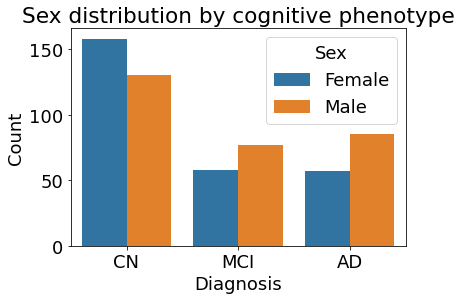

In [50]:
#Sex distribution

#calculate sum of values by group
df_sex = df_ADNIMERGE_groupped.groupby(['DX_bl', 'PTGENDER']).agg(Count=("RID", 'count'))
df_sex = df_sex.reset_index()

#print barplot
sns.barplot(x="DX_bl",
           y="Count",
           hue="PTGENDER",
           data=df_sex,
           order=["CN","MCI","AD"])

plt.title("Sex distribution by cognitive phenotype")
plt.xlabel("Diagnosis")
plt.ylabel("Count")
plt.legend(title='Sex')

plt.show()

In [51]:
contingency_sex = pd.crosstab(df_ADNIMERGE_groupped['DX_bl'], df_ADNIMERGE_groupped['PTGENDER'])

# Chi-square test of independence. 
c, p, dof, expected = stats.chi2_contingency(contingency_sex)
print("Chi-square test p-value:", p)

Chi-square test p-value: 0.005828119624607753


#### Ethnicity distribution

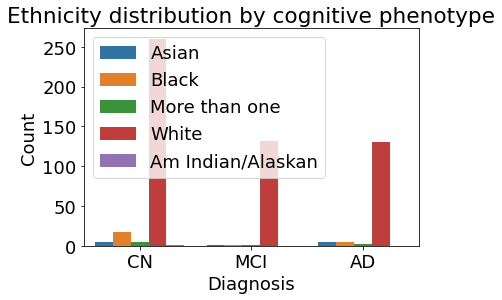

In [52]:
#Ethnic distribution

#calculate sum of values by group
df_eth = df_ADNIMERGE_groupped.groupby(['DX_bl', 'PTRACCAT']).agg(Count=("RID", 'count'))
df_eth = df_eth.reset_index()

#print barplot
sns.barplot(x="DX_bl",
           y="Count",
           hue="PTRACCAT",
           data=df_eth,
           order=["CN","MCI","AD"])

plt.title("Ethnicity distribution by cognitive phenotype")
plt.xlabel("Diagnosis")
plt.ylabel("Count")
plt.legend(title='Ethnic group')
plt.legend(loc='upper left')

plt.show()

In [53]:
contingency_eth = pd.crosstab(df_ADNIMERGE_groupped['DX_bl'], df_ADNIMERGE_groupped['PTRACCAT'])

# Chi-square test of independence. 
c, p, dof, expected = stats.chi2_contingency(contingency_eth)
print("Chi-square test p-value:", p)

Chi-square test p-value: 0.18962412503927908


#### Years of education distribution

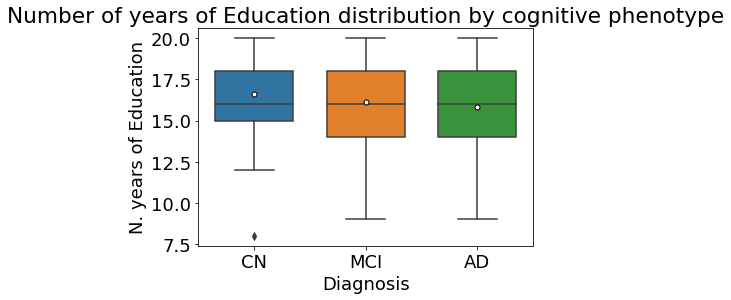

In [54]:
#Age Distribution 

sns.boxplot(x=df_ADNIMERGE_groupped["DX_bl"], y=df_ADNIMERGE_groupped["PTEDUCAT"], width=0.7,
           order=["CN","MCI","AD"],
           showmeans=True,
            meanprops={"marker":"o",
                       "markerfacecolor":"white", 
                       "markeredgecolor":"black",
                      "markersize":"5"})

plt.title("Number of years of Education distribution by cognitive phenotype")
plt.xlabel("Diagnosis")
plt.ylabel("N. years of Education")
plt.show()

#### Kruskal-Wallis test

In [55]:
#Kruskal-Wallis test
KW_ed = stats.kruskal(df_CN['PTEDUCAT'].values.tolist(), df_MCI['PTEDUCAT'].values.tolist(), df_AD['PTEDUCAT'].values.tolist())
KW_ed

KruskalResult(statistic=9.803283921413865, pvalue=0.007434366106753318)

#### Mann-Whitney tests

In [56]:
#Mann-Whitney tests
print("Controls-MCI: ", stats.mannwhitneyu(df_CN['PTEDUCAT'].values.tolist(),df_MCI['PTEDUCAT'].values.tolist()))
print("Controls-AD: ", stats.mannwhitneyu(df_CN['PTEDUCAT'].values.tolist(),df_AD['PTEDUCAT'].values.tolist()))

Controls-MCI:  MannwhitneyuResult(statistic=21643.5, pvalue=0.05652293039161526)
Controls-AD:  MannwhitneyuResult(statistic=23998.0, pvalue=0.002953298023402955)


These results indicate that the MCI group does not have the same age distribution than the controls.

#### Shapiro-Wilk test for normality

In [57]:
#Shapiro-Wilk test for normality
print("Controls: ", stats.shapiro(df_CN['PTEDUCAT'].values.tolist()))
print("MCI: ", stats.shapiro(df_MCI['PTEDUCAT'].values.tolist()))
print("AD: ", stats.shapiro(df_AD['PTEDUCAT'].values.tolist()))

Controls:  ShapiroResult(statistic=0.9217051863670349, pvalue=3.800341291659848e-11)
MCI:  ShapiroResult(statistic=0.9390625357627869, pvalue=1.2594875443028286e-05)
AD:  ShapiroResult(statistic=0.9455487728118896, pvalue=2.3769425752107054e-05)


#### CDR distribution

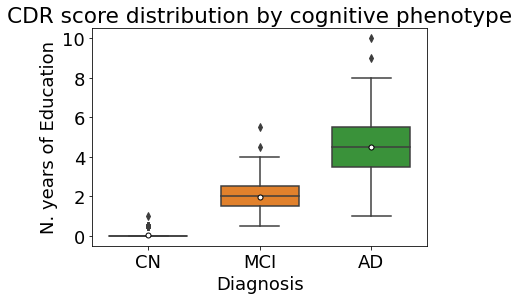

In [58]:
#Age Distribution 

sns.boxplot(x=df_ADNIMERGE_groupped["DX_bl"], y=df_ADNIMERGE_groupped["CDRSB_bl"], width=0.7,
           order=["CN","MCI","AD"],
           showmeans=True,
            meanprops={"marker":"o",
                       "markerfacecolor":"white", 
                       "markeredgecolor":"black",
                      "markersize":"5"})

plt.title("CDR score distribution by cognitive phenotype")
plt.xlabel("Diagnosis")
plt.ylabel("N. years of Education")
plt.show()

#### Shapiro-Wilk test for normality

In [59]:
#Shapiro-Wilk test for normality
print("Controls: ", stats.shapiro(df_CN['CDRSB_bl'].values.tolist()))
print("MCI: ", stats.shapiro(df_MCI['CDRSB_bl'].values.tolist()))
print("AD: ", stats.shapiro(df_AD['CDRSB_bl'].values.tolist()))

Controls:  ShapiroResult(statistic=0.33457010984420776, pvalue=5.133134625238555e-31)
MCI:  ShapiroResult(statistic=0.945561408996582, pvalue=3.7657126085832715e-05)
AD:  ShapiroResult(statistic=0.9747122526168823, pvalue=0.009808205999433994)


CDR does not follow a normal distribution. 

### Table 1

In [60]:
#!pip install tableone
from tableone import TableOne, load_dataset

In [61]:
TableOne_columns = ['AGE', 'PTGENDER', 'PTRACCAT', 'PTEDUCAT', 'CDRSB_bl', 'ADAS13_bl', 'MMSE_bl', 'MOCA_bl'] #variables
TableOne_cat = ['PTGENDER', 'PTRACCAT'] #categorical variables
TableOne_nonnormal = ['AGE', 'PTEDUCAT', 'CDRSB_bl', 'ADAS13_bl', 'MMSE_bl', 'MOCA_bl'] #variables that do not follow normal dist
TableOne_labels = {'AGE': 'Age', 'PTGENDER': 'Sex', 'PTRACCAT': 'Ethnicity', 'PTEDUCAT': 'Education (years)', 
                  'CDRSB_bl': 'CDR score', 'ADAS13_bl': 'ADAS13 score', 'MMSE_bl': 'MMSE score', 'MOCA_bl': 'MOCA score'}

#### ADNI1

In [62]:
ADNI1_demographics = ADNIMERGE[ADNIMERGE['COLPROT']=='ADNI1']
ADNI1_demographics = ADNI1_demographics.replace({'EMCI':'MCI', 'LMCI':'MCI',"SMC":"CN"})
ADNI1_TableOne = TableOne(data = ADNI1_demographics, columns = TableOne_columns, categorical = TableOne_cat, groupby = ['DX_bl'], 
                 nonnormal = TableOne_nonnormal, labels = TableOne_labels)
display(ADNI1_TableOne) #display results
ADNI1_TableOne.to_excel('./Results/TableOne_ADNI1.xlsx') #export results

C:\Users\anaso\anaconda3\lib\site-packages\tableone\tableone.py:225: DeprecationWarning: The labels argument is deprecated; use rename instead.
  warnings.warn("The labels argument is deprecated; use "


Grouped by DX_bl                                                                        
                                                         Missing           Overall                AD                CN               MCI
n                                                                              636               188               229               219
Age, median [Q1,Q3]                                            0  75.5 [71.2,79.8]  75.7 [70.8,81.3]  75.6 [72.3,78.5]  74.8 [70.0,79.9]
Sex, n (%)                        Female                       0        279 (43.9)         89 (47.3)        110 (48.0)         80 (36.5)
                                  Male                                  357 (56.1)         99 (52.7)        119 (52.0)        139 (63.5)
Ethnicity, n (%)                  Asian                        0          10 (1.6)           2 (1.1)           3 (1.3)           5 (2.3)
                                  Black                                   30 (4.7)           8 (4.3)          16 (7.0)           6 (2.7)
                                  More than one                            2 (0.3)           2 (1.1)                                    
                                  White                                 594 (93.4)        176 (93.6)        210 (91.7)        208 (95.0)
Education (years), median [Q1,Q3]                              0  16.0 [14.0,18.0]  15.0 [12.0,16.0]  16.0 [14.0,18.0]  16.0 [14.0,18.0]
CDR score, median [Q1,Q3]                                      0     1.5 [0.0,3.5]     4.5 [3.5,5.0]     0.0 [0.0,0.0]     1.5 [1.0,2.5]
ADAS13 score, median [Q1,Q3]                                   8  18.3 [11.0,25.7]  28.7 [23.5,34.0]    9.3 [6.0,12.3]  20.5 [17.0,24.0]
MMSE score, median [Q1,Q3]                                     0  27.0 [25.0,29.0]  23.0 [21.8,25.0]  29.0 [29.0,30.0]  27.0 [25.0,28.0]
MOCA score, median [Q1,Q3]                                   636     nan [nan,nan]     nan [nan,nan]     nan [nan,nan]     nan [nan,nan]

In [63]:
ADNI1_demographics = ADNI1_demographics.dropna(subset=['AGE', 'PTGENDER', 'PTRACCAT', 'PTEDUCAT', 'CDRSB_bl'])
#SHAPIRO-WILK NORMALITY TEST
print("AGE----------------------------------")
print("Controls: ", stats.shapiro(ADNI1_demographics[ADNI1_demographics['DX_bl']=='CN']['AGE'].values.tolist()))
print("MCI: ", stats.shapiro(ADNI1_demographics[ADNI1_demographics['DX_bl']=='MCI']['AGE'].values.tolist()))
print("AD: ", stats.shapiro(ADNI1_demographics[ADNI1_demographics['DX_bl']=='AD']['AGE'].values.tolist()))
print("EDUCATION----------------------------------")
print("Controls: ", stats.shapiro(ADNI1_demographics[ADNI1_demographics['DX_bl']=='CN']['PTEDUCAT'].values.tolist()))
print("MCI: ", stats.shapiro(ADNI1_demographics[ADNI1_demographics['DX_bl']=='MCI']['PTEDUCAT'].values.tolist()))
print("AD: ", stats.shapiro(ADNI1_demographics[ADNI1_demographics['DX_bl']=='AD']['PTEDUCAT'].values.tolist()))
print("CDR----------------------------------")
print("Controls: ", stats.shapiro(ADNI1_demographics[ADNI1_demographics['DX_bl']=='CN']['CDRSB_bl'].values.tolist()))
print("MCI: ", stats.shapiro(ADNI1_demographics[ADNI1_demographics['DX_bl']=='MCI']['CDRSB_bl'].values.tolist()))
print("AD: ", stats.shapiro(ADNI1_demographics[ADNI1_demographics['DX_bl']=='AD']['CDRSB_bl'].values.tolist()))

AGE----------------------------------
Controls:  ShapiroResult(statistic=0.9701955914497375, pvalue=9.556572331348434e-05)
MCI:  ShapiroResult(statistic=0.9802277088165283, pvalue=0.00364509760402143)
AD:  ShapiroResult(statistic=0.9793755412101746, pvalue=0.00705415103584528)
EDUCATION----------------------------------
Controls:  ShapiroResult(statistic=0.9377599358558655, pvalue=2.721164094054984e-08)
MCI:  ShapiroResult(statistic=0.9393625259399414, pvalue=6.692679477282582e-08)
AD:  ShapiroResult(statistic=0.9534317851066589, pvalue=7.712612386967521e-06)
CDR----------------------------------
Controls:  ShapiroResult(statistic=0.25458914041519165, pvalue=2.3338056449587182e-29)
MCI:  ShapiroResult(statistic=0.9316678047180176, pvalue=1.4314117890990019e-08)
AD:  ShapiroResult(statistic=0.9635693430900574, pvalue=8.515380613971502e-05)


In [64]:
#AGE
print("Age MCI-CN: ", stats.mannwhitneyu(ADNI1_demographics[ADNI1_demographics['DX_bl']=='MCI']['AGE'].values.tolist(), ADNI1_demographics[ADNI1_demographics['DX_bl']=='CN']['AGE'].values.tolist()))
print("Age AD-CN: ", stats.mannwhitneyu(ADNI1_demographics[ADNI1_demographics['DX_bl']=='AD']['AGE'].values.tolist(), ADNI1_demographics[ADNI1_demographics['DX_bl']=='CN']['AGE'].values.tolist()))
#EDUCATION
print("Education MCI-CN: ", stats.mannwhitneyu(ADNI1_demographics[ADNI1_demographics['DX_bl']=='MCI']['PTEDUCAT'].values.tolist(), ADNI1_demographics[ADNI1_demographics['DX_bl']=='CN']['PTEDUCAT'].values.tolist()))
print("Education AD-CN: ", stats.mannwhitneyu(ADNI1_demographics[ADNI1_demographics['DX_bl']=='AD']['PTEDUCAT'].values.tolist(), ADNI1_demographics[ADNI1_demographics['DX_bl']=='CN']['PTEDUCAT'].values.tolist()))
#CDR
print("CDR MCI-CN: ", stats.mannwhitneyu(ADNI1_demographics[ADNI1_demographics['DX_bl']=='MCI']['CDRSB_bl'].values.tolist(), ADNI1_demographics[ADNI1_demographics['DX_bl']=='CN']['CDRSB_bl'].values.tolist()))
print("CDR AD-CN: ", stats.mannwhitneyu(ADNI1_demographics[ADNI1_demographics['DX_bl']=='AD']['CDRSB_bl'].values.tolist(), ADNI1_demographics[ADNI1_demographics['DX_bl']=='CN']['CDRSB_bl'].values.tolist()))
#MMSE
print("MMSE MCI-CN: ", stats.mannwhitneyu(ADNI1_demographics[ADNI1_demographics['DX_bl']=='MCI']['MMSE_bl'].values.tolist(), ADNI1_demographics[ADNI1_demographics['DX_bl']=='CN']['MMSE_bl'].values.tolist()))
print("MMSE AD-CN: ", stats.mannwhitneyu(ADNI1_demographics[ADNI1_demographics['DX_bl']=='AD']['MMSE_bl'].values.tolist(), ADNI1_demographics[ADNI1_demographics['DX_bl']=='CN']['MMSE_bl'].values.tolist()))

Age MCI-CN:  MannwhitneyuResult(statistic=23097.5, pvalue=0.14884291932166951)
Age AD-CN:  MannwhitneyuResult(statistic=21115.0, pvalue=0.73745789188264)
Education MCI-CN:  MannwhitneyuResult(statistic=23658.5, pvalue=0.29455935565813585)
Education AD-CN:  MannwhitneyuResult(statistic=15771.0, pvalue=1.992469215993193e-06)
CDR MCI-CN:  MannwhitneyuResult(statistic=49997.0, pvalue=2.856295079685772e-83)
CDR AD-CN:  MannwhitneyuResult(statistic=43052.0, pvalue=5.893397362958202e-80)
MMSE MCI-CN:  MannwhitneyuResult(statistic=6720.5, pvalue=1.8659506956041388e-42)
MMSE AD-CN:  MannwhitneyuResult(statistic=144.0, pvalue=7.65982705423266e-70)


#### ADNIGO,2,3

In [65]:
ADNIGO23_demographics = ADNIMERGE[ADNIMERGE['COLPROT']!='ADNI1']
ADNIGO23_demographics = ADNIGO23_demographics.replace({'EMCI':'MCI', 'LMCI':'MCI',"SMC":"CN"})
ADNIGO23_TableOne = TableOne(data = ADNIGO23_demographics, columns = TableOne_columns, categorical = TableOne_cat, groupby = ['DX_bl'], 
                 nonnormal = TableOne_nonnormal, labels = TableOne_labels)
display(ADNIGO23_TableOne) #display results
ADNIGO23_TableOne.to_excel('./Results/TableOne_ADNIGO23.xlsx') #export results

C:\Users\anaso\anaconda3\lib\site-packages\tableone\tableone.py:225: DeprecationWarning: The labels argument is deprecated; use rename instead.
  warnings.warn("The labels argument is deprecated; use "


Grouped by DX_bl                                                                        
                                                             Missing           Overall                AD                CN               MCI
n                                                                                 1061               223               663               161
Age, median [Q1,Q3]                                                0  71.4 [66.9,77.0]  75.1 [69.7,79.7]  70.1 [66.5,75.5]  73.6 [68.9,77.8]
Sex, n (%)                        Female                           0        566 (53.3)         91 (40.8)        395 (59.6)         70 (43.5)
                                  Male                                      495 (46.7)        132 (59.2)        268 (40.4)         91 (56.5)
Ethnicity, n (%)                  Asian                            0          35 (3.3)           8 (3.6)          26 (3.9)           1 (0.6)
                                  Black                                      101 (9.5)          14 (6.3)         82 (12.4)           2 (1.2)
                                  More than one                               18 (1.7)           2 (0.9)          13 (2.0)           2 (1.2)
                                  White                                     901 (84.9)        199 (89.2)        536 (80.8)        156 (96.9)
                                  Am Indian/Alaskan                            2 (0.2)                             2 (0.3)                  
                                  Unknown                                      4 (0.4)                             4 (0.6)                  
Education (years), median [Q1,Q3]                                  0  16.0 [15.0,18.0]  16.0 [14.0,18.0]  16.0 [16.0,18.0]  16.0 [14.0,18.0]
CDR score, median [Q1,Q3]                                          0     0.0 [0.0,2.5]     4.5 [3.5,5.5]     0.0 [0.0,0.0]     2.0 [1.5,2.5]
ADAS13 score, median [Q1,Q3]                                      10   11.3 [7.0,21.2]  30.0 [24.5,36.0]    8.0 [5.0,11.3]  20.0 [15.0,25.0]
MMSE score, median [Q1,Q3]                                         1  29.0 [26.0,30.0]  23.0 [21.0,25.0]  29.0 [29.0,30.0]  28.0 [26.0,29.0]
MOCA score, median [Q1,Q3]                                        24  24.0 [21.0,27.0]  18.0 [14.0,20.0]  26.0 [24.0,28.0]  22.0 [20.0,23.0]

In [66]:
ADNIGO23_demographics = ADNIGO23_demographics.dropna(subset=['AGE', 'PTGENDER', 'PTRACCAT', 'PTEDUCAT', 'CDRSB_bl', 'ADAS13_bl', 'MMSE_bl', 'MOCA_bl'])
#SHAPIRO-WILK NORMALITY TEST
print("AGE----------------------------------")
print("Controls: ", stats.shapiro(ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='CN']['AGE'].values.tolist()))
print("MCI: ", stats.shapiro(ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='MCI']['AGE'].values.tolist()))
print("AD: ", stats.shapiro(ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='AD']['AGE'].values.tolist()))
print("EDUCATION----------------------------------")
print("Controls: ", stats.shapiro(ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='CN']['PTEDUCAT'].values.tolist()))
print("MCI: ", stats.shapiro(ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='MCI']['PTEDUCAT'].values.tolist()))
print("AD: ", stats.shapiro(ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='AD']['PTEDUCAT'].values.tolist()))
print("CDR----------------------------------")
print("Controls: ", stats.shapiro(ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='CN']['CDRSB_bl'].values.tolist()))
print("MCI: ", stats.shapiro(ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='MCI']['CDRSB_bl'].values.tolist()))
print("AD: ", stats.shapiro(ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='AD']['CDRSB_bl'].values.tolist()))

AGE----------------------------------
Controls:  ShapiroResult(statistic=0.9889261722564697, pvalue=8.247261575888842e-05)
MCI:  ShapiroResult(statistic=0.9845143556594849, pvalue=0.0749538466334343)
AD:  ShapiroResult(statistic=0.9771931171417236, pvalue=0.001680221175774932)
EDUCATION----------------------------------
Controls:  ShapiroResult(statistic=0.9287756681442261, pvalue=5.513523734752188e-17)
MCI:  ShapiroResult(statistic=0.9393833875656128, pvalue=2.7861103717441438e-06)
AD:  ShapiroResult(statistic=0.9489710330963135, pvalue=8.312592854053946e-07)
CDR----------------------------------
Controls:  ShapiroResult(statistic=0.311326801776886, pvalue=1.1070257868166055e-43)
MCI:  ShapiroResult(statistic=0.95055091381073, pvalue=2.260309520352166e-05)
AD:  ShapiroResult(statistic=0.9688940048217773, pvalue=0.0001318097929470241)


In [67]:
#AGE
print("Age MCI-CN: ", stats.mannwhitneyu(ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='MCI']['AGE'].values.tolist(), ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='CN']['AGE'].values.tolist()))
print("Age AD-CN: ", stats.mannwhitneyu(ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='AD']['AGE'].values.tolist(), ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='CN']['AGE'].values.tolist()))
#EDUCATION
print("Education MCI-CN: ", stats.mannwhitneyu(ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='MCI']['PTEDUCAT'].values.tolist(), ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='CN']['PTEDUCAT'].values.tolist()))
print("Education AD-CN: ", stats.mannwhitneyu(ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='AD']['PTEDUCAT'].values.tolist(), ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='CN']['PTEDUCAT'].values.tolist()))
#CDR
print("CDR MCI-CN: ", stats.mannwhitneyu(ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='MCI']['CDRSB_bl'].values.tolist(), ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='CN']['CDRSB_bl'].values.tolist()))
print("CDR AD-CN: ", stats.mannwhitneyu(ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='AD']['CDRSB_bl'].values.tolist(), ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='CN']['CDRSB_bl'].values.tolist()))
#MMSE
print("MMSE MCI-CN: ", stats.mannwhitneyu(ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='MCI']['MMSE_bl'].values.tolist(), ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='CN']['MMSE_bl'].values.tolist()))
print("MMSE AD-CN: ", stats.mannwhitneyu(ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='AD']['MMSE_bl'].values.tolist(), ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='CN']['MMSE_bl'].values.tolist()))
#ADAS13
print("ADAS MCI-CN: ", stats.mannwhitneyu(ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='MCI']['ADAS13_bl'].values.tolist(), ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='CN']['ADAS13_bl'].values.tolist()))
print("ADAS AD-CN: ", stats.mannwhitneyu(ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='AD']['ADAS13_bl'].values.tolist(), ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='CN']['ADAS13'].values.tolist()))
#MoCA
print("MOCA MCI-CN: ", stats.mannwhitneyu(ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='MCI']['MOCA_bl'].values.tolist(), ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='CN']['MOCA_bl'].values.tolist()))
print("MOCA AD-CN: ", stats.mannwhitneyu(ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='AD']['MOCA_bl'].values.tolist(), ADNIGO23_demographics[ADNIGO23_demographics['DX_bl']=='CN']['MOCA_bl'].values.tolist()))

Age MCI-CN:  MannwhitneyuResult(statistic=61710.5, pvalue=6.111239687954004e-05)
Age AD-CN:  MannwhitneyuResult(statistic=87567.5, pvalue=8.535693591707457e-10)
Education MCI-CN:  MannwhitneyuResult(statistic=45178.0, pvalue=0.019760370074572018)
Education AD-CN:  MannwhitneyuResult(statistic=53633.0, pvalue=1.701428943721222e-06)
CDR MCI-CN:  MannwhitneyuResult(statistic=101914.0, pvalue=1.0974652710476903e-137)
CDR AD-CN:  MannwhitneyuResult(statistic=136725.0, pvalue=4.6821523075697695e-157)
MMSE MCI-CN:  MannwhitneyuResult(statistic=22640.0, pvalue=4.4172792061448736e-30)
MMSE AD-CN:  MannwhitneyuResult(statistic=2010.0, pvalue=1.274724020155259e-105)
ADAS MCI-CN:  MannwhitneyuResult(statistic=94178.0, pvalue=2.2414922677187583e-60)
ADAS AD-CN:  MannwhitneyuResult(statistic=136092.0, pvalue=6.969431700956615e-104)
MOCA MCI-CN:  MannwhitneyuResult(statistic=13032.5, pvalue=2.3100699557636586e-48)
MOCA AD-CN:  MannwhitneyuResult(statistic=4399.5, pvalue=2.070437706227289e-93)


#### Table 1 (ADAS)

In [68]:
#display(table_1(ADAS))
ADAS_demographics = pd.merge(ADAS,ADNIMERGE,on='RID')
ADAS_demographics = ADAS_demographics.replace({'EMCI':'MCI', 'LMCI':'MCI',"SMC":"CN"})
ADAS_TableOne = TableOne(data = ADAS_demographics, columns = TableOne_columns, categorical = TableOne_cat, groupby = ['DX_bl'], 
                 nonnormal = TableOne_nonnormal, labels = TableOne_labels)
display(ADAS_TableOne) #display results
ADAS_TableOne.to_excel('./Results/TableOne_ADAS.xlsx') #export results

C:\Users\anaso\anaconda3\lib\site-packages\tableone\tableone.py:225: DeprecationWarning: The labels argument is deprecated; use rename instead.
  warnings.warn("The labels argument is deprecated; use "


Grouped by DX_bl                                                                        
                                                             Missing           Overall                AD                CN               MCI
n                                                                                 1051               219               659               161
Age, median [Q1,Q3]                                                0  71.4 [66.9,77.0]  75.1 [69.7,79.7]  70.1 [66.5,75.5]  73.6 [68.9,77.8]
Sex, n (%)                        Female                           0        558 (53.1)         88 (40.2)        392 (59.5)         70 (43.5)
                                  Male                                      493 (46.9)        131 (59.8)        267 (40.5)         91 (56.5)
Ethnicity, n (%)                  Asian                            0          35 (3.3)           8 (3.7)          26 (3.9)           1 (0.6)
                                  Black                                       98 (9.3)          13 (5.9)         81 (12.3)           2 (1.2)
                                  More than one                               17 (1.6)           2 (0.9)          12 (1.8)           2 (1.2)
                                  White                                     895 (85.2)        196 (89.5)        534 (81.0)        156 (96.9)
                                  Am Indian/Alaskan                            2 (0.2)                             2 (0.3)                  
                                  Unknown                                      4 (0.4)                             4 (0.6)                  
Education (years), median [Q1,Q3]                                  0  16.0 [15.0,18.0]  16.0 [14.0,18.0]  16.0 [16.0,18.0]  16.0 [14.0,18.0]
CDR score, median [Q1,Q3]                                          0     0.0 [0.0,2.5]     4.5 [3.5,5.5]     0.0 [0.0,0.0]     2.0 [1.5,2.5]
ADAS13 score, median [Q1,Q3]                                       0   11.3 [7.0,21.2]  30.0 [24.5,36.0]    8.0 [5.0,11.3]  20.0 [15.0,25.0]
MMSE score, median [Q1,Q3]                                         1  29.0 [26.0,30.0]  23.0 [21.0,25.0]  29.0 [29.0,30.0]  28.0 [26.0,29.0]
MOCA score, median [Q1,Q3]                                        22  24.0 [21.0,27.0]  18.0 [14.0,20.0]  26.0 [24.0,28.0]  22.0 [20.0,23.0]

#### Table 1 (MMSE)

In [69]:
#display(table_1(MMSE))
MMSE_demographics = pd.merge(MMSE,ADNIMERGE,on='RID')
MMSE_demographics = MMSE_demographics.replace({'EMCI':'MCI', 'LMCI':'MCI',"SMC":"CN"})
MMSE_TableOne = TableOne(data = MMSE_demographics, columns = TableOne_columns, categorical = TableOne_cat, groupby = ['DX_bl'], 
                 nonnormal = TableOne_nonnormal, labels = TableOne_labels)
display(MMSE_TableOne) #display results
MMSE_TableOne.to_excel('./Results/TableOne_MMSE.xlsx') #export results

C:\Users\anaso\anaconda3\lib\site-packages\tableone\tableone.py:225: DeprecationWarning: The labels argument is deprecated; use rename instead.
  warnings.warn("The labels argument is deprecated; use "


Grouped by DX_bl                                                                        
                                                             Missing           Overall                AD                CN               MCI
n                                                                                 1218               339               523               356
Age, median [Q1,Q3]                                                0  74.3 [70.2,79.1]  75.5 [70.8,80.5]  73.7 [70.5,78.0]  74.4 [69.5,79.1]
Sex, n (%)                        Female                           0        560 (46.0)        152 (44.8)        270 (51.6)        138 (38.8)
                                  Male                                      658 (54.0)        187 (55.2)        253 (48.4)        218 (61.2)
Ethnicity, n (%)                  Asian                            0          21 (1.7)           7 (2.1)           8 (1.5)           6 (1.7)
                                  Black                                       54 (4.4)          14 (4.1)          33 (6.3)           7 (2.0)
                                  More than one                               10 (0.8)           4 (1.2)           5 (1.0)           1 (0.3)
                                  White                                    1132 (92.9)        314 (92.6)        476 (91.0)        342 (96.1)
                                  Am Indian/Alaskan                            1 (0.1)                             1 (0.2)                  
Education (years), median [Q1,Q3]                                  0  16.0 [14.0,18.0]  16.0 [13.0,18.0]  16.0 [14.0,18.0]  16.0 [14.0,18.0]
CDR score, median [Q1,Q3]                                          0     1.0 [0.0,3.0]     4.5 [3.5,5.0]     0.0 [0.0,0.0]     1.5 [1.0,2.5]
ADAS13 score, median [Q1,Q3]                                      12   16.7 [9.3,25.3]  29.3 [24.0,34.6]    9.0 [6.0,12.0]  20.0 [16.0,24.0]
MMSE score, median [Q1,Q3]                                         0  28.0 [25.0,29.0]  23.0 [21.0,25.0]  29.0 [29.0,30.0]  27.0 [26.0,29.0]
MOCA score, median [Q1,Q3]                                       646  24.0 [20.0,26.0]  18.0 [14.0,20.0]  26.0 [24.0,28.0]  22.0 [20.0,24.0]

#### Table 1 (MoCA)

In [70]:
#display(table_1(MOCA))
MOCA_demographics = pd.merge(MOCA,ADNIMERGE,on='RID')
MOCA_demographics = MOCA_demographics.replace({'EMCI':'MCI', 'LMCI':'MCI',"SMC":"CN"})
MOCA_TableOne = TableOne(data = MOCA_demographics, columns = TableOne_columns, categorical = TableOne_cat, groupby = ['DX_bl'], 
                 nonnormal = TableOne_nonnormal, labels = TableOne_labels)
display(MOCA_TableOne) #display results
MOCA_TableOne.to_excel('./Results/TableOne_MOCA.xlsx') #export results

C:\Users\anaso\anaconda3\lib\site-packages\tableone\tableone.py:225: DeprecationWarning: The labels argument is deprecated; use rename instead.
  warnings.warn("The labels argument is deprecated; use "


Grouped by DX_bl                                                                        
                                                             Missing           Overall                AD                CN               MCI
n                                                                                 1025               212               645               158
Age, median [Q1,Q3]                                                0  71.4 [66.9,77.0]  75.1 [69.7,79.8]  70.0 [66.5,75.5]  73.8 [68.9,78.0]
Sex, n (%)                        Female                           0        548 (53.5)         86 (40.6)        385 (59.7)         70 (44.3)
                                  Male                                      477 (46.5)        126 (59.4)        260 (40.3)         88 (55.7)
Ethnicity, n (%)                  Asian                            0          33 (3.2)           8 (3.8)          24 (3.7)           1 (0.6)
                                  Black                                       95 (9.3)          13 (6.1)         78 (12.1)           2 (1.3)
                                  More than one                               18 (1.8)           2 (0.9)          13 (2.0)           2 (1.3)
                                  White                                     873 (85.2)        189 (89.2)        524 (81.2)        153 (96.8)
                                  Am Indian/Alaskan                            2 (0.2)                             2 (0.3)                  
                                  Unknown                                      4 (0.4)                             4 (0.6)                  
Education (years), median [Q1,Q3]                                  0  16.0 [15.0,18.0]  16.0 [14.0,18.0]  16.0 [16.0,18.0]  16.0 [14.0,18.0]
CDR score, median [Q1,Q3]                                          0     0.0 [0.0,2.0]     4.5 [3.5,5.5]     0.0 [0.0,0.0]     2.0 [1.5,2.5]
ADAS13 score, median [Q1,Q3]                                       8   11.3 [7.0,21.0]  30.0 [24.7,36.0]    8.0 [5.0,11.3]  20.0 [14.5,25.0]
MMSE score, median [Q1,Q3]                                         1  29.0 [26.0,30.0]  23.0 [21.0,25.0]  29.0 [29.0,30.0]  28.0 [26.0,29.0]
MOCA score, median [Q1,Q3]                                         0  24.0 [21.0,27.0]  18.0 [14.0,20.0]  26.0 [24.0,28.0]  22.0 [20.0,23.0]

#### Table 1 (merged)

In [71]:
#display(table_1(merged))
merged_demographics = pd.merge(df,ADNIMERGE,on='RID')
merged_demographics = merged_demographics.replace({'EMCI':'MCI', 'LMCI':'MCI',"SMC":"CN"})
merged_TableOne = TableOne(data = merged_demographics, columns = TableOne_columns, categorical = TableOne_cat, groupby = ['DX_bl'], 
                 nonnormal = TableOne_nonnormal, labels = TableOne_labels)
display(merged_TableOne) #display results
merged_TableOne.to_excel('./Results/TableOne_merged.xlsx') #export results

C:\Users\anaso\anaconda3\lib\site-packages\tableone\tableone.py:225: DeprecationWarning: The labels argument is deprecated; use rename instead.
  warnings.warn("The labels argument is deprecated; use "


Grouped by DX_bl                                                                        
                                                             Missing           Overall                AD                CN               MCI
n                                                                                  565               142               288               135
Age, median [Q1,Q3]                                                0  73.5 [68.5,78.2]  75.2 [70.2,79.6]  72.5 [68.4,77.0]  73.6 [69.0,77.9]
Sex, n (%)                        Female                           0        273 (48.3)         57 (40.1)        158 (54.9)         58 (43.0)
                                  Male                                      292 (51.7)         85 (59.9)        130 (45.1)         77 (57.0)
Ethnicity, n (%)                  Asian                            0          11 (1.9)           5 (3.5)           5 (1.7)           1 (0.7)
                                  Black                                       23 (4.1)           5 (3.5)          17 (5.9)           1 (0.7)
                                  More than one                                8 (1.4)           2 (1.4)           5 (1.7)           1 (0.7)
                                  White                                     522 (92.4)        130 (91.5)        260 (90.3)        132 (97.8)
                                  Am Indian/Alaskan                            1 (0.2)                             1 (0.3)                  
Education (years), median [Q1,Q3]                                  0  16.0 [14.0,18.0]  16.0 [14.0,18.0]  16.0 [15.0,18.0]  16.0 [14.0,18.0]
CDR score, median [Q1,Q3]                                          0     0.5 [0.0,3.0]     4.5 [3.5,5.5]     0.0 [0.0,0.0]     2.0 [1.5,2.5]
ADAS13 score, median [Q1,Q3]                                       0   14.0 [9.0,24.0]  30.5 [25.0,36.0]    9.0 [6.0,12.0]  20.0 [14.5,24.5]
MMSE score, median [Q1,Q3]                                         0  28.0 [25.0,30.0]  23.0 [21.0,25.0]  29.0 [29.0,30.0]  28.0 [26.0,29.0]
MOCA score, median [Q1,Q3]                                         0  24.0 [20.0,26.0]  18.0 [14.0,20.0]  26.0 [24.0,28.0]  22.0 [20.0,24.0]

#### Table 1 (ADAS and MoCA)

In [72]:
#display(table_1(ADASMOCA))
ADASMOCA_demographics = pd.merge(ADASMOCA,ADNIMERGE,on='RID')
ADASMOCA_demographics = ADASMOCA_demographics.replace({'EMCI':'MCI', 'LMCI':'MCI',"SMC":"CN"})
ADASMOCA_TableOne = TableOne(data = ADASMOCA_demographics, columns = TableOne_columns, categorical = TableOne_cat, groupby = ['DX_bl'], 
                 nonnormal = TableOne_nonnormal, labels = TableOne_labels)
display(ADASMOCA_TableOne) #display results
ADASMOCA_TableOne.to_excel('./Results/TableOne_ADASMOCA.xlsx') #export results

C:\Users\anaso\anaconda3\lib\site-packages\tableone\tableone.py:225: DeprecationWarning: The labels argument is deprecated; use rename instead.
  warnings.warn("The labels argument is deprecated; use "


Grouped by DX_bl                                                                        
                                                             Missing           Overall                AD                CN               MCI
n                                                                                 1017               208               641               158
Age, median [Q1,Q3]                                                0  71.4 [66.9,77.0]  75.1 [69.7,79.7]  70.0 [66.5,75.5]  73.8 [68.9,78.0]
Sex, n (%)                        Female                           0        542 (53.3)         83 (39.9)        382 (59.6)         70 (44.3)
                                  Male                                      475 (46.7)        125 (60.1)        259 (40.4)         88 (55.7)
Ethnicity, n (%)                  Asian                            0          33 (3.2)           8 (3.8)          24 (3.7)           1 (0.6)
                                  Black                                       93 (9.1)          12 (5.8)         77 (12.0)           2 (1.3)
                                  More than one                               17 (1.7)           2 (1.0)          12 (1.9)           2 (1.3)
                                  White                                     868 (85.3)        186 (89.4)        522 (81.4)        153 (96.8)
                                  Am Indian/Alaskan                            2 (0.2)                             2 (0.3)                  
                                  Unknown                                      4 (0.4)                             4 (0.6)                  
Education (years), median [Q1,Q3]                                  0  16.0 [15.0,18.0]  16.0 [14.0,18.0]  16.0 [16.0,18.0]  16.0 [14.0,18.0]
CDR score, median [Q1,Q3]                                          0     0.0 [0.0,2.0]     4.5 [3.5,5.5]     0.0 [0.0,0.0]     2.0 [1.5,2.5]
ADAS13 score, median [Q1,Q3]                                       0   11.3 [7.0,21.0]  30.0 [24.7,36.0]    8.0 [5.0,11.3]  20.0 [14.5,25.0]
MMSE score, median [Q1,Q3]                                         1  29.0 [26.0,30.0]  23.0 [21.0,25.0]  29.0 [29.0,30.0]  28.0 [26.0,29.0]
MOCA score, median [Q1,Q3]                                         0  24.0 [21.0,27.0]  18.0 [14.0,20.0]  26.0 [24.0,28.0]  22.0 [20.0,23.0]

#### Table 1 (NEUROBAT)

In [73]:
#display(table_1(NEUROBAT))
NEUROBAT_demographics = pd.merge(NEUROBAT[NEUROBAT['Phase']=='ADNI1'],ADNIMERGE,on='RID')
NEUROBAT_demographics = NEUROBAT_demographics.replace({'EMCI':'MCI', 'LMCI':'MCI',"SMC":"CN"})
NEUROBAT_TableOne = TableOne(data = NEUROBAT_demographics, columns = TableOne_columns, categorical = TableOne_cat, groupby = ['DX_bl'], 
                 nonnormal = TableOne_nonnormal, labels = TableOne_labels)
display(NEUROBAT_TableOne) #display results
#NEUROBAT_TableOne.to_excel('./Results/TableOne_NEUROBAT.xlsx') #export results

C:\Users\anaso\anaconda3\lib\site-packages\tableone\tableone.py:225: DeprecationWarning: The labels argument is deprecated; use rename instead.
  warnings.warn("The labels argument is deprecated; use "


Grouped by DX_bl                                                                        
                                                         Missing           Overall                AD                CN               MCI
n                                                                              633               185               229               219
Age, median [Q1,Q3]                                            0  75.6 [71.2,79.9]  75.8 [70.8,81.5]  75.6 [72.3,78.5]  74.8 [70.0,79.9]
Sex, n (%)                        Female                       0        278 (43.9)         88 (47.6)        110 (48.0)         80 (36.5)
                                  Male                                  355 (56.1)         97 (52.4)        119 (52.0)        139 (63.5)
Ethnicity, n (%)                  Asian                        0          10 (1.6)           2 (1.1)           3 (1.3)           5 (2.3)
                                  Black                                   30 (4.7)           8 (4.3)          16 (7.0)           6 (2.7)
                                  More than one                            1 (0.2)           1 (0.5)                                    
                                  White                                 592 (93.5)        174 (94.1)        210 (91.7)        208 (95.0)
Education (years), median [Q1,Q3]                              0  16.0 [14.0,18.0]  15.0 [12.0,16.0]  16.0 [14.0,18.0]  16.0 [14.0,18.0]
CDR score, median [Q1,Q3]                                      0     1.5 [0.0,3.0]     4.0 [3.5,5.0]     0.0 [0.0,0.0]     1.5 [1.0,2.5]
ADAS13 score, median [Q1,Q3]                                   8  18.3 [11.0,25.7]  28.8 [23.6,34.0]    9.3 [6.0,12.3]  20.5 [17.0,24.0]
MMSE score, median [Q1,Q3]                                     0  27.0 [25.0,29.0]  23.0 [22.0,25.0]  29.0 [29.0,30.0]  27.0 [25.0,28.0]
MOCA score, median [Q1,Q3]                                   633     nan [nan,nan]     nan [nan,nan]     nan [nan,nan]     nan [nan,nan]

## 4. DATA PREPROCESSING

In [74]:
from sklearn.preprocessing import StandardScaler

In [75]:
def group_by_test(metadata, df):
    """Function to group the scores measuring the same functions"""

    test_ls = metadata['Label'].unique()
    
    #Iterate each test
    for test in test_ls:
        variable_ls = metadata[metadata['Label']==test]['ADNI column'].tolist()
        df[test] = df[variable_ls].sum(axis=1)
        
    return df

#### Plot z-scores by cognitive domain

1. Compute averages of each test
2. Group by NC domain
3. Compute the average of each domain

In [76]:
def zscores_means(X, dx, metadata_path):
    """Function to generate a table with the means by cognitive domain and diagnostic group"""
    #Compute the test means
    means_df = X.mean(axis=0).to_frame()
    means_df.columns = ["Mean"]
    means_df['Label'] = means_df.index

    #Import the test-cognitive domain relations    
    metadata = pd.read_csv(metadata_path, sep=";", 
                            usecols = ['Label', 'Cognitive Domain'])

    means_df = means_df.join(metadata.set_index('Label'))[['Cognitive Domain', 'Mean']]

    #Compute NC domain means
    means_df = means_df.groupby(['Cognitive Domain'])['Mean'].mean().to_frame()
    means_df.reset_index(inplace=True)

    #Add diagnostic group
    means_df["Diagnostic"] = dx
    
    return(means_df)

#### Plot z-scores distribution by cognitive domain and cognitive domain

In [77]:
import statannot
import itertools

def plot_zscore_distribution(X, Y, metadata, battery_name):
    """Function to plot the z-score distribution by cognitive domain and diagnostic group"""
    
    metadata = pd.read_csv(metadata, sep=";", 
                        usecols = ['Label', 'Cognitive Domain'])
    
    domain_dict = dict(zip(metadata['Label'], metadata['Cognitive Domain']))
    domains = np.unique(list(domain_dict.values()))
    
    X = X.groupby(domain_dict, axis=1).mean()
    X = pd.merge(X, Y, left_index=True, right_index=True)
    X = X.melt(id_vars=['DX_bl'], var_name='Cognitive Domain', value_name="z-score")
    
    plt.figure(figsize=(10,4))
    
    ax = sns.boxplot(x="Cognitive Domain", y="z-score",
                     hue="DX_bl", data=X, hue_order=['CN', 'MCI', 'AD'],
                     showmeans=True,
                     meanprops={"marker":"o", "markerfacecolor":"white",
                                "markeredgecolor":"black","markersize":"5"})
    
    
    #Statistical test
    
    #Get all possible comparisons
    domains = X['Cognitive Domain'].unique()
    dx_bls = X['DX_bl'].unique()

    box_pairs = []
    for domain in domains:
        dx_bl_values = dx_bl_values = X.loc[X['Cognitive Domain'] == domain, 'DX_bl'].dropna().unique()
        if len(dx_bl_values) > 1:
            dx_bl_pairs = itertools.combinations(dx_bl_values, 2)
            for pair in dx_bl_pairs:
                box_pairs.append(((domain, pair[0]), (domain, pair[1])))
            
    #print(box_pairs)
        
    #Add significance to plot
    
    statannot.add_stat_annotation(
        ax,
        data=X,
        x="Cognitive Domain",
        y="z-score",
        hue="DX_bl",
        box_pairs=box_pairs,
        test="t-test_ind",
        text_format="star",
        loc="inside",
        verbose=False,
        line_height=0.01
    )
    
    #plt.title("Z-scores distribution (" + battery_name + ")")
    ax.legend_.set_title(None)
    grid_lines = ax.yaxis.grid(True, alpha=0.2)
        
    plt.savefig("./Results/Figures/ZScores/" + battery_name + ".png", format='png')
    plt.show()

### 4.1. ADAS-Cog

In [78]:
#group variables by cognitive test
metadata_path = "./NC_Tests/ADAS_Metadata.csv"
ADAS_metadata = pd.read_csv(metadata_path, sep=";")
ADAS = group_by_test(ADAS_metadata, ADAS)
ADAS_columns = ADAS_metadata['Label'].unique() #tests
#get test results for the controls
ADAS_CN = ADAS[ADAS.RID.isin(ADNIMERGE[ADNIMERGE["DX_bl"]=='CN'].RID)]
print("Number of controls: ", ADAS_CN.shape[0])

Number of controls:  659


#### Test scores distribution

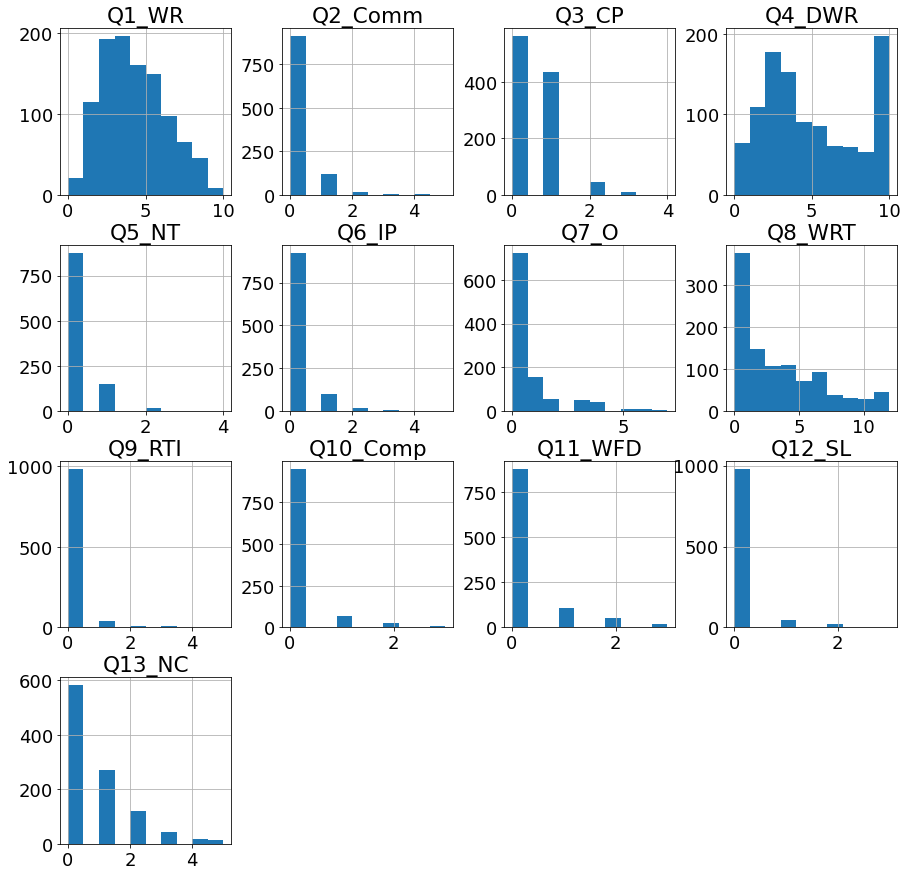

In [79]:
fig = plt.figure(figsize = (15,15))
ax = fig.gca()
ADAS.hist(column=ADAS_columns, ax=ax)
plt.savefig("./Results/Figures/Histograms/ADAS.svg", format='svg')
plt.show()

#### Control data

In [80]:
#filter table to show only tests results
ADAS_CN = ADAS_CN[ADAS_columns]
ADAS_CN.head()

,Q1_WR,Q2_Comm,Q3_CP,Q4_DWR,Q5_NT,Q6_IP,Q7_O,Q8_WRT,Q9_RTI,Q10_Comp,Q11_WFD,Q12_SL,Q13_NC
23,2.0,0.0,1.0,2.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0
25,4.0,0.0,0.0,3.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,1.0
27,1.0,0.0,0.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
29,2.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
30,5.0,0.0,0.0,6.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,1.0


In [81]:
#Control statistics
ADAS_CN.describe()

,Q1_WR,Q2_Comm,Q3_CP,Q4_DWR,Q5_NT,Q6_IP,Q7_O,Q8_WRT,Q9_RTI,Q10_Comp,Q11_WFD,Q12_SL,Q13_NC
count,659.000000,659.000000,659.000000,659.000000,659.000000,659.000000,659.000000,659.000000,659.000000,659.000000,659.000000,659.000000,659.000000
mean,2.843141,0.080425,0.405159,2.725341,0.056146,0.057663,0.118361,1.834598,0.010622,0.013657,0.057663,0.018209,0.376328
std,1.313922,0.350288,0.555194,1.866065,0.236883,0.252070,0.363134,1.802131,0.116468,0.116151,0.275131,0.154868,0.646090
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,3.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,4.000000,0.000000,1.000000,4.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,9.000000,5.000000,3.000000,10.000000,2.000000,2.000000,3.000000,12.000000,2.000000,1.000000,3.000000,2.000000,5.000000


#### Fit the scaler with the controls data

In [82]:
scaler = StandardScaler()
scaler.fit(ADAS_CN)

StandardScaler()

#### Transform data

In [83]:
ADAS_DX = pd.merge(ADAS,ADNIMERGE,on='RID')

X_ADAS = ADAS_DX[ADAS_columns] #tests scores
Y_ADAS = pd.DataFrame(ADAS_DX["DX_bl"]) #diagnosis

#scale data
X_ADAS = scaler.transform(X_ADAS)

#Convert into pandas dataframe
X_ADAS = pd.DataFrame(X_ADAS,columns=ADAS_columns)
X_ADAS.head()

,Q1_WR,Q2_Comm,Q3_CP,Q4_DWR,Q5_NT,Q6_IP,Q7_O,Q8_WRT,Q9_RTI,Q10_Comp,Q11_WFD,Q12_SL,Q13_NC
0,0.119473,-0.229771,1.072224,-0.388996,-0.237199,-0.228932,-0.326191,0.647171,-0.091272,-0.11767,-0.209743,-0.11767,-0.582912
1,0.881131,-0.229771,-0.730316,1.219886,-0.237199,-0.228932,5.185607,0.091851,-0.091272,-0.11767,-0.209743,-0.11767,0.966035
2,0.881131,2.627195,-0.730316,1.219886,3.987507,-0.228932,-0.326191,0.091851,-0.091272,-0.11767,-0.209743,-0.11767,2.514982
3,1.642789,-0.229771,1.072224,2.292474,-0.237199,-0.228932,2.429708,1.202491,-0.091272,-0.11767,-0.209743,-0.11767,2.514982
4,0.881131,-0.229771,1.072224,0.147298,-0.237199,-0.228932,-0.326191,-0.463469,-0.091272,-0.11767,-0.209743,-0.11767,-0.582912


#### Divide data by diagnostic group

In [84]:
#Get indexes of subjects belonging to each group
ADAS_indexes = {} #Create empty dictionary
dx_groups = ["CN","MCI", "AD"] #diagnostic groups list

Y_ADAS = Y_ADAS.replace({'EMCI':'MCI', 'LMCI':'MCI',"SMC":"CN"})

for dx in dx_groups:
    ADAS_indexes[dx] = Y_ADAS.index[Y_ADAS['DX_bl'] == dx].tolist()
    
#Filter results table by diagnostic group
X_ADAS_CN = X_ADAS.iloc[ADAS_indexes["CN"]]
X_ADAS_MCI = X_ADAS.iloc[ADAS_indexes["MCI"]]
X_ADAS_AD = X_ADAS.iloc[ADAS_indexes["AD"]]

print("Number of instances CN: ", X_ADAS_CN.shape[0])
print("Number of instances MCI: ", X_ADAS_MCI.shape[0])
print("Number of instances AD: ", X_ADAS_AD.shape[0])

Number of instances CN:  659
Number of instances MCI:  161
Number of instances AD:  219


#### Plot mean z-scores by domain

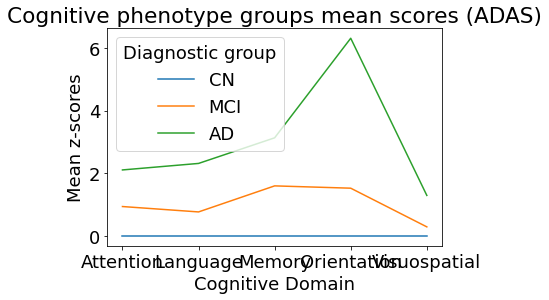

In [85]:
import warnings
warnings.filterwarnings('ignore')
#Compute zscores means for each cognitive domain by diagnostic group
ADAS_means_CN = zscores_means(X_ADAS_CN, "CN", metadata_path)
ADAS_means_MCI = zscores_means(X_ADAS_MCI, "MCI", metadata_path)
ADAS_means_AD = zscores_means(X_ADAS_AD, "AD", metadata_path)

#Concanetate all dataframes
ADAS_means_df = pd.concat([ADAS_means_CN, ADAS_means_MCI, ADAS_means_AD])
ADAS_means_df.index = range(len(ADAS_means_df))

#plot dataframe
sns.lineplot(data=ADAS_means_df, x='Cognitive Domain', y='Mean', hue='Diagnostic')
plt.title("Cognitive phenotype groups mean scores (ADAS)")
plt.ylabel("Mean z-scores")
plt.legend(title="Diagnostic group")
plt.show()

#### z-score distribution

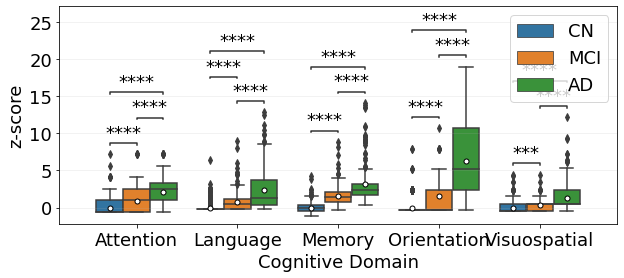

In [86]:
plot_zscore_distribution(X_ADAS, Y_ADAS, "./NC_Tests/ADAS_Metadata.csv", 'ADAS')

### 4.2. MMSE

In [87]:
#group variables by cognitive test
metadata_path = "./NC_Tests/MMSE_Metadata.csv"
MMSE_metadata = pd.read_csv(metadata_path, sep=";")
MMSE = group_by_test(MMSE_metadata, MMSE)
MMSE_columns = MMSE_metadata['Label'].unique()
#get test results for the controls
MMSE_CN = MMSE[MMSE.RID.isin(ADNIMERGE[ADNIMERGE["DX_bl"]=='CN'].RID)]
print("Number of controls: ", MMSE_CN.shape[0])

Number of controls:  523


#### Test scores distribution

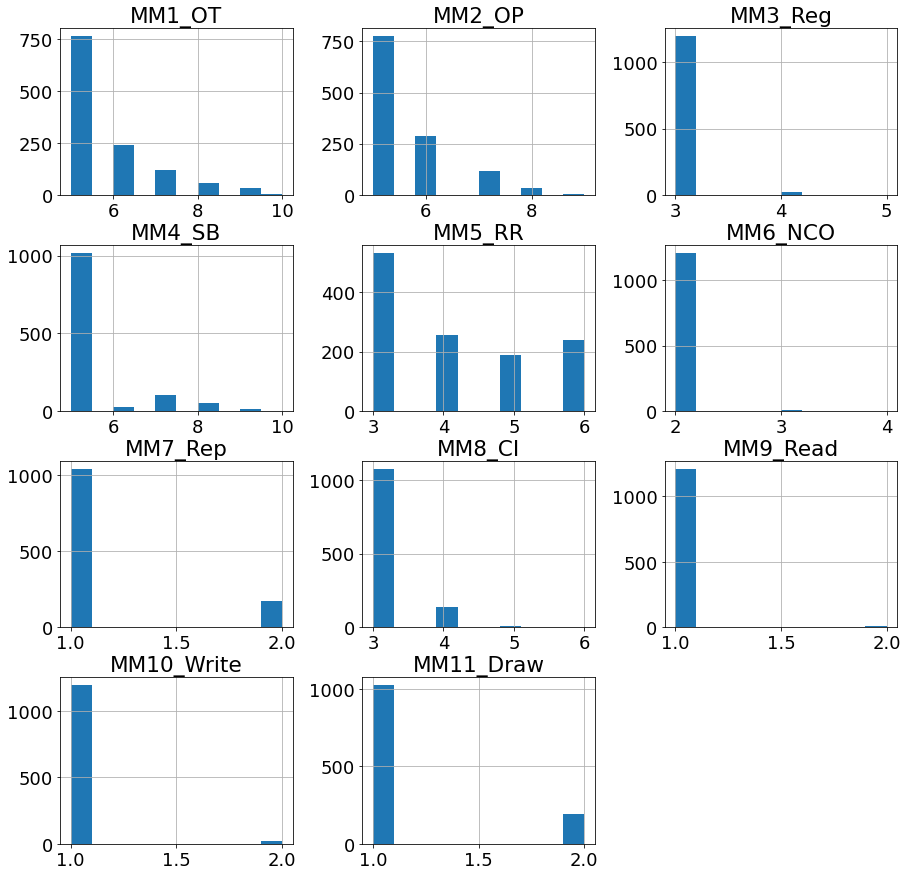

In [88]:
fig = plt.figure(figsize = (15,15))
ax = fig.gca()
MMSE.hist(column=MMSE_columns, ax=ax)
plt.savefig("./Results/Figures/Histograms/MMSE.svg", format='svg')
plt.show()

#### Controls

In [89]:
#filter table to show only tests results
MMSE_CN = MMSE_CN[MMSE_columns]
MMSE_CN.head()

,MM1_OT,MM2_OP,MM3_Reg,MM4_SB,MM5_RR,MM6_NCO,MM7_Rep,MM8_CI,MM9_Read,MM10_Write,MM11_Draw
0,5.0,5.0,3.0,5.0,5.0,2.0,1.0,3.0,1.0,1.0,1.0
2,5.0,5.0,3.0,5.0,3.0,2.0,1.0,4.0,1.0,1.0,1.0
4,5.0,5.0,3.0,5.0,5.0,2.0,1.0,3.0,1.0,1.0,1.0
5,5.0,5.0,3.0,5.0,4.0,2.0,1.0,3.0,1.0,1.0,1.0
6,6.0,5.0,3.0,5.0,4.0,2.0,1.0,3.0,1.0,1.0,1.0


In [90]:
#Control summary statistics
MMSE_CN.describe()

,MM1_OT,MM2_OP,MM3_Reg,MM4_SB,MM5_RR,MM6_NCO,MM7_Rep,MM8_CI,MM9_Read,MM10_Write,MM11_Draw
count,523.000000,523.000000,523.000000,523.000000,523.000000,523.000000,523.000000,523.000000,523.000000,523.000000,523.000000
mean,5.105163,5.139579,3.003824,5.164436,3.284895,2.001912,1.093690,3.068834,1.001912,1.005736,1.068834
std,0.313233,0.363072,0.061780,0.586989,0.537039,0.043727,0.291676,0.260864,0.043727,0.075592,0.253413
min,5.000000,5.000000,3.000000,5.000000,3.000000,2.000000,1.000000,3.000000,1.000000,1.000000,1.000000
25%,5.000000,5.000000,3.000000,5.000000,3.000000,2.000000,1.000000,3.000000,1.000000,1.000000,1.000000
50%,5.000000,5.000000,3.000000,5.000000,3.000000,2.000000,1.000000,3.000000,1.000000,1.000000,1.000000
75%,5.000000,5.000000,3.000000,5.000000,3.000000,2.000000,1.000000,3.000000,1.000000,1.000000,1.000000
max,7.000000,7.000000,4.000000,9.000000,6.000000,3.000000,2.000000,5.000000,2.000000,2.000000,2.000000


#### Fit the scaler with the controls data

In [91]:
scaler = StandardScaler()

scaler.fit(MMSE_CN)

StandardScaler()

#### Transform data

In [92]:
MMSE_DX = pd.merge(MMSE,ADNIMERGE,on='RID')

X_MMSE = MMSE_DX[MMSE_columns] #tests scores
Y_MMSE = pd.DataFrame(MMSE_DX["DX_bl"]) #diagnosis

#scale data
X_MMSE = scaler.transform(X_MMSE)


#Convert into pandas dataframe
X_MMSE = pd.DataFrame(X_MMSE,columns=MMSE_columns)
X_MMSE.head()

,MM1_OT,MM2_OP,MM3_Reg,MM4_SB,MM5_RR,MM6_NCO,MM7_Rep,MM8_CI,MM9_Read,MM10_Write,MM11_Draw
0,-0.336054,-0.384808,-0.061958,-0.280403,3.196688,-0.043769,-0.321521,-0.264121,-0.043769,-0.075955,-0.271886
1,12.446209,2.372104,-0.061958,3.130076,5.060532,-0.043769,-0.321521,-0.264121,-0.043769,-0.075955,-0.271886
2,-0.336054,-0.384808,-0.061958,-0.280403,-0.530999,-0.043769,-0.321521,3.572971,-0.043769,-0.075955,-0.271886
3,6.055078,2.372104,-0.061958,4.835315,5.060532,-0.043769,-0.321521,-0.264121,-0.043769,-0.075955,3.678013
4,-0.336054,-0.384808,-0.061958,-0.280403,3.196688,-0.043769,-0.321521,-0.264121,-0.043769,-0.075955,-0.271886


#### Divide data by diagnostic group

In [93]:
#Get indexes of subjects belonging to each group
MMSE_indexes = {} #Create empty dictionary
dx_groups = ["CN","MCI", "AD"] #diagnostic groups list

Y_MMSE = Y_MMSE.replace({'EMCI':'MCI', 'LMCI':'MCI',"SMC":"CN"})

for dx in dx_groups:
    MMSE_indexes[dx] = Y_MMSE.index[Y_MMSE['DX_bl'] == dx].tolist()
    
#Filter results table by diagnostic group
X_MMSE_CN = X_MMSE.iloc[MMSE_indexes["CN"]]
X_MMSE_MCI = X_MMSE.iloc[MMSE_indexes["MCI"]]
X_MMSE_AD = X_MMSE.iloc[MMSE_indexes["AD"]]

print("Number of instances CN: ", X_MMSE_CN.shape[0])
print("Number of instances MCI: ", X_MMSE_MCI.shape[0])
print("Number of instances AD: ", X_MMSE_AD.shape[0])

Number of instances CN:  523
Number of instances MCI:  356
Number of instances AD:  339


#### Plot z-scores by domain

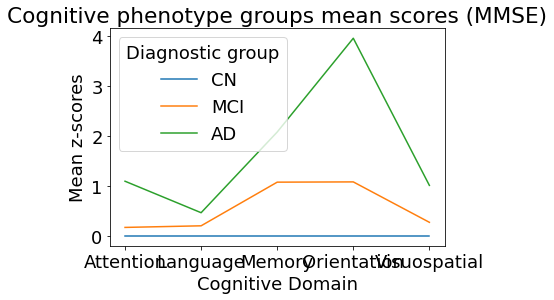

In [94]:
MMSE_means_CN = zscores_means(X_MMSE_CN, "CN", metadata_path)
MMSE_means_MCI = zscores_means(X_MMSE_MCI, "MCI", metadata_path)
MMSE_means_AD = zscores_means(X_MMSE_AD, "AD", metadata_path)

#Concanetate all dataframes
MMSE_means_df = pd.concat([MMSE_means_CN, MMSE_means_MCI, MMSE_means_AD])
MMSE_means_df.index = range(len(MMSE_means_df))

#plot dataframe
sns.lineplot(data=MMSE_means_df, x='Cognitive Domain', y='Mean', hue='Diagnostic')
plt.title("Cognitive phenotype groups mean scores (MMSE)")
plt.ylabel("Mean z-scores")
plt.legend(title="Diagnostic group")
plt.show()

#### z-score distribution

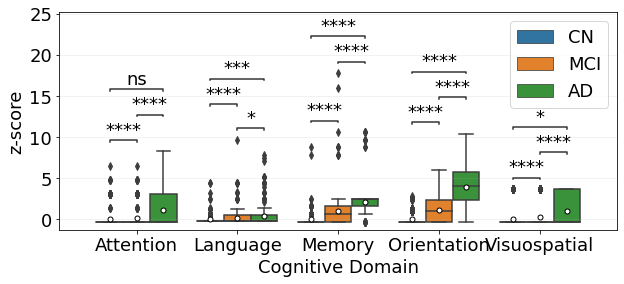

In [95]:
plot_zscore_distribution(X_MMSE, Y_MMSE, "./NC_Tests/MMSE_Metadata.csv", 'MMSE')

### 4.3. MOCA

In [96]:
#group variables by cognitive test
metadata_path = "./NC_Tests/MOCA_Metadata.csv"
MOCA_metadata = pd.read_csv(metadata_path, sep=";")
MOCA = group_by_test(MOCA_metadata, MOCA)
MOCA_columns = MOCA_metadata['Label'].unique()
#get test results for the controls
MOCA_CN = MOCA[MOCA.RID.isin(ADNIMERGE[ADNIMERGE["DX_bl"]=='CN'].RID)]
print("Number of controls: ", MOCA_CN.shape[0])

Number of controls:  645


#### Test scores distribution

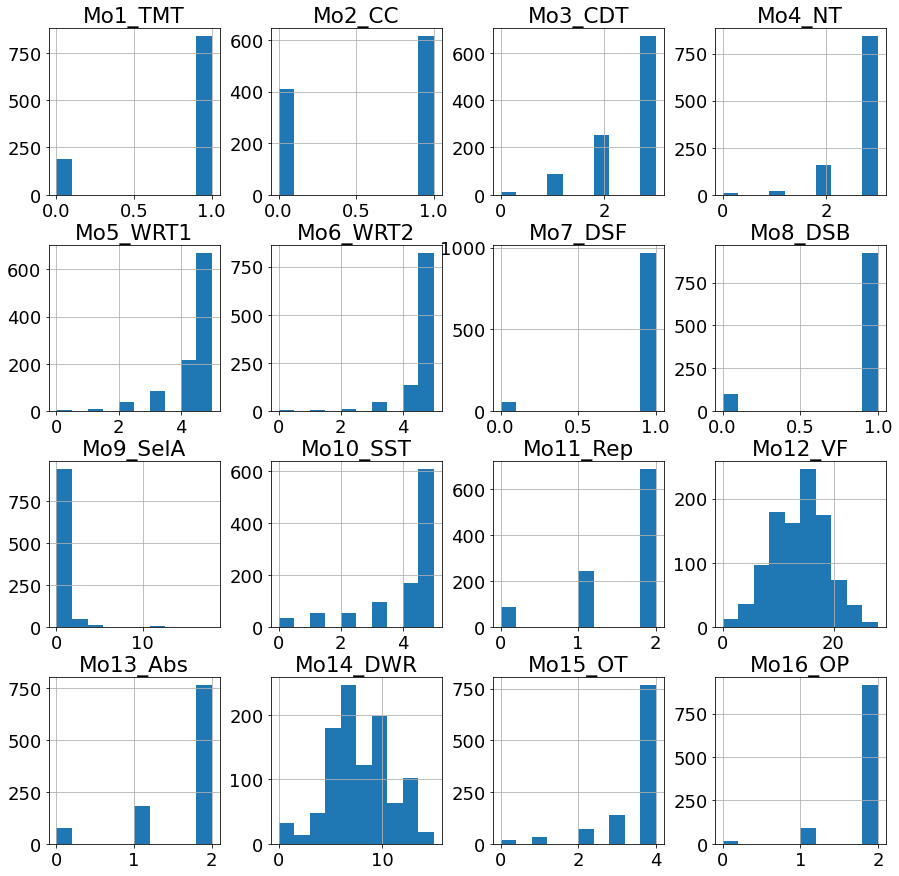

In [97]:
fig = plt.figure(figsize = (15,15))
ax = fig.gca()
MOCA.hist(column=MOCA_columns, ax=ax)
plt.savefig("./Results/Figures/Histograms/MOCA.svg", format='svg')
plt.show()

#### Controls

In [98]:
#filter table to show only tests results
MOCA_CN = MOCA_CN[MOCA_columns]
MOCA_CN.head()

,Mo1_TMT,Mo2_CC,Mo3_CDT,Mo4_NT,Mo5_WRT1,Mo6_WRT2,Mo7_DSF,Mo8_DSB,Mo9_SelA,Mo10_SST,Mo11_Rep,Mo12_VF,Mo13_Abs,Mo14_DWR,Mo15_OT,Mo16_OP
23,1.0,0.0,2.0,2.0,4.0,5.0,1.0,1.0,0.0,2.0,2.0,17.0,1.0,5.0,4.0,2.0
25,1.0,1.0,3.0,3.0,5.0,5.0,1.0,0.0,0.0,5.0,2.0,15.0,2.0,14.0,4.0,2.0
27,1.0,1.0,3.0,3.0,5.0,5.0,1.0,1.0,0.0,5.0,2.0,22.0,2.0,11.0,4.0,2.0
29,1.0,1.0,3.0,3.0,5.0,5.0,1.0,1.0,0.0,5.0,1.0,20.0,2.0,5.0,4.0,2.0
30,1.0,1.0,3.0,3.0,4.0,4.0,0.0,1.0,0.0,5.0,2.0,13.0,2.0,15.0,4.0,2.0


In [99]:
#Control summary statistics
MOCA_CN.describe()

,Mo1_TMT,Mo2_CC,Mo3_CDT,Mo4_NT,Mo5_WRT1,Mo6_WRT2,Mo7_DSF,Mo8_DSB,Mo9_SelA,Mo10_SST,Mo11_Rep,Mo12_VF,Mo13_Abs,Mo14_DWR,Mo15_OT,Mo16_OP
count,645.000000,645.000000,645.000000,645.000000,645.000000,645.000000,645.000000,645.000000,645.000000,645.000000,645.000000,645.000000,645.000000,645.000000,645.000000,645.000000
mean,0.919380,0.699225,2.756589,2.903876,4.710078,4.899225,0.961240,0.950388,0.262016,4.531783,1.731783,14.631008,1.851163,7.593798,3.941085,1.978295
std,0.272462,0.458951,0.480658,0.310380,0.603798,0.382963,0.193172,0.217311,0.928098,0.905983,0.514689,4.662554,0.405152,2.594660,0.235648,0.145833
min,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,3.000000,1.000000
25%,1.000000,0.000000,3.000000,3.000000,5.000000,5.000000,1.000000,1.000000,0.000000,4.000000,2.000000,12.000000,2.000000,5.000000,4.000000,2.000000
50%,1.000000,1.000000,3.000000,3.000000,5.000000,5.000000,1.000000,1.000000,0.000000,5.000000,2.000000,15.000000,2.000000,7.000000,4.000000,2.000000
75%,1.000000,1.000000,3.000000,3.000000,5.000000,5.000000,1.000000,1.000000,0.000000,5.000000,2.000000,18.000000,2.000000,9.000000,4.000000,2.000000
max,1.000000,1.000000,3.000000,3.000000,5.000000,5.000000,1.000000,1.000000,15.000000,5.000000,2.000000,28.000000,2.000000,15.000000,4.000000,2.000000


#### Fit the scaler with the controls data

In [100]:
scaler = StandardScaler()

scaler.fit(MOCA_CN)

StandardScaler()

#### Transform data

In [101]:
MOCA_DX = pd.merge(MOCA,ADNIMERGE,on='RID')

X_MOCA = MOCA_DX[MOCA_columns] #tests scores
Y_MOCA = pd.DataFrame(MOCA_DX["DX_bl"]) #diagnosis

#scale data
X_MOCA = scaler.transform(X_MOCA)

#Convert into pandas dataframe
X_MOCA = pd.DataFrame(X_MOCA,columns=MOCA_columns)
X_MOCA.head()

,Mo1_TMT,Mo2_CC,Mo3_CDT,Mo4_NT,Mo5_WRT1,Mo6_WRT2,Mo7_DSF,Mo8_DSB,Mo9_SelA,Mo10_SST,Mo11_Rep,Mo12_VF,Mo13_Abs,Mo14_DWR,Mo15_OT,Mo16_OP
0,0.296124,-1.524711,0.506805,0.309938,0.480537,0.263350,0.200805,0.228478,0.795775,0.517207,0.521529,1.152407,-2.102476,-1.000444,0.250206,0.148953
1,-3.376958,0.655862,0.506805,0.309938,0.480537,0.263350,0.200805,0.228478,-0.282534,-1.692054,0.521529,-0.564723,0.367646,-2.928974,0.250206,0.148953
2,0.296124,0.655862,0.506805,0.309938,0.480537,0.263350,0.200805,0.228478,-0.282534,0.517207,0.521529,1.796330,0.367646,0.928087,0.250206,0.148953
3,0.296124,-1.524711,0.506805,0.309938,0.480537,-2.349893,0.200805,-4.376785,-0.282534,0.517207,-1.422901,-1.637929,-2.102476,0.156674,-3.996709,0.148953
4,0.296124,-1.524711,0.506805,0.309938,0.480537,0.263350,0.200805,0.228478,0.795775,0.517207,0.521529,1.367048,-4.572599,-1.000444,0.250206,0.148953


#### Plot z-scores by domain

#### Divide data by diagnostic group

In [102]:
#Get indexes of subjects belonging to each group
MOCA_indexes = {} #Create empty dictionary
dx_groups = ["CN","MCI", "AD"] #diagnostic groups list

Y_MOCA = Y_MOCA.replace({'EMCI':'MCI', 'LMCI':'MCI',"SMC":"CN"})

for dx in dx_groups:
    MOCA_indexes[dx] = Y_MOCA.index[Y_MOCA['DX_bl'] == dx].tolist()
    
#Filter results table by diagnostic group
X_MOCA_CN = X_MOCA.iloc[MOCA_indexes["CN"]]
X_MOCA_MCI = X_MOCA.iloc[MOCA_indexes["MCI"]]
X_MOCA_AD = X_MOCA.iloc[MOCA_indexes["AD"]]

print("Number of instances CN: ", X_MOCA_CN.shape[0])
print("Number of instances MCI: ", X_MOCA_MCI.shape[0])
print("Number of instances AD: ", X_MOCA_AD.shape[0])

Number of instances CN:  645
Number of instances MCI:  158
Number of instances AD:  212


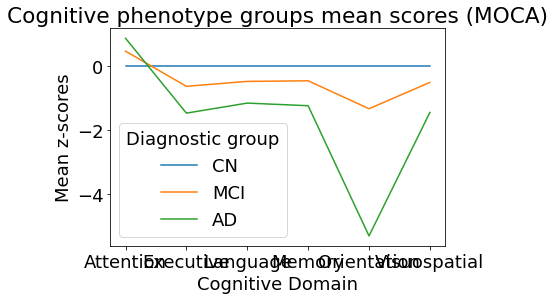

In [103]:
#Compute zscores means for each cognitive domain by diagnostic group
MOCA_means_CN = zscores_means(X_MOCA_CN, "CN", metadata_path)
MOCA_means_MCI = zscores_means(X_MOCA_MCI, "MCI", metadata_path)
MOCA_means_AD = zscores_means(X_MOCA_AD, "AD", metadata_path)

#Concanetate all dataframes
MOCA_means_df = pd.concat([MOCA_means_CN, MOCA_means_MCI, MOCA_means_AD])
MOCA_means_df.index = range(len(MOCA_means_df))

#plot dataframe
sns.lineplot(data=MOCA_means_df, x='Cognitive Domain', y='Mean', hue='Diagnostic')
plt.title("Cognitive phenotype groups mean scores (MOCA)")
plt.ylabel("Mean z-scores")
plt.legend(title="Diagnostic group")
plt.show()

#### z-score distribution

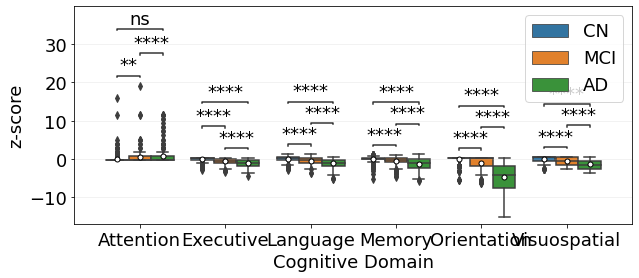

In [104]:
plot_zscore_distribution(X_MOCA, Y_MOCA, "./NC_Tests/MOCA_Metadata.csv", 'MOCA')

### 4.4. Merged data

In [105]:
#group variables by cognitive test
metadata_path = "./NC_Tests/merged_Metadata.csv"
merged_metadata = pd.read_csv(metadata_path, sep=";")
merged = group_by_test(merged_metadata, df)
merged_columns = merged_metadata['Label'].unique()
#get test results for the controls
merged_CN = merged[merged.RID.isin(ADNIMERGE[ADNIMERGE["DX_bl"]=='CN'].RID)]
print("Number of controls: ", merged_CN.shape[0])

Number of controls:  288


#### Test scores distribution

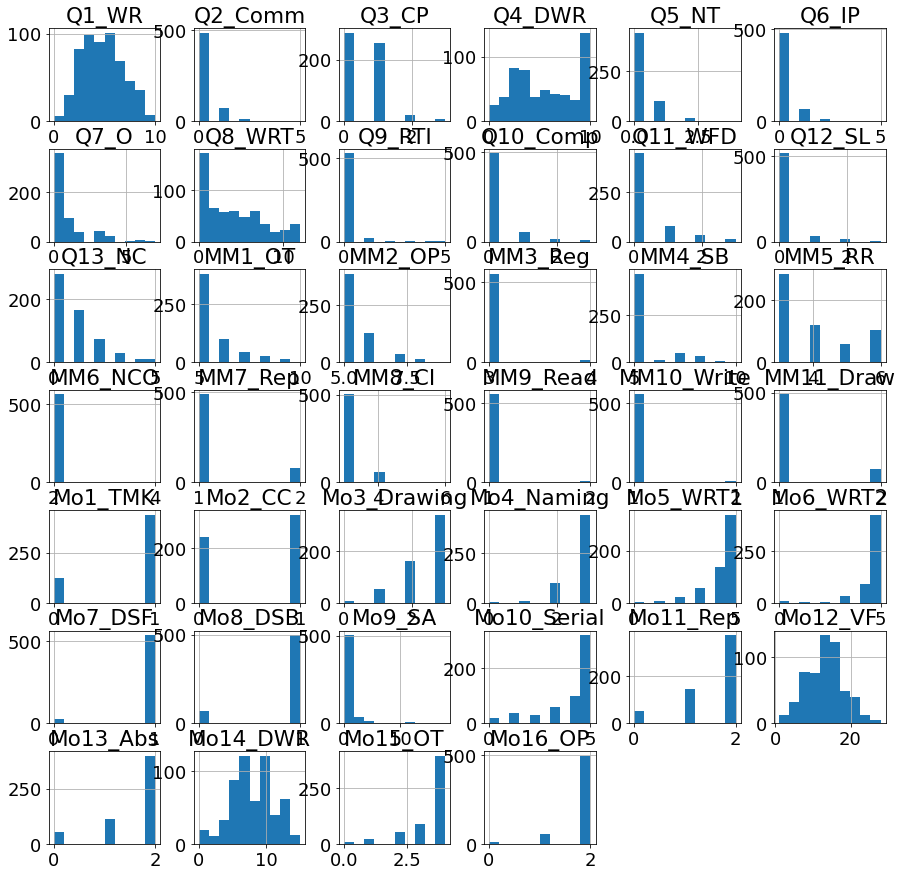

In [106]:
fig = plt.figure(figsize = (15,15))
ax = fig.gca()
merged.hist(column=merged_columns, ax=ax)
plt.savefig("./Results/Figures/Histograms/merged.svg", format='svg')
plt.show()

#### Controls

In [107]:
#filter table to show only tests results
merged_CN = merged_CN[merged_columns]
merged_CN.head()

,Q1_WR,Q2_Comm,Q3_CP,Q4_DWR,Q5_NT,Q6_IP,Q7_O,Q8_WRT,Q9_RTI,Q10_Comp,Q11_WFD,Q12_SL,Q13_NC,MM1_OT,MM2_OP,MM3_Reg,MM4_SB,MM5_RR,MM6_NCO,MM7_Rep,MM8_CI,MM9_Read,MM10_Write,MM11_Draw,Mo1_TMK,Mo2_CC,Mo3_Drawing,Mo4_Naming,Mo5_WRT1,Mo6_WRT2,Mo7_DSF,Mo8_DSB,Mo9_SA,Mo10_Serial,Mo11_Rep,Mo12_VF,Mo13_Abs,Mo14_DWR,Mo15_OT,Mo16_OP
21,2.0,0.0,1.0,2.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,5.0,5.0,3.0,5.0,3.0,2.0,1.0,4.0,1.0,1.0,1.0,1.0,0.0,2.0,2.0,4.0,5.0,1.0,1.0,0.0,2.0,2.0,17.0,1.0,5.0,4.0,2.0
23,4.0,0.0,0.0,3.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,1.0,5.0,5.0,3.0,5.0,3.0,2.0,1.0,3.0,1.0,1.0,1.0,1.0,1.0,3.0,3.0,5.0,5.0,1.0,0.0,0.0,5.0,2.0,15.0,2.0,14.0,4.0,2.0
25,1.0,0.0,0.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,5.0,5.0,3.0,5.0,4.0,2.0,1.0,3.0,1.0,1.0,1.0,1.0,1.0,3.0,3.0,5.0,5.0,1.0,1.0,0.0,5.0,2.0,22.0,2.0,11.0,4.0,2.0
27,2.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,5.0,3.0,5.0,3.0,2.0,1.0,3.0,1.0,1.0,1.0,1.0,1.0,3.0,3.0,5.0,5.0,1.0,1.0,0.0,5.0,1.0,20.0,2.0,5.0,4.0,2.0
28,5.0,0.0,0.0,6.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,1.0,5.0,6.0,3.0,5.0,3.0,2.0,1.0,3.0,1.0,1.0,1.0,1.0,1.0,3.0,3.0,4.0,4.0,0.0,1.0,0.0,5.0,2.0,13.0,2.0,15.0,4.0,2.0


#### Fit the scaler with the controls data

In [108]:
scaler = StandardScaler()

scaler.fit(merged_CN)

StandardScaler()

#### Transform data

In [109]:
merged_DX = pd.merge(merged,ADNIMERGE,on='RID')

X_merged = merged_DX[merged_columns] #tests scores
Y_merged = pd.DataFrame(merged_DX["DX_bl"]) #diagnosis

#scale data
X_merged = scaler.transform(X_merged)

#Convert into pandas dataframe
X_merged = pd.DataFrame(X_merged,columns=merged_columns)
X_merged.head()

,Q1_WR,Q2_Comm,Q3_CP,Q4_DWR,Q5_NT,Q6_IP,Q7_O,Q8_WRT,Q9_RTI,Q10_Comp,Q11_WFD,Q12_SL,Q13_NC,MM1_OT,MM2_OP,MM3_Reg,MM4_SB,MM5_RR,MM6_NCO,MM7_Rep,MM8_CI,MM9_Read,MM10_Write,MM11_Draw,Mo1_TMK,Mo2_CC,Mo3_Drawing,Mo4_Naming,Mo5_WRT1,Mo6_WRT2,Mo7_DSF,Mo8_DSB,Mo9_SA,Mo10_Serial,Mo11_Rep,Mo12_VF,Mo13_Abs,Mo14_DWR,Mo15_OT,Mo16_OP
0,0.041950,-0.225097,1.164499,-0.464113,-0.265767,-0.247841,-0.333976,0.628683,-0.112056,-0.13292,-0.256585,-0.159475,-0.630412,-0.353553,-0.409311,0.0,-0.306971,-0.505977,-0.059028,-0.347308,3.764252,-0.059028,-0.059028,-0.250461,0.321634,-1.48324,0.554028,0.334618,0.524984,0.280892,0.179605,0.258199,0.794651,0.501982,0.524994,1.227844,-1.909154,-1.037051,0.217423,0.118678
1,0.797047,-0.225097,-0.730279,1.114602,-0.265767,-0.247841,5.323970,0.064631,-0.112056,-0.13292,-0.256585,-0.159475,0.908221,-0.353553,-0.409311,0.0,-0.306971,3.278994,-0.059028,-0.347308,3.764252,-0.059028,-0.059028,-0.250461,-3.109126,0.67420,0.554028,0.334618,0.524984,0.280892,0.179605,0.258199,-0.321737,-1.848764,0.524994,-0.542464,0.372325,-2.873895,0.217423,0.118678
2,0.797047,-0.225097,1.164499,0.062125,-0.265767,-0.247841,-0.333976,-0.499421,-0.112056,-0.13292,-0.256585,-0.159475,-0.630412,-0.353553,-0.409311,0.0,-0.306971,-0.505977,-0.059028,-0.347308,-0.236134,-0.059028,-0.059028,-0.250461,0.321634,0.67420,0.554028,0.334618,0.524984,0.280892,0.179605,0.258199,-0.321737,0.501982,0.524994,1.891709,0.372325,0.799792,0.217423,0.118678
3,0.797047,-0.225097,1.164499,0.062125,-0.265767,-0.247841,-0.333976,0.064631,-0.112056,-0.13292,-0.256585,-0.159475,0.908221,-0.353553,-0.409311,0.0,-0.306971,-0.505977,-0.059028,-0.347308,-0.236134,-0.059028,-0.059028,-0.250461,0.321634,-1.48324,0.554028,0.334618,0.524984,-1.905511,0.179605,-3.872983,-0.321737,0.501982,-1.518227,-1.648907,-1.909154,0.065055,-4.599331,0.118678
4,2.307241,2.368024,-0.730279,2.167079,-0.265767,-0.247841,-0.333976,2.320841,-0.112056,-0.13292,-0.256585,-0.159475,-0.630412,-0.353553,-0.409311,0.0,-0.306971,-0.505977,-0.059028,-0.347308,-0.236134,-0.059028,-0.059028,3.992640,0.321634,-1.48324,0.554028,0.334618,0.524984,0.280892,0.179605,0.258199,0.794651,0.501982,0.524994,1.449132,-4.190633,-1.037051,0.217423,0.118678


#### Divide data by diagnostic group

In [110]:
#Get indexes of subjects belonging to each group
merged_indexes = {} #Create empty dictionary
dx_groups = ["CN","MCI", "AD"] #diagnostic groups list

Y_merged = Y_merged.replace({'EMCI':'MCI', 'LMCI':'MCI',"SMC":"CN"})

for dx in dx_groups:
    merged_indexes[dx] = Y_merged.index[Y_merged['DX_bl'] == dx].tolist()
    
#Filter results table by diagnostic group
X_merged_CN = X_merged.iloc[merged_indexes["CN"]]
X_merged_MCI = X_merged.iloc[merged_indexes["MCI"]]
X_merged_AD = X_merged.iloc[merged_indexes["AD"]]

print("Number of instances CN: ", X_merged_CN.shape[0])
print("Number of instances MCI: ", X_merged_MCI.shape[0])
print("Number of instances AD: ", X_merged_AD.shape[0])

Number of instances CN:  288
Number of instances MCI:  135
Number of instances AD:  142


#### Plot z-scores by domain

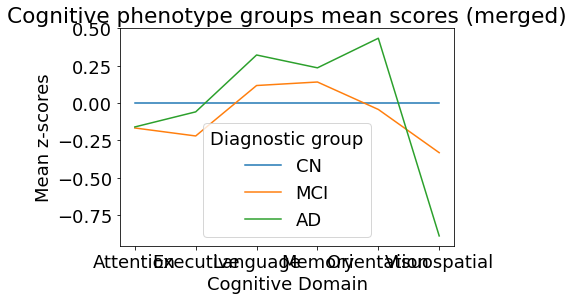

In [111]:
#Compute zscores means for each cognitive domain by diagnostic group
merged_means_CN = zscores_means(X_merged_CN, "CN", metadata_path)
merged_means_MCI = zscores_means(X_merged_MCI, "MCI", metadata_path)
merged_means_AD = zscores_means(X_merged_AD, "AD", metadata_path)

#Concanetate all dataframes
merged_means_df = pd.concat([merged_means_CN, merged_means_MCI, merged_means_AD])
merged_means_df.index = range(len(merged_means_df))

#plot dataframe
sns.lineplot(data=merged_means_df, x='Cognitive Domain', y='Mean', hue='Diagnostic')
plt.title("Cognitive phenotype groups mean scores (merged)")
plt.ylabel("Mean z-scores")
plt.legend(title="Diagnostic group")
plt.show()

#### z-score distribution

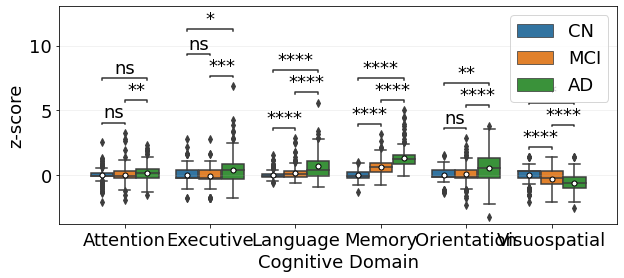

In [112]:
plot_zscore_distribution(X_merged, Y_merged, "./NC_Tests/merged_Metadata.csv", 'merged')

### 4.5. Merged data (ADAS and MoCA)

In [113]:
#group variables by cognitive test
metadata_path = "./NC_Tests/ADASMOCA_Metadata.csv"
ADASMOCA_metadata = pd.read_csv(metadata_path, sep=";")
ADASMOCA = group_by_test(ADASMOCA_metadata, ADASMOCA)
ADASMOCA_columns = ADASMOCA_metadata['Label'].unique()
#get test results for the controls
ADASMOCA_CN = ADASMOCA[ADASMOCA.RID.isin(ADNIMERGE[ADNIMERGE["DX_bl"]=='CN'].RID)]
print("Number of controls: ", ADASMOCA_CN.shape[0])

Number of controls:  641


#### Test scores distribution

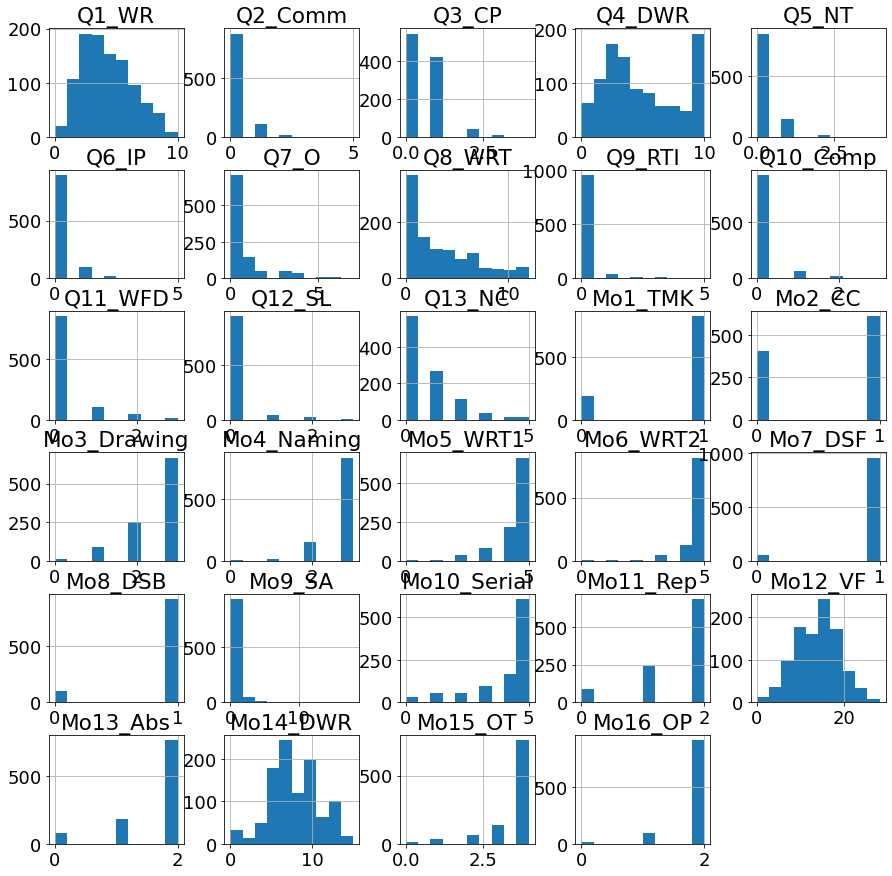

In [114]:
fig = plt.figure(figsize = (15,15))
ax = fig.gca()
ADASMOCA.hist(column=ADASMOCA_columns, ax=ax)
plt.savefig("./Results/Figures/Histograms/ADASMOCA.svg", format='svg')
plt.show()

#### Controls

In [115]:
#filter table to show only tests results
ADASMOCA_CN = ADASMOCA_CN[ADASMOCA_columns]
ADASMOCA_CN.head()

,Q1_WR,Q2_Comm,Q3_CP,Q4_DWR,Q5_NT,Q6_IP,Q7_O,Q8_WRT,Q9_RTI,Q10_Comp,Q11_WFD,Q12_SL,Q13_NC,Mo1_TMK,Mo2_CC,Mo3_Drawing,Mo4_Naming,Mo5_WRT1,Mo6_WRT2,Mo7_DSF,Mo8_DSB,Mo9_SA,Mo10_Serial,Mo11_Rep,Mo12_VF,Mo13_Abs,Mo14_DWR,Mo15_OT,Mo16_OP
21,2.0,0.0,1.0,2.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2.0,2.0,4.0,5.0,1.0,1.0,0.0,2.0,2.0,17.0,1.0,5.0,4.0,2.0
23,4.0,0.0,0.0,3.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,3.0,3.0,5.0,5.0,1.0,0.0,0.0,5.0,2.0,15.0,2.0,14.0,4.0,2.0
25,1.0,0.0,0.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,3.0,3.0,5.0,5.0,1.0,1.0,0.0,5.0,2.0,22.0,2.0,11.0,4.0,2.0
27,2.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,3.0,3.0,5.0,5.0,1.0,1.0,0.0,5.0,1.0,20.0,2.0,5.0,4.0,2.0
28,5.0,0.0,0.0,6.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,3.0,3.0,4.0,4.0,0.0,1.0,0.0,5.0,2.0,13.0,2.0,15.0,4.0,2.0


#### Fit the scaler with the controls data

In [116]:
scaler = StandardScaler()

scaler.fit(ADASMOCA_CN)

StandardScaler()

#### Transform data

In [117]:
ADASMOCA_DX = pd.merge(ADASMOCA,ADNIMERGE,on='RID')

X_ADASMOCA = ADASMOCA_DX[ADASMOCA_columns] #tests scores
Y_ADASMOCA = pd.DataFrame(ADASMOCA_DX["DX_bl"]) #diagnosis

#scale data
X_ADASMOCA = scaler.transform(X_ADASMOCA)

#Convert into pandas dataframe
X_ADASMOCA = pd.DataFrame(X_ADASMOCA,columns=ADASMOCA_columns)
X_ADASMOCA.head()

,Q1_WR,Q2_Comm,Q3_CP,Q4_DWR,Q5_NT,Q6_IP,Q7_O,Q8_WRT,Q9_RTI,Q10_Comp,Q11_WFD,Q12_SL,Q13_NC,Mo1_TMK,Mo2_CC,Mo3_Drawing,Mo4_Naming,Mo5_WRT1,Mo6_WRT2,Mo7_DSF,Mo8_DSB,Mo9_SA,Mo10_Serial,Mo11_Rep,Mo12_VF,Mo13_Abs,Mo14_DWR,Mo15_OT,Mo16_OP
0,0.115042,-0.223468,1.073423,-0.383318,-0.237058,-0.232295,-0.322784,0.643339,-0.092555,-0.11242,-0.205282,-0.119334,-0.583215,0.297128,-1.529229,0.504055,0.310997,0.480231,0.264228,0.197225,0.229227,0.791744,0.515162,0.516639,1.150012,-2.159844,-0.999040,0.251034,0.149427
1,0.874952,-0.223468,-0.732519,1.240295,-0.237058,-0.232295,5.194678,0.089064,-0.092555,-0.11242,-0.205282,-0.119334,0.967993,-3.365549,0.653924,0.504055,0.310997,0.480231,0.264228,0.197225,0.229227,-0.283484,-1.693660,0.516639,-0.563810,0.361941,-2.931403,0.251034,0.149427
2,0.874952,-0.223468,1.073423,0.157886,-0.237058,-0.232295,-0.322784,-0.465210,-0.092555,-0.11242,-0.205282,-0.119334,-0.583215,0.297128,0.653924,0.504055,0.310997,0.480231,0.264228,0.197225,0.229227,-0.283484,0.515162,0.516639,1.792695,0.361941,0.933322,0.251034,0.149427
3,0.874952,-0.223468,1.073423,0.157886,-0.237058,-0.232295,-0.322784,0.089064,-0.092555,-0.11242,-0.205282,-0.119334,0.967993,0.297128,-1.529229,0.504055,0.310997,0.480231,-2.341463,0.197225,-4.362482,-0.283484,0.515162,-1.431393,-1.634949,-2.159844,0.160377,-3.983519,0.149427
4,2.394772,2.641395,-0.732519,2.322703,-0.237058,-0.232295,-0.322784,2.306163,-0.092555,-0.11242,-0.205282,-0.119334,-0.583215,0.297128,-1.529229,0.504055,0.310997,0.480231,0.264228,0.197225,0.229227,0.791744,0.515162,0.516639,1.364240,-4.681630,-0.999040,0.251034,0.149427


#### Divide data by diagnostic group

In [118]:
#Get indexes of subjects belonging to each group
ADASMOCA_indexes = {} #Create empty dictionary
dx_groups = ["CN","MCI", "AD"] #diagnostic groups list

Y_ADASMOCA = Y_ADASMOCA.replace({'EMCI':'MCI', 'LMCI':'MCI',"SMC":"CN"})

for dx in dx_groups:
    ADASMOCA_indexes[dx] = Y_ADASMOCA.index[Y_ADASMOCA['DX_bl'] == dx].tolist()
    
#Filter results table by diagnostic group
X_ADASMOCA_CN = X_ADASMOCA.iloc[ADASMOCA_indexes["CN"]]
X_ADASMOCA_MCI = X_ADASMOCA.iloc[ADASMOCA_indexes["MCI"]]
X_ADASMOCA_AD = X_ADASMOCA.iloc[ADASMOCA_indexes["AD"]]

print("Number of instances CN: ", X_ADASMOCA_CN.shape[0])
print("Number of instances MCI: ", X_ADASMOCA_MCI.shape[0])
print("Number of instances AD: ", X_ADASMOCA_AD.shape[0])

Number of instances CN:  641
Number of instances MCI:  158
Number of instances AD:  208


#### Plot z-scores by domain

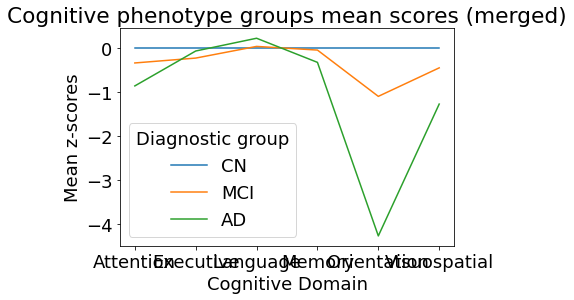

In [119]:
#Compute zscores means for each cognitive domain by diagnostic group
merged_means_CN = zscores_means(X_merged_CN, "CN", metadata_path)
merged_means_MCI = zscores_means(X_merged_MCI, "MCI", metadata_path)
merged_means_AD = zscores_means(X_merged_AD, "AD", metadata_path)

#Concanetate all dataframes
merged_means_df = pd.concat([merged_means_CN, merged_means_MCI, merged_means_AD])
merged_means_df.index = range(len(merged_means_df))

#plot dataframe
sns.lineplot(data=merged_means_df, x='Cognitive Domain', y='Mean', hue='Diagnostic')
plt.title("Cognitive phenotype groups mean scores (merged)")
plt.ylabel("Mean z-scores")
plt.legend(title="Diagnostic group")
plt.show()

#### z-score distribution

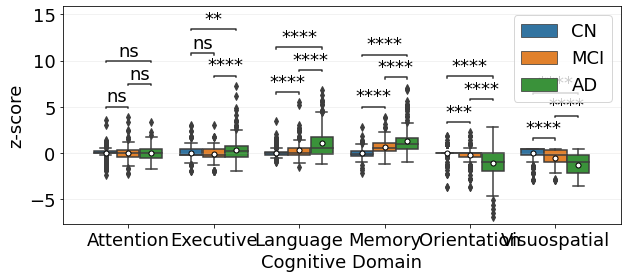

In [120]:
plot_zscore_distribution(X_ADASMOCA, Y_ADASMOCA, "./NC_Tests/ADASMOCA_Metadata.csv", 'ADASMOCA')

### 4.6. NEUROBAT

In [121]:
#group variables by cognitive test
metadata_path = "./NC_Tests/NEUROBAT_Metadata.csv"
NEUROBAT_metadata = pd.read_csv(metadata_path, sep=";")
NEUROBAT = group_by_test(NEUROBAT_metadata, NEUROBAT)
NEUROBAT_columns = NEUROBAT_metadata['Label'].unique()
#get test results for the controls
NEUROBAT_CN = NEUROBAT[NEUROBAT.RID.isin(ADNIMERGE[ADNIMERGE["DX_bl"]=='CN'].RID)]
print("Number of controls: ", NEUROBAT_CN.shape[0])

Number of controls:  229


#### Test scores distribution

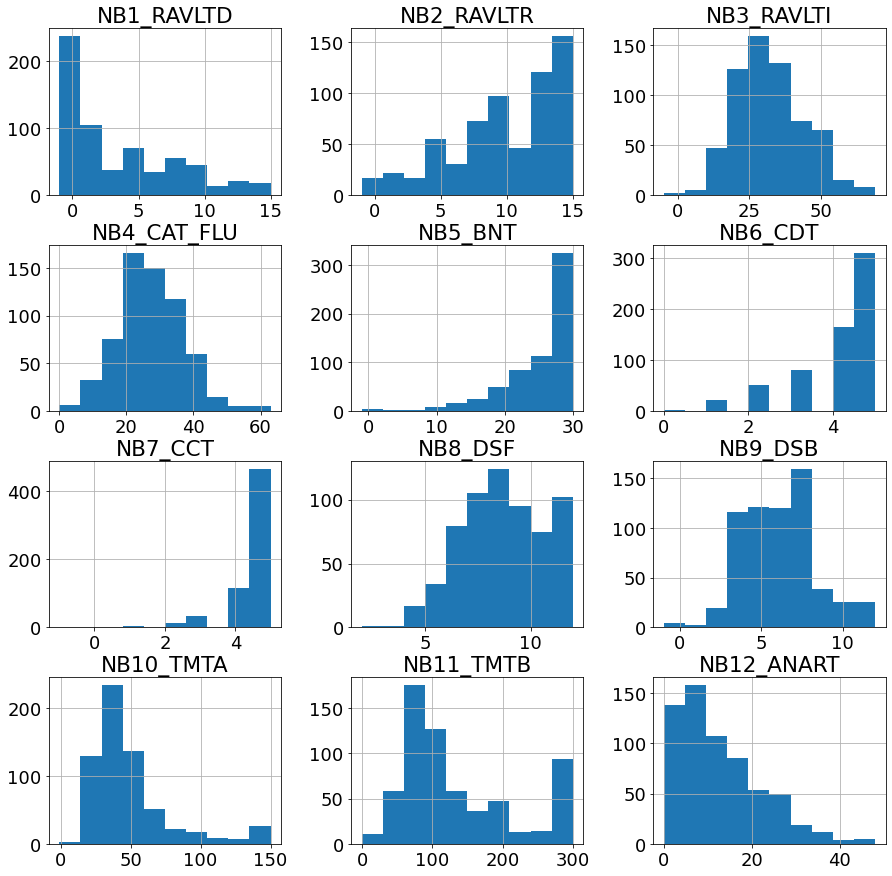

In [122]:
fig = plt.figure(figsize = (15,15))
ax = fig.gca()
NEUROBAT.hist(column=NEUROBAT_columns, ax=ax)
plt.savefig("./Results/Figures/Histograms/NEUROBAT.svg", format='svg')
plt.show()

#### Control data

In [123]:
#filter table to show only tests results
NEUROBAT_CN = NEUROBAT_CN[NEUROBAT_columns]
NEUROBAT_CN.head()

,NB1_RAVLTD,NB2_RAVLTR,NB3_RAVLTI,NB4_CAT_FLU,NB5_BNT,NB6_CDT,NB7_CCT,NB8_DSF,NB9_DSB,NB10_TMTA,NB11_TMTB,NB12_ANART
0,5.0,6.0,44.0,23.0,29.0,4.0,5.0,10.0,8.0,29.0,112.0,16.0
1,5.0,15.0,37.0,30.0,27.0,5.0,5.0,10.0,8.0,50.0,90.0,5.0
3,9.0,13.0,51.0,38.0,27.0,3.0,4.0,7.0,4.0,31.0,51.0,8.0
5,6.0,14.0,40.0,29.0,27.0,5.0,4.0,7.0,5.0,29.0,79.0,25.0
6,9.0,13.0,50.0,34.0,29.0,5.0,5.0,8.0,7.0,27.0,49.0,7.0


In [124]:
#Control statistics
NEUROBAT_CN.describe()

,NB1_RAVLTD,NB2_RAVLTR,NB3_RAVLTI,NB4_CAT_FLU,NB5_BNT,NB6_CDT,NB7_CCT,NB8_DSF,NB9_DSB,NB10_TMTA,NB11_TMTB,NB12_ANART
count,229.000000,229.000000,229.000000,229.000000,229.000000,229.000000,229.000000,229.000000,229.000000,229.000000,229.000000,229.000000
mean,7.388646,12.820961,42.982533,34.633188,27.296943,4.681223,4.838428,8.777293,7.213974,36.445415,89.213974,9.104803
std,3.724275,2.673505,9.818067,8.061493,3.247001,0.661369,0.573623,1.993016,2.164826,13.192330,44.255464,7.954775
min,-1.000000,-1.000000,-5.000000,17.000000,-1.000000,1.000000,-1.000000,4.000000,2.000000,17.000000,34.000000,0.000000
25%,5.000000,12.000000,37.000000,29.000000,26.000000,5.000000,5.000000,7.000000,6.000000,28.000000,61.000000,3.000000
50%,7.000000,14.000000,43.000000,34.000000,28.000000,5.000000,5.000000,9.000000,7.000000,33.000000,79.000000,7.000000
75%,10.000000,15.000000,50.000000,39.000000,29.000000,5.000000,5.000000,10.000000,9.000000,42.000000,100.000000,13.000000
max,15.000000,15.000000,69.000000,63.000000,30.000000,5.000000,5.000000,12.000000,12.000000,102.000000,300.000000,41.000000


#### Fit the scaler with the controls data

In [125]:
scaler = StandardScaler()
scaler.fit(NEUROBAT_CN)

StandardScaler()

#### Transform data

In [126]:
NEUROBAT_DX = pd.merge(NEUROBAT,ADNIMERGE,on='RID')

X_NEUROBAT = NEUROBAT_DX[NEUROBAT_columns] #tests scores
Y_NEUROBAT = pd.DataFrame(NEUROBAT_DX["DX_bl"]) #diagnosis

#scale data
X_NEUROBAT = scaler.transform(X_NEUROBAT)

#Convert into pandas dataframe
X_NEUROBAT = pd.DataFrame(X_NEUROBAT,columns=NEUROBAT_columns)
X_NEUROBAT.head()

,NB1_RAVLTD,NB2_RAVLTR,NB3_RAVLTI,NB4_CAT_FLU,NB5_BNT,NB6_CDT,NB7_CCT,NB8_DSF,NB9_DSB,NB10_TMTA,NB11_TMTB,NB12_ANART
0,-0.642777,-2.556907,0.103859,-1.446217,0.525650,-1.032275,0.282287,0.614840,0.363885,-0.565611,0.516003,0.868699
1,-0.642777,0.816835,-0.610674,-0.575990,-0.091652,0.483052,0.282287,0.614840,0.363885,1.029710,0.017800,-0.517148
2,-1.988261,-4.431208,-2.141816,-2.440763,-3.178163,-4.062930,-1.464838,0.614840,-1.024943,1.561484,1.331244,0.238768
3,0.433610,0.067115,0.818392,0.418556,-0.091652,-2.547603,-1.464838,-0.893714,-1.487886,-0.413675,-0.865378,-0.139190
4,-0.373680,0.441975,-0.304446,-0.700308,-0.091652,0.483052,-1.464838,-0.893714,-1.024943,-0.565611,-0.231301,2.002573


#### Divide data by diagnostic group

In [127]:
#Get indexes of subjects belonging to each group
NEUROBAT_indexes = {} #Create empty dictionary
dx_groups = ["CN","MCI", "AD"] #diagnostic groups list

Y_NEUROBAT = Y_NEUROBAT.replace({'EMCI':'MCI', 'LMCI':'MCI',"SMC":"CN"})

for dx in dx_groups:
    NEUROBAT_indexes[dx] = Y_NEUROBAT.index[Y_NEUROBAT['DX_bl'] == dx].tolist()
    
#Filter results table by diagnostic group
X_NEUROBAT_CN = X_NEUROBAT.iloc[NEUROBAT_indexes["CN"]]
X_NEUROBAT_MCI = X_NEUROBAT.iloc[NEUROBAT_indexes["MCI"]]
X_NEUROBAT_AD = X_NEUROBAT.iloc[NEUROBAT_indexes["AD"]]

print("Number of instances CN: ", X_NEUROBAT_CN.shape[0])
print("Number of instances MCI: ", X_NEUROBAT_MCI.shape[0])
print("Number of instances AD: ", X_NEUROBAT_AD.shape[0])

Number of instances CN:  229
Number of instances MCI:  219
Number of instances AD:  185


#### Plot mean z-scores by domain

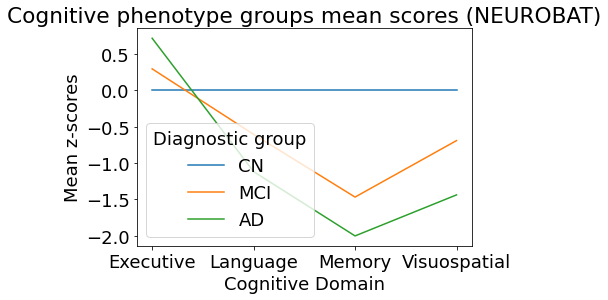

In [128]:
#Compute zscores means for each cognitive domain by diagnostic group
NEUROBAT_means_CN = zscores_means(X_NEUROBAT_CN, "CN", metadata_path)
NEUROBAT_means_MCI = zscores_means(X_NEUROBAT_MCI, "MCI", metadata_path)
NEUROBAT_means_AD = zscores_means(X_NEUROBAT_AD, "AD", metadata_path)

#Concanetate all dataframes
NEUROBAT_means_df = pd.concat([NEUROBAT_means_CN, NEUROBAT_means_MCI, NEUROBAT_means_AD])
NEUROBAT_means_df.index = range(len(NEUROBAT_means_df))

#plot dataframe
sns.lineplot(data=NEUROBAT_means_df, x='Cognitive Domain', y='Mean', hue='Diagnostic')
plt.title("Cognitive phenotype groups mean scores (NEUROBAT)")
plt.ylabel("Mean z-scores")
plt.legend(title="Diagnostic group")
plt.show()

#### z-score distribution

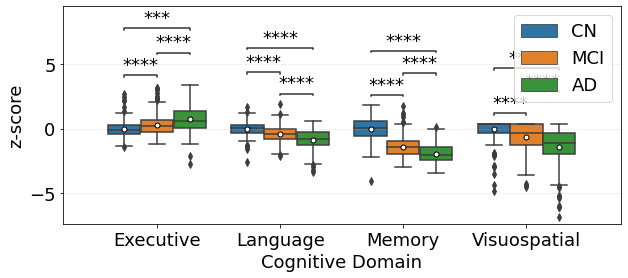

In [129]:
plot_zscore_distribution(X_NEUROBAT, Y_NEUROBAT, "./NC_Tests/NEUROBAT_Metadata.csv", 'NEUROBAT')

Currently higher values on TMTA (time) and TMTB (time) signify worse performance, whereas higher values on the majority of other variables signify better performance.

## 5. ADJACENCY MATRIX

Simple correlation (a.k.a. Pearson correlation coefficient) may not give a complete picture while trying to understand the relationship between two variables (A and B) especially when there exist other influencing variables that affect A (and/or) B.
In fact, simple correlation mainly focuses on finding the influence of each variable on the other.

Whereas **partial correlation** is used to find the refined relationship between two variables with the effect of the other influencing variables being excluded/controlled.

#### Import required packages

In [130]:
#!pip install pingouin

In [131]:
from pingouin import partial_corr

#### Create partial correlation function

In [132]:
def par_corr(data_df):
    """
    Compute partial pairwise correlation of columns. 
    When a pair of columns are picked, then all other columns are treated as control variables. 
    
    @param data_df DataFrame
    @return DataFrame, whose data is a symmetric matrix
    """ 
    
    n = data_df.shape[1] #total number of tests
    mat = np.empty((n, n)) #empty matrix to store results 
    np.fill_diagonal(mat, 1) #diagonal elements have correlation equal to 1.0
    count_neg = 0 #count negative correlations
    
    for i in range(n):
        for j in range(i + 1, n):
            #get columns names
            x = data_df.columns[i]
            y = data_df.columns[j]
            xy_colnames = [data_df.columns[index] for index in [i,j]]
            covar = [ var for var in data_df.columns if var not in xy_colnames]
            
            #partial correlation
            corr_df = partial_corr(data=data_df, x=x, y=y, covar=covar, method='spearman') #partial correlation stats
            p_value = corr_df.iloc[0]['p-val']
            corr = corr_df.iloc[0]['r'] #get partial correlation value
            #if p_value < 0.05:
            #    corr = corr_df.iloc[0]['r'] #get partial correlation value
            #else:
            #    corr = 0

            #store results
            mat[i, j] = corr
            mat[j, i] = corr
            
            if corr < -0.1:
                count_neg += 1
                #print(x, "-", y, ": ", round(corr,3))
                
    print("Total number of negative correlations: ", count_neg)
            
    return pd.DataFrame(mat, index=data_df.columns, columns=data_df.columns)

In [133]:
def plot_adjacency_mx(CN_mx, MCI_mx, AD_mx, battery_name):
    
    fig, axes = plt.subplots(1,3, figsize=(21,7))

    sns.heatmap(ax=axes[0],data=CN_mx, annot=False, cmap="Spectral_r", vmin=-1, vmax=1)
    sns.heatmap(ax=axes[1],data=MCI_mx, annot=False, cmap="Spectral_r", vmin=-1, vmax=1)
    sns.heatmap(ax=axes[2],data=AD_mx, annot=False, cmap="Spectral_r", vmin=-1, vmax=1)

    #add titles to subfigures
    #fig.suptitle('Adjacency matrixes (' + battery_name + ')')
    axes[0].title.set_text("Controls")
    axes[1].title.set_text("MCI")
    axes[2].title.set_text("AD")
    
    # Rotate xticks
    for ax in axes:
        ax.set_xticklabels(ax.get_xticklabels(), rotation=-45, ha='left')
    
    filename = "./Results/Figures/Matrix/matrix_" + battery_name + ".png"
    
    plt.savefig(filename, format="png")

    plt.show()

In [134]:
def high_corr_pairs(mx, threshold):
    """Function to find out which test pairs have a great correlation between them"""
    
    for i in range(mx.shape[0]):
        for j in range(i+1):
            if abs(mx.iloc[i,j]) > threshold and abs(mx.iloc[i,j]) != 1.0:
                print(mx.index[i], "-", mx.columns[j], ": ", mx.iloc[i,j])

### ADAS-Cog

#### Divide data by diagnostic group

In [135]:
#Get indexes of subjects belonging to each group
ADAS_indexes = {} #Create empty dictionary
dx_groups = ["CN","MCI", "AD"] #diagnostic groups list

Y_ADAS = Y_ADAS.replace({'EMCI':'MCI', 'LMCI':'MCI',"SMC":"CN"})

for dx in dx_groups:
    ADAS_indexes[dx] = Y_ADAS.index[Y_ADAS['DX_bl'] == dx].tolist()
    
#Filter results table by diagnostic group
X_ADAS_CN = X_ADAS.iloc[ADAS_indexes["CN"]]
X_ADAS_MCI = X_ADAS.iloc[ADAS_indexes["MCI"]]
X_ADAS_AD = X_ADAS.iloc[ADAS_indexes["AD"]]

print("Number of instances CN: ", X_ADAS_CN.shape[0])
print("Number of instances MCI: ", X_ADAS_MCI.shape[0])
print("Number of instances AD: ", X_ADAS_AD.shape[0])

Number of instances CN:  659
Number of instances MCI:  161
Number of instances AD:  219


#### Compute adjacency matrixes

In [136]:
print("CONTROLS---------------")
ADAS_CN_mx = par_corr(X_ADAS_CN)
print("MCI--------------------")
ADAS_MCI_mx = par_corr(X_ADAS_MCI)
print("AD---------------------")
ADAS_AD_mx = par_corr(X_ADAS_AD)

CONTROLS---------------
Total number of negative correlations:  0
MCI--------------------
Total number of negative correlations:  5
AD---------------------
Total number of negative correlations:  3


#### Plot correlation matrixes as heatmaps

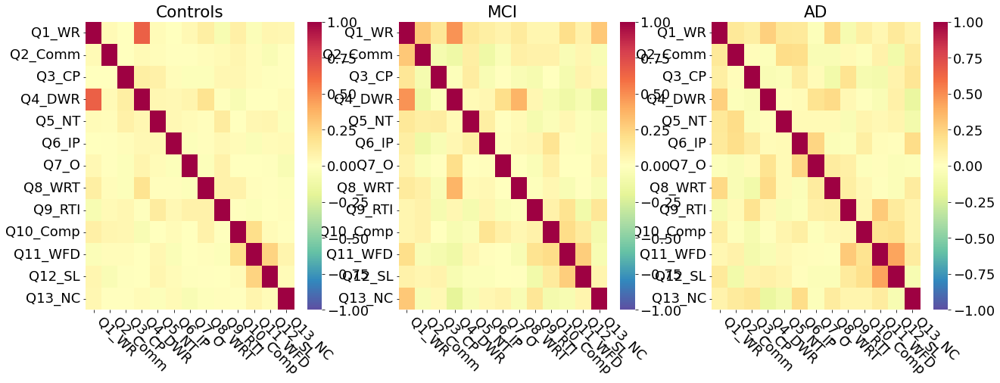

In [137]:
plot_adjacency_mx(ADAS_CN_mx, ADAS_MCI_mx, ADAS_AD_mx, 'ADAS')

#### Print the highest correlated pairs

In [138]:
threshold = 0.3
print("CN-----------------------")
high_corr_pairs(ADAS_CN_mx, threshold)
print("MCI----------------------")
high_corr_pairs(ADAS_MCI_mx, threshold)
print("AD-----------------------")
high_corr_pairs(ADAS_AD_mx, threshold)

CN-----------------------
Q4_DWR - Q1_WR :  0.6509464729684001
MCI----------------------
Q4_DWR - Q1_WR :  0.4792808668416937
Q8_WRT - Q4_DWR :  0.36750016359370163
AD-----------------------
Q12_SL - Q11_WFD :  0.4257469557681974


### MMSE

#### Divide data by diagnostic group

In [139]:
#Get indexes of subjects belonging to each group
MMSE_indexes = {} #Create empty dictionary
dx_groups = ["CN","MCI", "AD"] #diagnostic groups list

Y_MMSE = Y_MMSE.replace({'EMCI':'MCI', 'LMCI':'MCI',"SMC":"CN"})

for dx in dx_groups:
    MMSE_indexes[dx] = Y_MMSE.index[Y_MMSE['DX_bl'] == dx].tolist()
    
#Filter results table by diagnostic group
X_MMSE_CN = X_MMSE.iloc[MMSE_indexes["CN"]]
X_MMSE_MCI = X_MMSE.iloc[MMSE_indexes["MCI"]]
X_MMSE_AD = X_MMSE.iloc[MMSE_indexes["AD"]]

print("Number of instances CN: ", X_MMSE_CN.shape[0])
print("Number of instances MCI: ", X_MMSE_MCI.shape[0])
print("Number of instances AD: ", X_MMSE_AD.shape[0])

Number of instances CN:  523
Number of instances MCI:  356
Number of instances AD:  339


#### Compute adjacency matrixes

In [140]:
MMSE_CN_mx = par_corr(X_MMSE_CN)
MMSE_MCI_mx = par_corr(X_MMSE_MCI)
MMSE_AD_mx = par_corr(X_MMSE_AD)

Total number of negative correlations:  0
Total number of negative correlations:  2
Total number of negative correlations:  11


#### Plot correlation matrixes as heatmaps

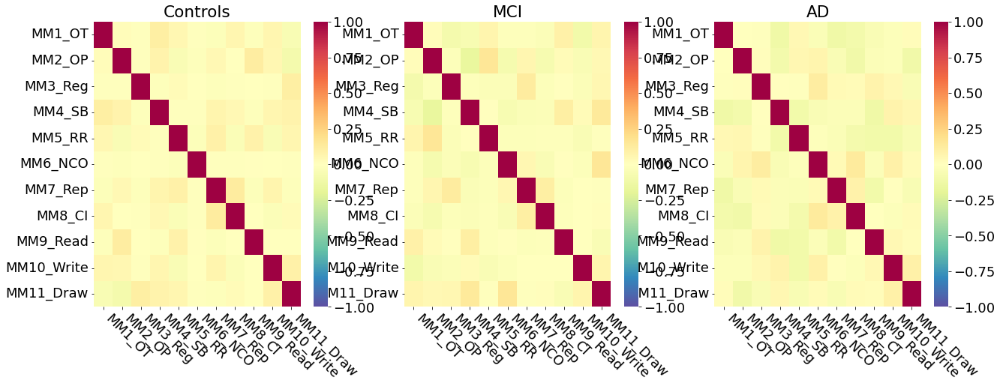

In [141]:
plot_adjacency_mx(MMSE_CN_mx, MMSE_MCI_mx, MMSE_AD_mx, 'MMSE')

Blank variables are those that are constant in the controls. Thus, the standard deviation is 0 (and the mean) is 0 and when computing the partial correlation matrixes it will raise an error. 

#### Find out the highest correlated pairs

In [142]:
threshold = 0.3
print("CN-----------------------")
high_corr_pairs(MMSE_CN_mx, threshold)
print("MCI----------------------")
high_corr_pairs(MMSE_MCI_mx, threshold)
print("AD-----------------------")
high_corr_pairs(MMSE_AD_mx, threshold)

CN-----------------------
MCI----------------------
AD-----------------------


### MOCA

#### Divide data by diagnostic group

In [143]:
#Get indexes of subjects belonging to each group
MOCA_indexes = {} #Create empty dictionary
dx_groups = ["CN","MCI", "AD"] #diagnostic groups list

Y_MOCA = Y_MOCA.replace({'EMCI':'MCI', 'LMCI':'MCI',"SMC":"CN"})

for dx in dx_groups:
    MOCA_indexes[dx] = Y_MOCA.index[Y_MOCA['DX_bl'] == dx].tolist()
    
#Filter results table by diagnostic group
X_MOCA_CN = X_MOCA.iloc[MOCA_indexes["CN"]]
X_MOCA_MCI = X_MOCA.iloc[MOCA_indexes["MCI"]]
X_MOCA_AD = X_MOCA.iloc[MOCA_indexes["AD"]]

print("Number of instances CN: ", X_MOCA_CN.shape[0])
print("Number of instances MCI: ", X_MOCA_MCI.shape[0])
print("Number of instances AD: ", X_MOCA_AD.shape[0])

Number of instances CN:  645
Number of instances MCI:  158
Number of instances AD:  212


#### Compute adjacency matrixes

In [144]:
MOCA_CN_mx = par_corr(X_MOCA_CN)
MOCA_MCI_mx = par_corr(X_MOCA_MCI)
MOCA_AD_mx = par_corr(X_MOCA_AD)

Total number of negative correlations:  1
Total number of negative correlations:  8
Total number of negative correlations:  9


#### Plot correlation matrixes as heatmaps

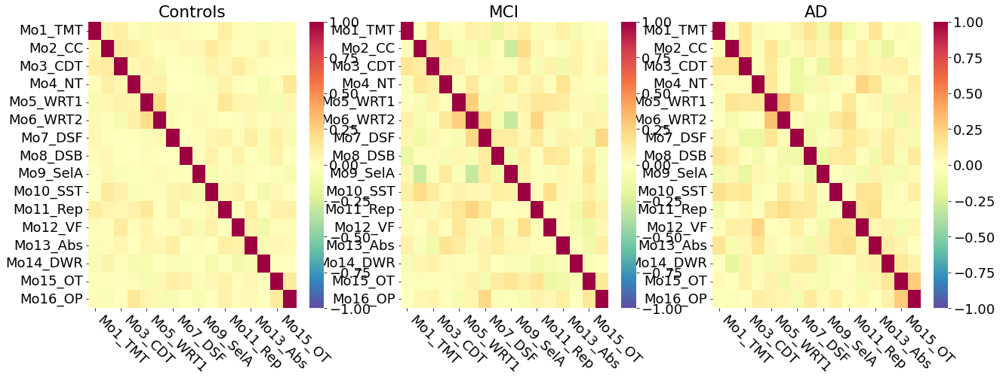

In [145]:
plot_adjacency_mx(MOCA_CN_mx, MOCA_MCI_mx, MOCA_AD_mx, 'MOCA')

#### Find out the highest correlated pairs

In [146]:
threshold = 0.3
print("CN-----------------------")
high_corr_pairs(MOCA_CN_mx, threshold)
print("MCI----------------------")
high_corr_pairs(MOCA_MCI_mx, threshold)
print("AD-----------------------")
high_corr_pairs(MOCA_AD_mx, threshold)

CN-----------------------
MCI----------------------
Mo9_SelA - Mo6_WRT2 :  -0.3054464277249878
AD-----------------------
Mo6_WRT2 - Mo5_WRT1 :  0.32057760491367204


### Merged

#### Divide data by diagnostic group

In [147]:
#Get indexes of subjects belonging to each group
merged_indexes = {} #Create empty dictionary
dx_groups = ["CN","MCI", "AD"] #diagnostic groups list

Y_merged = Y_merged.replace({'EMCI':'MCI', 'LMCI':'MCI',"SMC":"CN"})

for dx in dx_groups:
    merged_indexes[dx] = Y_merged.index[Y_merged['DX_bl'] == dx].tolist()
    
#Filter results table by diagnostic group
X_merged_CN = X_merged.iloc[merged_indexes["CN"]]
X_merged_MCI = X_merged.iloc[merged_indexes["MCI"]]
X_merged_AD = X_merged.iloc[merged_indexes["AD"]]

print("Number of instances CN: ", X_merged_CN.shape[0])
print("Number of instances MCI: ", X_merged_MCI.shape[0])
print("Number of instances AD: ", X_merged_AD.shape[0])

Number of instances CN:  288
Number of instances MCI:  135
Number of instances AD:  142


#### Compute adjacency matrixes

In [148]:
merged_CN_mx = par_corr(X_merged_CN)
merged_MCI_mx = par_corr(X_merged_MCI)
merged_AD_mx = par_corr(X_merged_AD)

Total number of negative correlations:  51
Total number of negative correlations:  145
Total number of negative correlations:  151


#### Plot correlation matrixes as heatmaps

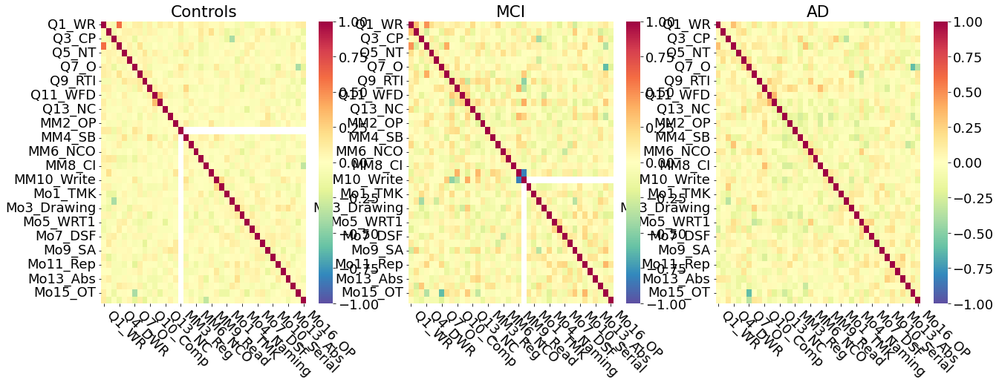

In [149]:
plot_adjacency_mx(merged_CN_mx, merged_MCI_mx, merged_AD_mx, 'All batteries')

#### Find out the highest correlated pairs

In [150]:
threshold = 0.3
print("CN-----------------------")
high_corr_pairs(merged_CN_mx, threshold)
print("MCI----------------------")
high_corr_pairs(merged_MCI_mx, threshold)
print("AD-----------------------")
high_corr_pairs(merged_AD_mx, threshold)

CN-----------------------
Q4_DWR - Q1_WR :  0.5972160383346878
Q12_SL - Q11_WFD :  0.33999610667038854
Mo2_CC - Q3_CP :  -0.40498113058298585
Mo15_OT - Q7_O :  -0.4057122140560568
Mo16_OP - MM8_CI :  -0.3254154781689812
MCI----------------------
Q2_Comm - Q1_WR :  0.325545627923223
Q4_DWR - Q1_WR :  0.48211550902743244
Q8_WRT - Q4_DWR :  0.3990223454520488
MM9_Read - Q10_Comp :  0.38169180466546515
MM9_Read - MM1_OT :  0.35248262461043356
MM10_Write - Q9_RTI :  -0.48333690008846697
MM10_Write - Q10_Comp :  -0.33991047767644433
MM10_Write - Q12_SL :  0.40061030670919395
MM10_Write - MM9_Read :  -0.8248445547646928
Mo2_CC - Q3_CP :  -0.4165979244427678
Mo7_DSF - MM6_NCO :  -0.30628847558109834
Mo9_SA - Mo2_CC :  -0.35454371419746167
Mo15_OT - Q4_DWR :  -0.36477906896145784
Mo15_OT - Q7_O :  -0.616494559470409
Mo15_OT - MM1_OT :  -0.31534000134870094
Mo15_OT - Mo11_Rep :  0.36044002928084434
AD-----------------------
Q4_DWR - Q1_WR :  0.3224725055622041
Q12_SL - Q11_WFD :  0.3587876495175

### Merged (ADAS and MoCA)

#### Divide data by diagnostic group

In [151]:
#Get indexes of subjects belonging to each group
ADASMOCA_indexes = {} #Create empty dictionary
dx_groups = ["CN","MCI", "AD"] #diagnostic groups list

Y_ADASMOCA = Y_ADASMOCA.replace({'EMCI':'MCI', 'LMCI':'MCI',"SMC":"CN"})

for dx in dx_groups:
    ADASMOCA_indexes[dx] = Y_ADASMOCA.index[Y_ADASMOCA['DX_bl'] == dx].tolist()
    
#Filter results table by diagnostic group
X_ADASMOCA_CN = X_ADASMOCA.iloc[ADASMOCA_indexes["CN"]]
X_ADASMOCA_MCI = X_ADASMOCA.iloc[ADASMOCA_indexes["MCI"]]
X_ADASMOCA_AD = X_ADASMOCA.iloc[ADASMOCA_indexes["AD"]]

print("Number of instances CN: ", X_ADASMOCA_CN.shape[0])
print("Number of instances MCI: ", X_ADASMOCA_MCI.shape[0])
print("Number of instances AD: ", X_ADASMOCA_AD.shape[0])

Number of instances CN:  641
Number of instances MCI:  158
Number of instances AD:  208


#### Compute adjacency matrixes

In [152]:
ADASMOCA_CN_mx = par_corr(X_ADASMOCA_CN)
ADASMOCA_MCI_mx = par_corr(X_ADASMOCA_MCI)
ADASMOCA_AD_mx = par_corr(X_ADASMOCA_AD)

Total number of negative correlations:  14
Total number of negative correlations:  44
Total number of negative correlations:  50


#### Plot correlation matrixes as heatmaps

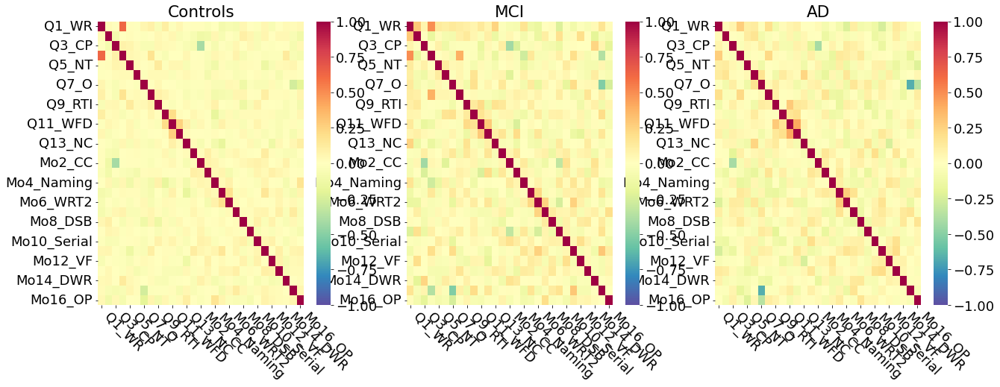

In [153]:
plot_adjacency_mx(ADASMOCA_CN_mx, ADASMOCA_MCI_mx, ADASMOCA_AD_mx, 'ADAS and MoCA')

#### Find out the highest correlated pairs

In [154]:
threshold = 0.3
print("CN-----------------------")
high_corr_pairs(ADASMOCA_CN_mx, threshold)
print("MCI----------------------")
high_corr_pairs(ADASMOCA_MCI_mx, threshold)
print("AD-----------------------")
high_corr_pairs(ADASMOCA_AD_mx, threshold)

CN-----------------------
Q4_DWR - Q1_WR :  0.6321762987658033
Mo2_CC - Q3_CP :  -0.407426591414524
MCI----------------------
Q4_DWR - Q1_WR :  0.49561881368735927
Q8_WRT - Q4_DWR :  0.38570940641094953
Mo2_CC - Q3_CP :  -0.4271236929847188
Mo9_SA - Mo2_CC :  -0.32481894918983356
Mo15_OT - Q4_DWR :  -0.3718236335786348
Mo15_OT - Q7_O :  -0.51811682389699
AD-----------------------
Q12_SL - Q11_WFD :  0.41056749749980054
Mo2_CC - Q3_CP :  -0.41296745249809325
Mo15_OT - Q7_O :  -0.6689008215030711
Mo16_OP - Q7_O :  -0.35485383563012524


The ADAS-Cog cognitive is probably more correlated with the MoCA Orientation to time test because the ADAS' questionnaire has 6 items related with time (month, date, year, day, season) and only one related with place (place).

### NEUROBAT

#### Divide data by diagnostic group

In [155]:
#Get indexes of subjects belonging to each group
NEUROBAT_indexes = {} #Create empty dictionary
dx_groups = ["CN","MCI", "AD"] #diagnostic groups list

Y_NEUROBAT = Y_NEUROBAT.replace({'EMCI':'MCI', 'LMCI':'MCI',"SMC":"CN"})

for dx in dx_groups:
    NEUROBAT_indexes[dx] = Y_NEUROBAT.index[Y_NEUROBAT['DX_bl'] == dx].tolist()
    
#Filter results table by diagnostic group
X_NEUROBAT_CN = X_NEUROBAT.iloc[NEUROBAT_indexes["CN"]]
X_NEUROBAT_MCI = X_NEUROBAT.iloc[NEUROBAT_indexes["MCI"]]
X_NEUROBAT_AD = X_NEUROBAT.iloc[NEUROBAT_indexes["AD"]]

print("Number of instances CN: ", X_NEUROBAT_CN.shape[0])
print("Number of instances MCI: ", X_NEUROBAT_MCI.shape[0])
print("Number of instances AD: ", X_NEUROBAT_AD.shape[0])

Number of instances CN:  229
Number of instances MCI:  219
Number of instances AD:  185


#### Compute adjacency matrixes

In [156]:
NEUROBAT_CN_mx = par_corr(X_NEUROBAT_CN)
NEUROBAT_MCI_mx = par_corr(X_NEUROBAT_MCI)
NEUROBAT_AD_mx = par_corr(X_NEUROBAT_AD)

Total number of negative correlations:  9
Total number of negative correlations:  11
Total number of negative correlations:  12


#### Plot correlation matrixes as heatmaps

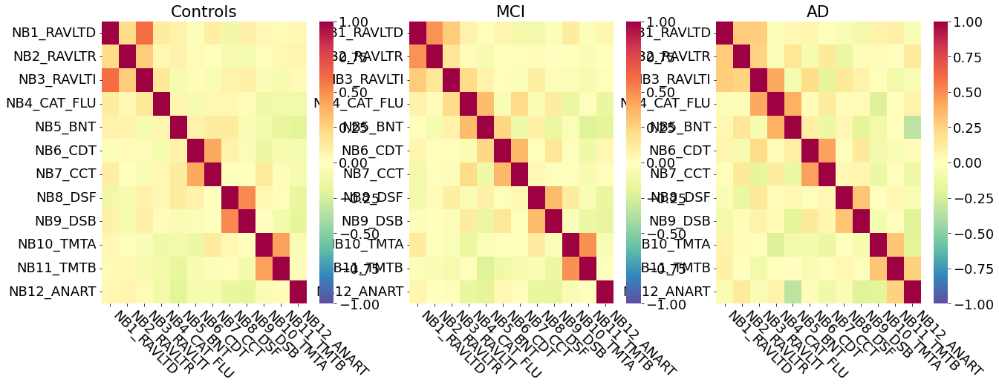

In [157]:
plot_adjacency_mx(NEUROBAT_CN_mx, NEUROBAT_MCI_mx, NEUROBAT_AD_mx, 'NEUROBAT')

#### Find out the highest correlated pairs

In [158]:
threshold = 0.4
print("CN-----------------------")
high_corr_pairs(NEUROBAT_CN_mx, threshold)
print("MCI----------------------")
high_corr_pairs(NEUROBAT_MCI_mx, threshold)
print("AD-----------------------")
high_corr_pairs(NEUROBAT_AD_mx, threshold)

CN-----------------------
NB3_RAVLTI - NB1_RAVLTD :  0.5980826549059557
NB7_CCT - NB6_CDT :  0.41198979377987904
NB9_DSB - NB8_DSF :  0.5087313619116033
NB11_TMTB - NB10_TMTA :  0.4298719782964029
MCI----------------------
NB2_RAVLTR - NB1_RAVLTD :  0.48081931771821107
NB11_TMTB - NB10_TMTA :  0.4848730486975915
AD-----------------------
NB4_CAT_FLU - NB3_RAVLTI :  0.4066743839436068
NB7_CCT - NB6_CDT :  0.43652572872881223


## 6. GRAPH CONSTRUCTION

The number of nodes ($V$) is equivalent to the number of tests included in the neurocognitive battery, whereas the number of possible edges in an undirected graph is $\frac{V·(V-1)}{2}$

In [159]:
import networkx as nx

In [160]:
def cognitive_network(mx, threshold, X, metadata_path):
    """Function to remove diagonal elements and convert scores into absolute values. It returns a networkx graph"""
    
    for i in range(mx.shape[1]): #iterate matrix columns
        colname = mx.columns[i]
        #Remove diagonal elements
        mx[colname] =np.where((mx[colname]==1.0) | (mx[colname].isnull()),0, mx[colname]) 
        #Convert negative correlations in positive ones
        mx[colname] = np.where((mx[colname]<0),-1*mx[colname], mx[colname])
        
        #discard all correlations below threshold
        if threshold is None:
            next
        else:
            mx[colname] = np.where((mx[colname]<threshold),0, mx[colname])
    
    #Create graph from adjacency matrix  ----------------------
    g = nx.from_numpy_array(mx.to_numpy())
    
    #Add attributes -------------------------------
    attribute_ls = ['Node', 'Label', 'Test', 'Cognitive Domain']
    
    #Import node metadata
    metadata_df = pd.read_csv(metadata_path, sep=";", 
                                usecols = attribute_ls)
    metadata_df = metadata_df[attribute_ls].drop_duplicates()
    
    #Add attributes
    for attribute in attribute_ls:
        nx.set_node_attributes(g, dict(zip(metadata_df.Node, metadata_df[attribute])), name=attribute)
        
    #add mean z-score to each node
    means = X.mean(axis=0).tolist()
    nx.set_node_attributes(g, dict(zip(metadata_df.Node, means)), name='Zscore mean')    
    
    return g

In [161]:
import matplotlib.lines as mlines

def draw_graph(graphs_ls, test_labels, pos, battery_name):
    
    #Color by NC domain
    ATTRIBUTE_NAME = 'Cognitive Domain'
    mapping = {'Attention':0, 'Executive':1, 'Language':2, 'Memory':3, 'Orientation':4, 'Visuospatial':5}
    colorCodes_dict = {0:"#9999FF", 1:"#CC99FF", 2:"#F8766D", 3:"#00BFC4", 4:"#66CC99", 5:"#FFCC99"}
    
    colors=[]
    for node in list(graphs_ls[0].nodes()): #iterate each node
        domain = graphs_ls[0].nodes[node][ATTRIBUTE_NAME]
        color = mapping[domain]
        colors.append(colorCodes_dict[color])
        

    #Plot
    fig, axes = plt.subplots(1,3, figsize=(28,7))
    fig.subplots_adjust(wspace=0.025)
    
    # create combined legend for all subgraphs
    handles = []
    labels = []
    
    for i in range(len(graphs_ls)):
        
        graph = graphs_ls[i]

        #get edges weights
        weights = list(nx.get_edge_attributes(graph,'weight').values())
        
        if test_labels is not None: 
            nx.draw(ax=axes[i], G=graph, pos=pos, labels=test_labels, with_labels=True, font_size=14, node_color=colors, 
                    edge_color=weights, edge_cmap=plt.cm.Greys, width=[ x*10 for x in weights])
        
        else:
            nx.draw(ax=axes[i], G=graph, pos=pos, with_labels=True, node_color=colors, 
                   edge_color=weights, edge_cmap=plt.cm.Greys, width=[ x*10 for x in weights])
            
    #Add legend labels
    edge_labels = {tuple(edge): float(weight) for edge, weight in nx.get_edge_attributes(graph,'weight').items()}

    # add labels and handles to combined legend
    for edge, weight in edge_labels.items():
        if edge not in labels:
            handles.append(mlines.Line2D([], [], color='grey', linewidth=10*weight, label=weight))
            labels.append(edge)

    # create colorbar
    sm = plt.cm.ScalarMappable(cmap=plt.cm.Greys, norm=plt.Normalize(vmin=min(weights), vmax=max(weights)))
    plt.colorbar(sm, ax=axes)

    # set label of colorbar
    axes[2].get_figure().axes[-1].set_ylabel('Edge Weight')
    

    #add title to subfigures
    axes[0].title.set_text("Controls")
    axes[1].title.set_text("MCI")
    axes[2].title.set_text("AD")
    
    
    figure_path = "./Results/Figures/Graphs/"+ battery_name + ".svg"
    plt.savefig(figure_path, format="svg")
    
    figure_path = "./Results/Figures/Graphs/"+ battery_name + ".png"
    plt.savefig(figure_path, format="png")
    plt.show()

### ADAS-Cog

#### 6.1 Compute graph

In [162]:
metadata_path = "./NC_Tests/ADAS_Metadata.csv"
#convert adjacency matrix into graph
ADAS_CN_graph = cognitive_network(ADAS_CN_mx, threshold=None, X=X_ADAS_CN, metadata_path=metadata_path)
ADAS_MCI_graph = cognitive_network(ADAS_MCI_mx, threshold=None, X=X_ADAS_MCI, metadata_path=metadata_path)
ADAS_AD_graph = cognitive_network(ADAS_AD_mx, threshold=None, X=X_ADAS_AD, metadata_path=metadata_path)

In [163]:
#count nodes and edges
print("CN-------------------------")
print("- Number of nodes: ", ADAS_CN_graph.number_of_nodes())
print("- Number of edges: ", ADAS_CN_graph.number_of_edges())
print()
print("MCI-------------------------")
print("- Number of nodes: ", ADAS_MCI_graph.number_of_nodes())
print("- Number of edges: ", ADAS_MCI_graph.number_of_edges())
print()
print("AD-------------------------")
print("- Number of nodes: ", ADAS_AD_graph.number_of_nodes())
print("- Number of edges: ", ADAS_AD_graph.number_of_edges())

CN-------------------------
- Number of nodes:  13
- Number of edges:  78

MCI-------------------------
- Number of nodes:  13
- Number of edges:  78

AD-------------------------
- Number of nodes:  13
- Number of edges:  78


#### 6.3. Draw graph

In [164]:
graphs_ls = [ADAS_CN_graph, ADAS_MCI_graph, ADAS_AD_graph]
X_ls = [X_ADAS_CN, X_ADAS_MCI, X_ADAS_AD]

In [165]:
colors = {node: data['Cognitive Domain'] for node, data in ADAS_CN_graph.nodes.data()}
print(colors)

{0: 'Memory', 1: 'Language', 2: 'Visuospatial', 3: 'Memory', 4: 'Language', 5: 'Visuospatial', 6: 'Orientation', 7: 'Memory', 8: 'Memory', 9: 'Language', 10: 'Language', 11: 'Language', 12: 'Attention'}


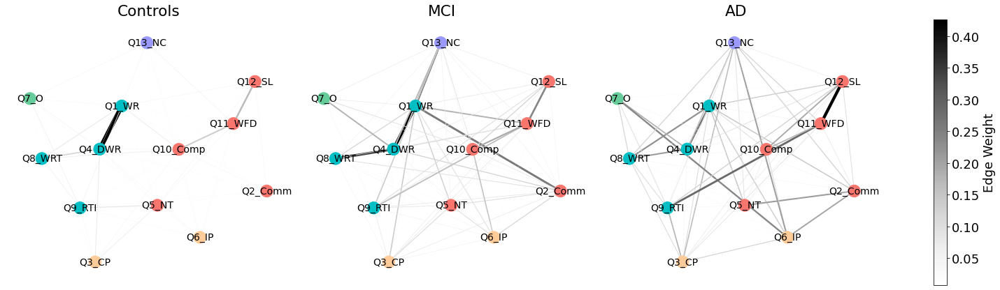

In [166]:
#Node labels
ADAS_labels = {} #create empty dictionary

for i in range(ADAS_CN_mx.shape[1]):
    ADAS_labels[i] = ADAS_CN_mx.columns[i]


#fix position
pos_ADAS=nx.spring_layout(ADAS_CN_graph, weight='weight', seed=0)

draw_graph(graphs_ls, ADAS_labels, pos_ADAS, 'ADAS')

#### Edges weights

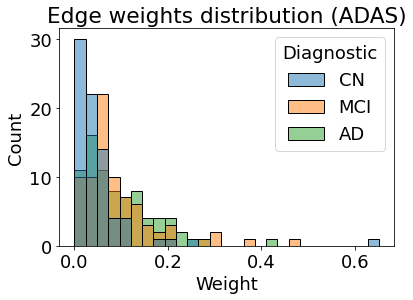

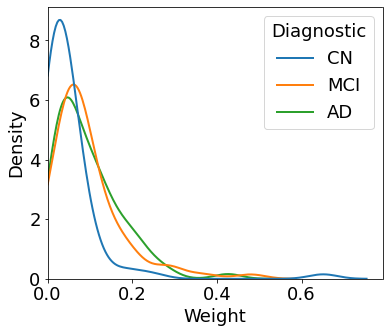

In [167]:
#Create dataframe with weights
weights_df_CN = pd.DataFrame(list(nx.get_edge_attributes(ADAS_CN_graph,'weight').values()), columns=["Weight"])
weights_df_CN['Diagnostic'] = "CN"
weights_df_MCI = pd.DataFrame(list(nx.get_edge_attributes(ADAS_MCI_graph,'weight').values()), columns=["Weight"])
weights_df_MCI['Diagnostic'] = "MCI"
weights_df_AD = pd.DataFrame(list(nx.get_edge_attributes(ADAS_AD_graph,'weight').values()), columns=["Weight"])
weights_df_AD['Diagnostic'] = "AD"

#merge all
weights_df = pd.concat([weights_df_CN, weights_df_MCI, weights_df_AD], ignore_index=True)

#plot histogram
sns.histplot(data=weights_df, x="Weight", hue="Diagnostic")
plt.title("Edge weights distribution (ADAS)")
plt.savefig("./Results/Figures/Weights/ADAS_weights.svg", format="svg")
plt.show()

#plot kernel density
fig = plt.figure(figsize=(6,5))
sns.kdeplot(data=weights_df, x="Weight", hue="Diagnostic", common_norm=False,
           clip=(0.0, 1.0), linewidth = 2)
plt.xlim(left=0)
plt.savefig("./Results/Figures/Weights/ADAS_weights_KD.png", format="png")
plt.show()

In [168]:
### Kolmogorov-Smirnov test
print("Kolmogorov-Smirnov test CN-MCI: ", stats.kstest(weights_df_CN['Weight'].values.tolist(), weights_df_MCI['Weight'].values.tolist()))
print("Kolmogorov-Smirnov test CN-AD: ", stats.kstest(weights_df_CN['Weight'].values.tolist(), weights_df_AD['Weight'].values.tolist()))
print("Kolmogorov-Smirnov test MCI-AD: ", stats.kstest(weights_df_MCI['Weight'].values.tolist(), weights_df_AD['Weight'].values.tolist()))

print("U test CN-MCI: ", stats.mannwhitneyu(weights_df_CN['Weight'].values.tolist(), weights_df_MCI['Weight'].values.tolist()))
print("U test CN-AD: ", stats.mannwhitneyu(weights_df_CN['Weight'].values.tolist(), weights_df_AD['Weight'].values.tolist()))
print("U test MCI-AD: ", stats.mannwhitneyu(weights_df_MCI['Weight'].values.tolist(), weights_df_AD['Weight'].values.tolist()))

Kolmogorov-Smirnov test CN-MCI:  KstestResult(statistic=0.44871794871794873, pvalue=1.902687755906017e-07, statistic_location=0.043417126726125306, statistic_sign=1)
Kolmogorov-Smirnov test CN-AD:  KstestResult(statistic=0.38461538461538464, pvalue=1.5597106378299544e-05, statistic_location=0.0617889191351083, statistic_sign=1)
Kolmogorov-Smirnov test MCI-AD:  KstestResult(statistic=0.11538461538461539, pvalue=0.6801596116769174, statistic_location=0.04929930265258443, statistic_sign=-1)
U test CN-MCI:  MannwhitneyuResult(statistic=1638.0, pvalue=6.538078335778708e-07)
U test CN-AD:  MannwhitneyuResult(statistic=1579.0, pvalue=2.1749595635415144e-07)
U test MCI-AD:  MannwhitneyuResult(statistic=2993.0, pvalue=0.8635123949065833)


### MMSE

#### 6.1 Compute graph

In [169]:
metadata_path = "./NC_Tests/MMSE_Metadata.csv"
#convert adjacency matrix into graph
MMSE_CN_graph = cognitive_network(MMSE_CN_mx, threshold=None, X=X_MMSE_CN, metadata_path=metadata_path)
MMSE_MCI_graph = cognitive_network(MMSE_MCI_mx, threshold=None, X=X_MMSE_MCI, metadata_path=metadata_path)
MMSE_AD_graph = cognitive_network(MMSE_AD_mx, threshold=None, X=X_MMSE_AD, metadata_path=metadata_path)

In [170]:
#count nodes and edges
print("CN-------------------------")
print("- Number of nodes: ", MMSE_CN_graph.number_of_nodes())
print("- Number of edges: ", MMSE_CN_graph.number_of_edges())
print()
print("MCI-------------------------")
print("- Number of nodes: ", MMSE_MCI_graph.number_of_nodes())
print("- Number of edges: ", MMSE_MCI_graph.number_of_edges())
print()
print("AD-------------------------")
print("- Number of nodes: ", MMSE_AD_graph.number_of_nodes())
print("- Number of edges: ", MMSE_AD_graph.number_of_edges())

CN-------------------------
- Number of nodes:  11
- Number of edges:  55

MCI-------------------------
- Number of nodes:  11
- Number of edges:  55

AD-------------------------
- Number of nodes:  11
- Number of edges:  55


In [171]:
graphs_ls = [MMSE_CN_graph, MMSE_MCI_graph, MMSE_AD_graph]
X_ls = [X_MMSE_CN, X_MMSE_MCI, X_MMSE_AD]

#### 6.3. Draw graph

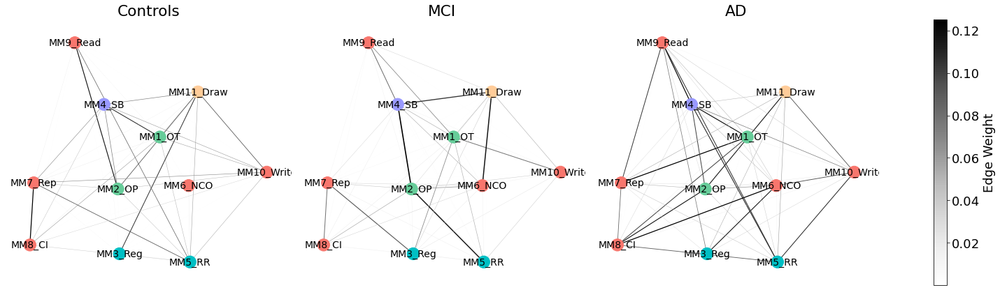

In [172]:
#Node labels
MMSE_labels = {} #create empty dictionary

for i in range(MMSE_CN_mx.shape[1]):
    MMSE_labels[i] = MMSE_CN_mx.columns[i]


#fix position
pos_MMSE=nx.spring_layout(MMSE_MCI_graph, weight='weight', seed=0)

draw_graph(graphs_ls, MMSE_labels, pos_MMSE, 'MMSE')

#### Edges weights

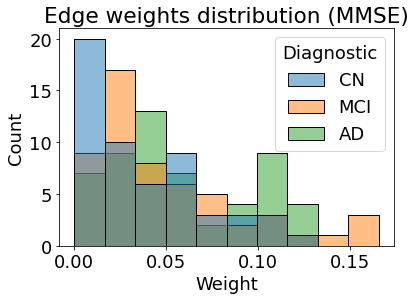

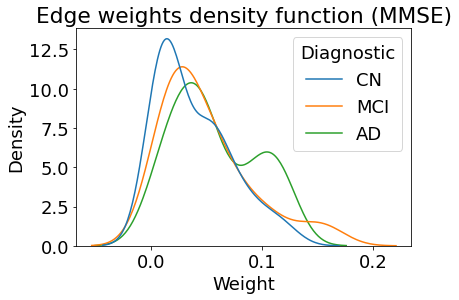

In [173]:
#Create dataframe with weights
weights_df_CN = pd.DataFrame(list(nx.get_edge_attributes(MMSE_CN_graph,'weight').values()), columns=["Weight"])
weights_df_CN['Diagnostic'] = "CN"
weights_df_MCI = pd.DataFrame(list(nx.get_edge_attributes(MMSE_MCI_graph,'weight').values()), columns=["Weight"])
weights_df_MCI['Diagnostic'] = "MCI"
weights_df_AD = pd.DataFrame(list(nx.get_edge_attributes(MMSE_AD_graph,'weight').values()), columns=["Weight"])
weights_df_AD['Diagnostic'] = "AD"

#merge all
weights_df = pd.concat([weights_df_CN, weights_df_MCI, weights_df_AD], ignore_index=True)

#plot histogram
sns.histplot(data=weights_df, x="Weight", hue="Diagnostic")
plt.title("Edge weights distribution (MMSE)")
plt.savefig("./Results/Figures/Weights/MMSE_weights.svg", format="svg")
plt.show()

#plot kernel density
sns.kdeplot(data=weights_df, x="Weight", hue="Diagnostic", common_norm=False)
plt.title("Edge weights density function (MMSE)")
plt.savefig("./Results/Figures/Weights/MMSE_weights_KD.svg", format="svg")
plt.show()

In [174]:
### Kolmogorov-Smirnov test
print("Kolmogorov-Smirnov test CN-MCI: ", stats.kstest(weights_df_CN['Weight'].values.tolist(), weights_df_MCI['Weight'].values.tolist()))
print("Kolmogorov-Smirnov test CN-AD: ", stats.kstest(weights_df_CN['Weight'].values.tolist(), weights_df_AD['Weight'].values.tolist()))

Kolmogorov-Smirnov test CN-MCI:  KstestResult(statistic=0.2, pvalue=0.2225456491792584, statistic_location=0.016701193504134883, statistic_sign=1)
Kolmogorov-Smirnov test CN-AD:  KstestResult(statistic=0.2909090909090909, pvalue=0.018584154974416515, statistic_location=0.02392565338036738, statistic_sign=1)


### MOCA

#### 6.1 Compute graph

In [175]:
metadata_path = "./NC_Tests/MOCA_Metadata.csv"
#convert adjacency matrix into graph
MOCA_CN_graph = cognitive_network(MOCA_CN_mx, threshold=None, X=X_MOCA_CN, metadata_path=metadata_path)
MOCA_MCI_graph = cognitive_network(MOCA_MCI_mx, threshold=None, X=X_MOCA_MCI, metadata_path=metadata_path)
MOCA_AD_graph = cognitive_network(MOCA_AD_mx, threshold=None, X=X_MOCA_AD, metadata_path=metadata_path)

In [176]:
#count nodes and edges
print("CN-------------------------")
print("- Number of nodes: ", MOCA_CN_graph.number_of_nodes())
print("- Number of edges: ", MOCA_CN_graph.number_of_edges())
print()
print("MCI-------------------------")
print("- Number of nodes: ", MOCA_MCI_graph.number_of_nodes())
print("- Number of edges: ", MOCA_MCI_graph.number_of_edges())
print()
print("AD-------------------------")
print("- Number of nodes: ", MOCA_AD_graph.number_of_nodes())
print("- Number of edges: ", MOCA_AD_graph.number_of_edges())

CN-------------------------
- Number of nodes:  16
- Number of edges:  120

MCI-------------------------
- Number of nodes:  16
- Number of edges:  120

AD-------------------------
- Number of nodes:  16
- Number of edges:  120


In [177]:
graphs_ls = [MOCA_CN_graph, MOCA_MCI_graph, MOCA_AD_graph]
X_ls = [X_MOCA_CN, X_MOCA_MCI, X_MOCA_AD]

#### 6.3. Draw graph

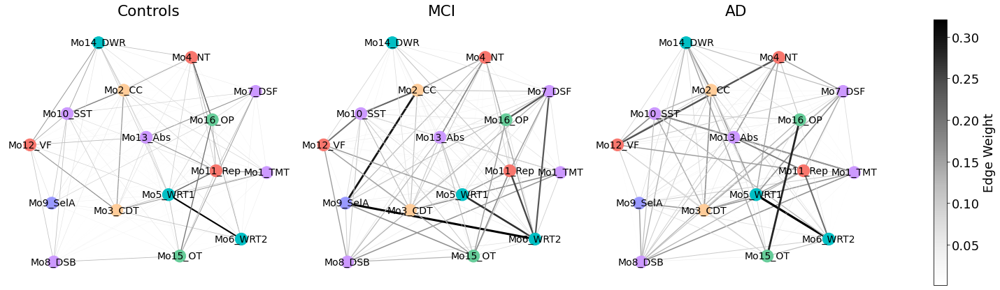

In [178]:
#Node labels
MOCA_labels = {} #create empty dictionary

for i in range(MOCA_CN_mx.shape[1]):
    MOCA_labels[i] = MOCA_CN_mx.columns[i]

#fix position
pos_MOCA=nx.spring_layout(MOCA_CN_graph, weight='weight', seed=0)

draw_graph(graphs_ls, MOCA_labels, pos_MOCA, 'MOCA')

#### Edges weights

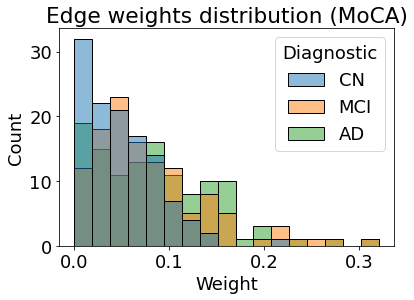

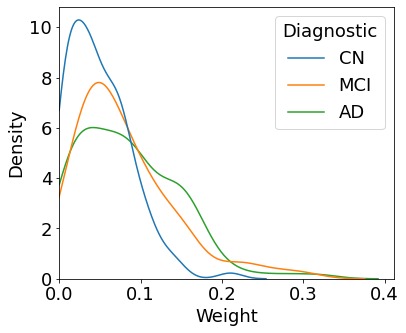

In [179]:
#Create dataframe with weights
weights_df_CN = pd.DataFrame(list(nx.get_edge_attributes(MOCA_CN_graph,'weight').values()), columns=["Weight"])
weights_df_CN['Diagnostic'] = "CN"
weights_df_MCI = pd.DataFrame(list(nx.get_edge_attributes(MOCA_MCI_graph,'weight').values()), columns=["Weight"])
weights_df_MCI['Diagnostic'] = "MCI"
weights_df_AD = pd.DataFrame(list(nx.get_edge_attributes(MOCA_AD_graph,'weight').values()), columns=["Weight"])
weights_df_AD['Diagnostic'] = "AD"

#merge all
weights_df = pd.concat([weights_df_CN, weights_df_MCI, weights_df_AD], ignore_index=True)

#plot histogram
sns.histplot(data=weights_df, x="Weight", hue="Diagnostic")
plt.title("Edge weights distribution (MoCA)")
plt.savefig("./Results/Figures/Weights/MOCA_weights.svg", format="svg")
plt.show()

#plot kernel density
fig = plt.figure(figsize=(6,5))
sns.kdeplot(data=weights_df, x="Weight", hue="Diagnostic", common_norm=False,
           clip=(0.0, 1.0), linewidth = 1.5)
plt.xlim(left=0)
#plt.title("MOCA")
plt.savefig("./Results/Figures/Weights/MOCA_weights_KD.png", format="png")
plt.show()

In [180]:
### Kolmogorov-Smirnov test
print("Kolmogorov-Smirnov test CN-MCI: ", stats.kstest(weights_df_CN['Weight'].values.tolist(), weights_df_MCI['Weight'].values.tolist()))
print("Kolmogorov-Smirnov test CN-AD: ", stats.kstest(weights_df_CN['Weight'].values.tolist(), weights_df_AD['Weight'].values.tolist()))
print("Kolmogorov-Smirnov test MCI-AD: ", stats.kstest(weights_df_MCI['Weight'].values.tolist(), weights_df_AD['Weight'].values.tolist()))
#Mann Whitney test
print("U test CN-MCI: ",stats.mannwhitneyu(weights_df_CN['Weight'].values.tolist(), weights_df_MCI['Weight'].values.tolist()))
print("U test CN-AD: ", stats.mannwhitneyu(weights_df_CN['Weight'].values.tolist(), weights_df_AD['Weight'].values.tolist()))
print("U test MCI-AD: ", stats.mannwhitneyu(weights_df_MCI['Weight'].values.tolist(), weights_df_AD['Weight'].values.tolist()))

Kolmogorov-Smirnov test CN-MCI:  KstestResult(statistic=0.23333333333333334, pvalue=0.002814730353040185, statistic_location=0.036377833680989506, statistic_sign=1)
Kolmogorov-Smirnov test CN-AD:  KstestResult(statistic=0.31666666666666665, pvalue=1.015902344604177e-05, statistic_location=0.08218277308644943, statistic_sign=1)
Kolmogorov-Smirnov test MCI-AD:  KstestResult(statistic=0.11666666666666667, pvalue=0.3889566002413223, statistic_location=0.08034056211754345, statistic_sign=1)
U test CN-MCI:  MannwhitneyuResult(statistic=4927.0, pvalue=2.3813651771126186e-05)
U test CN-AD:  MannwhitneyuResult(statistic=4752.0, pvalue=5.334709684634883e-06)
U test MCI-AD:  MannwhitneyuResult(statistic=6882.0, pvalue=0.5549241174821442)


### Merged

#### 6.1 Compute graph

In [181]:
metadata_path = "./NC_Tests/merged_Metadata.csv"
#convert adjacency matrix into graph
merged_CN_graph = cognitive_network(merged_CN_mx, threshold=None, X=X_merged_CN, metadata_path=metadata_path)
merged_MCI_graph = cognitive_network(merged_MCI_mx, threshold=None, X=X_merged_MCI, metadata_path=metadata_path)
merged_AD_graph = cognitive_network(merged_AD_mx, threshold=None, X=X_merged_AD, metadata_path=metadata_path)

In [182]:
#count nodes and edges
print("CN-------------------------")
print("- Number of nodes: ", merged_CN_graph.number_of_nodes())
print("- Number of edges: ", merged_CN_graph.number_of_edges())
print()
print("MCI-------------------------")
print("- Number of nodes: ", merged_MCI_graph.number_of_nodes())
print("- Number of edges: ", merged_MCI_graph.number_of_edges())
print()
print("AD-------------------------")
print("- Number of nodes: ", merged_AD_graph.number_of_nodes())
print("- Number of edges: ", merged_AD_graph.number_of_edges())

CN-------------------------
- Number of nodes:  40
- Number of edges:  756

MCI-------------------------
- Number of nodes:  40
- Number of edges:  763

AD-------------------------
- Number of nodes:  40
- Number of edges:  780


In [183]:
graphs_ls = [merged_CN_graph, merged_MCI_graph, merged_AD_graph]
X_ls = [X_merged_CN, X_merged_MCI, X_merged_AD]

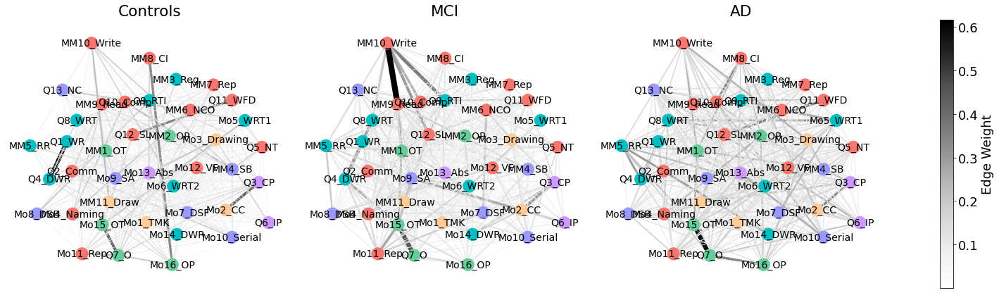

In [184]:
#Node labels
#test_labels = None

#Node labels
merged_labels = {} #create empty dictionary

for i in range(merged_CN_mx.shape[1]):
    merged_labels[i] = merged_CN_mx.columns[i]

#fix position
pos_merged=nx.spring_layout(merged_MCI_graph, weight='weight', seed=0)

draw_graph(graphs_ls, merged_labels, pos_merged, 'merged')

#### 6.3. Draw graph

#### Edges weights

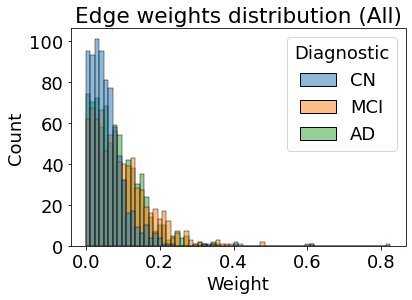

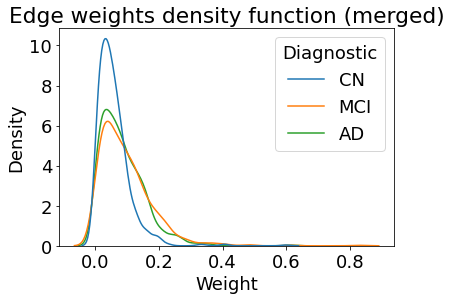

In [185]:
#Create dataframe with weights
weights_df_CN = pd.DataFrame(list(nx.get_edge_attributes(merged_CN_graph,'weight').values()), columns=["Weight"])
weights_df_CN['Diagnostic'] = "CN"
weights_df_MCI = pd.DataFrame(list(nx.get_edge_attributes(merged_MCI_graph,'weight').values()), columns=["Weight"])
weights_df_MCI['Diagnostic'] = "MCI"
weights_df_AD = pd.DataFrame(list(nx.get_edge_attributes(merged_AD_graph,'weight').values()), columns=["Weight"])
weights_df_AD['Diagnostic'] = "AD"

#merge all
weights_df = pd.concat([weights_df_CN, weights_df_MCI, weights_df_AD], ignore_index=True)

#plot histogram
sns.histplot(data=weights_df, x="Weight", hue="Diagnostic")
plt.title("Edge weights distribution (All)")
plt.savefig("./Results/Figures/Weights/merged_weights.svg", format="svg")
plt.show()

#plot kernel density
sns.kdeplot(data=weights_df, x="Weight", hue="Diagnostic", common_norm=False)
plt.title("Edge weights density function (merged)")
plt.savefig("./Results/Figures/Weights/merged_weights_KD.svg", format="svg")
plt.show()

In [186]:
### Kolmogorov-Smirnov test
print("Kolmogorov-Smirnov test CN-MCI: ", stats.kstest(weights_df_CN['Weight'].values.tolist(), weights_df_MCI['Weight'].values.tolist()))
print("Kolmogorov-Smirnov test CN-AD: ", stats.kstest(weights_df_CN['Weight'].values.tolist(), weights_df_AD['Weight'].values.tolist()))
print("Kolmogorov-Smirnov test MCI-AD: ", stats.kstest(weights_df_MCI['Weight'].values.tolist(), weights_df_AD['Weight'].values.tolist()))

Kolmogorov-Smirnov test CN-MCI:  KstestResult(statistic=0.2649143245473521, pvalue=6.136456220211667e-24, statistic_location=0.1020891539750086, statistic_sign=1)
Kolmogorov-Smirnov test CN-AD:  KstestResult(statistic=0.22733007733007732, pvalue=6.86695344949788e-18, statistic_location=0.07950680032826216, statistic_sign=1)
Kolmogorov-Smirnov test MCI-AD:  KstestResult(statistic=0.06449742917632825, pvalue=0.07601111030731482, statistic_location=0.09268459804045907, statistic_sign=-1)


### Merged (ADAS and MoCA)

#### 6.1 Compute graph

In [187]:
metadata_path = "./NC_Tests/ADASMOCA_Metadata.csv"
#convert adjacency matrix into graph
ADASMOCA_CN_graph = cognitive_network(ADASMOCA_CN_mx, threshold=None, X=X_ADASMOCA_CN, metadata_path=metadata_path)
ADASMOCA_MCI_graph = cognitive_network(ADASMOCA_MCI_mx, threshold=None, X=X_ADASMOCA_MCI, metadata_path=metadata_path)
ADASMOCA_AD_graph = cognitive_network(ADASMOCA_AD_mx, threshold=None, X=X_ADASMOCA_AD, metadata_path=metadata_path)

In [188]:
#count nodes and edges
print("CN-------------------------")
print("- Number of nodes: ", ADASMOCA_CN_graph.number_of_nodes())
print("- Number of edges: ", ADASMOCA_CN_graph.number_of_edges())
print()
print("MCI-------------------------")
print("- Number of nodes: ", ADASMOCA_MCI_graph.number_of_nodes())
print("- Number of edges: ", ADASMOCA_MCI_graph.number_of_edges())
print()
print("AD-------------------------")
print("- Number of nodes: ", ADASMOCA_AD_graph.number_of_nodes())
print("- Number of edges: ", ADASMOCA_AD_graph.number_of_edges())

CN-------------------------
- Number of nodes:  29
- Number of edges:  406

MCI-------------------------
- Number of nodes:  29
- Number of edges:  406

AD-------------------------
- Number of nodes:  29
- Number of edges:  406


In [189]:
graphs_ls = [ADASMOCA_CN_graph, ADASMOCA_MCI_graph, ADASMOCA_AD_graph]
X_ls = [X_ADASMOCA_CN, X_ADASMOCA_MCI, X_ADASMOCA_AD]

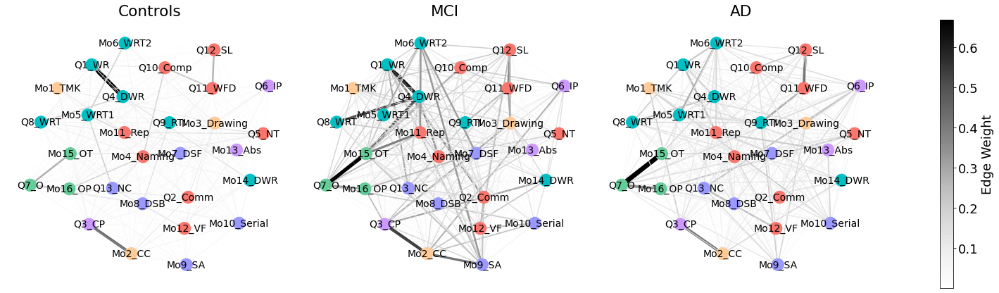

In [190]:
#Node labels
ADASMOCA_labels = {} #create empty dictionary

for i in range(ADASMOCA_CN_mx.shape[1]):
    ADASMOCA_labels[i] = ADASMOCA_CN_mx.columns[i]


#fix position
pos_ADASMOCA=nx.spring_layout(ADASMOCA_CN_graph, weight='weight', seed=0)

draw_graph(graphs_ls, ADASMOCA_labels, pos_ADASMOCA, 'ADASMOCA')

#### 6.3. Draw graph

#### Edges weights

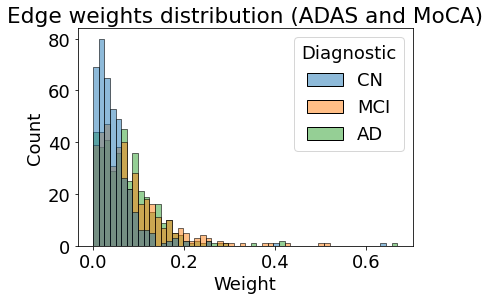

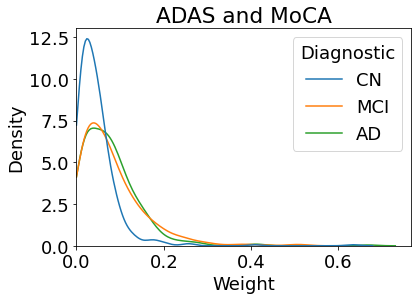

In [191]:
#Create dataframe with weights
weights_df_CN = pd.DataFrame(list(nx.get_edge_attributes(ADASMOCA_CN_graph,'weight').values()), columns=["Weight"])
weights_df_CN['Diagnostic'] = "CN"
weights_df_MCI = pd.DataFrame(list(nx.get_edge_attributes(ADASMOCA_MCI_graph,'weight').values()), columns=["Weight"])
weights_df_MCI['Diagnostic'] = "MCI"
weights_df_AD = pd.DataFrame(list(nx.get_edge_attributes(ADASMOCA_AD_graph,'weight').values()), columns=["Weight"])
weights_df_AD['Diagnostic'] = "AD"

#merge all
weights_df = pd.concat([weights_df_CN, weights_df_MCI, weights_df_AD], ignore_index=True)

#plot histogram
sns.histplot(data=weights_df, x="Weight", hue="Diagnostic")
plt.title("Edge weights distribution (ADAS and MoCA)")
plt.savefig("./Results/Figures/Weights/ADASMOCA_weights.svg", format="svg")
plt.show()

#plot kernel density
sns.kdeplot(data=weights_df, x="Weight", hue="Diagnostic", common_norm=False,
           clip=(0.0, 1.0))
plt.xlim(left=0)
plt.title("ADAS and MoCA")
plt.savefig("./Results/Figures/Weights/ADASMOCA_weights_KD.svg", format="svg")
plt.show()

In [192]:
### Kolmogorov-Smirnov test
print("Kolmogorov-Smirnov test CN-MCI: ", stats.kstest(weights_df_CN['Weight'].values.tolist(), weights_df_MCI['Weight'].values.tolist()))
print("Kolmogorov-Smirnov test CN-AD: ", stats.kstest(weights_df_CN['Weight'].values.tolist(), weights_df_AD['Weight'].values.tolist()))
print("Kolmogorov-Smirnov test CN-AD: ", stats.kstest(weights_df_MCI['Weight'].values.tolist(), weights_df_AD['Weight'].values.tolist()))
#Mann Whitney test
print("U test CN-MCI: ",stats.mannwhitneyu(weights_df_CN['Weight'].values.tolist(), weights_df_MCI['Weight'].values.tolist()))
print("U test CN-AD: ", stats.mannwhitneyu(weights_df_CN['Weight'].values.tolist(), weights_df_AD['Weight'].values.tolist()))
print("U test MCI-AD: ", stats.mannwhitneyu(weights_df_MCI['Weight'].values.tolist(), weights_df_AD['Weight'].values.tolist()))

Kolmogorov-Smirnov test CN-MCI:  KstestResult(statistic=0.2955665024630542, pvalue=4.83966655028302e-16, statistic_location=0.05743877908771388, statistic_sign=1)
Kolmogorov-Smirnov test CN-AD:  KstestResult(statistic=0.32019704433497537, pvalue=8.402413806382638e-19, statistic_location=0.059943348699299244, statistic_sign=1)
Kolmogorov-Smirnov test CN-AD:  KstestResult(statistic=0.04433497536945813, pvalue=0.8204271475844895, statistic_location=0.15590486313736526, statistic_sign=-1)
U test CN-MCI:  MannwhitneyuResult(statistic=54284.0, pvalue=3.808078209957077e-17)
U test CN-AD:  MannwhitneyuResult(statistic=53603.0, pvalue=6.553976551527771e-18)
U test MCI-AD:  MannwhitneyuResult(statistic=82569.0, pvalue=0.96407894432026)


### NEUROBAT

#### 6.1 Compute graph

In [193]:
metadata_path = "./NC_Tests/NEUROBAT_Metadata.csv"
#convert adjacency matrix into graph
NEUROBAT_CN_graph = cognitive_network(NEUROBAT_CN_mx, threshold=None, X=X_NEUROBAT_CN, metadata_path=metadata_path)
NEUROBAT_MCI_graph = cognitive_network(NEUROBAT_MCI_mx, threshold=None, X=X_NEUROBAT_MCI, metadata_path=metadata_path)
NEUROBAT_AD_graph = cognitive_network(NEUROBAT_AD_mx, threshold=None, X=X_NEUROBAT_AD, metadata_path=metadata_path)

In [194]:
#count nodes and edges
print("CN-------------------------")
print("- Number of nodes: ", NEUROBAT_CN_graph.number_of_nodes())
print("- Number of edges: ", NEUROBAT_CN_graph.number_of_edges())
print()
print("MCI-------------------------")
print("- Number of nodes: ", NEUROBAT_MCI_graph.number_of_nodes())
print("- Number of edges: ", NEUROBAT_MCI_graph.number_of_edges())
print()
print("AD-------------------------")
print("- Number of nodes: ", NEUROBAT_AD_graph.number_of_nodes())
print("- Number of edges: ", NEUROBAT_AD_graph.number_of_edges())

CN-------------------------
- Number of nodes:  12
- Number of edges:  66

MCI-------------------------
- Number of nodes:  12
- Number of edges:  66

AD-------------------------
- Number of nodes:  12
- Number of edges:  66


In [195]:
graphs_ls = [NEUROBAT_CN_graph, NEUROBAT_MCI_graph, NEUROBAT_AD_graph]
X_ls = [X_NEUROBAT_CN, X_NEUROBAT_MCI, X_NEUROBAT_AD]

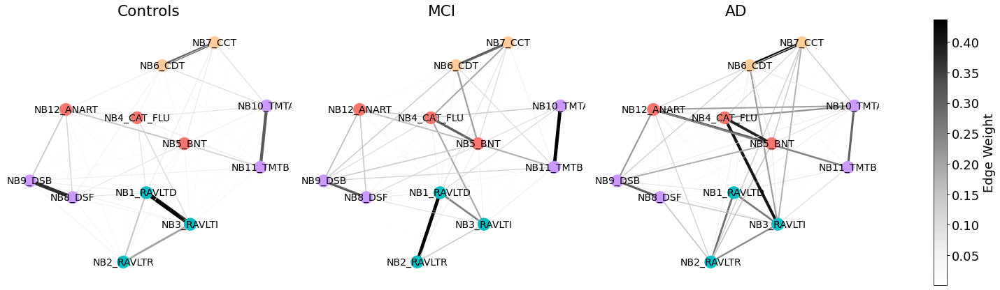

In [196]:
#Node labels
NEUROBAT_labels = {} #create empty dictionary

for i in range(NEUROBAT_CN_mx.shape[1]):
    NEUROBAT_labels[i] = NEUROBAT_CN_mx.columns[i]


#fix position
pos_NEUROBAT=nx.spring_layout(NEUROBAT_CN_graph, weight='weight', seed=0)

draw_graph(graphs_ls, NEUROBAT_labels, pos_NEUROBAT, 'NEUROBAT')

#### 6.3. Draw graph

#### Edges weights

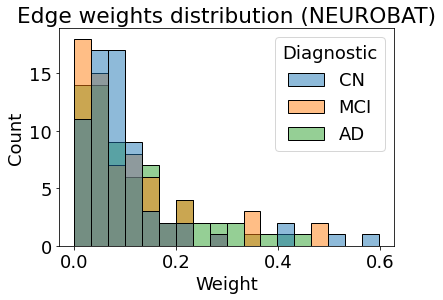

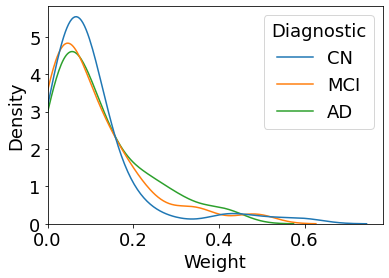

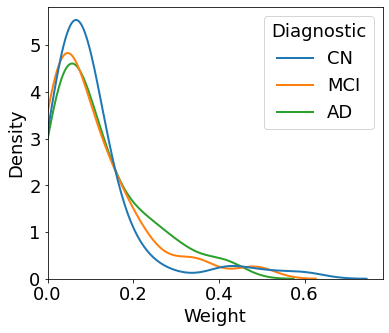

In [197]:
#Create dataframe with weights
weights_df_CN = pd.DataFrame(list(nx.get_edge_attributes(NEUROBAT_CN_graph,'weight').values()), columns=["Weight"])
weights_df_CN['Diagnostic'] = "CN"
weights_df_MCI = pd.DataFrame(list(nx.get_edge_attributes(NEUROBAT_MCI_graph,'weight').values()), columns=["Weight"])
weights_df_MCI['Diagnostic'] = "MCI"
weights_df_AD = pd.DataFrame(list(nx.get_edge_attributes(NEUROBAT_AD_graph,'weight').values()), columns=["Weight"])
weights_df_AD['Diagnostic'] = "AD"

#merge all
weights_df = pd.concat([weights_df_CN, weights_df_MCI, weights_df_AD], ignore_index=True)

#plot histogram
sns.histplot(data=weights_df, x="Weight", hue="Diagnostic")
plt.title("Edge weights distribution (NEUROBAT)")
plt.savefig("./Results/Figures/Weights/NEUROBAT_weights.svg", format="svg")
plt.show()

#plot kernel density
sns.kdeplot(data=weights_df, x="Weight", hue="Diagnostic", common_norm=False,
           clip=(0.0, 1.0))
plt.xlim(left=0)
#plt.title("NEUROBAT")
fig = plt.figure(figsize=(6,5))
kd= sns.kdeplot(data=weights_df, x="Weight", hue="Diagnostic", common_norm=False,
           clip=(0.0, 1.0), linewidth = 2)
plt.xlim(left=0)

plt.savefig("./Results/Figures/Weights/NEUROBAT_weights_KD.png", format="png")
plt.show()

In [198]:
### Kolmogorov-Smirnov test
print("Kolmogorov-Smirnov test CN-MCI: ", stats.kstest(weights_df_CN['Weight'].values.tolist(), weights_df_MCI['Weight'].values.tolist()))
print("Kolmogorov-Smirnov test CN-AD: ", stats.kstest(weights_df_CN['Weight'].values.tolist(), weights_df_AD['Weight'].values.tolist()))
print("Kolmogorov-Smirnov test MCI-AD: ", stats.kstest(weights_df_MCI['Weight'].values.tolist(), weights_df_AD['Weight'].values.tolist()))

#Mann Whitney test
print("U test CN-MCI: ",stats.mannwhitneyu(weights_df_CN['Weight'].values.tolist(), weights_df_MCI['Weight'].values.tolist()))
print("U test CN-AD: ", stats.mannwhitneyu(weights_df_CN['Weight'].values.tolist(), weights_df_AD['Weight'].values.tolist()))
print("U test MCI-AD: ", stats.mannwhitneyu(weights_df_MCI['Weight'].values.tolist(), weights_df_AD['Weight'].values.tolist()))

Kolmogorov-Smirnov test CN-MCI:  KstestResult(statistic=0.13636363636363635, pvalue=0.5750385721808544, statistic_location=0.022337083549985166, statistic_sign=-1)
Kolmogorov-Smirnov test CN-AD:  KstestResult(statistic=0.18181818181818182, pvalue=0.22641515752114558, statistic_location=0.11947224067951036, statistic_sign=1)
Kolmogorov-Smirnov test MCI-AD:  KstestResult(statistic=0.13636363636363635, pvalue=0.5750385721808544, statistic_location=0.050171289654192555, statistic_sign=1)
U test CN-MCI:  MannwhitneyuResult(statistic=2236.0, pvalue=0.7935597146453353)
U test CN-AD:  MannwhitneyuResult(statistic=1982.0, pvalue=0.37360054456596514)
U test MCI-AD:  MannwhitneyuResult(statistic=1948.0, pvalue=0.29625955474537)


## 7. NETWORK ANALYSIS

#### 1. CENTRALITY MEASURES

#### Degree Centrality

In network analysis, measures of the importance of nodes are referred to as **centrality** measures. **Degree** is the simplest and the most common way of finding important nodes. A node’s degree is the sum of its edges between all the possible connections. This is the centrality measure used in the epilepsy paper. 

#### Other centrality measures

- **Closeness centrality**: is a way of detecting nodes that are able to spread information very efficiently through a graph. The closeness centrality of a node measures its average farness (inverse distance) to all other nodes. 
- **Eigenvector centrality**: is a kind of extension of degree—it looks at a combination of a node’s edges and the edges of that node’s neighbors. Eigenvector centrality cares if you are a hub, but it also cares how many hubs you are connected to. It’s calculated as a value from 0 to 1: the closer to one, the greater the centrality. Eigenvector centrality is useful for understanding which nodes can get information to many other nodes quickly. 
- **Betweenness centrality**: t doesn’t care about the number of edges any one node or set of nodes has. Betweenness centrality looks at all the shortest paths that pass through a particular node (see above). Betweenness centrality, which is also expressed on a scale of 0 to 1, is fairly good at finding nodes that connect two otherwise disparate parts of a network.

In [265]:
def centrality(graph,columns):
    
    """Function to compute a table with the different centrality measures for each node."""
    
    #compute edges distances based on weights
    g_distance_dict = {(e1, e2): 1/weight for e1, e2, weight in graph.edges(data='weight')}
    nx.set_edge_attributes(graph, g_distance_dict, 'distance')
    
    #DC = nx.degree_centrality(graph) #degree centrality
    #CC = nx.closeness_centrality(graph) #closeness centrality     
    DC = [graph.degree(n, weight='weight') for n in graph.nodes()] #degree centrality
    CC = nx.closeness_centrality(graph, distance='distance')
    EC = nx.eigenvector_centrality(graph, weight='weight') #eigenvector centrality
    #BC always interprets the weights as distances    
    BC = nx.betweenness_centrality(graph, weight='distance') #betweenness centrality
    
    
    centrality_df = pd.DataFrame() #create empty dataframe
    
    for node in BC:
        centrality_df.at[node, "Degree_Centrality"] = DC[node] / (len(DC) - 1)
        centrality_df.at[node, "Closeness_Centrality"] = CC[node] 
        centrality_df.at[node, "Eigenvector_Centrality"] = EC[node] 
        centrality_df.at[node, "Betweenness_Centrality"] = BC[node] 
    
    centrality_df.index = columns
        
    return centrality_df

In [266]:
### Plot degree centrality

def plot_centrality_top5(graph_CN, graph_MCI, graph_AD, columns, centrality_metric):
    #Compute centrality measures
    df_CN = centrality(graph_CN, columns)
    df_MCI = centrality(graph_MCI, columns)
    df_AD = centrality(graph_AD, columns)
    
    #Order dataframe by centrality
    df_CN = df_CN.sort_values(by=[centrality_metric],ascending = False)
    df_MCI = df_MCI.sort_values(by=[centrality_metric],ascending = False)
    df_AD = df_AD.sort_values(by=[centrality_metric],ascending = False)
    
    #Truncate table to show only top 5 tests by centrality measure
    top_CN = df_CN.iloc[0:5]
    top_MCI = df_MCI.iloc[0:5] 
    top_AD = df_AD.iloc[0:5] 
    
    #Plot 
    fig, ax = plt.subplots(1,3, figsize=(20,6))
    
    sns.barplot(ax=ax[0], x=top_CN.index, y=centrality_metric, data=top_CN, palette=['#1f77b4']) 
    sns.barplot(ax=ax[1], x=top_MCI.index, y=centrality_metric, data=top_MCI, palette=['#ff7f0e']) 
    sns.barplot(ax=ax[2], x=top_AD.index, y=centrality_metric, data=top_AD, palette=['#2ca02c']) 
    
    for i in range(3):
        ax[i].set_xlabel("Test")
    
    #add title to subfigures
    ax[0].title.set_text("Controls")
    ax[1].title.set_text("MCI")
    ax[2].title.set_text("AD")
    
    plt.show()

In [267]:
def plot_centrality(graph_CN, graph_MCI, graph_AD, columns, centrality_metric, battery_name):
    #Compute centrality measures
    df_CN = centrality(graph_CN, columns)
    df_MCI = centrality(graph_MCI, columns)
    df_AD = centrality(graph_AD, columns)
    
    #Order dataframe by centrality
    df_CN = df_CN.sort_values(by=[centrality_metric],ascending = False)
    df_MCI = df_MCI.sort_values(by=[centrality_metric],ascending = False)
    df_AD = df_AD.sort_values(by=[centrality_metric],ascending = False)
    
    
    #Plot 
    fig, ax = plt.subplots(1,3, figsize=(24,10))
    
    sns.barplot(ax=ax[0], x=centrality_metric, y=df_CN.index, data=df_CN, palette=['#1f77b4']) 
    sns.barplot(ax=ax[1], x=centrality_metric, y=df_MCI.index, data=df_MCI, palette=['#ff7f0e']) 
    sns.barplot(ax=ax[2], x=centrality_metric, y=df_AD.index, data=df_AD, palette=['#2ca02c']) 
    
    for i in range(3):
        ax[i].set_ylabel("Test")
    
    #add title to subfigures
    ax[0].title.set_text("Controls")
    ax[1].title.set_text("MCI")
    ax[2].title.set_text("AD")
        
    filename = "./Results_weights/Figures/Metrics/" + centrality_metric + "_" + battery_name + ".svg"
    plt.savefig(filename, format="svg")
    
    plt.show()

In [268]:
#print(sns.color_palette().as_hex()[0])
#print(sns.color_palette().as_hex()[1])
#print(sns.color_palette().as_hex()[2])

#### 2. GLOBAL METRICS

#### Average clustering coefficient

In graph theory, a **clustering coefficient** is a measure of the degree to which nodes in a graph tend to cluster together. Two versions of this measure exist: the global and the local. The global version was designed to give an overall indication of the clustering in the network, whereas the local gives an indication of the embeddedness of single nodes. In this work we are computing **global measures**.

The clustering coefficient for the graph is the average,

$$
    C = \frac{1}{n}\sum_{v \in G}c_v
$$

where $n$ is the number of nodes in the graph $G$.

#### Global efficiency

The **efficiency** of a pair of nodes in a graph is the multiplicative inverse of the shortest path distance between the nodes. The average global efficiency of a graph is the average efficiency of all pairs of nodes. Edge weights are ignored when computing the shortest path distances.

Note than in the epilepsy paper they computed *normalized global efficiencies*.

#### Global measures summary

The following global metrics are going to be computed:

- **Number of nodes ($V$)**: number of entities
- **Number of edges ($E$)**: pairs of connected entities
- **Diameter**: the diameter of a graph is definded as the largest shortest path distance in the graph. It is the maximum value of $d(u,v)$ overf all $u,v$ pairs, where $d(u,v)$ denotes the shortest path distance from vertex $u$ to vertex $v$.
- **Density**: it is the ratio of actual edges in the network to all possible connections between the entities of the network. Network density gives you a quick sense of how closely knit your network is. It is also know as the *sparsity* of the graph and ranges between 0 and 1. Low values would indicate a network with a few specific conexions, whereas high values are indicative of a low specificity. 

$$ \frac{2·\sum_{v \in V, u \in V, u\neq v} weight(u,v)}{|V|-|V-1|} $$

- **Average degree**: The average degree of an undirected graph is used to measure the number of edges compared to the number of nodes. To do this we simply divide the summation of all nodes' degree by the total number of nodes. 

- **Transitivity**: it is the ratio of all triangles over all possible triangles. So transitivity, like density, expresses how interconnected a graph is in terms of a ratio of actual over possible connections. 
- **Average clustering coefficient**: In graph theory, a clustering coefficient is a measure of the degree to which nodes in a graph tend to cluster together. The global clustering coefficient is based on triplets of nodes. The global clustering coefficient is the number of closed triplets (or 3 x triangles) over the total number of triplets (both open and closed). 
- **Global Efficiency**: In network science, the efficiency of a network is a measure of how efficiently it exchanges information and it is also called *communication efficiency*. The global efficiency is the average inverse shortest path length in the network. https://stackoverflow.com/questions/56554132/how-can-i-calculate-global-efficiency-more-efficiently 

$$E_{global(G)} = \frac{2}{n(n-1)}\sum_{i \neq j} \in (u_i, v_j)$$ 

where $\in_{i,j}=\frac{1}{d(i,j)}$

In [269]:
from itertools import permutations

def global_efficiency_weighted(G):
    """Function to compute global efficiency in a weighted graph"""
    n = len(G)
    denom = n * (n - 1)/2 
    if denom != 0:
        shortest_paths = dict(nx.all_pairs_dijkstra(G, weight = 'distance'))
        g_eff = sum(1./shortest_paths[u][0][v] if shortest_paths[u][0][v] !=0 else 0 for u, v in permutations(G, 2)) / denom
    else:
        g_eff = 0
    return g_eff

In [270]:
def global_metrics(graphs_ls):
    
    """Function to compute a table with some global metrics of the graphs. 
    It returns a pandas DataFrame object."""
    
    columns = ['NNodes', 'NEdges', 'Diameter', 'Density', 'AvDegree', 'Transitivity','AvCC', 'GE']
    index = ['CN', 'MCI', 'AD']
    
    df = pd.DataFrame(columns = columns,
                     index = index) #empty dataframe
    
    #GLOBAL METRICS
    
    for i in range(len(index)): 
        
        graph = graphs_ls[i]
        dx = index[i]
        
        #compute edges distances based on weights
        g_distance_dict = {(e1, e2): 1/weight for e1, e2, weight in graph.edges(data='weight')}
        nx.set_edge_attributes(graph, g_distance_dict, 'distance')
        
        df.loc[dx,'NNodes'] = graph.number_of_nodes() #number of nodes
        df.loc[dx,'NEdges'] = graph.number_of_edges() #number of edges
        #shortest = nx.shortest_path_length(graph, weight="weight") #matrix of shortest paths
        #ecc = nx.eccentricity(graph, sp=dict(shortest))
        #df.loc[dx,'Diameter'] = nx.diameter(graph, e=ecc) #diameter of graph
        shortest_paths=dict(nx.single_source_dijkstra(graph, source=1, weight='distance')[0])
        df.loc[dx,'Diameter'] = max(shortest_paths.values())
        #df.loc[dx,'Density'] = nx.density(graph) #density of graph
        nPossibleEdges = (graph.number_of_nodes()*(graph.number_of_nodes()-1))/2
        df.loc[dx, 'Density'] = graph.size(weight='weight')/ nPossibleEdges
        df.loc[dx,'AvDegree'] = sum(dict(graph.degree(weight='weight')).values())/graph.number_of_nodes() #average degree
        df.loc[dx,'Transitivity'] = nx.transitivity(graph) #transitivity of graph
        df.loc[dx,'AvCC'] = nx.average_clustering(graph,weight='weight') #average clustering coefficient
        #df.loc[dx,'AvGE'] = nx.global_efficiency(graph) #average global efficiency (shortest path)
        df.loc[dx,'GE'] = global_efficiency_weighted(graph)
    
    return df

In [271]:
def plot_global_metrics(gm, battery_name):
    """Function to plot global metrics."""

    fig, ax = plt.subplots(2, 3, figsize=(22,13))

    sns.barplot(ax=ax[0,0], x="index", y="NEdges", data=gm) 
    sns.barplot(ax=ax[0,1], x="index", y="Diameter", data=gm)
    sns.barplot(ax=ax[0,2], x="index", y="Density", data=gm) 
    sns.barplot(ax=ax[1,0], x="index", y="AvDegree", data=gm) 
    sns.barplot(ax=ax[1,1], x="index", y="AvCC", data=gm)
    sns.barplot(ax=ax[1,2], x="index", y="GE",  data=gm)

    fig.suptitle("Global metrics (" + battery_name +")", fontsize=20)

    rows, cols = 2, 3
    for i in range(rows):
        for j in range(cols):
            ax[i, j].set_xlabel('Diagnostic group')
    
    filename = "./Results_weights/Figures/Metrics/GlobalMetrics_"+ battery_name + ".svg"
    plt.savefig(filename, format="svg")

    plt.show()

#### 3. BOOTSTRAP (¿BAGGING?)

As we only have one graph for each group, it is difficult to compare the metrics obtained. Thus, we are going to perform kind of a non-parametric bootstrap to generate random samples with replacement, which means that it is possible to select the same element from the sample more than once. 

In [301]:
def global_metrics_single_graph(graph, gm_df, i):
    """Function to compute a table with some global metrics of the graphs. 
    It returns a pandas DataFrame object."""
    
    #compute edges distances based on weights
    g_distance_dict = {(e1, e2): 1/weight for e1, e2, weight in graph.edges(data='weight')}
    nx.set_edge_attributes(graph, g_distance_dict, 'distance')
    
    #compute global metrics
    shortest = nx.shortest_path_length(graph, weight="distance") #matrix of shortest paths
    ecc = nx.eccentricity(graph, sp=dict(shortest))
    gm_df.iloc[i,0] = nx.diameter(graph, e=ecc)
    nPossibleEdges = (graph.number_of_nodes()*(graph.number_of_nodes()-1))/2
    gm_df.iloc[i,1] = graph.size(weight='weight')/ nPossibleEdges
    gm_df.iloc[i,2] = sum(dict(graph.degree(weight='weight')).values())/graph.number_of_nodes()
    gm_df.iloc[i,3] = nx.average_clustering(graph,weight='weight')
    gm_df.iloc[i,4] = global_efficiency_weighted(graph)
    
    return gm_df

In [332]:
def centrality_metrics_single_graph(graph, dc_df, bc_df, i):
    """Function to compute a table with central metrics for each node of the graphs. 
    It returns a pandas DataFrame object."""
    
    #compute edges distances based on weights
    g_distance_dict = {(e1, e2): 1/weight for e1, e2, weight in graph.edges(data='weight')}
    nx.set_edge_attributes(graph, g_distance_dict, 'distance')
    
    BC = nx.betweenness_centrality(graph, weight='distance') #betweenness centrality
    
    for node in graph.nodes():
        dc_df.iloc[i,node] = graph.degree(node, weight='weight')/(len(graph.nodes())-1) #degree centrality
        bc_df.iloc[i,node] = BC[node]
        
    return dc_df, bc_df

In [333]:
def bootstrap(X,n_size,n_rep):
    
    #Table to store global metrics
    gm_columns = ['Diameter', 'Density', 'AvDegree', 'AvCC', 'GE']
    gm_index = range(n_rep)
    gm_df = pd.DataFrame(columns = gm_columns, index = gm_index) #empty dataframe to store global metrics
    
    #Tables to store central metrics
    cm_columns = range(X.shape[1])
    cm_index = range(n_rep)
    
    dc_df = pd.DataFrame(columns = cm_columns, index = cm_index) #degree centrality
    bc_df = pd.DataFrame(columns = cm_columns, index = cm_index) #betweenness centrality
    
    for i in range(n_rep):
        print("Running repetition ", i, "...")
        #random sampling with replacement
        #x = np.random.choice(sample, size=100, replace=True)
        sample = X.sample(n = n_size, replace = True)
        #generate adjacency matrix
        mx = par_corr(sample)
        #generate graph
        graph = cognitive_network(mx, threshold=None, X=X, metadata_path=metadata_path)
        #compute global metrics
        gm_df = global_metrics_single_graph(graph, gm_df, i)
        #compute local metrics
        dc_df, bc_df = centrality_metrics_single_graph(graph, dc_df, bc_df, i)

    return gm_df, dc_df, bc_df

Now we are going to define the functions necessary to perform a **permutation test** on the data. This test will be used to compare the metrics computed for the 3 groups. We need a function to define the statistic that we want to use for the permutation test. 

In [334]:
def statistic(x,y):
    return np.mean(x,axis=0) - np.mean(y,axis=0)

In [335]:
def permutation_test(x, y, alternative='two-sided', num_permutations=10000, random_seed=None):
    """
    Performs a permutation test to compare two samples.

    Parameters:
    - x (array-like): The first sample.
    - y (array-like): The second sample.
    - altenative (str): The alternative hypothesis. Valid values are 'two-sided' (default), 'greater' or 'less'.
    - num_permutations (int): The number of permutations to use.
    - random_seed (int): The random seed to use.

    Returns:
    p-value (float): The p-value of the test.
    """

    # Set the random seed, if provided
    if random_seed is not None:
        np.random.seed(random_seed)

    # Concatenate the samples
    combined = np.concatenate([x, y])

    # Compute the observed test statistic
    obs_stat = statistic(x, y)

    # Initialize an array to store the permutation test statistics
    perm_stats = np.zeros(num_permutations)

    # Perform the permutations
    for i in range(num_permutations):
        # Shuffle the combined array
        shuffled = np.random.permutation(combined)

        # Split the shuffled array into two samples
        perm_sample1 = shuffled[:len(x)]
        perm_sample2 = shuffled[len(y):]

        # Compute the permutation test statistic
        perm_stats[i] = statistic(perm_sample1, perm_sample2)

    # Compute the p-value based on the alternative hypothesis
    if alternative == 'two-sided':
        p_value = np.sum(np.abs(perm_stats) >= np.abs(obs_stat)) / num_permutations
    elif alternative == 'greater':
        p_value = np.sum(perm_stats >= obs_stat) / num_permutations
    elif alternative == 'less':
        p_value = np.sum(perm_stats <= obs_stat) / num_permutations
    else:
        raise ValueError("Invalid alternative hypothesis. Valid values are 'two-sided', 'greater' or 'less'.")

    return obs_stat, p_value

In [336]:
from itertools import permutations
from statsmodels.stats.multitest import multipletests

def permutation_test_results(sample_ls, metric, threshold):
    """
    Computes a table with the results of the permutation tests.

    Parameters:
    - sample_list (array-like): Contains all the dataframes with the metrics computed for each dx group
    - metric (sr): The metric type. Valid values are 'global' and 'local'
    - altenative (str): The alternative hypothesis. Valid values are 'two-sided' (default), 'greater' or 'less'.
    - threshold (float): pvalue threshold
    """

    dx_ls = ['CN', 'MCI', 'AD'] #diagnostic groups
    comp_pairs = list(permutations([0,1,2],2)) #get all possible pairs of comparisons
    
    if metric == 'global': 
        gm_pt = pd.DataFrame(columns = ['Measure', 'Sample1', 'Sample2', 'Statistic', 'p_value'], 
                    index = list(range(len(comp_pairs)*sample_ls[0].shape[1]))) #dataframe to store permutation test results
        
        i=0
        for gm in sample_ls[0].columns:
            for pair in comp_pairs:
                (sample1_idx, sample2_idx) = pair
                sample1 = sample_ls[sample1_idx][gm]
                sample2 = sample_ls[sample2_idx][gm]
                #permutation test
                stat, p_value = permutation_test(sample1.values.tolist(), sample2.values.tolist(),alternative='greater', random_seed=0)
                #store results in dataframe
                gm_pt.loc[i, 'Measure'] = gm
                gm_pt.loc[i, 'Sample1'] = dx_ls[sample1_idx]
                gm_pt.loc[i, 'Sample2'] = dx_ls[sample2_idx]
                gm_pt.loc[i, 'Statistic'] = stat
                gm_pt.loc[i, 'p_value'] = p_value
                i += 1
                
        #Adjust p-value for multiple comparisons using the Benjamini-Hochberg FDR
        gm_pt['p_adjusted'] = multipletests(gm_pt['p_value'], method="fdr_bh")[1]
                
        return gm_pt[gm_pt['p_adjusted']<=threshold]

In [337]:
#stats.ttest_ind(ADAS_AD_gm_bt['Diameter'].values.tolist(), ADAS_CN_gm_bt['Diameter'].values.tolist(), 
#                axis=0, equal_var=False, permutations=99999, random_state=0, alternative='greater')

### 7.1. ADAS-Cog

#### 7.1.1. CENTRALITY MEASURES

In [338]:
print("Controls----------------------------------")
CM_ADAS_CN = centrality(ADAS_CN_graph, ADAS_columns)
CM_ADAS_CN.to_csv("./Results_weights/ADAS/CM_CN.csv", sep=";")
display(CM_ADAS_CN)
print("MCI----------------------------------")
CM_ADAS_MCI = centrality(ADAS_MCI_graph, ADAS_columns)
CM_ADAS_MCI.to_csv("./Results_weights/ADAS/CM_MCI.csv", sep=";")
display(CM_ADAS_MCI)
print("AD----------------------------------")
CM_ADAS_AD = centrality(ADAS_AD_graph, ADAS_columns)
CM_ADAS_AD.to_csv("./Results_weights/ADAS/CM_AD.csv", sep=";")
display(CM_ADAS_AD)

Controls----------------------------------


,Degree_Centrality,Closeness_Centrality,Eigenvector_Centrality,Betweenness_Centrality
Q1_WR,0.099738,0.065590,0.603263,0.166667
Q2_Comm,0.024346,0.032560,0.099419,0.000000
Q3_CP,0.034717,0.046203,0.141428,0.000000
Q4_DWR,0.102371,0.065044,0.609129,0.212121
Q5_NT,0.044582,0.047486,0.137516,0.060606
Q6_IP,0.027983,0.034276,0.090055,0.000000
Q7_O,0.031631,0.040809,0.130322,0.015152
Q8_WRT,0.048128,0.055486,0.266474,0.015152
Q9_RTI,0.045090,0.049244,0.145444,0.060606
Q10_Comp,0.052997,0.057568,0.211993,0.136364


MCI----------------------------------


,Degree_Centrality,Closeness_Centrality,Eigenvector_Centrality,Betweenness_Centrality
Q1_WR,0.172197,0.154277,0.476811,0.500000
Q2_Comm,0.100984,0.112314,0.290831,0.000000
Q3_CP,0.063655,0.086146,0.177552,0.000000
Q4_DWR,0.149511,0.130388,0.435236,0.287879
Q5_NT,0.066483,0.088253,0.180600,0.000000
Q6_IP,0.068539,0.082749,0.180883,0.015152
Q7_O,0.046175,0.085032,0.152833,0.000000
Q8_WRT,0.076281,0.098389,0.257617,0.000000
Q9_RTI,0.083777,0.086745,0.212806,0.000000
Q10_Comp,0.089335,0.091961,0.222003,0.060606


AD----------------------------------


,Degree_Centrality,Closeness_Centrality,Eigenvector_Centrality,Betweenness_Centrality
Q1_WR,0.123949,0.122253,0.342086,0.196970
Q2_Comm,0.087474,0.098345,0.249611,0.030303
Q3_CP,0.087589,0.094395,0.259019,0.015152
Q4_DWR,0.094256,0.103698,0.278127,0.030303
Q5_NT,0.069360,0.080079,0.203376,0.000000
Q6_IP,0.096507,0.106563,0.261051,0.106061
Q7_O,0.071593,0.094923,0.200398,0.015152
Q8_WRT,0.092111,0.102177,0.266142,0.015152
Q9_RTI,0.094788,0.090289,0.281732,0.075758
Q10_Comp,0.076146,0.086321,0.235123,0.000000


#### Plot centrality metrics

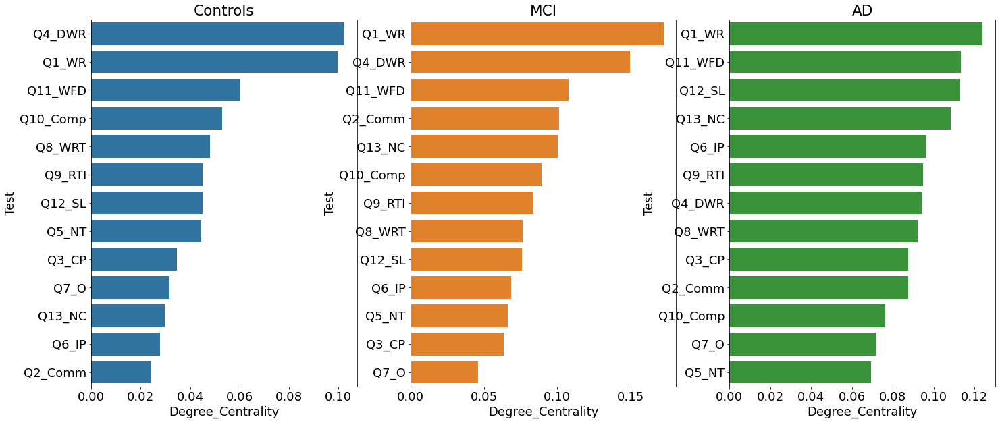

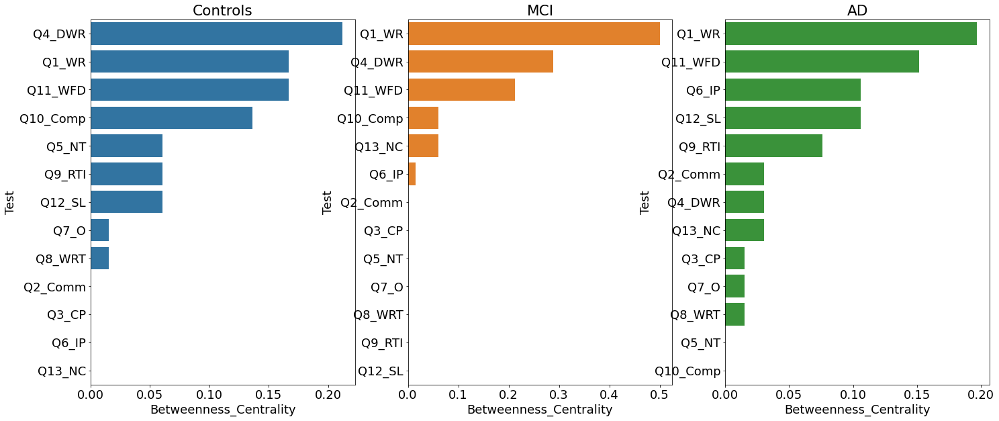

In [339]:
plot_centrality(ADAS_CN_graph, ADAS_MCI_graph, ADAS_AD_graph, ADAS_columns, "Degree_Centrality", 'ADAS')
plot_centrality(ADAS_CN_graph, ADAS_MCI_graph, ADAS_AD_graph, ADAS_columns, "Betweenness_Centrality", 'ADAS')

#### Relation between node degree and betweenness centrality

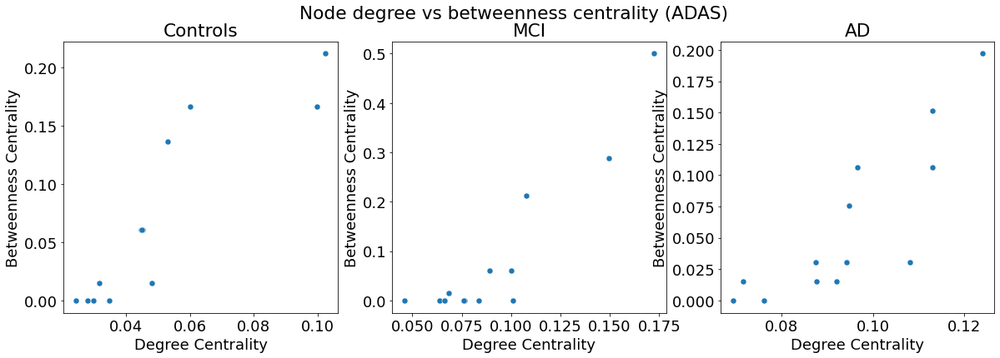

In [340]:
#Get centrality metrics table
ADAS_CN_centrality = centrality(ADAS_CN_graph, ADAS_columns)
ADAS_MCI_centrality = centrality(ADAS_MCI_graph, ADAS_columns)
ADAS_AD_centrality = centrality(ADAS_AD_graph, ADAS_columns)

#Plot
fig, axes = plt.subplots(1,3, figsize=(20,6))


sns.scatterplot(ax=axes[0],data=ADAS_CN_centrality, x="Degree_Centrality", y="Betweenness_Centrality", s=50)
sns.scatterplot(ax=axes[1],data=ADAS_MCI_centrality, x="Degree_Centrality", y="Betweenness_Centrality", s=50)
sns.scatterplot(ax=axes[2],data=ADAS_AD_centrality, x="Degree_Centrality", y="Betweenness_Centrality", s=50)

#labels
axes[0].set_ylabel("Betweenness Centrality")
axes[1].set_ylabel("Betweenness Centrality")
axes[2].set_ylabel("Betweenness Centrality")
axes[0].set_xlabel("Degree Centrality")
axes[1].set_xlabel("Degree Centrality")
axes[2].set_xlabel("Degree Centrality")

#add title
fig.suptitle('Node degree vs betweenness centrality (ADAS)')

#add title to subfigures
axes[0].title.set_text("Controls")
axes[1].title.set_text("MCI")
axes[2].title.set_text("AD")

plt.savefig("./Results_weights/Figures/Metrics/BCvsDG_ADAS.svg", format="svg")
plt.show()

#### 7.1.2. GLOBAL METRICS

In [341]:
ADAS_gm = global_metrics([ADAS_CN_graph, ADAS_MCI_graph, ADAS_AD_graph])
ADAS_gm.reset_index(inplace=True)
ADAS_gm

,index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,GE
0,CN,13,78,48.026942,0.049727,0.596719,1.0,0.049668,0.13235
1,MCI,13,78,12.296013,0.092385,1.108621,1.0,0.149361,0.241067
2,AD,13,78,15.714976,0.094471,1.133648,1.0,0.177877,0.234315


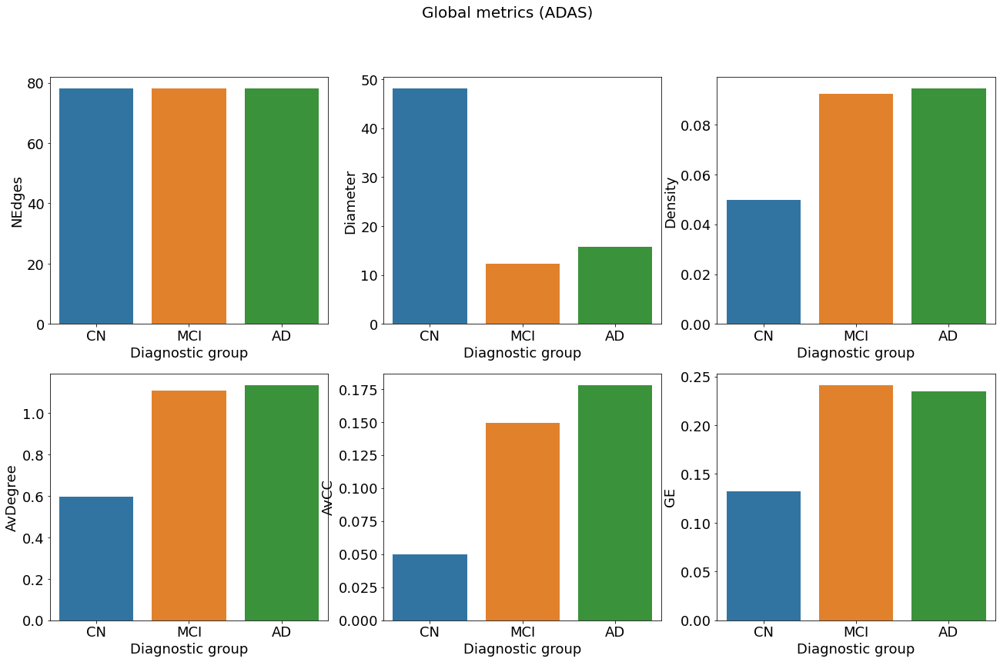

In [342]:
plot_global_metrics(ADAS_gm, 'ADAS')

#### 7.1.3. BOOTSTRAP

In [343]:
ADAS_CN_gm_bt, ADAS_CN_dc_bt, ADAS_CN_bc_bt = bootstrap(X_ADAS_CN,n_size=500,n_rep=250)
ADAS_MCI_gm_bt, ADAS_MCI_dc_bt, ADAS_MCI_bc_bt = bootstrap(X_ADAS_MCI,n_size=500,n_rep=250)
ADAS_AD_gm_bt, ADAS_AD_dc_bt, ADAS_AD_bc_bt = bootstrap(X_ADAS_AD,n_size=500,n_rep=250)

Running repetition  0 ...
Total number of negative correlations:  0
Running repetition  1 ...
Total number of negative correlations:  1
Running repetition  2 ...
Total number of negative correlations:  2
Running repetition  3 ...
Total number of negative correlations:  2
Running repetition  4 ...
Total number of negative correlations:  1
Running repetition  5 ...
Total number of negative correlations:  0
Running repetition  6 ...
Total number of negative correlations:  2
Running repetition  7 ...
Total number of negative correlations:  2
Running repetition  8 ...
Total number of negative correlations:  0
Running repetition  9 ...
Total number of negative correlations:  3
Running repetition  10 ...
Total number of negative correlations:  1
Running repetition  11 ...
Total number of negative correlations:  1
Running repetition  12 ...
Total number of negative correlations:  4
Running repetition  13 ...
Total number of negative correlations:  1
Running repetition  14 ...
Total number of n

Total number of negative correlations:  2
Running repetition  120 ...
Total number of negative correlations:  0
Running repetition  121 ...
Total number of negative correlations:  2
Running repetition  122 ...
Total number of negative correlations:  2
Running repetition  123 ...
Total number of negative correlations:  2
Running repetition  124 ...
Total number of negative correlations:  0
Running repetition  125 ...
Total number of negative correlations:  1
Running repetition  126 ...
Total number of negative correlations:  1
Running repetition  127 ...
Total number of negative correlations:  0
Running repetition  128 ...
Total number of negative correlations:  2
Running repetition  129 ...
Total number of negative correlations:  1
Running repetition  130 ...
Total number of negative correlations:  4
Running repetition  131 ...
Total number of negative correlations:  2
Running repetition  132 ...
Total number of negative correlations:  1
Running repetition  133 ...
Total number of nega

Total number of negative correlations:  0
Running repetition  238 ...
Total number of negative correlations:  2
Running repetition  239 ...
Total number of negative correlations:  3
Running repetition  240 ...
Total number of negative correlations:  4
Running repetition  241 ...
Total number of negative correlations:  4
Running repetition  242 ...
Total number of negative correlations:  2
Running repetition  243 ...
Total number of negative correlations:  3
Running repetition  244 ...
Total number of negative correlations:  2
Running repetition  245 ...
Total number of negative correlations:  2
Running repetition  246 ...
Total number of negative correlations:  4
Running repetition  247 ...
Total number of negative correlations:  2
Running repetition  248 ...
Total number of negative correlations:  1
Running repetition  249 ...
Total number of negative correlations:  2
Running repetition  0 ...
Total number of negative correlations:  6
Running repetition  1 ...
Total number of negative

Running repetition  107 ...
Total number of negative correlations:  9
Running repetition  108 ...
Total number of negative correlations:  9
Running repetition  109 ...
Total number of negative correlations:  8
Running repetition  110 ...
Total number of negative correlations:  11
Running repetition  111 ...
Total number of negative correlations:  9
Running repetition  112 ...
Total number of negative correlations:  10
Running repetition  113 ...
Total number of negative correlations:  8
Running repetition  114 ...
Total number of negative correlations:  6
Running repetition  115 ...
Total number of negative correlations:  10
Running repetition  116 ...
Total number of negative correlations:  7
Running repetition  117 ...
Total number of negative correlations:  8
Running repetition  118 ...
Total number of negative correlations:  7
Running repetition  119 ...
Total number of negative correlations:  8
Running repetition  120 ...
Total number of negative correlations:  7
Running repetitio

Total number of negative correlations:  7
Running repetition  225 ...
Total number of negative correlations:  6
Running repetition  226 ...
Total number of negative correlations:  10
Running repetition  227 ...
Total number of negative correlations:  9
Running repetition  228 ...
Total number of negative correlations:  9
Running repetition  229 ...
Total number of negative correlations:  8
Running repetition  230 ...
Total number of negative correlations:  8
Running repetition  231 ...
Total number of negative correlations:  11
Running repetition  232 ...
Total number of negative correlations:  7
Running repetition  233 ...
Total number of negative correlations:  5
Running repetition  234 ...
Total number of negative correlations:  11
Running repetition  235 ...
Total number of negative correlations:  6
Running repetition  236 ...
Total number of negative correlations:  9
Running repetition  237 ...
Total number of negative correlations:  8
Running repetition  238 ...
Total number of n

Total number of negative correlations:  5
Running repetition  94 ...
Total number of negative correlations:  3
Running repetition  95 ...
Total number of negative correlations:  5
Running repetition  96 ...
Total number of negative correlations:  4
Running repetition  97 ...
Total number of negative correlations:  5
Running repetition  98 ...
Total number of negative correlations:  11
Running repetition  99 ...
Total number of negative correlations:  2
Running repetition  100 ...
Total number of negative correlations:  6
Running repetition  101 ...
Total number of negative correlations:  8
Running repetition  102 ...
Total number of negative correlations:  6
Running repetition  103 ...
Total number of negative correlations:  6
Running repetition  104 ...
Total number of negative correlations:  5
Running repetition  105 ...
Total number of negative correlations:  5
Running repetition  106 ...
Total number of negative correlations:  6
Running repetition  107 ...
Total number of negative 

Total number of negative correlations:  4
Running repetition  212 ...
Total number of negative correlations:  4
Running repetition  213 ...
Total number of negative correlations:  4
Running repetition  214 ...
Total number of negative correlations:  7
Running repetition  215 ...
Total number of negative correlations:  4
Running repetition  216 ...
Total number of negative correlations:  7
Running repetition  217 ...
Total number of negative correlations:  5
Running repetition  218 ...
Total number of negative correlations:  4
Running repetition  219 ...
Total number of negative correlations:  6
Running repetition  220 ...
Total number of negative correlations:  4
Running repetition  221 ...
Total number of negative correlations:  4
Running repetition  222 ...
Total number of negative correlations:  5
Running repetition  223 ...
Total number of negative correlations:  4
Running repetition  224 ...
Total number of negative correlations:  5
Running repetition  225 ...
Total number of nega

In [344]:
#Store results
ADAS_CN_gm_bt.to_csv("./Results_weights/Bootstrap_gm_results/ADAS/CN.csv", index=False)
ADAS_MCI_gm_bt.to_csv("./Results_weights/Bootstrap_gm_results/ADAS/MCI.csv", index=False) 
ADAS_AD_gm_bt.to_csv("./Results_weights/Bootstrap_gm_results/ADAS/AD.csv", index=False)
ADAS_CN_dc_bt.to_csv("./Results_weights/Bootstrap_dc_results/ADAS/CN.csv", index=False)
ADAS_MCI_dc_bt.to_csv("./Results_weights/Bootstrap_dc_results/ADAS/MCI.csv", index=False) 
ADAS_AD_dc_bt.to_csv("./Results_weights/Bootstrap_dc_results/ADAS/AD.csv", index=False)
ADAS_CN_bc_bt.to_csv("./Results_weights/Bootstrap_bc_results/ADAS/CN.csv", index=False)
ADAS_MCI_bc_bt.to_csv("./Results_weights/Bootstrap_bc_results/ADAS/MCI.csv", index=False) 
ADAS_AD_bc_bt.to_csv("./Results_weights/Bootstrap_bc_results/ADAS/AD.csv", index=False) 

#### Permutation tests

In [345]:
ADAS_gm_sig = permutation_test_results(sample_ls=[ADAS_CN_gm_bt, ADAS_MCI_gm_bt, ADAS_AD_gm_bt], 
                                      metric='global', threshold=0.01)
ADAS_gm_sig

,Measure,Sample1,Sample2,Statistic,p_value,p_adjusted
0,Diameter,CN,MCI,12.149948,0.0,0.0
1,Diameter,CN,AD,12.945139,0.0,0.0
3,Diameter,MCI,AD,0.795191,0.0,0.0
8,Density,MCI,CN,0.033133,0.0,0.0
10,Density,AD,CN,0.034724,0.0,0.0
11,Density,AD,MCI,0.00159,0.0,0.0
14,AvDegree,MCI,CN,0.397596,0.0,0.0
16,AvDegree,AD,CN,0.416682,0.0,0.0
17,AvDegree,AD,MCI,0.019086,0.0,0.0
20,AvCC,MCI,CN,0.090003,0.0,0.0


### 7.2. MMSE

#### 7.2.1. CENTRALITY MEASURES

In [ ]:
print("Controls----------------------------------")
CM_MMSE_CN = centrality(MMSE_CN_graph, MMSE_columns)
CM_MMSE_CN.to_csv("./Results/MMSE/CM_CN.csv", sep=";")
display(CM_MMSE_CN)
print("MCI----------------------------------")
CM_MMSE_MCI = centrality(MMSE_MCI_graph, MMSE_columns)
CM_MMSE_MCI.to_csv("./Results/MMSE/CM_MCI.csv", sep=";")
display(CM_MMSE_MCI)
print("AD----------------------------------")
CM_MMSE_AD = centrality(MMSE_AD_graph, MMSE_columns)
CM_MMSE_AD.to_csv("./Results/MMSE/CM_AD.csv", sep=";")
display(CM_MMSE_AD)

#### Plot centrality metrics

In [ ]:
plot_centrality(MMSE_CN_graph, MMSE_MCI_graph, MMSE_AD_graph, MMSE_columns, "Degree_Centrality", 'MMSE')
plot_centrality(MMSE_CN_graph, MMSE_MCI_graph, MMSE_AD_graph, MMSE_columns, "Betweenness_Centrality", 'MMSE')

#### Relation between node degree and betweenness centrality

In [ ]:
#Get centrality metrics table
MMSE_CN_centrality = centrality(MMSE_CN_graph, MMSE_columns)
MMSE_MCI_centrality = centrality(MMSE_MCI_graph, MMSE_columns)
MMSE_AD_centrality = centrality(MMSE_AD_graph, MMSE_columns)

#Plot
fig, axes = plt.subplots(1,3, figsize=(20,6))


sns.scatterplot(ax=axes[0],data=MMSE_CN_centrality, x="Degree_Centrality", y="Betweenness_Centrality", s=50)
sns.scatterplot(ax=axes[1],data=MMSE_MCI_centrality, x="Degree_Centrality", y="Betweenness_Centrality", s=50)
sns.scatterplot(ax=axes[2],data=MMSE_AD_centrality, x="Degree_Centrality", y="Betweenness_Centrality", s=50)

#labels
axes[0].set_ylabel("Betweenness Centrality")
axes[1].set_ylabel("Betweenness Centrality")
axes[2].set_ylabel("Betweenness Centrality")
axes[0].set_xlabel("Degree Centrality")
axes[1].set_xlabel("Degree Centrality")
axes[2].set_xlabel("Degree Centrality")

#add title
fig.suptitle('Node degree vs betweenness centrality (MMSE)')

#add title to subfigures
axes[0].title.set_text("Controls")
axes[1].title.set_text("MCI")
axes[2].title.set_text("AD")

plt.savefig("./Results/Figures/Metrics/BCvsDG_MMSE.svg", format="svg")
plt.show()

#### 7.1.2. GLOBAL METRICS

In [ ]:
MMSE_gm = global_metrics([MMSE_CN_graph, MMSE_MCI_graph, MMSE_AD_graph])
MMSE_gm.reset_index(inplace=True)
MMSE_gm

In [ ]:
plot_global_metrics(MMSE_gm, 'MMSE')

#### 7.2.3. BOOTSTRAP

In [ ]:
MMSE_CN_gm_bt, MMSE_CN_dc_bt, MMSE_CN_bc_bt = bootstrap(X_MMSE_CN,n_size=500,n_rep=250)
MMSE_MCI_gm_bt, MMSE_MCI_dc_bt, MMSE_MCI_bc_bt = bootstrap(X_MMSE_MCI,n_size=500,n_rep=250)
MMSE_AD_gm_bt, MMSE_AD_dc_bt, MMSE_AD_bc_bt = bootstrap(X_MMSE_AD,n_size=500,n_rep=250)

#### Permutation tests

In [ ]:
MMSE_gm_sig = permutation_test_results(sample_ls=[MMSE_CN_gm_bt, MMSE_MCI_gm_bt, MMSE_AD_gm_bt], 
                                      metric='global', threshold=0.01)
MMSE_gm_sig

### 7.3. MoCA

#### 7.1.1. CENTRALITY MEASURES

In [346]:
print("Controls----------------------------------")
CM_MOCA_CN = centrality(MOCA_CN_graph, MOCA_columns)
CM_MOCA_CN.to_csv("./Results_weights/MOCA/CM_CN.csv", sep=";")
display(CM_MOCA_CN)
print("MCI----------------------------------")
CM_MOCA_MCI = centrality(MOCA_MCI_graph, MOCA_columns)
CM_MOCA_MCI.to_csv("./Results_weights/MOCA/CM_MCI.csv", sep=";")
display(CM_MOCA_MCI)
print("AD----------------------------------")
CM_MOCA_AD = centrality(MOCA_AD_graph, MOCA_columns)
CM_MOCA_AD.to_csv("./Results_weights/MOCA/CM_AD.csv", sep=";")
display(CM_MOCA_AD)

Controls----------------------------------


,Degree_Centrality,Closeness_Centrality,Eigenvector_Centrality,Betweenness_Centrality
Mo1_TMT,0.044065,0.050351,0.228527,0.009524
Mo2_CC,0.053979,0.057798,0.264961,0.038095
Mo3_CDT,0.052623,0.057402,0.264016,0.057143
Mo4_NT,0.050588,0.057421,0.259013,0.076190
Mo5_WRT1,0.074376,0.062900,0.362305,0.104762
Mo6_WRT2,0.046209,0.052693,0.251043,0.000000
Mo7_DSF,0.042245,0.050501,0.212594,0.009524
Mo8_DSB,0.031699,0.045590,0.155711,0.009524
Mo9_SelA,0.034285,0.040795,0.172409,0.000000
Mo10_SST,0.053932,0.056494,0.250899,0.057143


MCI----------------------------------


,Degree_Centrality,Closeness_Centrality,Eigenvector_Centrality,Betweenness_Centrality
Mo1_TMT,0.063622,0.076280,0.187635,0.009524
Mo2_CC,0.083963,0.098848,0.262295,0.104762
Mo3_CDT,0.072460,0.077424,0.202444,0.009524
Mo4_NT,0.070671,0.082275,0.220434,0.028571
Mo5_WRT1,0.081848,0.094470,0.259732,0.019048
Mo6_WRT2,0.115112,0.110016,0.361323,0.133333
Mo7_DSF,0.098925,0.093325,0.304416,0.076190
Mo8_DSB,0.077876,0.087407,0.233779,0.057143
Mo9_SelA,0.097944,0.102439,0.315690,0.104762
Mo10_SST,0.085890,0.087539,0.247873,0.028571


AD----------------------------------


,Degree_Centrality,Closeness_Centrality,Eigenvector_Centrality,Betweenness_Centrality
Mo1_TMT,0.074796,0.091764,0.225730,0.019048
Mo2_CC,0.079408,0.093149,0.241602,0.019048
Mo3_CDT,0.091786,0.099679,0.268766,0.076190
Mo4_NT,0.078820,0.095246,0.236005,0.038095
Mo5_WRT1,0.097733,0.102976,0.285627,0.076190
Mo6_WRT2,0.082793,0.102164,0.251499,0.038095
Mo7_DSF,0.087799,0.096668,0.262038,0.038095
Mo8_DSB,0.095351,0.103420,0.272986,0.047619
Mo9_SelA,0.075028,0.082391,0.224034,0.000000
Mo10_SST,0.088349,0.103686,0.258650,0.038095


#### Plot centrality metrics

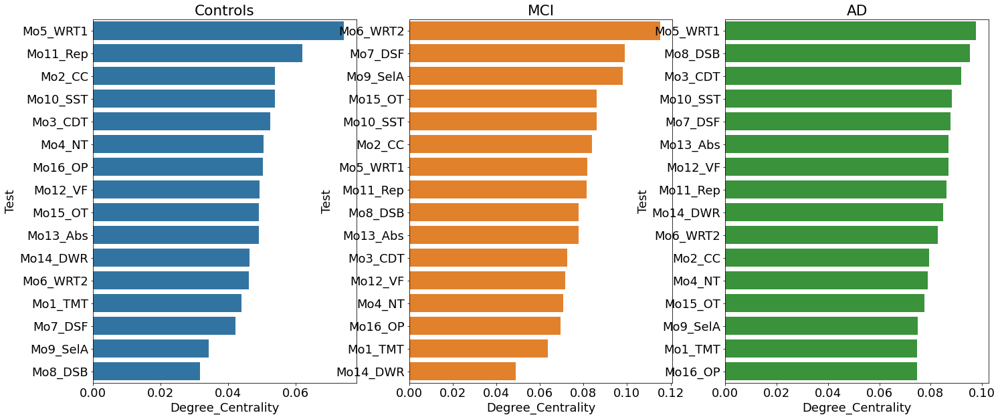

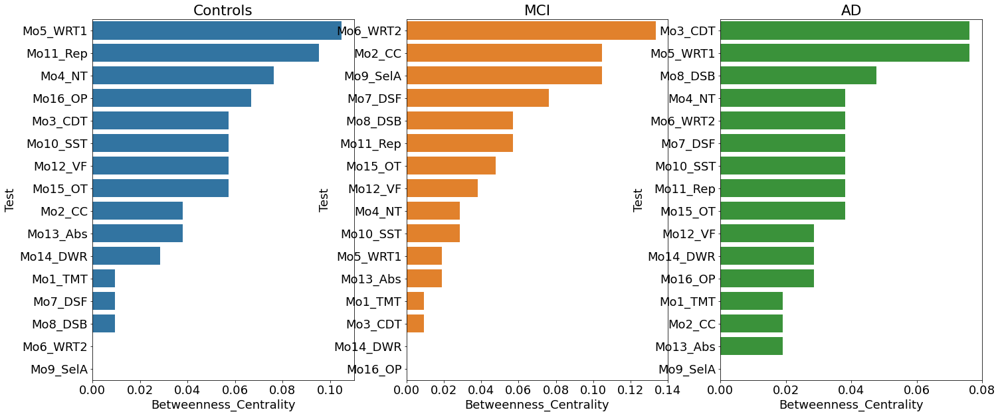

In [347]:
plot_centrality(MOCA_CN_graph, MOCA_MCI_graph, MOCA_AD_graph, MOCA_columns, "Degree_Centrality",'MOCA')
plot_centrality(MOCA_CN_graph, MOCA_MCI_graph, MOCA_AD_graph, MOCA_columns, "Betweenness_Centrality", 'MOCA')

#### Relation between node degree and betweenness centrality

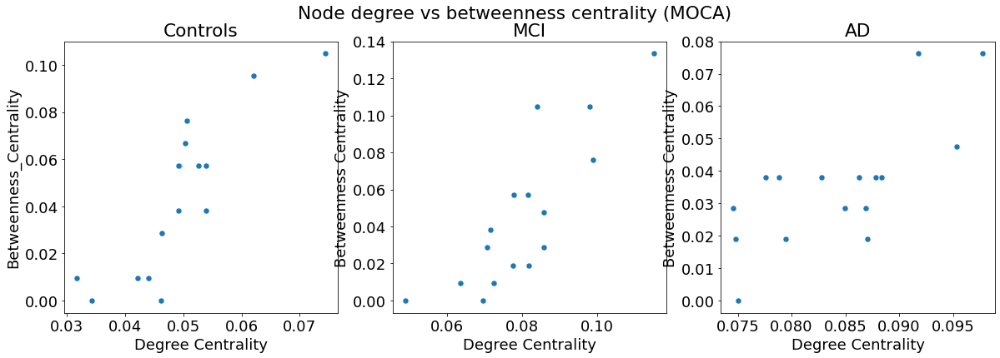

In [348]:
#Get centrality metrics table
MOCA_CN_centrality = centrality(MOCA_CN_graph, MOCA_columns)
MOCA_MCI_centrality = centrality(MOCA_MCI_graph, MOCA_columns)
MOCA_AD_centrality = centrality(MOCA_AD_graph, MOCA_columns)

#Plot
fig, axes = plt.subplots(1,3, figsize=(20,6))


sns.scatterplot(ax=axes[0],data=MOCA_CN_centrality, x="Degree_Centrality", y="Betweenness_Centrality", s=50)
sns.scatterplot(ax=axes[1],data=MOCA_MCI_centrality, x="Degree_Centrality", y="Betweenness_Centrality", s=50)
sns.scatterplot(ax=axes[2],data=MOCA_AD_centrality, x="Degree_Centrality", y="Betweenness_Centrality", s=50)
axes[1].set_ylabel("Betweenness Centrality")
axes[2].set_ylabel("Betweenness Centrality")
axes[0].set_xlabel("Degree Centrality")
axes[1].set_xlabel("Degree Centrality")
axes[2].set_xlabel("Degree Centrality")

#add title
fig.suptitle('Node degree vs betweenness centrality (MOCA)')

#add title to subfigures
axes[0].title.set_text("Controls")
axes[1].title.set_text("MCI")
axes[2].title.set_text("AD")

plt.savefig("./Results_weights/Figures/Metrics/BCvsDG_MOCA.svg", format="svg")
plt.show()

#### 7.1.2. GLOBAL METRICS

In [349]:
MOCA_gm = global_metrics([MOCA_CN_graph, MOCA_MCI_graph, MOCA_AD_graph])
MOCA_gm.reset_index(inplace=True)
MOCA_gm

,index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,GE
0,CN,16,120,24.773498,0.049399,0.74098,1.0,0.182495,0.124682
1,MCI,16,120,14.815284,0.080209,1.203135,1.0,0.213075,0.202122
2,AD,16,120,16.151977,0.084315,1.264718,1.0,0.20536,0.212276


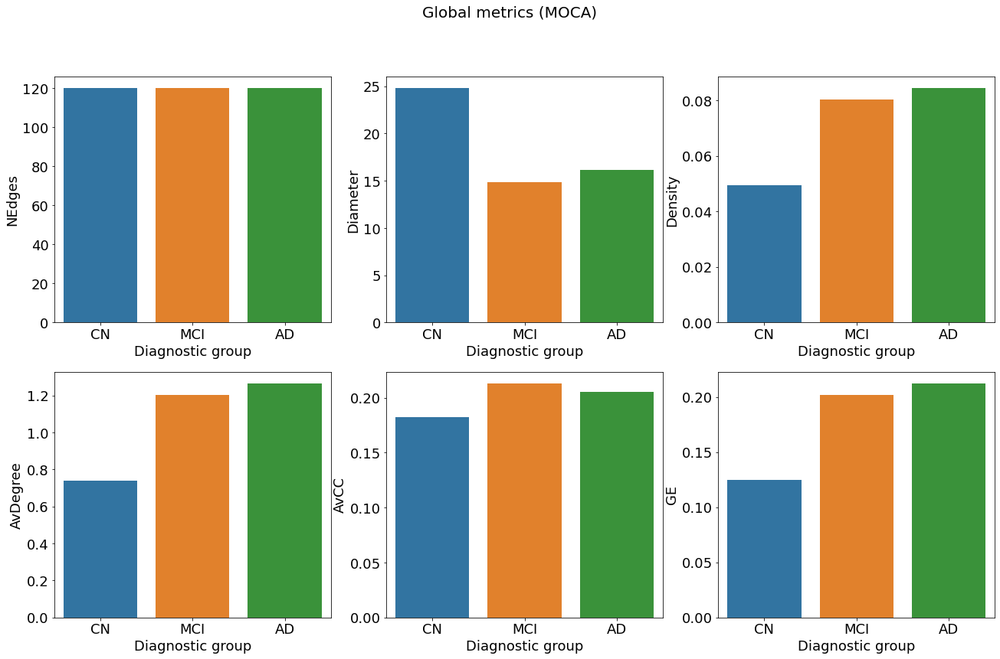

In [350]:
plot_global_metrics(MOCA_gm, 'MOCA')

#### 7.3.3. BOOTSTRAP

In [351]:
MOCA_CN_gm_bt, MOCA_CN_dc_bt, MOCA_CN_bc_bt = bootstrap(X_MOCA_CN,n_size=500,n_rep=250)
MOCA_MCI_gm_bt, MOCA_MCI_dc_bt, MOCA_MCI_bc_bt = bootstrap(X_MOCA_MCI,n_size=500,n_rep=250)
MOCA_AD_gm_bt, MOCA_AD_dc_bt, MOCA_AD_bc_bt = bootstrap(X_MOCA_AD,n_size=500,n_rep=250)

Running repetition  0 ...
Total number of negative correlations:  3
Running repetition  1 ...
Total number of negative correlations:  7
Running repetition  2 ...
Total number of negative correlations:  3
Running repetition  3 ...
Total number of negative correlations:  4
Running repetition  4 ...
Total number of negative correlations:  4
Running repetition  5 ...
Total number of negative correlations:  4
Running repetition  6 ...
Total number of negative correlations:  8
Running repetition  7 ...
Total number of negative correlations:  4
Running repetition  8 ...
Total number of negative correlations:  8
Running repetition  9 ...
Total number of negative correlations:  4
Running repetition  10 ...
Total number of negative correlations:  4
Running repetition  11 ...
Total number of negative correlations:  6
Running repetition  12 ...
Total number of negative correlations:  8
Running repetition  13 ...
Total number of negative correlations:  5
Running repetition  14 ...
Total number of n

Total number of negative correlations:  8
Running repetition  120 ...
Total number of negative correlations:  5
Running repetition  121 ...
Total number of negative correlations:  3
Running repetition  122 ...
Total number of negative correlations:  2
Running repetition  123 ...
Total number of negative correlations:  5
Running repetition  124 ...
Total number of negative correlations:  8
Running repetition  125 ...
Total number of negative correlations:  5
Running repetition  126 ...
Total number of negative correlations:  4
Running repetition  127 ...
Total number of negative correlations:  3
Running repetition  128 ...
Total number of negative correlations:  7
Running repetition  129 ...
Total number of negative correlations:  9
Running repetition  130 ...
Total number of negative correlations:  4
Running repetition  131 ...
Total number of negative correlations:  7
Running repetition  132 ...
Total number of negative correlations:  3
Running repetition  133 ...
Total number of nega

Total number of negative correlations:  3
Running repetition  237 ...
Total number of negative correlations:  4
Running repetition  238 ...
Total number of negative correlations:  3
Running repetition  239 ...
Total number of negative correlations:  5
Running repetition  240 ...
Total number of negative correlations:  4
Running repetition  241 ...
Total number of negative correlations:  6
Running repetition  242 ...
Total number of negative correlations:  5
Running repetition  243 ...
Total number of negative correlations:  6
Running repetition  244 ...
Total number of negative correlations:  7
Running repetition  245 ...
Total number of negative correlations:  6
Running repetition  246 ...
Total number of negative correlations:  4
Running repetition  247 ...
Total number of negative correlations:  5
Running repetition  248 ...
Total number of negative correlations:  4
Running repetition  249 ...
Total number of negative correlations:  8
Running repetition  0 ...
Total number of negati

Total number of negative correlations:  13
Running repetition  105 ...
Total number of negative correlations:  11
Running repetition  106 ...
Total number of negative correlations:  12
Running repetition  107 ...
Total number of negative correlations:  10
Running repetition  108 ...
Total number of negative correlations:  8
Running repetition  109 ...
Total number of negative correlations:  10
Running repetition  110 ...
Total number of negative correlations:  9
Running repetition  111 ...
Total number of negative correlations:  11
Running repetition  112 ...
Total number of negative correlations:  11
Running repetition  113 ...
Total number of negative correlations:  12
Running repetition  114 ...
Total number of negative correlations:  12
Running repetition  115 ...
Total number of negative correlations:  13
Running repetition  116 ...
Total number of negative correlations:  12
Running repetition  117 ...
Total number of negative correlations:  11
Running repetition  118 ...
Total nu

Total number of negative correlations:  14
Running repetition  221 ...
Total number of negative correlations:  10
Running repetition  222 ...
Total number of negative correlations:  9
Running repetition  223 ...
Total number of negative correlations:  12
Running repetition  224 ...
Total number of negative correlations:  9
Running repetition  225 ...
Total number of negative correlations:  13
Running repetition  226 ...
Total number of negative correlations:  13
Running repetition  227 ...
Total number of negative correlations:  10
Running repetition  228 ...
Total number of negative correlations:  11
Running repetition  229 ...
Total number of negative correlations:  10
Running repetition  230 ...
Total number of negative correlations:  12
Running repetition  231 ...
Total number of negative correlations:  8
Running repetition  232 ...
Total number of negative correlations:  12
Running repetition  233 ...
Total number of negative correlations:  10
Running repetition  234 ...
Total num

Total number of negative correlations:  11
Running repetition  88 ...
Total number of negative correlations:  14
Running repetition  89 ...
Total number of negative correlations:  10
Running repetition  90 ...
Total number of negative correlations:  15
Running repetition  91 ...
Total number of negative correlations:  15
Running repetition  92 ...
Total number of negative correlations:  14
Running repetition  93 ...
Total number of negative correlations:  15
Running repetition  94 ...
Total number of negative correlations:  16
Running repetition  95 ...
Total number of negative correlations:  13
Running repetition  96 ...
Total number of negative correlations:  14
Running repetition  97 ...
Total number of negative correlations:  13
Running repetition  98 ...
Total number of negative correlations:  13
Running repetition  99 ...
Total number of negative correlations:  10
Running repetition  100 ...
Total number of negative correlations:  15
Running repetition  101 ...
Total number of ne

Total number of negative correlations:  16
Running repetition  204 ...
Total number of negative correlations:  9
Running repetition  205 ...
Total number of negative correlations:  18
Running repetition  206 ...
Total number of negative correlations:  10
Running repetition  207 ...
Total number of negative correlations:  15
Running repetition  208 ...
Total number of negative correlations:  10
Running repetition  209 ...
Total number of negative correlations:  16
Running repetition  210 ...
Total number of negative correlations:  14
Running repetition  211 ...
Total number of negative correlations:  11
Running repetition  212 ...
Total number of negative correlations:  11
Running repetition  213 ...
Total number of negative correlations:  14
Running repetition  214 ...
Total number of negative correlations:  18
Running repetition  215 ...
Total number of negative correlations:  14
Running repetition  216 ...
Total number of negative correlations:  15
Running repetition  217 ...
Total n

In [352]:
#Store results
MOCA_CN_gm_bt.to_csv("./Results_weights/Bootstrap_gm_results/MOCA/CN.csv", index=False)
MOCA_MCI_gm_bt.to_csv("./Results_weights/Bootstrap_gm_results/MOCA/MCI.csv", index=False) 
MOCA_AD_gm_bt.to_csv("./Results_weights/Bootstrap_gm_results/MOCA/AD.csv", index=False)
MOCA_CN_dc_bt.to_csv("./Results_weights/Bootstrap_dc_results/MOCA/CN.csv", index=False)
MOCA_MCI_dc_bt.to_csv("./Results_weights/Bootstrap_dc_results/MOCA/MCI.csv", index=False) 
MOCA_AD_dc_bt.to_csv("./Results_weights/Bootstrap_dc_results/MOCA/AD.csv", index=False)
MOCA_CN_bc_bt.to_csv("./Results_weights/Bootstrap_bc_results/MOCA/CN.csv", index=False)
MOCA_MCI_bc_bt.to_csv("./Results_weights/Bootstrap_bc_results/MOCA/MCI.csv", index=False) 
MOCA_AD_bc_bt.to_csv("./Results_weights/Bootstrap_bc_results/MOCA/AD.csv", index=False) 

#### Permutation tests

In [353]:
MOCA_gm_sig = permutation_test_results(sample_ls=[MOCA_CN_gm_bt, MOCA_MCI_gm_bt, MOCA_AD_gm_bt], 
                                      metric='global', threshold=0.01)
MOCA_gm_sig

,Measure,Sample1,Sample2,Statistic,p_value,p_adjusted
0,Diameter,CN,MCI,7.154295,0.0,0.0
1,Diameter,CN,AD,9.439651,0.0,0.0
3,Diameter,MCI,AD,2.285356,0.0,0.0
8,Density,MCI,CN,0.025345,0.0,0.0
10,Density,AD,CN,0.029749,0.0,0.0
11,Density,AD,MCI,0.004403,0.0,0.0
14,AvDegree,MCI,CN,0.380181,0.0,0.0
16,AvDegree,AD,CN,0.446232,0.0,0.0
17,AvDegree,AD,MCI,0.06605,0.0,0.0
22,AvCC,AD,CN,0.014097,0.0,0.0


### 7.4. Merged

#### 7.1.1. CENTRALITY MEASURES

In [228]:
print("Controls----------------------------------")
CM_merged_CN = centrality(merged_CN_graph, merged_columns)
CM_merged_CN.to_csv("./Results/merged/CM_CN.csv", sep=";")
display(CM_merged_CN)
print("MCI----------------------------------")
CM_merged_MCI = centrality(merged_MCI_graph, merged_columns)
CM_merged_MCI.to_csv("./Results/merged/CM_MCI.csv", sep=";")
display(CM_merged_MCI)
print("AD----------------------------------")
CM_merged_AD = centrality(merged_AD_graph, merged_columns)
CM_merged_AD.to_csv("./Results/merged/CM_AD.csv", sep=";")
display(CM_merged_AD)

Controls----------------------------------


,Degree_Centrality,Closeness_Centrality,Eigenvector_Centrality,Betweenness_Centrality
Q1_WR,0.073767,0.075884,0.207445,0.000000
Q2_Comm,0.071923,0.080020,0.191970,0.070175
Q3_CP,0.071234,0.073471,0.194634,0.000000
Q4_DWR,0.068562,0.074693,0.194389,0.091768
Q5_NT,0.061694,0.073139,0.167062,0.000000
Q6_IP,0.044609,0.059291,0.121848,0.062078
Q7_O,0.077306,0.088039,0.215581,0.033738
Q8_WRT,0.064342,0.075100,0.174445,0.002699
Q9_RTI,0.060469,0.074561,0.167860,0.039136
Q10_Comp,0.060730,0.076733,0.169085,0.000000


MCI----------------------------------


,Degree_Centrality,Closeness_Centrality,Eigenvector_Centrality,Betweenness_Centrality
Q1_WR,0.061223,0.067188,0.212554,0.000000
Q2_Comm,0.042025,0.058136,0.138021,0.060729
Q3_CP,0.047441,0.060170,0.158040,0.240216
Q4_DWR,0.057527,0.067307,0.203268,0.122807
Q5_NT,0.053400,0.064746,0.168664,0.008097
Q6_IP,0.046259,0.062428,0.150740,0.067476
Q7_O,0.047046,0.060646,0.156376,0.106613
Q8_WRT,0.053588,0.066036,0.179078,0.020243
Q9_RTI,0.049089,0.064924,0.163435,0.010796
Q10_Comp,0.045050,0.059756,0.145364,0.022942


AD----------------------------------


,Degree_Centrality,Closeness_Centrality,Eigenvector_Centrality,Betweenness_Centrality
Q1_WR,0.087768,0.109319,0.163300,0.049933
Q2_Comm,0.067265,0.087151,0.117693,0.133603
Q3_CP,0.091353,0.104601,0.162707,0.026991
Q4_DWR,0.093206,0.111464,0.173829,0.161943
Q5_NT,0.084141,0.099392,0.154295,0.075574
Q6_IP,0.085337,0.105870,0.156967,0.114710
Q7_O,0.106623,0.121654,0.194919,0.083671
Q8_WRT,0.070429,0.105220,0.133414,0.025641
Q9_RTI,0.084923,0.101425,0.154284,0.013495
Q10_Comp,0.086566,0.105832,0.153601,0.009447


#### Plot centrality metrics

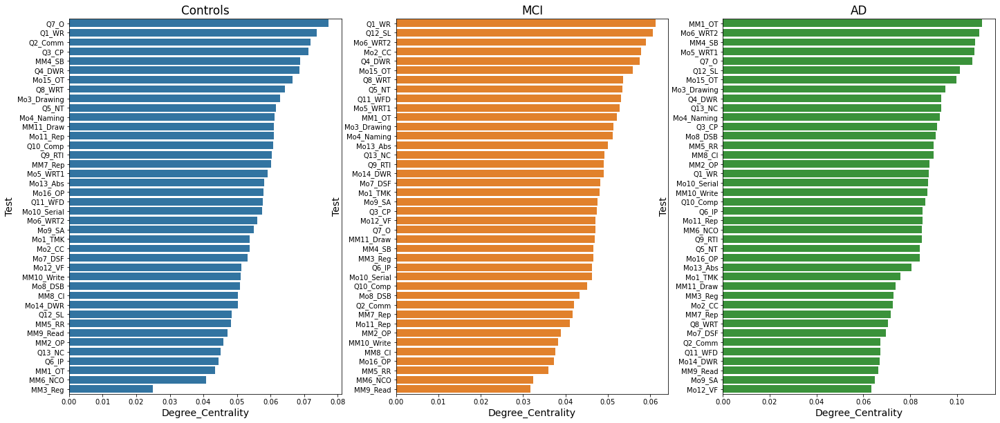

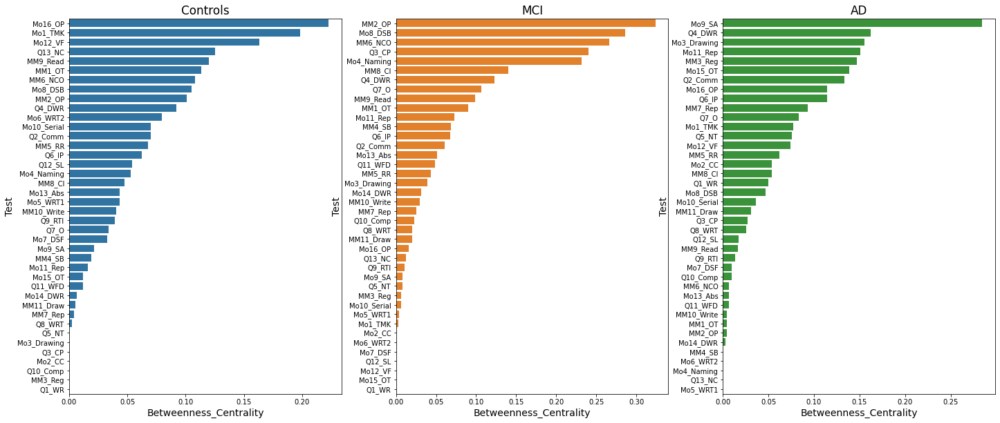

In [229]:
plot_centrality(merged_CN_graph, merged_MCI_graph, merged_AD_graph, merged_columns, "Degree_Centrality", 'merged')
plot_centrality(merged_CN_graph, merged_MCI_graph, merged_AD_graph, merged_columns, "Betweenness_Centrality", 'merged')

#### Relation between node degree and betweenness centrality

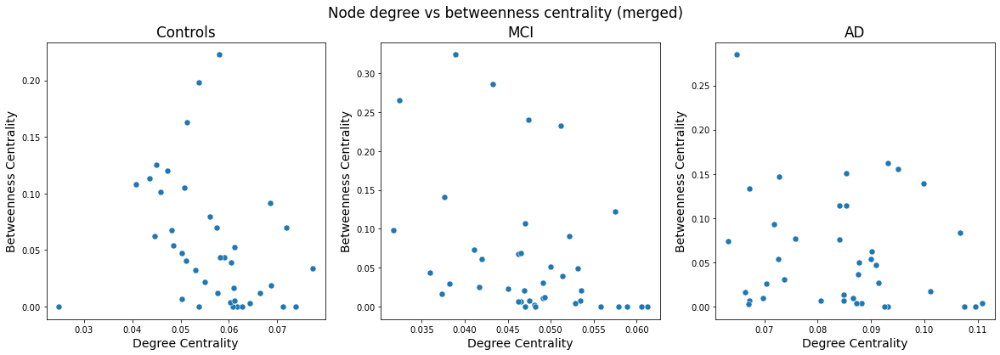

In [230]:
#Get centrality metrics table
merged_CN_centrality = centrality(merged_CN_graph, merged_columns)
merged_MCI_centrality = centrality(merged_MCI_graph, merged_columns)
merged_AD_centrality = centrality(merged_AD_graph, merged_columns)

#Plot
fig, axes = plt.subplots(1,3, figsize=(20,6))


sns.scatterplot(ax=axes[0],data=merged_CN_centrality, x="Degree_Centrality", y="Betweenness_Centrality", s=50)
sns.scatterplot(ax=axes[1],data=merged_MCI_centrality, x="Degree_Centrality", y="Betweenness_Centrality", s=50)
sns.scatterplot(ax=axes[2],data=merged_AD_centrality, x="Degree_Centrality", y="Betweenness_Centrality", s=50)

#labels
axes[0].set_ylabel("Betweenness Centrality")
axes[1].set_ylabel("Betweenness Centrality")
axes[2].set_ylabel("Betweenness Centrality")
axes[0].set_xlabel("Degree Centrality")
axes[1].set_xlabel("Degree Centrality")
axes[2].set_xlabel("Degree Centrality")

#add title
fig.suptitle('Node degree vs betweenness centrality (merged)')

#add title to subfigures
axes[0].title.set_text("Controls")
axes[1].title.set_text("MCI")
axes[2].title.set_text("AD")

plt.savefig("./Results/Figures/Metrics/BCvsDG_merged.svg", format="svg")
plt.show()

#### 7.1.2. GLOBAL METRICS

In [231]:
merged_gm = global_metrics([merged_CN_graph, merged_MCI_graph, merged_AD_graph])
merged_gm.reset_index(inplace=True)
merged_gm

,index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,GE
0,CN,40,756,0.02798,0.056406,2.199828,0.987185,0.075977,320.977064
1,MCI,40,780,0.014572,0.047507,1.852759,1.0,0.0658,403.817369
2,AD,40,780,0.031649,0.085215,3.323374,1.0,0.108622,216.765297


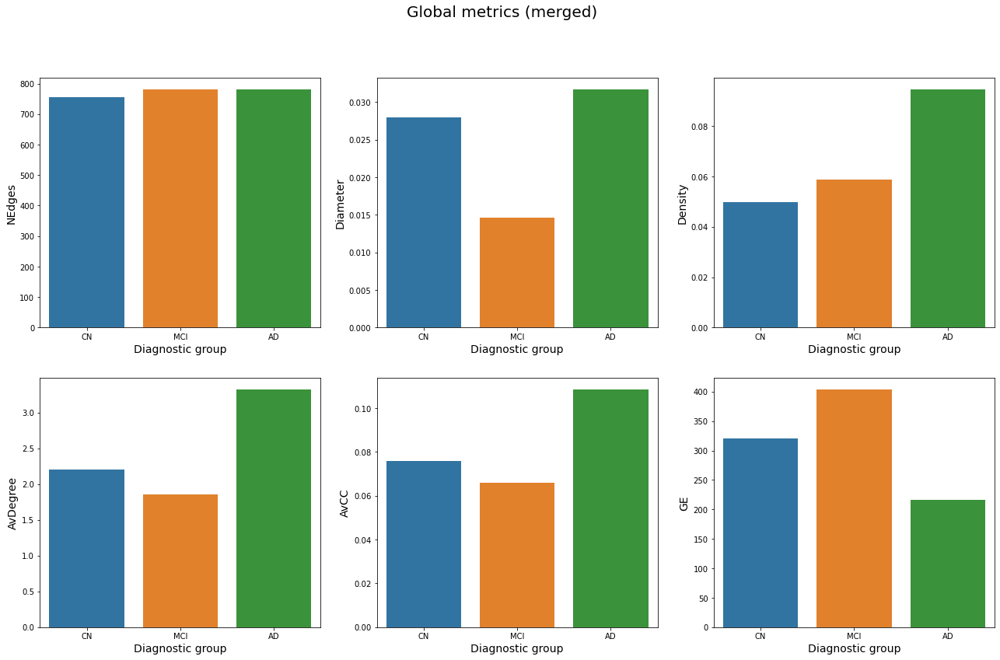

In [232]:
plot_global_metrics(merged_gm, 'merged')

#### 7.4.3. BOOTSTRAP

In [233]:
merged_CN_gm_bt, merged_CN_dc_bt, merged_CN_bc_bt = bootstrap(X_merged_CN,n_size=500,n_rep=250)
merged_MCI_gm_bt, merged_MCI_dc_bt, merged_MCI_bc_bt = bootstrap(X_merged_MCI,n_size=500,n_rep=250)
merged_AD_gm_bt, merged_AD_dc_bt, merged_AD_bc_bt = bootstrap(X_merged_AD,n_size=500,n_rep=250)

Running repetition  0 ...
Running repetition  1 ...
Running repetition  2 ...
Running repetition  3 ...
Running repetition  4 ...
Running repetition  5 ...
Running repetition  6 ...
Running repetition  7 ...
Running repetition  8 ...
Running repetition  9 ...
Running repetition  10 ...
Running repetition  11 ...
Running repetition  12 ...
Running repetition  13 ...
Running repetition  14 ...
Running repetition  15 ...
Running repetition  16 ...
Running repetition  17 ...
Running repetition  18 ...
Running repetition  19 ...
Running repetition  20 ...
Running repetition  21 ...
Running repetition  22 ...
Running repetition  23 ...
Running repetition  24 ...
Running repetition  25 ...
Running repetition  26 ...
Running repetition  27 ...
Running repetition  28 ...
Running repetition  29 ...
Running repetition  30 ...
Running repetition  31 ...
Running repetition  32 ...
Running repetition  33 ...
Running repetition  34 ...
Running repetition  35 ...
Running repetition  36 ...
Running rep

Running repetition  49 ...
Running repetition  50 ...
Running repetition  51 ...
Running repetition  52 ...
Running repetition  53 ...
Running repetition  54 ...
Running repetition  55 ...
Running repetition  56 ...
Running repetition  57 ...
Running repetition  58 ...
Running repetition  59 ...
Running repetition  60 ...
Running repetition  61 ...
Running repetition  62 ...
Running repetition  63 ...
Running repetition  64 ...
Running repetition  65 ...
Running repetition  66 ...
Running repetition  67 ...
Running repetition  68 ...
Running repetition  69 ...
Running repetition  70 ...
Running repetition  71 ...
Running repetition  72 ...
Running repetition  73 ...
Running repetition  74 ...
Running repetition  75 ...
Running repetition  76 ...
Running repetition  77 ...
Running repetition  78 ...
Running repetition  79 ...
Running repetition  80 ...
Running repetition  81 ...
Running repetition  82 ...
Running repetition  83 ...
Running repetition  84 ...
Running repetition  85 ...
R

Running repetition  98 ...
Running repetition  99 ...
Running repetition  100 ...
Running repetition  101 ...
Running repetition  102 ...
Running repetition  103 ...
Running repetition  104 ...
Running repetition  105 ...
Running repetition  106 ...
Running repetition  107 ...
Running repetition  108 ...
Running repetition  109 ...
Running repetition  110 ...
Running repetition  111 ...
Running repetition  112 ...
Running repetition  113 ...
Running repetition  114 ...
Running repetition  115 ...
Running repetition  116 ...
Running repetition  117 ...
Running repetition  118 ...
Running repetition  119 ...
Running repetition  120 ...
Running repetition  121 ...
Running repetition  122 ...
Running repetition  123 ...
Running repetition  124 ...
Running repetition  125 ...
Running repetition  126 ...
Running repetition  127 ...
Running repetition  128 ...
Running repetition  129 ...
Running repetition  130 ...
Running repetition  131 ...
Running repetition  132 ...
Running repetition  13

#### Permutation tests

In [234]:
merged_gm_sig = permutation_test_results(sample_ls=[merged_CN_gm_bt, merged_MCI_gm_bt, merged_AD_gm_bt], 
                                      metric='global', threshold=0.01)
merged_gm_sig

,Measure,Sample1,Sample2,Statistic,p_value,p_adjusted
0,Diameter,CN,MCI,0.005252,0.0,0.0
4,Diameter,AD,CN,0.011119,0.0,0.0
5,Diameter,AD,MCI,0.016371,0.0,0.0
6,Density,CN,MCI,0.004562,0.0,0.0
10,Density,AD,CN,0.028172,0.0,0.0
11,Density,AD,MCI,0.032734,0.0,0.0
12,AvDegree,CN,MCI,0.177919,0.0,0.0
16,AvDegree,AD,CN,1.098699,0.0,0.0
17,AvDegree,AD,MCI,1.276619,0.0,0.0
22,AvCC,AD,CN,0.034214,0.0,0.0


### 7.4. Merged (ADAS and MoCA)

#### 7.1.1. CENTRALITY MEASURES

In [424]:
print("Controls----------------------------------")
CM_ADASMOCA_CN = centrality(ADASMOCA_CN_graph, ADASMOCA_columns)
CM_ADASMOCA_CN.to_csv("./Results/ADASMOCA/CM_CN.csv", sep=";")
display(CM_ADASMOCA_CN)
print("MCI----------------------------------")
CM_ADASMOCA_MCI = centrality(ADASMOCA_MCI_graph, ADASMOCA_columns)
CM_ADASMOCA_MCI.to_csv("./Results/ADASMOCA/CM_MCI.csv", sep=";")
display(CM_ADASMOCA_MCI)
print("AD----------------------------------")
CM_ADASMOCA_AD = centrality(ADASMOCA_AD_graph, ADASMOCA_columns)
CM_ADASMOCA_AD.to_csv("./Results/ADASMOCA/CM_AD.csv", sep=";")
display(CM_ADASMOCA_AD)

Controls----------------------------------


,Degree_Centrality,Closeness_Centrality,Eigenvector_Centrality,Betweenness_Centrality
Q1_WR,0.060011,0.058563,0.280646,0.023810
Q2_Comm,0.047465,0.056376,0.179711,0.047619
Q3_CP,0.052971,0.055273,0.208238,0.137566
Q4_DWR,0.065680,0.059826,0.297943,0.052910
Q5_NT,0.042875,0.056224,0.163244,0.148148
Q6_IP,0.029291,0.039044,0.111465,0.000000
Q7_O,0.047121,0.057231,0.188873,0.320106
Q8_WRT,0.048564,0.055297,0.208126,0.044974
Q9_RTI,0.042467,0.052246,0.163419,0.037037
Q10_Comp,0.045516,0.055955,0.184628,0.000000


MCI----------------------------------


,Degree_Centrality,Closeness_Centrality,Eigenvector_Centrality,Betweenness_Centrality
Q1_WR,0.116168,0.122585,0.275062,0.002646
Q2_Comm,0.089630,0.106737,0.205518,0.097884
Q3_CP,0.084408,0.106675,0.171330,0.105820
Q4_DWR,0.110701,0.122862,0.270070,0.066138
Q5_NT,0.060089,0.078374,0.126154,0.103175
Q6_IP,0.064485,0.086191,0.134441,0.000000
Q7_O,0.100001,0.115501,0.233383,0.031746
Q8_WRT,0.070298,0.098722,0.170391,0.105820
Q9_RTI,0.069479,0.089383,0.151046,0.097884
Q10_Comp,0.081097,0.098305,0.178664,0.000000


AD----------------------------------


,Degree_Centrality,Closeness_Centrality,Eigenvector_Centrality,Betweenness_Centrality
Q1_WR,0.089747,0.100388,0.213608,0.182540
Q2_Comm,0.060549,0.079348,0.144458,0.058201
Q3_CP,0.077189,0.086429,0.181333,0.000000
Q4_DWR,0.077845,0.093424,0.185697,0.000000
Q5_NT,0.079030,0.088341,0.187143,0.034392
Q6_IP,0.085194,0.099791,0.199455,0.037037
Q7_O,0.111884,0.105945,0.264910,0.000000
Q8_WRT,0.075540,0.092433,0.176636,0.031746
Q9_RTI,0.080195,0.092632,0.190516,0.042328
Q10_Comp,0.060156,0.081547,0.140377,0.047619


#### Plot centrality metrics

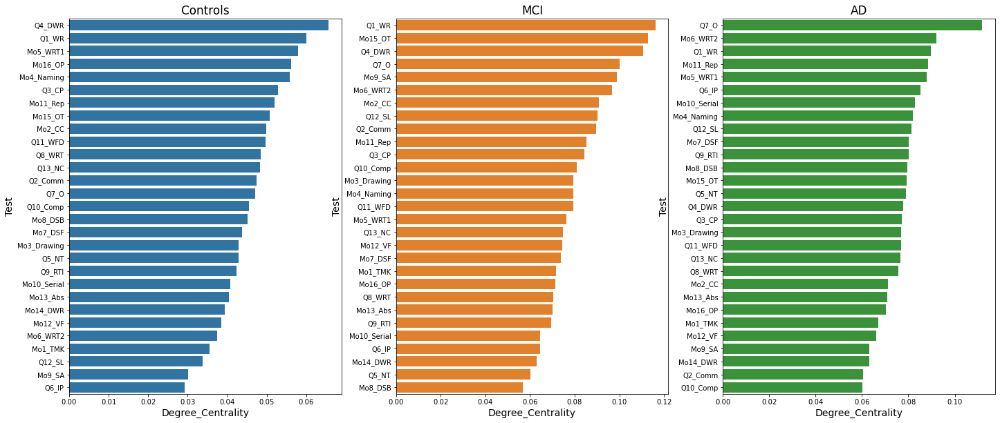

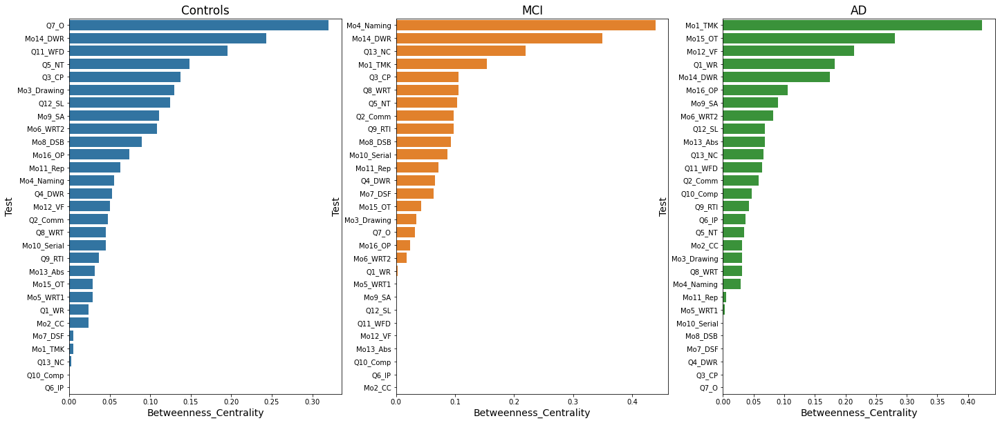

In [425]:
plot_centrality(ADASMOCA_CN_graph, ADASMOCA_MCI_graph, ADASMOCA_AD_graph, ADASMOCA_columns, "Degree_Centrality", 'ADASMOCA')
plot_centrality(ADASMOCA_CN_graph, ADASMOCA_MCI_graph, ADASMOCA_AD_graph, ADASMOCA_columns, "Betweenness_Centrality", 'ADASMOCA')

#### Relation between node degree and betweenness centrality

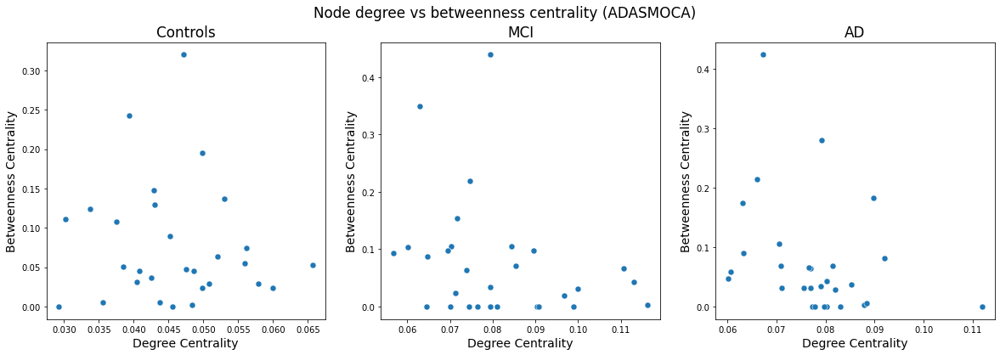

In [426]:
#Get centrality metrics table
ADASMOCA_CN_centrality = centrality(ADASMOCA_CN_graph, ADASMOCA_columns)
ADASMOCA_MCI_centrality = centrality(ADASMOCA_MCI_graph, ADASMOCA_columns)
ADASMOCA_AD_centrality = centrality(ADASMOCA_AD_graph, ADASMOCA_columns)

#Plot
fig, axes = plt.subplots(1,3, figsize=(20,6))


sns.scatterplot(ax=axes[0],data=ADASMOCA_CN_centrality, x="Degree_Centrality", y="Betweenness_Centrality", s=50)
sns.scatterplot(ax=axes[1],data=ADASMOCA_MCI_centrality, x="Degree_Centrality", y="Betweenness_Centrality", s=50)
sns.scatterplot(ax=axes[2],data=ADASMOCA_AD_centrality, x="Degree_Centrality", y="Betweenness_Centrality", s=50)

#labels
axes[0].set_ylabel("Betweenness Centrality")
axes[1].set_ylabel("Betweenness Centrality")
axes[2].set_ylabel("Betweenness Centrality")
axes[0].set_xlabel("Degree Centrality")
axes[1].set_xlabel("Degree Centrality")
axes[2].set_xlabel("Degree Centrality")

#add title
fig.suptitle('Node degree vs betweenness centrality (ADASMOCA)')

#add title to subfigures
axes[0].title.set_text("Controls")
axes[1].title.set_text("MCI")
axes[2].title.set_text("AD")

plt.savefig("./Results/Figures/Metrics/BCvsDG_ADASMOCA.svg", format="svg")
plt.show()

#### 7.1.2. GLOBAL METRICS

In [427]:
ADASMOCA_gm = global_metrics([ADASMOCA_CN_graph, ADASMOCA_MCI_graph, ADASMOCA_AD_graph])
ADASMOCA_gm.reset_index(inplace=True)
ADASMOCA_gm

,index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,GE
0,CN,29,406,0.021108,0.045892,1.284979,1.0,0.054174,983.505172
1,MCI,29,406,0.033058,0.081275,2.275699,1.0,0.119834,201.683486
2,AD,29,406,0.038263,0.077701,2.175638,1.0,0.090298,196.199484


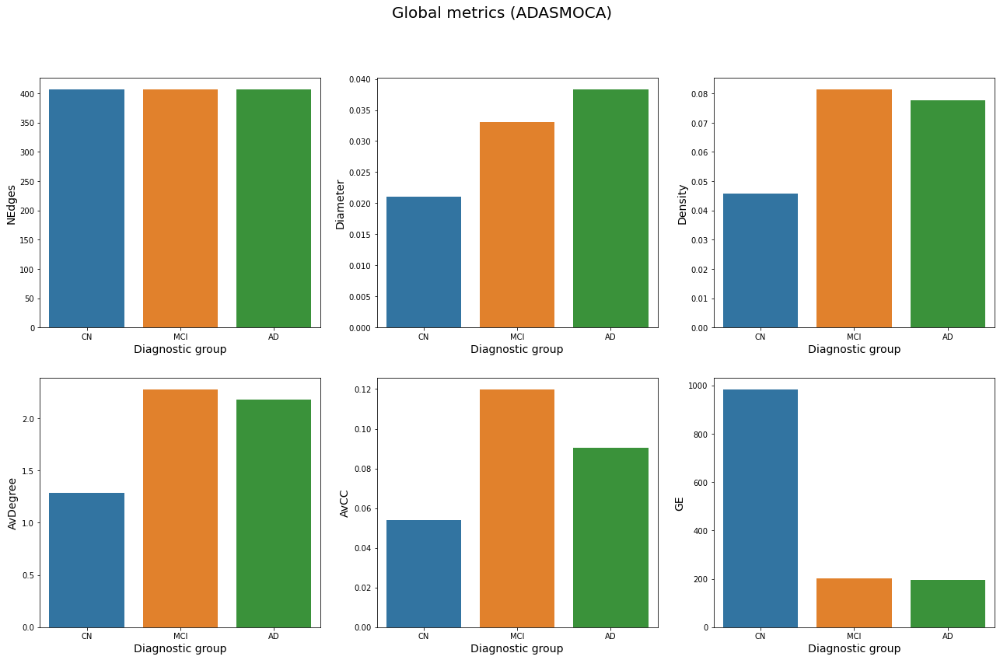

In [428]:
plot_global_metrics(ADASMOCA_gm, 'ADASMOCA')

#### 7.1.3. BOOTSTRAP

In [429]:
ADASMOCA_CN_gm_bt, ADASMOCA_CN_dc_bt, ADASMOCA_CN_bc_bt = bootstrap(X_ADASMOCA_CN,n_size=500,n_rep=250)
ADASMOCA_MCI_gm_bt, ADASMOCA_MCI_dc_bt, ADASMOCA_MCI_bc_bt = bootstrap(X_ADASMOCA_MCI,n_size=500,n_rep=250)
ADASMOCA_AD_gm_bt, ADASMOCA_AD_dc_bt, ADASMOCA_AD_bc_bt = bootstrap(X_ADASMOCA_AD,n_size=500,n_rep=250)

Running repetition  0 ...
Running repetition  1 ...
Running repetition  2 ...
Running repetition  3 ...
Running repetition  4 ...
Running repetition  5 ...
Running repetition  6 ...
Running repetition  7 ...
Running repetition  8 ...
Running repetition  9 ...
Running repetition  10 ...
Running repetition  11 ...
Running repetition  12 ...
Running repetition  13 ...
Running repetition  14 ...
Running repetition  15 ...
Running repetition  16 ...
Running repetition  17 ...
Running repetition  18 ...
Running repetition  19 ...
Running repetition  20 ...
Running repetition  21 ...
Running repetition  22 ...
Running repetition  23 ...
Running repetition  24 ...
Running repetition  25 ...
Running repetition  26 ...
Running repetition  27 ...
Running repetition  28 ...
Running repetition  29 ...
Running repetition  30 ...
Running repetition  31 ...
Running repetition  32 ...
Running repetition  33 ...
Running repetition  34 ...
Running repetition  35 ...
Running repetition  36 ...
Running rep

Running repetition  49 ...
Running repetition  50 ...
Running repetition  51 ...
Running repetition  52 ...
Running repetition  53 ...
Running repetition  54 ...
Running repetition  55 ...
Running repetition  56 ...
Running repetition  57 ...
Running repetition  58 ...
Running repetition  59 ...
Running repetition  60 ...
Running repetition  61 ...
Running repetition  62 ...
Running repetition  63 ...
Running repetition  64 ...
Running repetition  65 ...
Running repetition  66 ...
Running repetition  67 ...
Running repetition  68 ...
Running repetition  69 ...
Running repetition  70 ...
Running repetition  71 ...
Running repetition  72 ...
Running repetition  73 ...
Running repetition  74 ...
Running repetition  75 ...
Running repetition  76 ...
Running repetition  77 ...
Running repetition  78 ...
Running repetition  79 ...
Running repetition  80 ...
Running repetition  81 ...
Running repetition  82 ...
Running repetition  83 ...
Running repetition  84 ...
Running repetition  85 ...
R

Running repetition  98 ...
Running repetition  99 ...
Running repetition  100 ...
Running repetition  101 ...
Running repetition  102 ...
Running repetition  103 ...
Running repetition  104 ...
Running repetition  105 ...
Running repetition  106 ...
Running repetition  107 ...
Running repetition  108 ...
Running repetition  109 ...
Running repetition  110 ...
Running repetition  111 ...
Running repetition  112 ...
Running repetition  113 ...
Running repetition  114 ...
Running repetition  115 ...
Running repetition  116 ...
Running repetition  117 ...
Running repetition  118 ...
Running repetition  119 ...
Running repetition  120 ...
Running repetition  121 ...
Running repetition  122 ...
Running repetition  123 ...
Running repetition  124 ...
Running repetition  125 ...
Running repetition  126 ...
Running repetition  127 ...
Running repetition  128 ...
Running repetition  129 ...
Running repetition  130 ...
Running repetition  131 ...
Running repetition  132 ...
Running repetition  13

In [432]:
#Store results
ADASMOCA_CN_gm_bt.to_csv("./Results/Bootstrap_gm_results/ADASMOCA/CN.csv", index=False)
ADASMOCA_MCI_gm_bt.to_csv("./Results/Bootstrap_gm_results/ADASMOCA/MCI.csv", index=False) 
ADASMOCA_AD_gm_bt.to_csv("./Results/Bootstrap_gm_results/ADASMOCA/AD.csv", index=False)
ADASMOCA_CN_dc_bt.to_csv("./Results/Bootstrap_dc_results/ADASMOCA/CN.csv", index=False)
ADASMOCA_MCI_dc_bt.to_csv("./Results/Bootstrap_dc_results/ADASMOCA/MCI.csv", index=False) 
ADASMOCA_AD_dc_bt.to_csv("./Results/Bootstrap_dc_results/ADASMOCA/AD.csv", index=False)
ADASMOCA_CN_bc_bt.to_csv("./Results/Bootstrap_bc_results/ADASMOCA/CN.csv", index=False)
ADASMOCA_MCI_bc_bt.to_csv("./Results/Bootstrap_bc_results/ADASMOCA/MCI.csv", index=False) 
ADASMOCA_AD_bc_bt.to_csv("./Results/Bootstrap_bc_results/ADASMOCA/AD.csv", index=False) 

#### Permutation tests

In [430]:
ADASMOCA_gm_sig = permutation_test_results(sample_ls=[ADASMOCA_CN_gm_bt, ADASMOCA_MCI_gm_bt, ADASMOCA_AD_gm_bt], 
                                      metric='global', threshold=0.01)
ADASMOCA_gm_sig

,Measure,Sample1,Sample2,Statistic,p_value,p_adjusted
2,Diameter,MCI,CN,0.014277,0.0,0.0
4,Diameter,AD,CN,0.014659,0.0,0.0
8,Density,MCI,CN,0.029371,0.0,0.0
9,Density,MCI,AD,0.003294,0.0,0.0
10,Density,AD,CN,0.026077,0.0,0.0
14,AvDegree,MCI,CN,0.822397,0.0,0.0
15,AvDegree,MCI,AD,0.092238,0.0,0.0
16,AvDegree,AD,CN,0.730159,0.0,0.0
20,AvCC,MCI,CN,0.05868,0.0,0.0
21,AvCC,MCI,AD,0.030478,0.0,0.0


### 7.6. NEUROBAT

#### 7.1.1. CENTRALITY MEASURES

In [354]:
print("Controls----------------------------------")
CM_NEUROBAT_CN = centrality(NEUROBAT_CN_graph, NEUROBAT_columns)
CM_NEUROBAT_CN.to_csv("./Results_weights/NEUROBAT/CM_CN.csv", sep=";")
display(CM_NEUROBAT_CN)
print("MCI----------------------------------")
CM_NEUROBAT_MCI = centrality(NEUROBAT_MCI_graph, NEUROBAT_columns)
CM_NEUROBAT_MCI.to_csv("./Results_weights/NEUROBAT/CM_MCI.csv", sep=";")
display(CM_NEUROBAT_MCI)
print("AD----------------------------------")
CM_NEUROBAT_AD = centrality(NEUROBAT_AD_graph, NEUROBAT_columns)
CM_NEUROBAT_AD.to_csv("./Results_weights/NEUROBAT/CM_AD.csv", sep=";")
display(CM_NEUROBAT_AD)

Controls----------------------------------


,Degree_Centrality,Closeness_Centrality,Eigenvector_Centrality,Betweenness_Centrality
NB1_RAVLTD,0.134614,0.095764,0.402092,0.109091
NB2_RAVLTR,0.084032,0.078580,0.266240,0.000000
NB3_RAVLTI,0.137640,0.095023,0.406668,0.072727
NB4_CAT_FLU,0.082653,0.088805,0.229572,0.072727
NB5_BNT,0.101877,0.099392,0.263223,0.036364
NB6_CDT,0.097941,0.089349,0.231984,0.054545
NB7_CCT,0.089676,0.089608,0.223292,0.072727
NB8_DSF,0.114200,0.093007,0.315122,0.072727
NB9_DSB,0.108569,0.092235,0.304662,0.036364
NB10_TMTA,0.102136,0.087837,0.246668,0.036364


MCI----------------------------------


,Degree_Centrality,Closeness_Centrality,Eigenvector_Centrality,Betweenness_Centrality
NB1_RAVLTD,0.123085,0.103825,0.288415,0.163636
NB2_RAVLTR,0.076881,0.087533,0.209272,0.000000
NB3_RAVLTI,0.097246,0.112077,0.263841,0.090909
NB4_CAT_FLU,0.128869,0.140426,0.349709,0.181818
NB5_BNT,0.140118,0.141388,0.375401,0.109091
NB6_CDT,0.097908,0.112720,0.272959,0.072727
NB7_CCT,0.091311,0.109606,0.258261,0.036364
NB8_DSF,0.100053,0.104583,0.268803,0.054545
NB9_DSB,0.110697,0.110901,0.299539,0.090909
NB10_TMTA,0.099204,0.112346,0.281491,0.036364


AD----------------------------------


,Degree_Centrality,Closeness_Centrality,Eigenvector_Centrality,Betweenness_Centrality
NB1_RAVLTD,0.098745,0.117424,0.236494,0.000000
NB2_RAVLTR,0.112681,0.130610,0.270650,0.036364
NB3_RAVLTI,0.163718,0.164096,0.372726,0.218182
NB4_CAT_FLU,0.126645,0.162212,0.336718,0.127273
NB5_BNT,0.146439,0.158084,0.357347,0.054545
NB6_CDT,0.112791,0.119344,0.278903,0.018182
NB7_CCT,0.128728,0.126126,0.314677,0.072727
NB8_DSF,0.084177,0.110072,0.197012,0.036364
NB9_DSB,0.111518,0.126969,0.255414,0.090909
NB10_TMTA,0.117029,0.126125,0.268260,0.054545


#### Plot centrality metrics

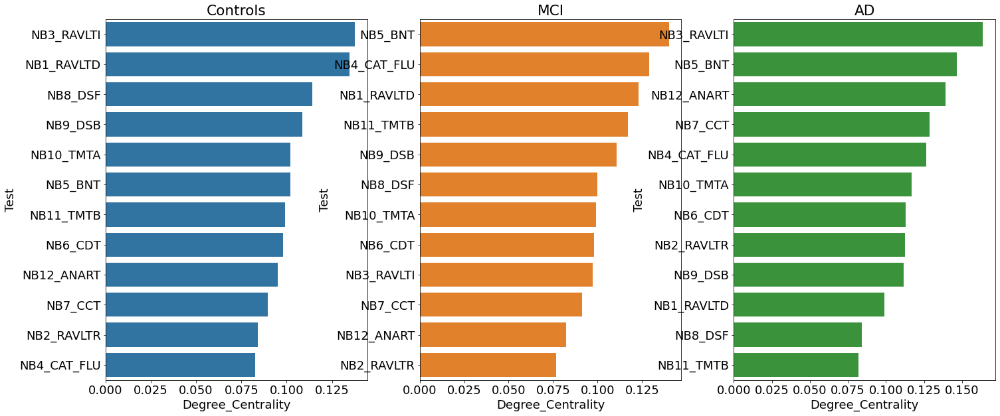

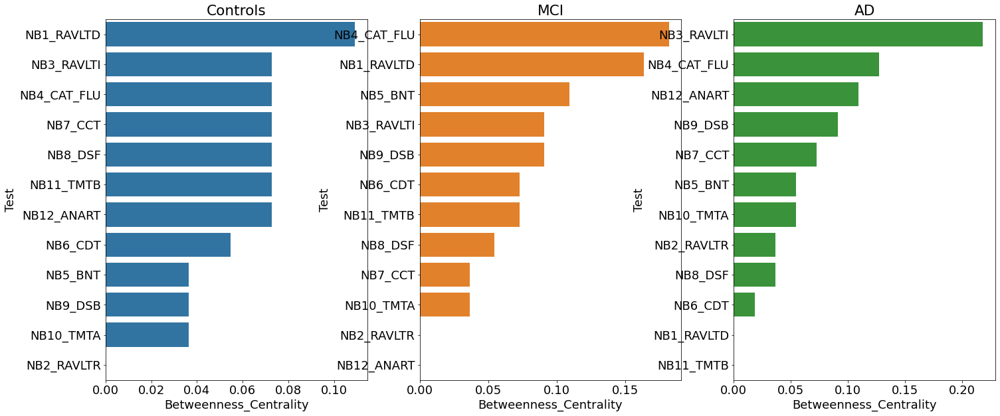

In [355]:
plot_centrality(NEUROBAT_CN_graph, NEUROBAT_MCI_graph, NEUROBAT_AD_graph, NEUROBAT_columns, "Degree_Centrality", 'NEUROBAT')
plot_centrality(NEUROBAT_CN_graph, NEUROBAT_MCI_graph, NEUROBAT_AD_graph, NEUROBAT_columns, "Betweenness_Centrality", 'NEUROBAT')

#### Relation between node degree and betweenness centrality

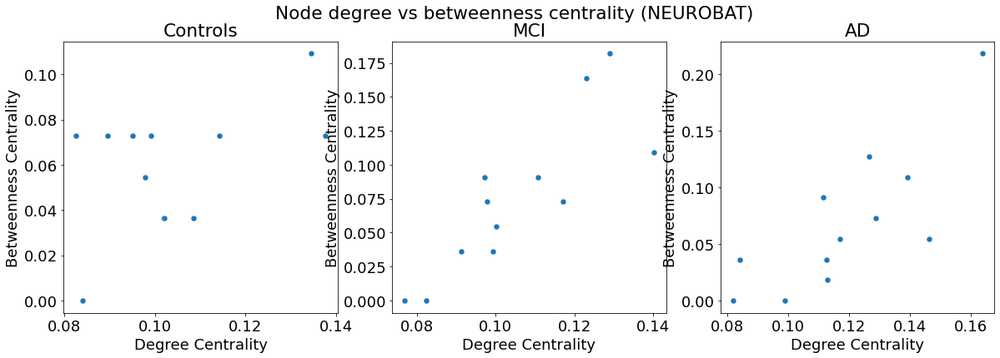

In [356]:
#Get centrality metrics table
NEUROBAT_CN_centrality = centrality(NEUROBAT_CN_graph, NEUROBAT_columns)
NEUROBAT_MCI_centrality = centrality(NEUROBAT_MCI_graph, NEUROBAT_columns)
NEUROBAT_AD_centrality = centrality(NEUROBAT_AD_graph, NEUROBAT_columns)

#Plot
fig, axes = plt.subplots(1,3, figsize=(20,6))


sns.scatterplot(ax=axes[0],data=NEUROBAT_CN_centrality, x="Degree_Centrality", y="Betweenness_Centrality", s=50)
sns.scatterplot(ax=axes[1],data=NEUROBAT_MCI_centrality, x="Degree_Centrality", y="Betweenness_Centrality", s=50)
sns.scatterplot(ax=axes[2],data=NEUROBAT_AD_centrality, x="Degree_Centrality", y="Betweenness_Centrality", s=50)

#labels
axes[0].set_ylabel("Betweenness Centrality")
axes[1].set_ylabel("Betweenness Centrality")
axes[2].set_ylabel("Betweenness Centrality")
axes[0].set_xlabel("Degree Centrality")
axes[1].set_xlabel("Degree Centrality")
axes[2].set_xlabel("Degree Centrality")

#add title
fig.suptitle('Node degree vs betweenness centrality (NEUROBAT)')

#add title to subfigures
axes[0].title.set_text("Controls")
axes[1].title.set_text("MCI")
axes[2].title.set_text("AD")

plt.savefig("./Results_weights/Figures/Metrics/BCvsDG_NEUROBAT.svg", format="svg")
plt.show()

#### 7.1.2. GLOBAL METRICS

In [357]:
NEUROBAT_gm = global_metrics([NEUROBAT_CN_graph, NEUROBAT_MCI_graph, NEUROBAT_AD_graph])
NEUROBAT_gm.reset_index(inplace=True)
NEUROBAT_gm

,index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,GE
0,CN,12,66,18.701088,0.103962,1.143579,1.0,0.129897,0.242129
1,MCI,12,66,16.635716,0.105398,1.159377,1.0,0.152114,0.278191
2,AD,12,66,11.800888,0.118622,1.304847,1.0,0.202276,0.314371


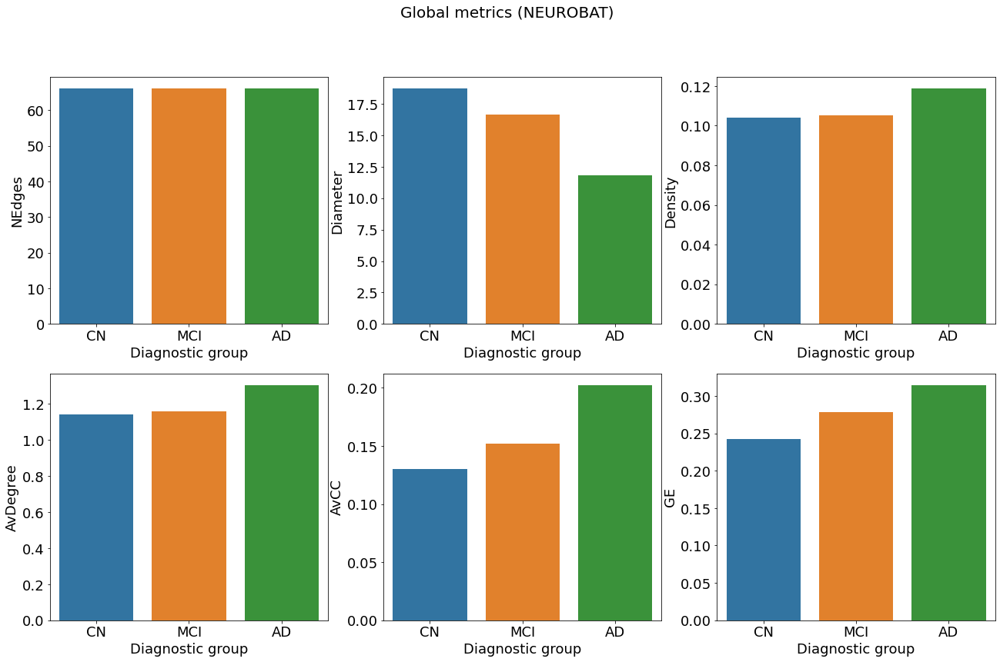

In [358]:
plot_global_metrics(NEUROBAT_gm, 'NEUROBAT')

#### 7.6.3. BOOTSTRAP

In [359]:
NEUROBAT_CN_gm_bt, NEUROBAT_CN_dc_bt, NEUROBAT_CN_bc_bt = bootstrap(X_NEUROBAT_CN,n_size=500,n_rep=250)
NEUROBAT_MCI_gm_bt, NEUROBAT_MCI_dc_bt, NEUROBAT_MCI_bc_bt = bootstrap(X_NEUROBAT_MCI,n_size=500,n_rep=250)
NEUROBAT_AD_gm_bt, NEUROBAT_AD_dc_bt, NEUROBAT_AD_bc_bt = bootstrap(X_NEUROBAT_AD,n_size=500,n_rep=250)

Running repetition  0 ...
Total number of negative correlations:  11
Running repetition  1 ...
Total number of negative correlations:  11
Running repetition  2 ...
Total number of negative correlations:  12
Running repetition  3 ...
Total number of negative correlations:  12
Running repetition  4 ...
Total number of negative correlations:  13
Running repetition  5 ...
Total number of negative correlations:  12
Running repetition  6 ...
Total number of negative correlations:  16
Running repetition  7 ...
Total number of negative correlations:  9
Running repetition  8 ...
Total number of negative correlations:  13
Running repetition  9 ...
Total number of negative correlations:  12
Running repetition  10 ...
Total number of negative correlations:  15
Running repetition  11 ...
Total number of negative correlations:  15
Running repetition  12 ...
Total number of negative correlations:  12
Running repetition  13 ...
Total number of negative correlations:  8
Running repetition  14 ...
Total

Total number of negative correlations:  7
Running repetition  118 ...
Total number of negative correlations:  11
Running repetition  119 ...
Total number of negative correlations:  12
Running repetition  120 ...
Total number of negative correlations:  13
Running repetition  121 ...
Total number of negative correlations:  13
Running repetition  122 ...
Total number of negative correlations:  12
Running repetition  123 ...
Total number of negative correlations:  8
Running repetition  124 ...
Total number of negative correlations:  9
Running repetition  125 ...
Total number of negative correlations:  8
Running repetition  126 ...
Total number of negative correlations:  13
Running repetition  127 ...
Total number of negative correlations:  10
Running repetition  128 ...
Total number of negative correlations:  11
Running repetition  129 ...
Total number of negative correlations:  10
Running repetition  130 ...
Total number of negative correlations:  11
Running repetition  131 ...
Total numb

Total number of negative correlations:  11
Running repetition  234 ...
Total number of negative correlations:  14
Running repetition  235 ...
Total number of negative correlations:  13
Running repetition  236 ...
Total number of negative correlations:  11
Running repetition  237 ...
Total number of negative correlations:  11
Running repetition  238 ...
Total number of negative correlations:  10
Running repetition  239 ...
Total number of negative correlations:  13
Running repetition  240 ...
Total number of negative correlations:  11
Running repetition  241 ...
Total number of negative correlations:  13
Running repetition  242 ...
Total number of negative correlations:  12
Running repetition  243 ...
Total number of negative correlations:  11
Running repetition  244 ...
Total number of negative correlations:  12
Running repetition  245 ...
Total number of negative correlations:  12
Running repetition  246 ...
Total number of negative correlations:  11
Running repetition  247 ...
Total 

Total number of negative correlations:  11
Running repetition  102 ...
Total number of negative correlations:  12
Running repetition  103 ...
Total number of negative correlations:  10
Running repetition  104 ...
Total number of negative correlations:  13
Running repetition  105 ...
Total number of negative correlations:  11
Running repetition  106 ...
Total number of negative correlations:  12
Running repetition  107 ...
Total number of negative correlations:  11
Running repetition  108 ...
Total number of negative correlations:  13
Running repetition  109 ...
Total number of negative correlations:  12
Running repetition  110 ...
Total number of negative correlations:  7
Running repetition  111 ...
Total number of negative correlations:  11
Running repetition  112 ...
Total number of negative correlations:  13
Running repetition  113 ...
Total number of negative correlations:  16
Running repetition  114 ...
Total number of negative correlations:  13
Running repetition  115 ...
Total n

Total number of negative correlations:  12
Running repetition  218 ...
Total number of negative correlations:  13
Running repetition  219 ...
Total number of negative correlations:  12
Running repetition  220 ...
Total number of negative correlations:  15
Running repetition  221 ...
Total number of negative correlations:  13
Running repetition  222 ...
Total number of negative correlations:  8
Running repetition  223 ...
Total number of negative correlations:  12
Running repetition  224 ...
Total number of negative correlations:  13
Running repetition  225 ...
Total number of negative correlations:  11
Running repetition  226 ...
Total number of negative correlations:  12
Running repetition  227 ...
Total number of negative correlations:  12
Running repetition  228 ...
Total number of negative correlations:  11
Running repetition  229 ...
Total number of negative correlations:  14
Running repetition  230 ...
Total number of negative correlations:  11
Running repetition  231 ...
Total n

Total number of negative correlations:  13
Running repetition  85 ...
Total number of negative correlations:  9
Running repetition  86 ...
Total number of negative correlations:  12
Running repetition  87 ...
Total number of negative correlations:  12
Running repetition  88 ...
Total number of negative correlations:  11
Running repetition  89 ...
Total number of negative correlations:  17
Running repetition  90 ...
Total number of negative correlations:  13
Running repetition  91 ...
Total number of negative correlations:  14
Running repetition  92 ...
Total number of negative correlations:  9
Running repetition  93 ...
Total number of negative correlations:  11
Running repetition  94 ...
Total number of negative correlations:  14
Running repetition  95 ...
Total number of negative correlations:  12
Running repetition  96 ...
Total number of negative correlations:  12
Running repetition  97 ...
Total number of negative correlations:  11
Running repetition  98 ...
Total number of negati

Total number of negative correlations:  15
Running repetition  201 ...
Total number of negative correlations:  17
Running repetition  202 ...
Total number of negative correlations:  10
Running repetition  203 ...
Total number of negative correlations:  14
Running repetition  204 ...
Total number of negative correlations:  14
Running repetition  205 ...
Total number of negative correlations:  14
Running repetition  206 ...
Total number of negative correlations:  13
Running repetition  207 ...
Total number of negative correlations:  12
Running repetition  208 ...
Total number of negative correlations:  16
Running repetition  209 ...
Total number of negative correlations:  11
Running repetition  210 ...
Total number of negative correlations:  14
Running repetition  211 ...
Total number of negative correlations:  17
Running repetition  212 ...
Total number of negative correlations:  14
Running repetition  213 ...
Total number of negative correlations:  12
Running repetition  214 ...
Total 

In [360]:
#Store results
NEUROBAT_CN_gm_bt.to_csv("./Results_weights/Bootstrap_gm_results/NEUROBAT/CN.csv", index=False)
NEUROBAT_MCI_gm_bt.to_csv("./Results_weights/Bootstrap_gm_results/NEUROBAT/MCI.csv", index=False) 
NEUROBAT_AD_gm_bt.to_csv("./Results_weights/Bootstrap_gm_results/NEUROBAT/AD.csv", index=False)
NEUROBAT_CN_dc_bt.to_csv("./Results_weights/Bootstrap_dc_results/NEUROBAT/CN.csv", index=False)
NEUROBAT_MCI_dc_bt.to_csv("./Results_weights/Bootstrap_dc_results/NEUROBAT/MCI.csv", index=False) 
NEUROBAT_AD_dc_bt.to_csv("./Results_weights/Bootstrap_dc_results/NEUROBAT/AD.csv", index=False)
NEUROBAT_CN_bc_bt.to_csv("./Results_weights/Bootstrap_bc_results/NEUROBAT/CN.csv", index=False)
NEUROBAT_MCI_bc_bt.to_csv("./Results_weights/Bootstrap_bc_results/NEUROBAT/MCI.csv", index=False) 
NEUROBAT_AD_bc_bt.to_csv("./Results_weights/Bootstrap_bc_results/NEUROBAT/AD.csv", index=False) 

#### Permutation tests

In [361]:
NEUROBAT_gm_sig = permutation_test_results(sample_ls=[NEUROBAT_CN_gm_bt, NEUROBAT_MCI_gm_bt, NEUROBAT_AD_gm_bt], 
                                      metric='global', threshold=0.01)
NEUROBAT_gm_sig

,Measure,Sample1,Sample2,Statistic,p_value,p_adjusted
0,Diameter,CN,MCI,1.562418,0.0,0.0
1,Diameter,CN,AD,3.707481,0.0,0.0
3,Diameter,MCI,AD,2.145063,0.0,0.0
8,Density,MCI,CN,0.003197,0.0,0.0
10,Density,AD,CN,0.01427,0.0,0.0
11,Density,AD,MCI,0.011073,0.0,0.0
14,AvDegree,MCI,CN,0.035168,0.0,0.0
16,AvDegree,AD,CN,0.156972,0.0,0.0
17,AvDegree,AD,MCI,0.121804,0.0,0.0
20,AvCC,MCI,CN,0.028339,0.0,0.0


## 8. COMMUNITY DETECTION

In [251]:
import networkx.algorithms.community as nx_comm

#### 1. PARTITIONS

#### 1.1. Louvain algorithm:

**Louvain Community Detection Algorithm** is a simple method to extract the community structure of a network. This is a heuristic method based on modularity optimization. 

The community structure of a network indexes the sub-division of such a network into segregated communities ormodules that contribute to the same processes while alsoallowing for a visual inspection of the network

Note that the order in which the nodes are considered can affect the final output. In the algorithm the ordering happens using a random shuffle. 

- In the epilepsy paper they calculated modularity 1,000 times for each group, and the highest proportion was chosen as the number of modules in that group. 

- Furthermore, in order to be certain regarding the module assignment for each node, they created a script that calculated the proportion of module assignment for each node in order to have each node assigned to the module with the highest probability. 

#### 1.2. Greedy modularity algorithm

This function uses **Clauset-Newman-Moore greedy modularity maximization** to find the community partition with the largest modularity.

Greedy modularity maximization begins with each node in its own community and repeatedly joins the pair of communities that lead to the largest modularity until no further increase in modularity is possible (a maximum).

#### 1.3. Kernighan-Lin bisection algorithm

This function uses **Kernighan-Lin bipartition algorithm** to partition a graph into two blocks.

This algorithm partitions a network into two sets by iteratively swapping pairs of nodes to reduce the edge cut between the two sets. The pairs are chosen according to a modified form of Kernighan-Lin, which moves node individually, alternating between sides to keep the bisection balanced.

#### 1.4. Asynchronous label propagation algorithm

This function uses the **asynchronous label propagation algorithm** which is probabilistic and the found communities may vary on different executions.

The algorithm proceeds as follows. After initializing each node with a unique label, the algorithm repeatedly sets the label of a node to be the label that appears most frequently among that nodes neighbors. The algorithm halts when each node has the label that appears most frequently among its neighbors. The algorithm is asynchronous because each node is updated without waiting for updates on the remaining nodes.

In [428]:
def community_detection(graphs_ls, algorithm):
    
    print("--------------------------------")
    print(algorithm, "algorithm")
    print("--------------------------------")
      
    partition_ls = []
    dx_ls = ['CN', 'MCI', 'AD']
    
    for i in range(len(graphs_ls)):
        if algorithm == "Louvain": 
            partition = nx_comm.louvain_communities(graphs_ls[i], weight='weight',seed=0)
            
        elif algorithm == "Greedy":
            partition = nx_comm.greedy_modularity_communities(3graphs_ls[i], weight='weight', seed=0)
        
        elif algorithm == "Bisection":
            partition = nx_comm.kernighan_lin_bisection(graphs_ls[i], weight='weight', seed=0)
            
        elif algorithm == "Label Propagation":
            partition = list(nx_comm.asyn_lpa_communities(graphs_ls[i], weight='weight', seed=0))
        
        else:
            print("This algorithm is not implemented. Please, try again.")
            break
            
        partition_ls.append(partition) #partitions
        print(dx_ls[i], ": ", partition)
        
        MI = nx_comm.modularity(graphs_ls[i], partition, weight='weight') #modularity index  
        print("Modularity Index: ", MI, "\n")
    
    return partition_ls

#### 2. DRAW GRAPH BY COMMUNITIES

In [429]:
def color_communities(graph, partition):
    
    communities = {} #create empty node dictionary
    
    #Convert set of partitions into node dictionary
    for i in range(len(partition)): #iterate for each group
        for node in partition[i]:
            communities[node] = i
    
    #Color by Community
    colorCodes_dict = {0:"#ffffbf", 1:"#fdae61", 2:"#abdda4", 3:"#c0b6e8", 4: "#2b83ba"}
    
    colors=[]
    for node in list(graph.nodes()): #iterate each node
        community = communities[node]
        colors.append(colorCodes_dict[community])
            
    return colors

In [430]:
def draw_graph_communities(graphs_ls, partition_ls, test_labels, pos, battery_name, algorithm):

    #Plot
    fig, axes = plt.subplots(1,3, figsize=(20,6))
    
    for i in range(len(graphs_ls)):
        
        graph = graphs_ls[i]
        partition = partition_ls[i]
        
        #node colors
        colors = color_communities(graph, partition)

        #get edges weights
        weights = list(nx.get_edge_attributes(graph,'weight').values())
        
        if test_labels is not None: 
            nx.draw(ax=axes[i], G=graph, pos=pos, labels=test_labels, with_labels=True, node_color=colors,
                   edge_color=weights, edge_cmap=plt.cm.Greys, width=[ x*10 for x in weights])
        
        else:
            nx.draw(ax=axes[i], G=graph, pos=pos, with_labels=True, node_color=colors, cmap= plt.cm.Spectral,
                   edge_color=weights, edge_cmap=plt.cm.Greys, width=[ x*10 for x in weights])
    

    #add title to subfigures
    fig.suptitle(algorithm + " (" + battery_name +")", fontsize=20)
    axes[0].title.set_text("Controls")
    axes[1].title.set_text("MCI")
    axes[2].title.set_text("AD")
    
    figure_path = "./Results/Figures/Modularity/"+ battery_name + "/"+ algorithm +".svg"

    plt.savefig(figure_path, format="svg")
    plt.show()

#### 3. COMMUNITY SUBGRAPH METRICS

Each community detected by an algorithm is going to be considered as a subgraph. 

In [431]:
def metrics(graph):
    """Function to create a dictionary with all the metrics computed for a community"""
    
    metrics_dict = {}
    
    #GLOBAL METRICS
    #Compute the number of nodes 
    metrics_dict['NNodes'] = graph.number_of_nodes()
    #Compute the number of edges 
    metrics_dict['NEdges'] = graph.number_of_edges()
    #Compute the diameter of the graph
    shortest = nx.shortest_path_length(graph, weight="weight")
    ecc = nx.eccentricity(graph, sp=dict(shortest))
    metrics_dict['Diameter'] = nx.diameter(graph, e=ecc)
    #Compute the density of the graph
    metrics_dict['Density'] = nx.density(graph)
    #Compute the average degree of the network  
    metrics_dict['AvDegree'] = sum(dict(graph.degree(weight='weight')).values())/graph.number_of_nodes()
    #Compute the transitivity of the graph
    metrics_dict['Transitivity'] = nx.transitivity(graph)
    #Compute the average clustering coefficient
    metrics_dict['AvCC'] = nx.average_clustering(graph,weight='weight')
    #Compute the average global efficiency (shortest path)
    #metrics_dict['AvGE'] = nx.global_efficiency(graph)
    metrics_dict['AvGE'] = global_efficiency_weighted(graph)
    
    #TESTS BELONGING TO THE COMMUNITY
    metrics_dict['Tests'] = list(dict(graph.nodes(data="Label")).values())
    
    return metrics_dict

In [432]:
def community_metrics(graph, partition):
    
    """Function to create a dataframe with all the metrics computed for each of the communities"""
    
    domains_list = list(dict(graph.nodes(data="Cognitive Domain")).values())
    domains = [*set(domains_list)] #unique list of domains
    
    df = pd.DataFrame(columns = ['Index','NNodes', 'NEdges', 'Diameter', 'Density', 'AvDegree', 
                                 'Transitivity','AvCC', 'AvGE', 'Tests'] + domains) #empty dataframe
    
    for i in range(len(partition)): #iterate for each community
        #create subgraph for this community
        subgraph = graph.subgraph(partition[i]) 
        #compute metrics for the subgraph 
        metrics_dict = metrics(subgraph)
        
        #community index
        metrics_dict['Index'] = i
        
        #representation of each neurocognitive domain
        domains_list_community = list(dict(subgraph.nodes(data="Cognitive Domain")).values())
        
        for domain in domains: 
            #domain_count_total = domains_list.count(domain)
            domain_count_community = domains_list_community.count(domain)
            domain_count_total = len(domains_list_community)
            metrics_dict[domain] = domain_count_community/domain_count_total #percentage of representation 
        
        #introduce metrics in new row
        df = df.append(metrics_dict, ignore_index=True)
        
    return df

#### 4. DOMAINS REPRESENTATION IN EACH COMMUNITY

In [433]:
def domains_rep(graphs_ls, partition_ls, battery_name, algorithm): 
    domains_ls = np.unique(list(nx.get_node_attributes(graphs_ls[0], 'Cognitive Domain').values())).tolist()
    columns = ['Index'] + domains_ls
    dx_ls = ['CN', 'MCI', 'AD']
    for i in range(len(graphs_ls)):
        graph = graphs_ls[i]
        partition = partition_ls[i]
        domains = community_metrics(graph, partition) #get data
        nodomains = domains.loc[:, ~domains.columns.isin(columns)]
        filepath = "./Results/Communities/" + battery_name + "/" + algorithm + "_" + dx_ls[i] + ".csv" 
        nodomains.to_csv(filepath, index=False)
        
        #Reshape data with melt() function
        domains = domains[columns]
        domains_rs = domains.melt(id_vars=['Index'], var_name="Domain", value_name='Percentage')
        
        #send data to build stacked barplot in R
        filepath = "./Results/" + battery_name + "/" + algorithm + "_" + dx_ls[i] + ".csv" 
        domains_rs.to_csv(filepath, index=False) 
     

### 8.1. ADAS-Cog

In [434]:
graphs_ls = [ADAS_CN_graph, ADAS_MCI_graph, ADAS_AD_graph]

#### 8.1.1. LOUVAIN ALGORITHM

In [435]:
ADAS_Louvain_partitions = community_detection(graphs_ls, "Louvain")

--------------------------------
Louvain algorithm
--------------------------------
CN :  [{0, 3, 7}, {2, 4, 5, 6, 8, 12}, {9, 10, 11, 1}]
Modularity Index:  0.23109224207541662 

MCI :  [{1, 2, 4, 5}, {0, 3, 6, 7, 12}, {8, 9, 10, 11}]
Modularity Index:  0.11988095399541386 

AD :  [{0, 3, 6, 7}, {1, 5, 4, 12}, {2, 8, 9, 10, 11}]
Modularity Index:  0.14293614334231983 



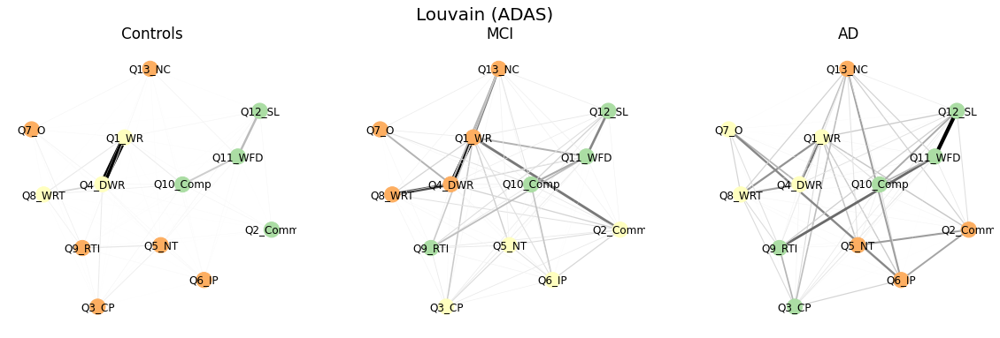

In [436]:
draw_graph_communities(graphs_ls, ADAS_Louvain_partitions, ADAS_labels, pos_ADAS, 'ADAS', 'Louvain')

#### Subgraph metrics

In [320]:
dx_ls = ['CN', 'MCI', 'AD']
for i in range(len(ADAS_Louvain_partitions)):
    print(dx_ls[i], "---------------------")
    display(community_metrics(graphs_ls[i], ADAS_Louvain_partitions[i]))

CN ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Visuospatial,Attention,Orientation,Language
0,0,3,3,0.280964,1.0,0.621274,1.0,0.353061,12.417122,"[Q1_WR, Q4_DWR, Q8_WRT]",1.0,0.0,0.0,0.0,0.0
1,1,6,15,0.051924,1.0,0.224667,1.0,0.328306,87.883376,"[Q3_CP, Q5_NT, Q6_IP, Q7_O, Q9_RTI, Q13_NC]",0.166667,0.333333,0.166667,0.166667,0.166667
2,2,4,6,0.076438,1.0,0.302338,1.0,0.284131,49.382252,"[Q2_Comm, Q11_WFD, Q12_SL, Q10_Comp]",0.0,0.0,0.0,0.0,1.0


MCI ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Visuospatial,Attention,Orientation,Language
0,0,4,6,0.125101,1.0,0.29568,1.0,0.769495,21.646069,"[Q2_Comm, Q3_CP, Q5_NT, Q6_IP]",0.0,0.5,0.0,0.0,0.5
1,1,5,10,0.270429,1.0,0.74338,1.0,0.302673,51.381628,"[Q1_WR, Q4_DWR, Q7_O, Q8_WRT, Q13_NC]",0.6,0.0,0.2,0.2,0.0
2,2,4,6,0.26698,1.0,0.48996,1.0,0.581447,14.2387,"[Q9_RTI, Q10_Comp, Q11_WFD, Q12_SL]",0.25,0.0,0.0,0.0,0.75


AD ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Visuospatial,Attention,Orientation,Language
0,0,4,6,0.213317,1.0,0.510848,1.0,0.558965,24.12047,"[Q1_WR, Q4_DWR, Q7_O, Q8_WRT]",0.75,0.0,0.0,0.25,0.0
1,1,4,6,0.208184,1.0,0.43289,1.0,0.61236,21.195114,"[Q2_Comm, Q13_NC, Q5_NT, Q6_IP]",0.0,0.25,0.25,0.0,0.5
2,2,5,10,0.212984,1.0,0.665832,1.0,0.340818,19.426036,"[Q3_CP, Q9_RTI, Q10_Comp, Q11_WFD, Q12_SL]",0.2,0.2,0.0,0.0,0.6


#### Export results

In [321]:
domains_rep(graphs_ls, ADAS_Louvain_partitions, 'ADAS', 'Louvain')

#### 8.1.2. GREEDY ALGORITHM

In [322]:
ADAS_Greedy_partitions = community_detection(graphs_ls, "Greedy")

--------------------------------
Greedy algorithm
--------------------------------
CN :  [frozenset({2, 4, 5, 6, 8, 12}), frozenset({1, 10, 11, 9}), frozenset({0, 3, 7})]
Modularity Index:  0.23109224207541662 

MCI :  [frozenset({0, 1, 3, 6, 7, 12}), frozenset({8, 9, 10, 11}), frozenset({2, 4, 5})]
Modularity Index:  0.11524702245813304 

AD :  [frozenset({2, 8, 9, 10, 11}), frozenset({1, 4, 5, 6, 12}), frozenset({0, 3, 7})]
Modularity Index:  0.14201022848599693 



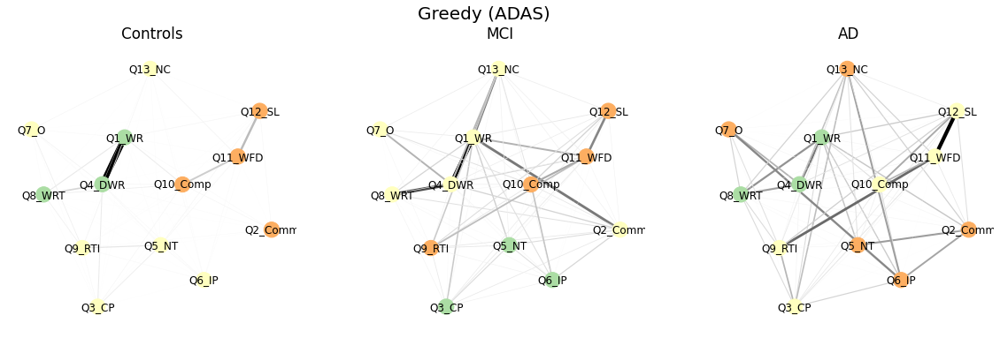

In [323]:
draw_graph_communities(graphs_ls, ADAS_Greedy_partitions, ADAS_labels, pos_ADAS, 'ADAS', 'Greedy')

#### Subgraph metrics

In [324]:
dx_ls = ['CN', 'MCI', 'AD']
for i in range(len(ADAS_Greedy_partitions)):
    print(dx_ls[i], "---------------------")
    display(community_metrics(graphs_ls[i], ADAS_Greedy_partitions[i]))

CN ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Visuospatial,Attention,Orientation,Language
0,0,6,15,0.051924,1.0,0.224667,1.0,0.328306,87.883376,"[Q3_CP, Q5_NT, Q6_IP, Q7_O, Q9_RTI, Q13_NC]",0.166667,0.333333,0.166667,0.166667,0.166667
1,1,4,6,0.076438,1.0,0.302338,1.0,0.284131,49.382252,"[Q2_Comm, Q11_WFD, Q12_SL, Q10_Comp]",0.0,0.0,0.0,0.0,1.0
2,2,3,3,0.280964,1.0,0.621274,1.0,0.353061,12.417122,"[Q1_WR, Q4_DWR, Q8_WRT]",1.0,0.0,0.0,0.0,0.0


MCI ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Visuospatial,Attention,Orientation,Language
0,0,6,15,0.251934,1.0,0.828963,1.0,0.280561,44.20849,"[Q1_WR, Q2_Comm, Q4_DWR, Q7_O, Q8_WRT, Q13_NC]",0.5,0.0,0.166667,0.166667,0.166667
1,1,4,6,0.26698,1.0,0.48996,1.0,0.581447,14.2387,"[Q9_RTI, Q10_Comp, Q11_WFD, Q12_SL]",0.25,0.0,0.0,0.0,0.75
2,2,3,3,0.113704,1.0,0.185621,1.0,0.785433,23.3939,"[Q3_CP, Q5_NT, Q6_IP]",0.0,0.666667,0.0,0.0,0.333333


AD ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Visuospatial,Attention,Orientation,Language
0,0,5,10,0.212984,1.0,0.665832,1.0,0.340818,19.426036,"[Q3_CP, Q9_RTI, Q10_Comp, Q11_WFD, Q12_SL]",0.2,0.2,0.0,0.0,0.6
1,1,5,10,0.121862,1.0,0.486813,1.0,0.417834,37.008334,"[Q2_Comm, Q5_NT, Q6_IP, Q7_O, Q13_NC]",0.0,0.2,0.2,0.2,0.4
2,2,3,3,0.263082,1.0,0.466302,1.0,0.882573,8.648117,"[Q1_WR, Q4_DWR, Q8_WRT]",1.0,0.0,0.0,0.0,0.0


#### Export results

In [325]:
domains_rep(graphs_ls, ADAS_Greedy_partitions, 'ADAS', 'Greedy')

#### 8.1.3. BISECTION ALGORITHM

In [326]:
ADAS_Bisection_partitions = community_detection(graphs_ls, "Bisection")

--------------------------------
Bisection algorithm
--------------------------------
CN :  ({1, 5, 9, 10, 11, 12}, {0, 2, 3, 4, 6, 7, 8})
Modularity Index:  0.16114241722644163 

MCI :  ({2, 5, 8, 9, 10, 11}, {0, 1, 3, 4, 6, 7, 12})
Modularity Index:  0.09331831388721867 

AD :  ({2, 4, 8, 9, 10, 11}, {0, 1, 3, 5, 6, 7, 12})
Modularity Index:  0.11551408374016062 



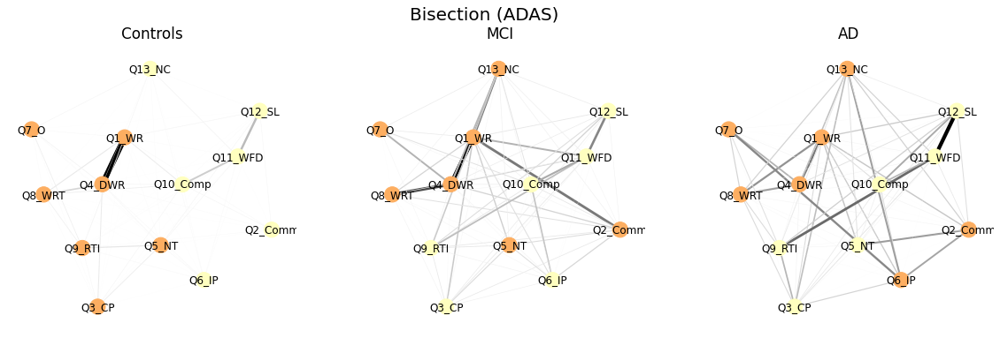

In [327]:
draw_graph_communities(graphs_ls, ADAS_Bisection_partitions, ADAS_labels, pos_ADAS, 'ADAS', 'Bisection')

#### Subgraph metrics

In [328]:
dx_ls = ['CN', 'MCI', 'AD']
for i in range(len(ADAS_Bisection_partitions)):
    print(dx_ls[i], "---------------------")
    display(community_metrics(graphs_ls[i], ADAS_Bisection_partitions[i]))

CN ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Visuospatial,Attention,Orientation,Language
0,0,6,15,0.049277,1.0,0.282655,1.0,0.155638,219.528893,"[Q2_Comm, Q6_IP, Q10_Comp, Q11_WFD, Q12_SL, Q1...",0.0,0.166667,0.166667,0.0,0.666667
1,1,7,21,0.077898,1.0,0.526964,1.0,0.088312,77.496217,"[Q1_WR, Q3_CP, Q4_DWR, Q5_NT, Q7_O, Q8_WRT, Q9...",0.571429,0.142857,0.0,0.142857,0.142857


MCI ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Visuospatial,Attention,Orientation,Language
0,0,6,15,0.084471,1.0,0.510393,1.0,0.282786,2315.2334,"[Q3_CP, Q6_IP, Q9_RTI, Q10_Comp, Q11_WFD, Q12_SL]",0.166667,0.333333,0.0,0.0,0.5
1,1,7,21,0.135463,1.0,0.819531,1.0,0.223411,80.863731,"[Q1_WR, Q2_Comm, Q4_DWR, Q5_NT, Q7_O, Q8_WRT, ...",0.428571,0.0,0.142857,0.142857,0.285714


AD ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Visuospatial,Attention,Orientation,Language
0,0,6,15,0.127877,1.0,0.641736,1.0,0.255971,28.716252,"[Q3_CP, Q5_NT, Q9_RTI, Q10_Comp, Q11_WFD, Q12_SL]",0.166667,0.166667,0.0,0.0,0.666667
1,1,7,21,0.131667,1.0,0.75587,1.0,0.392501,36.78521,"[Q1_WR, Q2_Comm, Q4_DWR, Q6_IP, Q7_O, Q8_WRT, ...",0.428571,0.142857,0.142857,0.142857,0.142857


#### Export results

In [329]:
domains_rep(graphs_ls, ADAS_Bisection_partitions, 'ADAS', 'Bisection')

#### 8.1.4. LABEL PROPAGATION ALGORITHM

In [330]:
ADAS_Label_partitions = community_detection(graphs_ls, "Label Propagation")

--------------------------------
Label Propagation algorithm
--------------------------------
CN :  [{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12}]
Modularity Index:  2.220446049250313e-16 

MCI :  [{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12}]
Modularity Index:  2.220446049250313e-16 

AD :  [{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12}]
Modularity Index:  -2.220446049250313e-16 



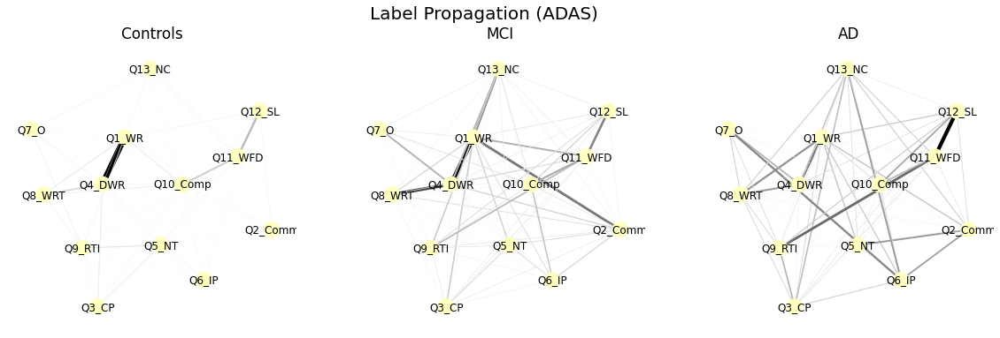

In [331]:
draw_graph_communities(graphs_ls, ADAS_Label_partitions, ADAS_labels, pos_ADAS, 'ADAS', 'Label Propagation')

#### Subgraph metrics

In [332]:
dx_ls = ['CN', 'MCI', 'AD']
for i in range(len(ADAS_Label_partitions)):
    print(dx_ls[i], "---------------------")
    display(community_metrics(graphs_ls[i], ADAS_Label_partitions[i]))

CN ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Visuospatial,Attention,Orientation,Language
0,0,13,78,0.024934,1.0,0.596719,1.0,0.049668,312.173991,"[Q1_WR, Q2_Comm, Q3_CP, Q4_DWR, Q5_NT, Q6_IP, ...",0.307692,0.153846,0.076923,0.076923,0.384615


MCI ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Visuospatial,Attention,Orientation,Language
0,0,13,78,0.107403,1.0,1.108621,1.0,0.149361,1061.789396,"[Q1_WR, Q2_Comm, Q3_CP, Q4_DWR, Q5_NT, Q6_IP, ...",0.307692,0.153846,0.076923,0.076923,0.384615


AD ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Visuospatial,Attention,Orientation,Language
0,0,13,78,0.072843,1.0,1.133648,1.0,0.177877,60.786965,"[Q1_WR, Q2_Comm, Q3_CP, Q4_DWR, Q5_NT, Q6_IP, ...",0.307692,0.153846,0.076923,0.076923,0.384615


#### Export results

In [333]:
domains_rep(graphs_ls, ADAS_Label_partitions, 'ADAS', 'Asyn')

### 8.2. MMSE

In [334]:
graphs_ls = [MMSE_CN_graph, MMSE_MCI_graph, MMSE_AD_graph]

#### 8.2.1. LOUVAIN ALGORITHM

In [335]:
MMSE_Louvain_partitions = community_detection(graphs_ls, "Louvain")

--------------------------------
Louvain algorithm
--------------------------------
CN :  [{2, 10}, {8, 1, 4, 5}, {0, 3, 6, 7, 9}]
Modularity Index:  0.0992433660097898 

MCI :  [{0, 9}, {1, 4}, {2, 6, 7}, {8, 10, 3, 5}]
Modularity Index:  0.09552556243704208 

AD :  [{1, 3, 4, 8, 9, 10}, {0, 2, 5, 6, 7}]
Modularity Index:  0.06706724849025167 



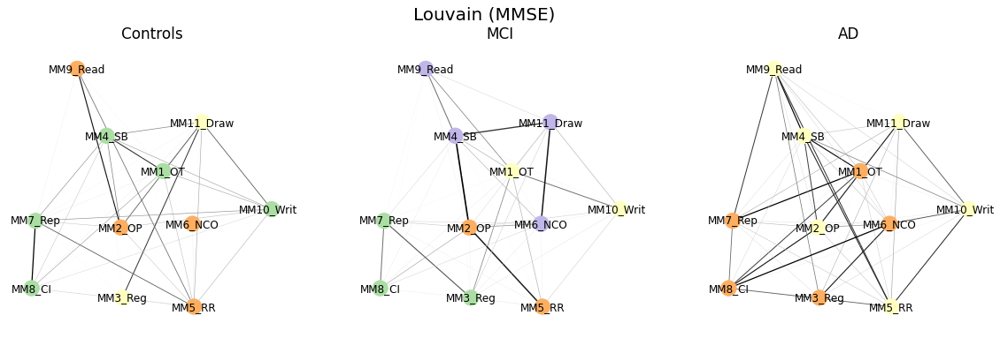

In [336]:
test_labels = None

draw_graph_communities(graphs_ls, MMSE_Louvain_partitions, MMSE_labels, pos_MMSE, 'MMSE', 'Louvain')

#### Subgraph metrics

In [337]:
dx_ls = ['CN', 'MCI', 'AD']
for i in range(len(MMSE_Louvain_partitions)):
    print(dx_ls[i], "---------------------")
    display(community_metrics(graphs_ls[i], MMSE_Louvain_partitions[i]))

CN ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Visuospatial,Attention,Orientation,Language
0,0,2,1,0.103104,1.0,0.103104,0,0.0,19.397959,"[MM3_Reg, MM11_Draw]",0.5,0.5,0.0,0.0,0.0
1,1,4,6,0.041413,1.0,0.142663,1.0,0.278342,371.641208,"[MM9_Read, MM2_OP, MM5_RR, MM6_NCO]",0.25,0.0,0.0,0.25,0.5
2,2,5,10,0.090433,1.0,0.258472,1.0,0.478115,38.147519,"[MM1_OT, MM4_SB, MM7_Rep, MM8_CI, MM10_Write]",0.0,0.0,0.2,0.2,0.6


MCI ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Visuospatial,Attention,Orientation,Language
0,0,2,1,0.101945,1.0,0.101945,0,0.0,19.618407,"[MM1_OT, MM10_Write]",0.0,0.0,0.0,0.5,0.5
1,1,2,1,0.150334,1.0,0.150334,0,0.0,13.30374,"[MM2_OP, MM5_RR]",0.5,0.0,0.0,0.5,0.0
2,2,3,3,0.118096,1.0,0.1654,1.0,0.584587,36.751309,"[MM3_Reg, MM7_Rep, MM8_CI]",0.333333,0.0,0.0,0.0,0.666667
3,3,4,6,0.120023,1.0,0.257051,1.0,0.441298,78.548683,"[MM9_Read, MM11_Draw, MM4_SB, MM6_NCO]",0.0,0.25,0.25,0.0,0.5


AD ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Visuospatial,Attention,Orientation,Language
0,0,6,15,0.108924,1.0,0.366663,1.0,0.549372,40.864794,"[MM2_OP, MM4_SB, MM5_RR, MM9_Read, MM10_Write,...",0.166667,0.166667,0.166667,0.166667,0.333333
1,1,5,10,0.083322,1.0,0.279721,1.0,0.467807,61.258036,"[MM1_OT, MM3_Reg, MM6_NCO, MM7_Rep, MM8_CI]",0.2,0.0,0.0,0.2,0.6


#### Export results

In [338]:
domains_rep(graphs_ls, MMSE_Louvain_partitions, 'MMSE', 'Louvain')

#### 8.2.2. GREEDY ALGORITHM

In [339]:
MMSE_Greedy_partitions = community_detection(graphs_ls, "Greedy")

--------------------------------
Greedy algorithm
--------------------------------
CN :  [frozenset({0, 3, 6, 7, 9}), frozenset({8, 1, 4, 5}), frozenset({2, 10})]
Modularity Index:  0.0992433660097898 

MCI :  [frozenset({8, 10, 3, 5}), frozenset({2, 6, 7}), frozenset({1, 4}), frozenset({0, 9})]
Modularity Index:  0.09552556243704208 

AD :  [frozenset({1, 3, 4, 8, 9, 10}), frozenset({0, 2, 5, 6, 7})]
Modularity Index:  0.06706724849025167 



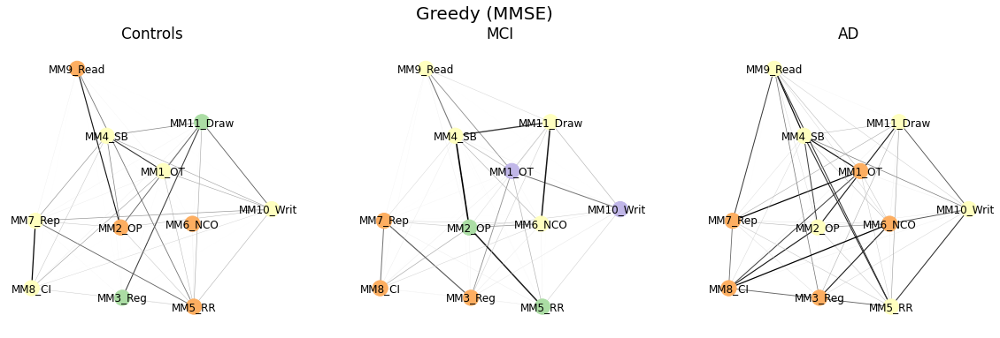

In [340]:
draw_graph_communities(graphs_ls, MMSE_Greedy_partitions, MMSE_labels, pos_MMSE, 'MMSE', 'Greedy')

#### Subgraph metrics

In [341]:
dx_ls = ['CN', 'MCI', 'AD']
for i in range(len(MMSE_Greedy_partitions)):
    print(dx_ls[i], "---------------------")
    display(community_metrics(graphs_ls[i], MMSE_Greedy_partitions[i]))

CN ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Visuospatial,Attention,Orientation,Language
0,0,5,10,0.090433,1.0,0.258472,1.0,0.478115,38.147519,"[MM1_OT, MM4_SB, MM7_Rep, MM8_CI, MM10_Write]",0.0,0.0,0.2,0.2,0.6
1,1,4,6,0.041413,1.0,0.142663,1.0,0.278342,371.641208,"[MM9_Read, MM2_OP, MM5_RR, MM6_NCO]",0.25,0.0,0.0,0.25,0.5
2,2,2,1,0.103104,1.0,0.103104,0,0.0,19.397959,"[MM3_Reg, MM11_Draw]",0.5,0.5,0.0,0.0,0.0


MCI ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Visuospatial,Attention,Orientation,Language
0,0,4,6,0.120023,1.0,0.257051,1.0,0.441298,78.548683,"[MM9_Read, MM11_Draw, MM4_SB, MM6_NCO]",0.0,0.25,0.25,0.0,0.5
1,1,3,3,0.118096,1.0,0.1654,1.0,0.584587,36.751309,"[MM3_Reg, MM7_Rep, MM8_CI]",0.333333,0.0,0.0,0.0,0.666667
2,2,2,1,0.150334,1.0,0.150334,0,0.0,13.30374,"[MM2_OP, MM5_RR]",0.5,0.0,0.0,0.5,0.0
3,3,2,1,0.101945,1.0,0.101945,0,0.0,19.618407,"[MM1_OT, MM10_Write]",0.0,0.0,0.0,0.5,0.5


AD ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Visuospatial,Attention,Orientation,Language
0,0,6,15,0.108924,1.0,0.366663,1.0,0.549372,40.864794,"[MM2_OP, MM4_SB, MM5_RR, MM9_Read, MM10_Write,...",0.166667,0.166667,0.166667,0.166667,0.333333
1,1,5,10,0.083322,1.0,0.279721,1.0,0.467807,61.258036,"[MM1_OT, MM3_Reg, MM6_NCO, MM7_Rep, MM8_CI]",0.2,0.0,0.0,0.2,0.6


#### Export results

In [342]:
domains_rep(graphs_ls, MMSE_Greedy_partitions, 'MMSE', 'Greedy')

#### 8.2.3. BISECTION ALGORITHM

In [343]:
MMSE_Bisection_partitions = community_detection(graphs_ls, "Bisection")

--------------------------------
Bisection algorithm
--------------------------------
CN :  ({1, 2, 5, 8, 10}, {0, 3, 4, 6, 7, 9})
Modularity Index:  0.05852955426572551 

MCI :  ({1, 2, 4, 6, 7}, {0, 3, 5, 8, 9, 10})
Modularity Index:  0.0875834999087719 

AD :  ({1, 2, 5, 9, 10}, {0, 3, 4, 6, 7, 8})
Modularity Index:  0.06152500117465062 



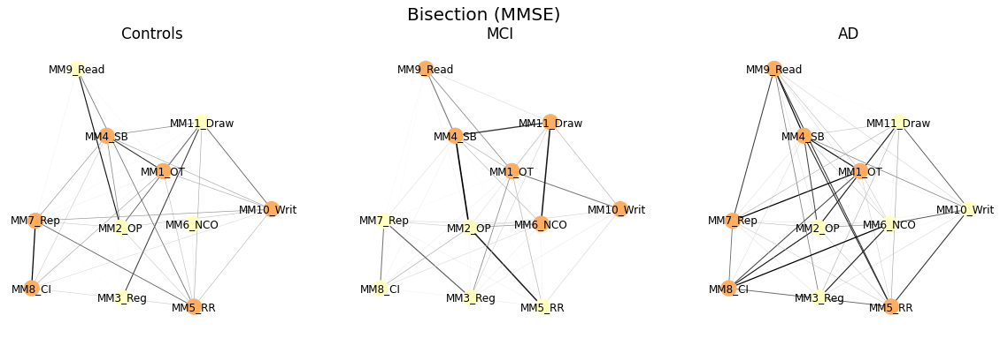

In [344]:
draw_graph_communities(graphs_ls, MMSE_Bisection_partitions, MMSE_labels, pos_MMSE, 'MMSE', 'Bisection')

#### Subgraph metrics

In [345]:
dx_ls = ['CN', 'MCI', 'AD']
for i in range(len(MMSE_Bisection_partitions)):
    print(dx_ls[i], "---------------------")
    display(community_metrics(graphs_ls[i], MMSE_Bisection_partitions[i]))

CN ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Visuospatial,Attention,Orientation,Language
0,0,5,10,0.01944,1.0,0.142955,1.0,0.15395,501.257067,"[MM2_OP, MM3_Reg, MM6_NCO, MM9_Read, MM11_Draw]",0.2,0.2,0.0,0.2,0.4
1,1,6,15,0.085341,1.0,0.296392,1.0,0.429853,48.976193,"[MM1_OT, MM4_SB, MM5_RR, MM7_Rep, MM8_CI, MM10...",0.166667,0.0,0.166667,0.166667,0.5


MCI ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Visuospatial,Attention,Orientation,Language
0,0,5,10,0.065976,1.0,0.255584,1.0,0.353481,53.911917,"[MM2_OP, MM3_Reg, MM5_RR, MM7_Rep, MM8_CI]",0.4,0.0,0.0,0.2,0.4
1,1,6,15,0.075985,1.0,0.326815,1.0,0.34264,120.138634,"[MM1_OT, MM4_SB, MM6_NCO, MM9_Read, MM10_Write...",0.0,0.166667,0.166667,0.166667,0.5


AD ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Visuospatial,Attention,Orientation,Language
0,0,5,10,0.09289,1.0,0.252848,1.0,0.462048,57.979651,"[MM2_OP, MM3_Reg, MM6_NCO, MM10_Write, MM11_Draw]",0.2,0.2,0.0,0.2,0.4
1,1,6,15,0.096978,1.0,0.390169,1.0,0.550378,49.4349,"[MM1_OT, MM4_SB, MM5_RR, MM7_Rep, MM8_CI, MM9_...",0.166667,0.0,0.166667,0.166667,0.5


#### Export results

In [346]:
domains_rep(graphs_ls, MMSE_Bisection_partitions, 'MMSE', 'Bisection')

#### 8.2.4. LABEL PROPAGATION ALGORITHM

In [347]:
MMSE_Label_partitions = community_detection(graphs_ls, "Label Propagation")

--------------------------------
Label Propagation algorithm
--------------------------------
CN :  [{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10}]
Modularity Index:  2.220446049250313e-16 

MCI :  [{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10}]
Modularity Index:  2.220446049250313e-16 

AD :  [{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10}]
Modularity Index:  -3.3306690738754696e-16 



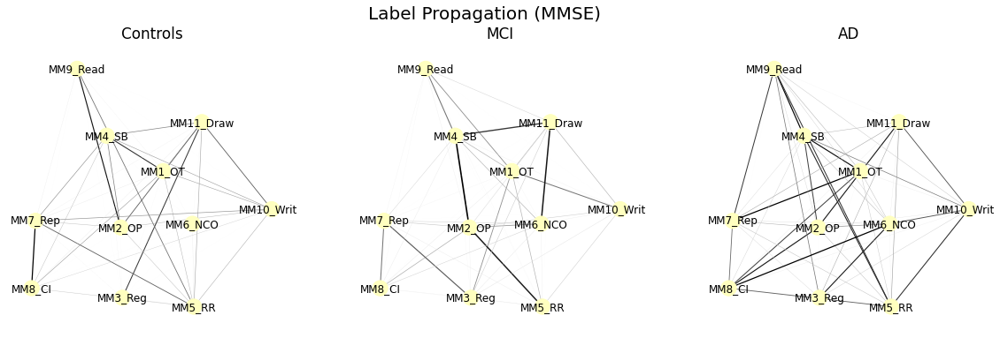

In [348]:
draw_graph_communities(graphs_ls, MMSE_Label_partitions, MMSE_labels, pos_MMSE, 'MMSE', 'Label Propagation')

#### Subgraph metrics

In [349]:
dx_ls = ['CN', 'MCI', 'AD']
for i in range(len(MMSE_Label_partitions)):
    print(dx_ls[i], "---------------------")
    display(community_metrics(graphs_ls[i], MMSE_Label_partitions[i]))

CN ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Visuospatial,Attention,Orientation,Language
0,0,11,55,0.03063,1.0,0.384,1.0,0.236921,309.761319,"[MM1_OT, MM2_OP, MM3_Reg, MM4_SB, MM5_RR, MM6_...",0.181818,0.090909,0.090909,0.181818,0.454545


MCI ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Visuospatial,Attention,Orientation,Language
0,0,11,55,0.048217,1.0,0.494464,1.0,0.232887,193.152612,"[MM1_OT, MM2_OP, MM3_Reg, MM4_SB, MM5_RR, MM6_...",0.181818,0.090909,0.090909,0.181818,0.454545


AD ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Visuospatial,Attention,Orientation,Language
0,0,11,55,0.047426,1.0,0.568676,1.0,0.359604,488.215713,"[MM1_OT, MM2_OP, MM3_Reg, MM4_SB, MM5_RR, MM6_...",0.181818,0.090909,0.090909,0.181818,0.454545


#### Export results

In [350]:
domains_rep(graphs_ls, MMSE_Label_partitions, 'MMSE', 'Asyn')

### 8.3. MOCA

In [351]:
graphs_ls = [MOCA_CN_graph, MOCA_MCI_graph, MOCA_AD_graph]

#### 8.3.1. LOUVAIN ALGORITHM

In [352]:
MOCA_Louvain_partitions = community_detection(graphs_ls, "Louvain")

--------------------------------
Louvain algorithm
--------------------------------
CN :  [{3, 4, 5}, {1, 2, 7, 8, 9, 11, 13}, {0, 6, 10, 12, 14, 15}]
Modularity Index:  0.1108349210493034 

MCI :  [{8, 1, 3, 5}, {0, 2, 4, 7, 9, 11, 12, 13}, {10, 6, 14, 15}]
Modularity Index:  0.08372904158412521 

AD :  [{10, 4, 5}, {0, 1, 2, 7, 8, 9, 12, 13}, {3, 11, 6}, {14, 15}]
Modularity Index:  0.09579275850770758 



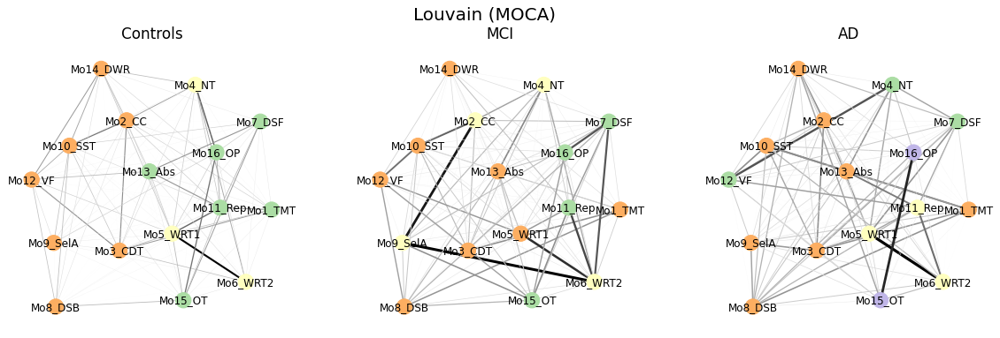

In [353]:
draw_graph_communities(graphs_ls, MOCA_Louvain_partitions, MOCA_labels, pos_MOCA, 'MOCA', 'Louvain')

#### Subgraph metrics

In [354]:
dx_ls = ['CN', 'MCI', 'AD']
for i in range(len(MOCA_Louvain_partitions)):
    print(dx_ls[i], "---------------------")
    display(community_metrics(graphs_ls[i], MOCA_Louvain_partitions[i]))

CN ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Visuospatial,Memory,Attention,Orientation,Language
0,0,3,3,0.162487,1.0,0.24851,1.0,0.526908,20.849815,"[Mo4_NT, Mo5_WRT1, Mo6_WRT2]",0.0,0.0,0.666667,0.0,0.0,0.333333
1,1,7,21,0.100936,1.0,0.374439,1.0,0.395749,109.1789,"[Mo2_CC, Mo3_CDT, Mo8_DSB, Mo9_SelA, Mo10_SST,...",0.285714,0.285714,0.142857,0.142857,0.0,0.142857
2,2,6,15,0.107763,1.0,0.357954,1.0,0.498663,39.394263,"[Mo1_TMT, Mo7_DSF, Mo11_Rep, Mo13_Abs, Mo15_OT...",0.5,0.0,0.0,0.0,0.333333,0.166667


MCI ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Visuospatial,Memory,Attention,Orientation,Language
0,0,4,6,0.261343,1.0,0.525502,1.0,0.512095,15.236068,"[Mo9_SelA, Mo2_CC, Mo4_NT, Mo6_WRT2]",0.0,0.25,0.25,0.25,0.0,0.25
1,1,8,28,0.083386,1.0,0.578923,1.0,0.362159,69.373747,"[Mo1_TMT, Mo3_CDT, Mo5_WRT1, Mo8_DSB, Mo10_SST...",0.5,0.125,0.25,0.0,0.0,0.125
2,2,4,6,0.22596,1.0,0.426622,1.0,0.59548,15.786919,"[Mo11_Rep, Mo16_OP, Mo7_DSF, Mo15_OT]",0.25,0.0,0.0,0.0,0.5,0.25


AD ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Visuospatial,Memory,Attention,Orientation,Language
0,0,3,3,0.320578,1.0,0.448859,1.0,0.664588,9.874349,"[Mo11_Rep, Mo5_WRT1, Mo6_WRT2]",0.0,0.0,0.666667,0.0,0.0,0.333333
1,1,8,28,0.138399,1.0,0.739245,1.0,0.466876,53.285911,"[Mo1_TMT, Mo2_CC, Mo3_CDT, Mo8_DSB, Mo9_SelA, ...",0.5,0.25,0.125,0.125,0.0,0.0
2,2,3,3,0.239491,1.0,0.323857,1.0,0.634918,13.968568,"[Mo12_VF, Mo4_NT, Mo7_DSF]",0.333333,0.0,0.0,0.0,0.0,0.666667
3,3,2,1,0.280114,1.0,0.280114,0,0.0,7.139941,"[Mo15_OT, Mo16_OP]",0.0,0.0,0.0,0.0,1.0,0.0


#### Export results

In [355]:
domains_rep(graphs_ls, MOCA_Louvain_partitions, 'MOCA', 'Louvain')

#### 8.3.2. GREEDY ALGORITHM

In [356]:
MOCA_Greedy_partitions = community_detection(graphs_ls, "Greedy")

--------------------------------
Greedy algorithm
--------------------------------
CN :  [frozenset({0, 3, 4, 5, 6, 10, 12, 14, 15}), frozenset({1, 2, 7, 8, 9, 11, 13})]
Modularity Index:  0.1099507048993103 

MCI :  [frozenset({0, 2, 7, 9, 11, 12, 13}), frozenset({4, 5, 6, 10, 14, 15}), frozenset({8, 1, 3})]
Modularity Index:  0.09536205263709568 

AD :  [frozenset({0, 1, 2, 7, 8, 9, 12, 13}), frozenset({10, 4, 5}), frozenset({3, 11, 6}), frozenset({14, 15})]
Modularity Index:  0.09579275850770758 



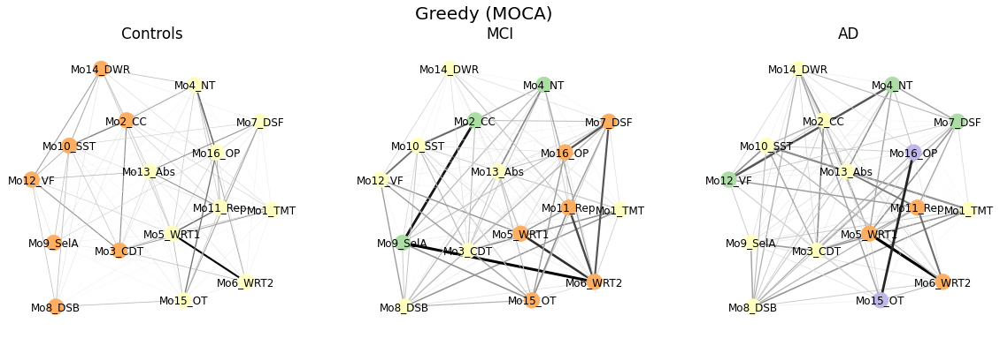

In [357]:
draw_graph_communities(graphs_ls, MOCA_Greedy_partitions, MOCA_labels, pos_MOCA, 'MOCA', 'Greedy')

#### Subgraph metrics

In [358]:
dx_ls = ['CN', 'MCI', 'AD']
for i in range(len(MOCA_Greedy_partitions)):
    print(dx_ls[i], "---------------------")
    display(community_metrics(graphs_ls[i], MOCA_Greedy_partitions[i]))

CN ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Visuospatial,Memory,Attention,Orientation,Language
0,0,9,36,0.080723,1.0,0.534769,1.0,0.26429,105.614242,"[Mo1_TMT, Mo4_NT, Mo5_WRT1, Mo6_WRT2, Mo7_DSF,...",0.333333,0.0,0.222222,0.0,0.222222,0.222222
1,1,7,21,0.100936,1.0,0.374439,1.0,0.395749,109.1789,"[Mo2_CC, Mo3_CDT, Mo8_DSB, Mo9_SelA, Mo10_SST,...",0.285714,0.285714,0.142857,0.142857,0.0,0.142857


MCI ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Visuospatial,Memory,Attention,Orientation,Language
0,0,7,21,0.101804,1.0,0.516426,1.0,0.379716,65.08052,"[Mo1_TMT, Mo3_CDT, Mo8_DSB, Mo10_SST, Mo12_VF,...",0.571429,0.142857,0.142857,0.0,0.0,0.142857
1,1,6,15,0.169472,1.0,0.682763,1.0,0.473602,21.666726,"[Mo5_WRT1, Mo6_WRT2, Mo7_DSF, Mo11_Rep, Mo15_O...",0.166667,0.0,0.333333,0.0,0.333333,0.166667
2,2,3,3,0.261343,1.0,0.362046,1.0,0.597582,12.837613,"[Mo9_SelA, Mo2_CC, Mo4_NT]",0.0,0.333333,0.0,0.333333,0.0,0.333333


AD ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Visuospatial,Memory,Attention,Orientation,Language
0,0,8,28,0.138399,1.0,0.739245,1.0,0.466876,53.285911,"[Mo1_TMT, Mo2_CC, Mo3_CDT, Mo8_DSB, Mo9_SelA, ...",0.5,0.25,0.125,0.125,0.0,0.0
1,1,3,3,0.320578,1.0,0.448859,1.0,0.664588,9.874349,"[Mo11_Rep, Mo5_WRT1, Mo6_WRT2]",0.0,0.0,0.666667,0.0,0.0,0.333333
2,2,3,3,0.239491,1.0,0.323857,1.0,0.634918,13.968568,"[Mo12_VF, Mo4_NT, Mo7_DSF]",0.333333,0.0,0.0,0.0,0.0,0.666667
3,3,2,1,0.280114,1.0,0.280114,0,0.0,7.139941,"[Mo15_OT, Mo16_OP]",0.0,0.0,0.0,0.0,1.0,0.0


#### Export results

In [359]:
domains_rep(graphs_ls, MOCA_Greedy_partitions, 'MOCA', 'Greedy')

#### 8.3.3. BISECTION ALGORITHM

In [360]:
MOCA_Bisection_partitions = community_detection(graphs_ls, "Bisection")

--------------------------------
Bisection algorithm
--------------------------------
CN :  ({3, 4, 5, 6, 10, 12, 14, 15}, {0, 1, 2, 7, 8, 9, 11, 13})
Modularity Index:  0.10831232610730876 

MCI :  ({1, 4, 5, 6, 8, 10, 14, 15}, {0, 2, 3, 7, 9, 11, 12, 13})
Modularity Index:  0.07892659103000962 

AD :  ({0, 3, 6, 7, 9, 10, 11, 12}, {1, 2, 4, 5, 8, 13, 14, 15})
Modularity Index:  0.07549276647617575 



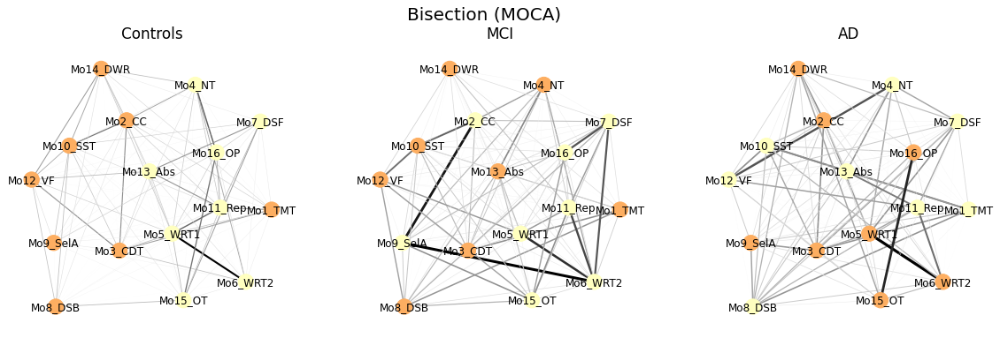

In [361]:
draw_graph_communities(graphs_ls, MOCA_Bisection_partitions, MOCA_labels, pos_MOCA, 'MOCA', 'Bisection')

#### Subgraph metrics

In [362]:
dx_ls = ['CN', 'MCI', 'AD']
for i in range(len(MOCA_Bisection_partitions)):
    print(dx_ls[i], "---------------------")
    display(community_metrics(graphs_ls[i], MOCA_Bisection_partitions[i]))

CN ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Visuospatial,Memory,Attention,Orientation,Language
0,0,8,28,0.080723,1.0,0.507111,1.0,0.280981,118.291235,"[Mo4_NT, Mo5_WRT1, Mo6_WRT2, Mo7_DSF, Mo11_Rep...",0.25,0.0,0.25,0.0,0.25,0.25
1,1,8,28,0.052747,1.0,0.398373,1.0,0.346028,158.83782,"[Mo1_TMT, Mo2_CC, Mo3_CDT, Mo8_DSB, Mo9_SelA, ...",0.375,0.25,0.125,0.125,0.0,0.125


MCI ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Visuospatial,Memory,Attention,Orientation,Language
0,0,8,28,0.169472,1.0,0.841189,1.0,0.33094,33.805778,"[Mo2_CC, Mo5_WRT1, Mo6_WRT2, Mo7_DSF, Mo9_SelA...",0.125,0.125,0.25,0.125,0.25,0.125
1,1,8,28,0.098698,1.0,0.567436,1.0,0.353258,67.457004,"[Mo1_TMT, Mo3_CDT, Mo4_NT, Mo8_DSB, Mo10_SST, ...",0.5,0.125,0.125,0.0,0.0,0.25


AD ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Visuospatial,Memory,Attention,Orientation,Language
0,0,8,28,0.107974,1.0,0.748094,1.0,0.368598,48.749884,"[Mo1_TMT, Mo4_NT, Mo7_DSF, Mo8_DSB, Mo10_SST, ...",0.625,0.0,0.0,0.0,0.0,0.375
1,1,8,28,0.120423,1.0,0.707898,1.0,0.259141,54.883657,"[Mo2_CC, Mo3_CDT, Mo5_WRT1, Mo6_WRT2, Mo9_SelA...",0.0,0.25,0.375,0.125,0.25,0.0


#### Export results

In [363]:
domains_rep(graphs_ls, MOCA_Bisection_partitions, 'MOCA', 'Bisection')

#### 8.3.4. LABEL PROPAGATION ALGORITHM

In [364]:
MOCA_Label_partitions = community_detection(graphs_ls, "Label Propagation")

--------------------------------
Label Propagation algorithm
--------------------------------
CN :  [{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15}]
Modularity Index:  -1.1102230246251565e-16 

MCI :  [{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15}]
Modularity Index:  -2.220446049250313e-16 

AD :  [{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15}]
Modularity Index:  -2.220446049250313e-16 



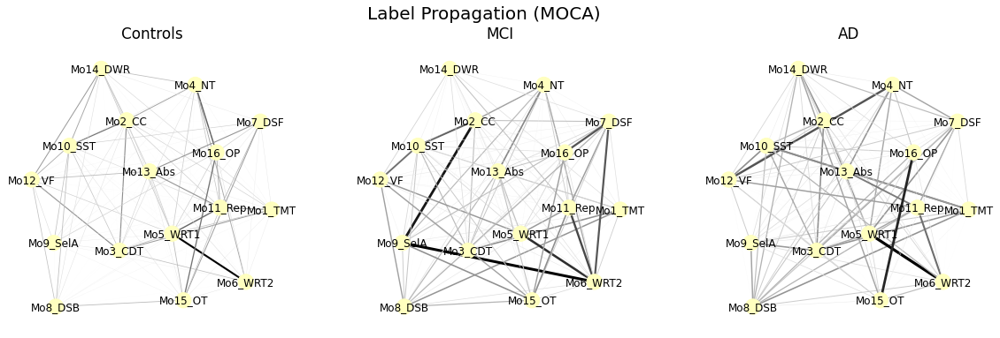

In [365]:
draw_graph_communities(graphs_ls, MOCA_Label_partitions, MOCA_labels, pos_MOCA, 'MOCA', 'Label Propagation')

#### Subgraph metrics

In [366]:
dx_ls = ['CN', 'MCI', 'AD']
for i in range(len(MOCA_Label_partitions)):
    print(dx_ls[i], "---------------------")
    display(community_metrics(graphs_ls[i], MOCA_Label_partitions[i]))

CN ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Visuospatial,Memory,Attention,Orientation,Language
0,0,16,120,0.050079,1.0,0.74098,1.0,0.182495,224.295479,"[Mo1_TMT, Mo2_CC, Mo3_CDT, Mo4_NT, Mo5_WRT1, M...",0.3125,0.125,0.1875,0.0625,0.125,0.1875


MCI ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Visuospatial,Memory,Attention,Orientation,Language
0,0,16,120,0.081054,1.0,1.203135,1.0,0.213075,214.103713,"[Mo1_TMT, Mo2_CC, Mo3_CDT, Mo4_NT, Mo5_WRT1, M...",0.3125,0.125,0.1875,0.0625,0.125,0.1875


AD ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Visuospatial,Memory,Attention,Orientation,Language
0,0,16,120,0.045455,1.0,1.264718,1.0,0.20536,128.320361,"[Mo1_TMT, Mo2_CC, Mo3_CDT, Mo4_NT, Mo5_WRT1, M...",0.3125,0.125,0.1875,0.0625,0.125,0.1875


#### Export results

In [367]:
domains_rep(graphs_ls, MOCA_Label_partitions, 'MOCA', 'Asyn')

### 8.4. Merged

In [368]:
graphs_ls = [merged_CN_graph, merged_MCI_graph, merged_AD_graph]

#### 8.4.1. LOUVAIN ALGORITHM

In [369]:
merged_Louvain_partitions = community_detection(graphs_ls, "Louvain")

--------------------------------
Louvain algorithm
--------------------------------
CN :  [{1, 33, 34, 36, 21, 26, 14, 31}, {2, 37, 38, 6, 19, 24, 25, 28}, {4, 5, 9, 10, 11, 12, 16, 18, 27}, {32, 35, 13, 17, 22, 23, 29, 30}, {0, 3, 20, 7, 39, 8, 15}]
Modularity Index:  0.09793737886561726 

MCI :  [{32, 2, 37, 5, 24, 25}, {34, 39, 38, 6, 27}, {17, 21, 22, 8, 9, 11, 13}, {33, 4, 36, 10, 15, 16, 18, 19, 23, 26, 30}, {0, 1, 35, 3, 7, 12, 14, 20, 28, 29, 31}]
Modularity Index:  0.10723211897771306 

AD :  [{32, 2, 9, 13, 14, 15, 16, 20, 22, 23, 25, 26}, {18, 38, 39, 8, 6, 10, 11}, {0, 3, 37, 7, 12, 17, 19, 28, 29, 30, 31}, {1, 33, 35, 4, 5, 36, 34, 21, 24, 27}]
Modularity Index:  0.09057866895432677 



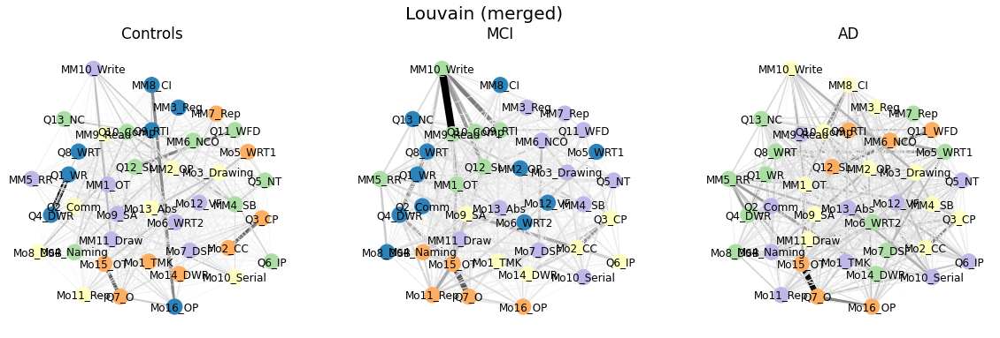

In [370]:
draw_graph_communities(graphs_ls, merged_Louvain_partitions, merged_labels, pos_merged, 'merged', 'Louvain')

#### Subgraph metrics

In [371]:
dx_ls = ['CN', 'MCI', 'AD']
for i in range(len(merged_Louvain_partitions)):
    print(dx_ls[i], "---------------------")
    display(community_metrics(graphs_ls[i], merged_Louvain_partitions[i]))

CN ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Memory,Visuospatial,Attention,Orientation,Language
0,0,8,28,0.125199,1.0,0.621175,1.0,0.388136,48.668139,"[Q2_Comm, Mo11_Rep, Mo10_Serial, Mo13_Abs, MM2...",0.125,0.0,0.125,0.25,0.125,0.375
1,1,8,28,0.09604,1.0,0.746274,1.0,0.207922,52.861319,"[Q3_CP, Mo14_DWR, Mo15_OT, Q7_O, MM7_Rep, Mo1_...",0.125,0.25,0.25,0.0,0.25,0.125
2,2,9,36,0.076827,1.0,0.645029,1.0,0.1875,150.487947,"[Q5_NT, Q6_IP, Q10_Comp, Q11_WFD, Q12_SL, Q13_...",0.111111,0.0,0.0,0.222222,0.0,0.666667
3,3,8,28,0.106723,1.0,0.561745,1.0,0.303304,60.6768,"[Mo9_SA, Mo12_VF, MM1_OT, MM5_RR, MM10_Write, ...",0.0,0.25,0.125,0.25,0.125,0.25
4,4,7,19,0.166581,0.904762,0.727689,0.906977,0.168667,37.235988,"[Q1_WR, Q4_DWR, Mo16_OP, Q8_WRT, Q9_RTI, MM3_R...",0.0,0.714286,0.0,0.0,0.142857,0.142857


MCI ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Memory,Visuospatial,Attention,Orientation,Language
0,0,6,15,0.295801,1.0,0.951133,1.0,0.413918,16.011455,"[Mo9_SA, Q3_CP, Q6_IP, Mo14_DWR, Mo1_TMK, Mo2_CC]",0.333333,0.166667,0.333333,0.166667,0.0,0.0
1,1,5,10,0.273099,1.0,0.944973,1.0,0.335795,12.849542,"[Mo11_Rep, Q7_O, Mo15_OT, Mo16_OP, Mo4_Naming]",0.0,0.0,0.0,0.0,0.6,0.4
2,2,7,21,0.386301,1.0,1.581095,1.0,0.289817,10.828643,"[Q9_RTI, Q10_Comp, Q12_SL, MM1_OT, MM5_RR, MM9...",0.0,0.285714,0.0,0.0,0.142857,0.571429
3,3,11,55,0.123458,1.0,1.130932,1.0,0.31871,47.938722,"[Mo10_Serial, Q5_NT, Mo13_Abs, Q11_WFD, MM3_Re...",0.090909,0.090909,0.181818,0.272727,0.0,0.363636
4,4,11,55,0.110397,1.0,1.173515,1.0,0.198937,44.422066,"[Q1_WR, Q2_Comm, Mo12_VF, Q4_DWR, Q8_WRT, Q13_...",0.0,0.454545,0.0,0.181818,0.090909,0.272727


AD ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Memory,Visuospatial,Attention,Orientation,Language
0,0,12,66,0.14713,1.0,1.349884,1.0,0.294319,42.582815,"[Mo9_SA, Q3_CP, Q10_Comp, MM1_OT, MM2_OP, MM3_...",0.083333,0.083333,0.25,0.166667,0.166667,0.25
1,1,7,21,0.156204,1.0,1.016992,1.0,0.202363,68.647777,"[Q7_O, Mo15_OT, Q9_RTI, Mo16_OP, Q11_WFD, Q12_...",0.0,0.142857,0.0,0.0,0.428571,0.428571
2,2,11,55,0.141277,1.0,1.230047,1.0,0.314867,59.717508,"[Q1_WR, Q4_DWR, Mo14_DWR, Q8_WRT, Q13_NC, MM5_...",0.0,0.636364,0.0,0.272727,0.0,0.090909
3,3,10,45,0.138613,1.0,0.956352,1.0,0.37172,43.309461,"[Q2_Comm, Mo10_Serial, Mo12_VF, Q5_NT, Q6_IP, ...",0.2,0.0,0.1,0.1,0.0,0.6


#### Export results

In [372]:
domains_rep(graphs_ls, merged_Louvain_partitions, 'merged', 'Louvain')

#### 8.4.2. GREEDY ALGORITHM

In [373]:
merged_Greedy_partitions = community_detection(graphs_ls, "Greedy")

--------------------------------
Greedy algorithm
--------------------------------
CN :  [frozenset({1, 34, 4, 36, 5, 9, 14, 16, 18, 19, 21, 24, 26, 27}), frozenset({32, 17, 28, 35, 12, 29, 30}), frozenset({0, 3, 20, 39, 7, 13, 15}), frozenset({33, 37, 8, 10, 11, 31}), frozenset({2, 23, 38, 6, 22, 25})]
Modularity Index:  0.10021750502111575 

MCI :  [frozenset({33, 4, 36, 39, 10, 14, 16, 18, 19, 23, 26, 30}), frozenset({8, 9, 11, 13, 17, 20, 21, 22}), frozenset({32, 1, 2, 37, 5, 24, 25}), frozenset({0, 34, 3, 38, 7, 6, 27}), frozenset({29, 35, 31, 28, 12, 15})]
Modularity Index:  0.10564344711476913 

AD :  [frozenset({32, 2, 9, 13, 14, 15, 16, 20, 23, 24, 25, 31}), frozenset({0, 3, 7, 8, 10, 11, 18, 19, 22, 26, 28}), frozenset({1, 33, 35, 4, 36, 5, 12, 21, 27, 30}), frozenset({17, 34, 37, 38, 6, 39, 29})]
Modularity Index:  0.0918521601744821 



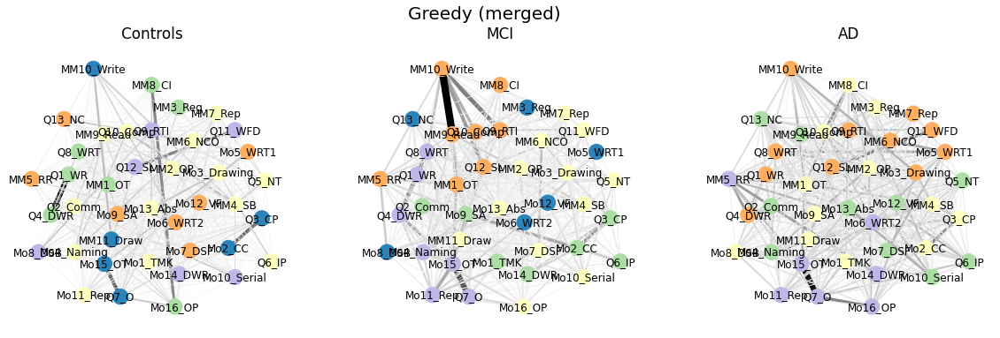

In [374]:
draw_graph_communities(graphs_ls, merged_Greedy_partitions, merged_labels, pos_merged, 'merged', 'Greedy')

#### Subgraph metrics

In [375]:
dx_ls = ['CN', 'MCI', 'AD']
for i in range(len(merged_Greedy_partitions)):
    print(dx_ls[i], "---------------------")
    display(community_metrics(graphs_ls[i], merged_Greedy_partitions[i]))

CN ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Memory,Visuospatial,Attention,Orientation,Language
0,0,14,91,0.079515,1.0,0.977722,1.0,0.272001,95.812443,"[Q2_Comm, Mo11_Rep, Q5_NT, Q6_IP, Mo13_Abs, Q1...",0.142857,0.0,0.142857,0.071429,0.071429,0.571429
1,1,7,21,0.105977,1.0,0.459632,1.0,0.331226,254.674134,"[Mo9_SA, Mo12_VF, Q13_NC, MM5_RR, Mo5_WRT1, Mo...",0.0,0.428571,0.0,0.428571,0.0,0.142857
2,2,7,19,0.158246,0.904762,0.705191,0.906977,0.163864,48.465541,"[Q1_WR, Q4_DWR, Q8_WRT, Mo16_OP, MM1_OT, MM3_R...",0.0,0.571429,0.0,0.0,0.285714,0.142857
3,3,6,15,0.103308,1.0,0.503466,1.0,0.23737,49.76646,"[Mo10_Serial, Mo14_DWR, Q9_RTI, Q11_WFD, Q12_S...",0.0,0.333333,0.0,0.333333,0.0,0.333333
4,4,6,15,0.139286,1.0,0.700361,1.0,0.272903,28.243799,"[Q3_CP, Q7_O, Mo15_OT, MM10_Write, MM11_Draw, ...",0.166667,0.0,0.333333,0.0,0.333333,0.166667


MCI ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Memory,Visuospatial,Attention,Orientation,Language
0,0,12,66,0.126917,1.0,1.209537,1.0,0.312515,44.929034,"[Mo10_Serial, Q5_NT, Mo13_Abs, Mo16_OP, Q11_WF...",0.083333,0.0,0.166667,0.25,0.166667,0.333333
1,1,8,28,0.240187,1.0,1.54559,1.0,0.230457,22.854446,"[Q9_RTI, Q10_Comp, Q12_SL, MM1_OT, MM5_RR, MM8...",0.0,0.25,0.0,0.0,0.125,0.625
2,2,7,21,0.226203,1.0,1.051305,1.0,0.366986,27.454412,"[Mo9_SA, Q2_Comm, Q3_CP, Q6_IP, Mo14_DWR, Mo1_...",0.285714,0.142857,0.285714,0.142857,0.0,0.142857
3,3,7,21,0.364779,1.0,1.312227,1.0,0.305977,19.632456,"[Q1_WR, Mo11_Rep, Q4_DWR, Mo15_OT, Q8_WRT, Q7_...",0.0,0.428571,0.0,0.0,0.285714,0.285714
4,4,6,15,0.147717,1.0,0.517623,1.0,0.382333,39.552718,"[Mo12_VF, Q13_NC, MM3_Reg, Mo5_WRT1, Mo6_WRT2,...",0.0,0.5,0.0,0.333333,0.0,0.166667


AD ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Memory,Visuospatial,Attention,Orientation,Language
0,0,12,66,0.122417,1.0,1.300546,1.0,0.278903,68.674278,"[Mo9_SA, Q3_CP, Q10_Comp, MM1_OT, MM2_OP, MM3_...",0.083333,0.083333,0.25,0.25,0.166667,0.166667
1,1,11,55,0.109797,1.0,1.278475,1.0,0.294285,48.243592,"[Q1_WR, Q4_DWR, Q8_WRT, Q9_RTI, Q11_WFD, Q12_S...",0.0,0.454545,0.090909,0.0,0.0,0.454545
2,2,10,45,0.12148,1.0,0.959158,1.0,0.363637,45.219434,"[Q2_Comm, Mo10_Serial, Mo12_VF, Q5_NT, Mo13_Ab...",0.2,0.0,0.0,0.3,0.0,0.5
3,3,7,21,0.242833,1.0,1.026237,1.0,0.230676,29.46827,"[Mo11_Rep, Mo14_DWR, Mo15_OT, Q7_O, Mo16_OP, M...",0.0,0.428571,0.0,0.0,0.428571,0.142857


In [376]:
domains_rep(graphs_ls, merged_Greedy_partitions, 'merged', 'Greedy')

#### 8.4.3. BISECTION ALGORITHM

In [377]:
merged_Bisection_partitions = community_detection(graphs_ls, "Bisection")

--------------------------------
Bisection algorithm
--------------------------------
CN :  ({1, 2, 4, 6, 8, 10, 11, 14, 15, 19, 21, 24, 25, 30, 31, 32, 33, 34, 37, 38}, {0, 3, 5, 7, 9, 12, 13, 16, 17, 18, 20, 22, 23, 26, 27, 28, 29, 35, 36, 39})
Modularity Index:  0.07714473476248354 

MCI :  ({0, 1, 3, 6, 7, 9, 11, 12, 13, 17, 21, 22, 27, 28, 29, 31, 32, 34, 35, 38}, {2, 4, 5, 8, 10, 14, 15, 16, 18, 19, 20, 23, 24, 25, 26, 30, 33, 36, 37, 39})
Modularity Index:  0.0922939861601782 

AD :  ({0, 3, 7, 8, 10, 11, 12, 16, 18, 19, 21, 22, 26, 27, 28, 29, 30, 31, 32, 39}, {1, 2, 4, 5, 6, 9, 13, 14, 15, 17, 20, 23, 24, 25, 33, 34, 35, 36, 37, 38})
Modularity Index:  0.07668544339234146 



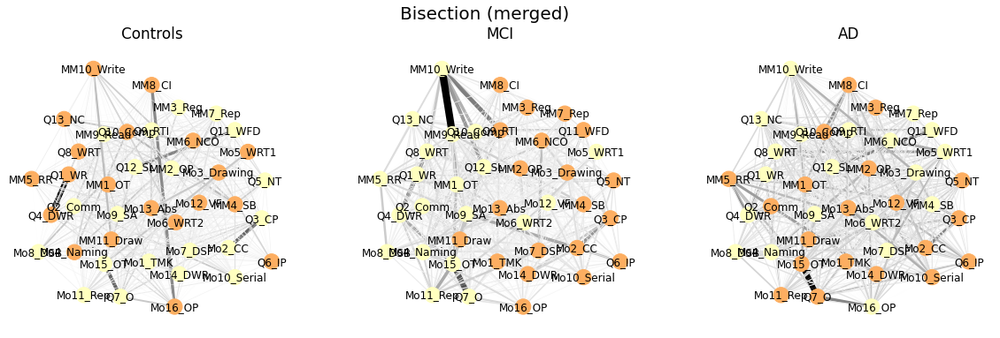

In [378]:
draw_graph_communities(graphs_ls, merged_Bisection_partitions, merged_labels, pos_merged, 'merged', 'Bisection')

#### Subgraph metrics

In [379]:
dx_ls = ['CN', 'MCI', 'AD']
for i in range(len(merged_Bisection_partitions)):
    print(dx_ls[i], "---------------------")
    display(community_metrics(graphs_ls[i], merged_Bisection_partitions[i]))

CN ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Memory,Visuospatial,Attention,Orientation,Language
0,0,20,179,0.053337,0.942105,1.270812,0.971419,0.137258,95.920197,"[Q2_Comm, Q3_CP, Q5_NT, Q7_O, Q9_RTI, Q11_WFD,...",0.05,0.15,0.1,0.2,0.15,0.35
1,1,20,190,0.033094,1.0,1.268427,1.0,0.087813,187.64587,"[Q1_WR, Q4_DWR, Q6_IP, Q8_WRT, Q10_Comp, Q13_N...",0.1,0.3,0.1,0.1,0.1,0.3


MCI ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Memory,Visuospatial,Attention,Orientation,Language
0,0,20,182,0.100076,0.957895,2.518099,0.972152,0.130603,97.871694,"[Q1_WR, Q2_Comm, Q4_DWR, Q7_O, Q8_WRT, Q10_Com...",0.0,0.3,0.0,0.15,0.15,0.4
1,1,20,190,0.074996,1.0,1.843349,1.0,0.192527,88.553799,"[Q3_CP, Q5_NT, Q6_IP, Q9_RTI, Q11_WFD, MM2_OP,...",0.15,0.15,0.2,0.15,0.1,0.25


AD ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Memory,Visuospatial,Attention,Orientation,Language
0,0,20,190,0.084489,1.0,1.966951,1.0,0.23957,85.239415,"[Q1_WR, Q4_DWR, Q8_WRT, Q9_RTI, Q11_WFD, Q12_S...",0.0,0.3,0.05,0.25,0.05,0.35
1,1,20,190,0.066541,1.0,1.866885,1.0,0.12702,132.917175,"[Q2_Comm, Q3_CP, Q5_NT, Q6_IP, Q7_O, Q10_Comp,...",0.15,0.15,0.15,0.05,0.2,0.3


#### Export results

In [380]:
domains_rep(graphs_ls, merged_Bisection_partitions, 'merged', 'Bisection')

#### 8.4.4. LABEL PROPAGATION ALGORITHM

In [381]:
merged_Label_partitions = community_detection(graphs_ls, "Label Propagation")

--------------------------------
Label Propagation algorithm
--------------------------------
CN :  [{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39}]
Modularity Index:  3.3306690738754696e-16 

MCI :  [{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39}]
Modularity Index:  1.5543122344752192e-15 

AD :  [{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39}]
Modularity Index:  -6.661338147750939e-16 



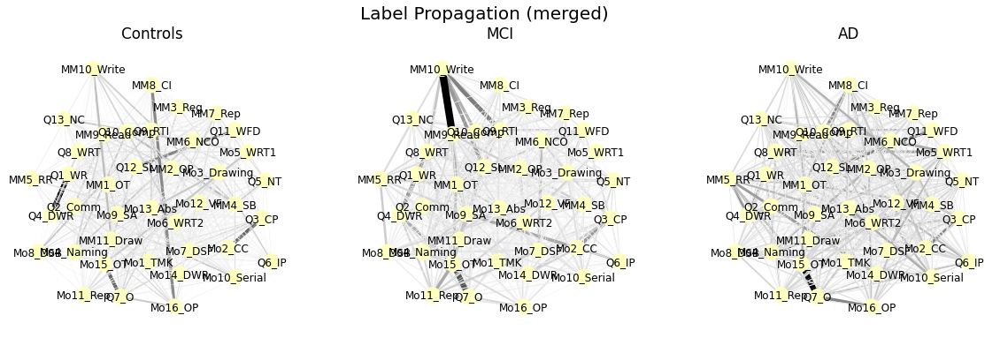

In [382]:
draw_graph_communities(graphs_ls, merged_Label_partitions, merged_labels, pos_merged, 'merged', 'Label Propagation')

In [383]:
dx_ls = ['CN', 'MCI', 'AD']
for i in range(len(merged_Label_partitions)):
    print(dx_ls[i], "---------------------")
    display(community_metrics(graphs_ls[i], merged_Label_partitions[i]))

CN ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Memory,Visuospatial,Attention,Orientation,Language
0,0,40,756,0.02798,0.969231,2.199828,0.987185,0.075977,320.977064,"[Q1_WR, Q2_Comm, Q3_CP, Q4_DWR, Q5_NT, Q6_IP, ...",0.075,0.225,0.1,0.15,0.125,0.325


MCI ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Memory,Visuospatial,Attention,Orientation,Language
0,0,40,763,0.038476,0.978205,3.655543,0.98687,0.089277,239.851831,"[Q1_WR, Q2_Comm, Q3_CP, Q4_DWR, Q5_NT, Q6_IP, ...",0.075,0.225,0.1,0.15,0.125,0.325


AD ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Memory,Visuospatial,Attention,Orientation,Language
0,0,40,780,0.031649,1.0,3.323374,1.0,0.108622,216.765297,"[Q1_WR, Q2_Comm, Q3_CP, Q4_DWR, Q5_NT, Q6_IP, ...",0.075,0.225,0.1,0.15,0.125,0.325


#### Export results

In [384]:
domains_rep(graphs_ls, merged_Label_partitions, 'merged', 'Asyn')

### 8.5. Merged (ADAS and MoCA)

In [385]:
graphs_ls = [ADASMOCA_CN_graph, ADASMOCA_MCI_graph, ADASMOCA_AD_graph]

#### 8.4.1. LOUVAIN ALGORITHM

In [386]:
ADASMOCA_Louvain_partitions = community_detection(graphs_ls, "Louvain")

--------------------------------
Louvain algorithm
--------------------------------
CN :  [{0, 3, 7}, {1, 2, 8, 14, 20, 21, 22, 24, 26}, {16, 9, 10, 11}, {19, 4, 5, 23, 25, 13, 15}, {17, 18, 6, 27, 28, 12}]
Modularity Index:  0.13599810862815365 

MCI :  [{0, 16, 1, 3, 21, 7, 12}, {2, 19, 4, 5, 26, 28, 14}, {8, 9, 10, 11, 13, 15, 20, 22, 24, 25}, {17, 18, 6, 23, 27}]
Modularity Index:  0.13348084208148253 

AD :  [{0, 3, 7, 16, 17, 18, 19, 20, 26}, {5, 8, 9, 10, 11, 12, 15, 21, 24}, {1, 2, 13, 14, 22, 23, 25}, {4, 6, 27, 28}]
Modularity Index:  0.11557121440072747 



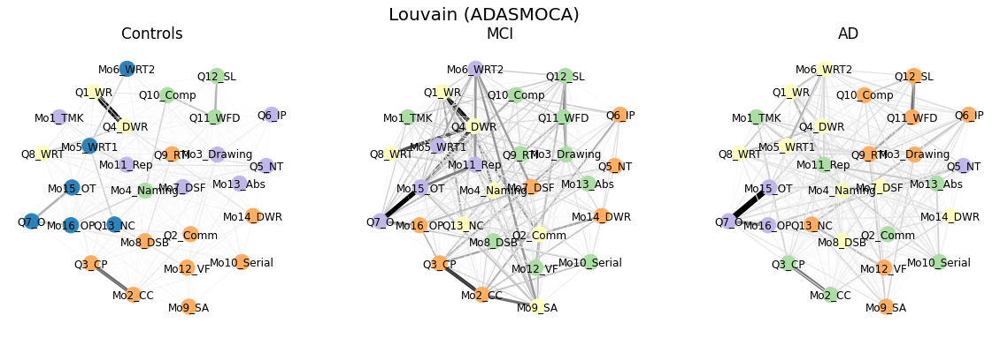

In [387]:
draw_graph_communities(graphs_ls, ADASMOCA_Louvain_partitions, ADASMOCA_labels, pos_ADASMOCA, 'ADASMOCA', 'Louvain')

#### Subgraph metrics

In [388]:
dx_ls = ['CN', 'MCI', 'AD']
for i in range(len(ADASMOCA_Louvain_partitions)):
    print(dx_ls[i], "---------------------")
    display(community_metrics(graphs_ls[i], ADASMOCA_Louvain_partitions[i]))

CN ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Memory,Visuospatial,Attention,Orientation,Language
0,0,3,3,0.268307,1.0,0.600322,1.0,0.34333,13.544089,"[Q1_WR, Q4_DWR, Q8_WRT]",0.0,1.0,0.0,0.0,0.0,0.0
1,1,9,36,0.065167,1.0,0.504977,1.0,0.112422,233.874931,"[Q2_Comm, Q3_CP, Q9_RTI, Mo2_CC, Mo8_DSB, Mo9_...",0.111111,0.222222,0.111111,0.333333,0.0,0.222222
2,2,4,6,0.109681,1.0,0.369843,1.0,0.339356,56.799105,"[Mo4_Naming, Q10_Comp, Q11_WFD, Q12_SL]",0.0,0.0,0.0,0.0,0.0,1.0
3,3,7,21,0.083428,1.0,0.359652,1.0,0.397054,54.943905,"[Q5_NT, Q6_IP, Mo1_TMK, Mo3_Drawing, Mo7_DSF, ...",0.285714,0.0,0.285714,0.142857,0.0,0.285714
4,4,6,15,0.092346,1.0,0.471897,1.0,0.295859,39.421343,"[Q7_O, Q13_NC, Mo5_WRT1, Mo6_WRT2, Mo15_OT, Mo...",0.0,0.333333,0.0,0.166667,0.5,0.0


MCI ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Memory,Visuospatial,Attention,Orientation,Language
0,0,7,21,0.324753,1.0,1.050754,1.0,0.30515,51.54462,"[Q1_WR, Q2_Comm, Q4_DWR, Q8_WRT, Q13_NC, Mo4_N...",0.0,0.428571,0.0,0.285714,0.0,0.285714
1,1,7,21,0.177882,1.0,0.7515,1.0,0.24875,31.719615,"[Q3_CP, Q5_NT, Q6_IP, Mo2_CC, Mo7_DSF, Mo14_DW...",0.285714,0.142857,0.142857,0.142857,0.142857,0.142857
2,2,10,45,0.091955,1.0,0.894275,1.0,0.292712,63.705189,"[Q9_RTI, Q10_Comp, Q11_WFD, Q12_SL, Mo1_TMK, M...",0.1,0.1,0.2,0.2,0.0,0.4
3,3,5,10,0.260916,1.0,0.85692,1.0,0.368138,13.100503,"[Q7_O, Mo5_WRT1, Mo6_WRT2, Mo11_Rep, Mo15_OT]",0.0,0.4,0.0,0.0,0.4,0.2


AD ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Memory,Visuospatial,Attention,Orientation,Language
0,0,9,36,0.160512,1.0,0.956651,1.0,0.381158,31.311493,"[Q1_WR, Q4_DWR, Q8_WRT, Mo4_Naming, Mo5_WRT1, ...",0.0,0.666667,0.0,0.222222,0.0,0.111111
1,1,9,36,0.093763,1.0,0.877326,1.0,0.202254,77.407539,"[Q6_IP, Q9_RTI, Q10_Comp, Q11_WFD, Q12_SL, Q13...",0.111111,0.111111,0.111111,0.222222,0.0,0.444444
2,2,7,21,0.103253,1.0,0.664899,1.0,0.198438,88.411726,"[Q2_Comm, Q3_CP, Mo1_TMK, Mo2_CC, Mo10_Serial,...",0.285714,0.0,0.285714,0.142857,0.0,0.285714
3,3,4,6,0.262506,1.0,0.753956,1.0,0.276367,18.007162,"[Mo15_OT, Q5_NT, Mo16_OP, Q7_O]",0.0,0.0,0.0,0.0,0.75,0.25


#### Export results

In [389]:
domains_rep(graphs_ls, ADASMOCA_Louvain_partitions, 'ADASMOCA', 'Louvain')

#### 8.4.2. GREEDY ALGORITHM

In [390]:
ADASMOCA_Greedy_partitions = community_detection(graphs_ls, "Greedy")

--------------------------------
Greedy algorithm
--------------------------------
CN :  [frozenset({4, 5, 12, 13, 15, 17, 18, 19, 23, 24, 25}), frozenset({1, 2, 6, 8, 14, 20, 21, 22, 27, 28}), frozenset({16, 9, 10, 11}), frozenset({0, 26, 3, 7})]
Modularity Index:  0.14186752131849814 

MCI :  [frozenset({8, 9, 10, 11, 13, 15, 20, 24, 25}), frozenset({2, 4, 5, 14, 19, 22, 26, 28}), frozenset({16, 0, 1, 3, 21, 7, 12}), frozenset({17, 18, 6, 23, 27})]
Modularity Index:  0.13395730565457234 

AD :  [frozenset({1, 5, 8, 9, 10, 11, 12, 15, 21, 24}), frozenset({2, 13, 14, 16, 19, 20, 22, 25, 26}), frozenset({0, 17, 18, 3, 23, 7}), frozenset({27, 4, 28, 6})]
Modularity Index:  0.11696134578371783 



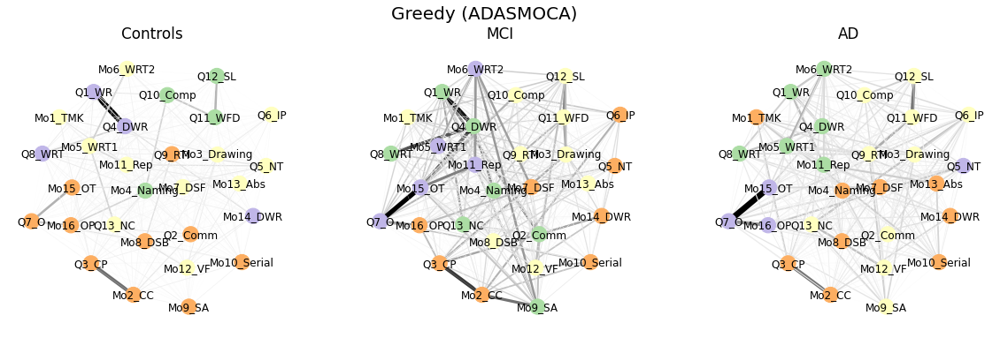

In [391]:
draw_graph_communities(graphs_ls, ADASMOCA_Greedy_partitions, ADASMOCA_labels, pos_ADASMOCA, 'ADASMOCA', 'Greedy')

#### Subgraph metrics

In [392]:
dx_ls = ['CN', 'MCI', 'AD']
for i in range(len(ADASMOCA_Greedy_partitions)):
    print(dx_ls[i], "---------------------")
    display(community_metrics(graphs_ls[i], ADASMOCA_Greedy_partitions[i]))

CN ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Memory,Visuospatial,Attention,Orientation,Language
0,0,11,55,0.062304,1.0,0.547443,1.0,0.234526,222.256377,"[Q5_NT, Q6_IP, Q13_NC, Mo1_TMK, Mo3_Drawing, M...",0.181818,0.181818,0.181818,0.181818,0.0,0.272727
1,1,10,45,0.080263,1.0,0.642131,1.0,0.136811,79.058857,"[Q2_Comm, Q3_CP, Q7_O, Q9_RTI, Mo2_CC, Mo8_DSB...",0.1,0.1,0.1,0.3,0.3,0.1
2,2,4,6,0.109681,1.0,0.369843,1.0,0.339356,56.799105,"[Mo4_Naming, Q10_Comp, Q11_WFD, Q12_SL]",0.0,0.0,0.0,0.0,0.0,1.0
3,3,4,6,0.168725,1.0,0.547056,1.0,0.193307,34.675687,"[Q1_WR, Mo14_DWR, Q4_DWR, Q8_WRT]",0.0,1.0,0.0,0.0,0.0,0.0


MCI ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Memory,Visuospatial,Attention,Orientation,Language
0,0,9,36,0.103871,1.0,0.844713,1.0,0.320587,46.937393,"[Q9_RTI, Q10_Comp, Q11_WFD, Q12_SL, Mo1_TMK, M...",0.111111,0.111111,0.222222,0.111111,0.0,0.444444
1,1,8,28,0.125421,1.0,0.797329,1.0,0.22302,36.975964,"[Q3_CP, Q5_NT, Q6_IP, Mo2_CC, Mo7_DSF, Mo10_Se...",0.25,0.125,0.125,0.25,0.125,0.125
2,2,7,21,0.324753,1.0,1.050754,1.0,0.30515,51.54462,"[Q1_WR, Q2_Comm, Q4_DWR, Q8_WRT, Q13_NC, Mo4_N...",0.0,0.428571,0.0,0.285714,0.0,0.285714
3,3,5,10,0.260916,1.0,0.85692,1.0,0.368138,13.100503,"[Q7_O, Mo5_WRT1, Mo6_WRT2, Mo11_Rep, Mo15_OT]",0.0,0.4,0.0,0.0,0.4,0.2


AD ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Memory,Visuospatial,Attention,Orientation,Language
0,0,10,45,0.085695,1.0,0.916419,1.0,0.187601,86.384009,"[Q2_Comm, Q6_IP, Q9_RTI, Q10_Comp, Q11_WFD, Q1...",0.1,0.1,0.1,0.2,0.0,0.5
1,1,9,36,0.101113,1.0,0.813114,1.0,0.204027,82.566401,"[Q3_CP, Mo1_TMK, Mo2_CC, Mo4_Naming, Mo7_DSF, ...",0.222222,0.111111,0.222222,0.333333,0.0,0.111111
2,2,6,15,0.229973,1.0,0.798459,1.0,0.506424,26.097103,"[Q1_WR, Q4_DWR, Q8_WRT, Mo5_WRT1, Mo6_WRT2, Mo...",0.0,0.833333,0.0,0.0,0.0,0.166667
3,3,4,6,0.262506,1.0,0.753956,1.0,0.276367,18.007162,"[Mo15_OT, Q5_NT, Mo16_OP, Q7_O]",0.0,0.0,0.0,0.0,0.75,0.25


In [393]:
domains_rep(graphs_ls, ADASMOCA_Greedy_partitions, 'ADASMOCA', 'Greedy')

#### 8.4.3. BISECTION ALGORITHM

In [394]:
ADASMOCA_Bisection_partitions = community_detection(graphs_ls, "Bisection")

--------------------------------
Bisection algorithm
--------------------------------
CN :  ({0, 3, 5, 7, 9, 13, 15, 17, 18, 19, 23, 24, 25, 26}, {1, 2, 4, 6, 8, 10, 11, 12, 14, 16, 20, 21, 22, 27, 28})
Modularity Index:  0.10403752631003871 

MCI :  ({2, 5, 8, 10, 11, 13, 14, 15, 19, 20, 22, 24, 26, 28}, {0, 1, 3, 4, 6, 7, 9, 12, 16, 17, 18, 21, 23, 25, 27})
Modularity Index:  0.11046229781105227 

AD :  ({1, 4, 5, 6, 8, 9, 10, 11, 12, 15, 21, 24, 27, 28}, {0, 2, 3, 7, 13, 14, 16, 17, 18, 19, 20, 22, 23, 25, 26})
Modularity Index:  0.08544261570617853 



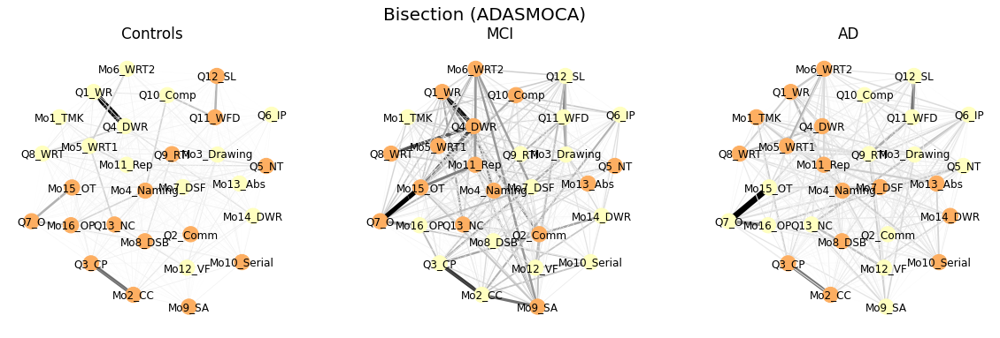

In [395]:
draw_graph_communities(graphs_ls, ADASMOCA_Bisection_partitions, ADASMOCA_labels, pos_ADASMOCA, 'ADASMOCA', 'Bisection')

#### Subgraph metrics

In [396]:
dx_ls = ['CN', 'MCI', 'AD']
for i in range(len(ADASMOCA_Bisection_partitions)):
    print(dx_ls[i], "---------------------")
    display(community_metrics(graphs_ls[i], ADASMOCA_Bisection_partitions[i]))

CN ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Memory,Visuospatial,Attention,Orientation,Language
0,0,14,91,0.064975,1.0,0.748546,1.0,0.070684,160.855717,"[Q1_WR, Q4_DWR, Q6_IP, Q8_WRT, Q10_Comp, Mo1_T...",0.142857,0.428571,0.142857,0.071429,0.0,0.214286
1,1,15,105,0.043252,1.0,0.804206,1.0,0.10688,454.489419,"[Q2_Comm, Q3_CP, Q5_NT, Q7_O, Q9_RTI, Q11_WFD,...",0.066667,0.066667,0.066667,0.266667,0.2,0.333333


MCI ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Memory,Visuospatial,Attention,Orientation,Language
0,0,14,91,0.071243,1.0,1.168145,1.0,0.165169,81.965212,"[Q3_CP, Q6_IP, Q9_RTI, Q11_WFD, Q12_SL, Mo1_TM...",0.142857,0.142857,0.214286,0.214286,0.071429,0.214286
1,1,15,105,0.122959,1.0,1.628494,1.0,0.181276,97.332583,"[Q1_WR, Q2_Comm, Q4_DWR, Q5_NT, Q7_O, Q8_WRT, ...",0.066667,0.333333,0.0,0.133333,0.133333,0.333333


AD ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Memory,Visuospatial,Attention,Orientation,Language
0,0,14,91,0.071552,1.0,1.204633,1.0,0.101908,111.154532,"[Q2_Comm, Q5_NT, Q6_IP, Q7_O, Q9_RTI, Q10_Comp...",0.071429,0.071429,0.071429,0.142857,0.214286,0.428571
1,1,15,105,0.088629,1.0,1.343915,1.0,0.187962,107.20342,"[Q1_WR, Q3_CP, Q4_DWR, Q8_WRT, Mo1_TMK, Mo2_CC...",0.133333,0.4,0.133333,0.2,0.0,0.133333


#### Export results

In [397]:
domains_rep(graphs_ls, ADASMOCA_Bisection_partitions, 'ADASMOCA', 'Bisection')

#### 8.4.4. LABEL PROPAGATION ALGORITHM

In [398]:
ADASMOCA_Label_partitions = community_detection(graphs_ls, "Label Propagation")

--------------------------------
Label Propagation algorithm
--------------------------------
CN :  [{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28}]
Modularity Index:  -5.551115123125783e-16 

MCI :  [{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28}]
Modularity Index:  -4.440892098500626e-16 

AD :  [{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28}]
Modularity Index:  -5.551115123125783e-16 



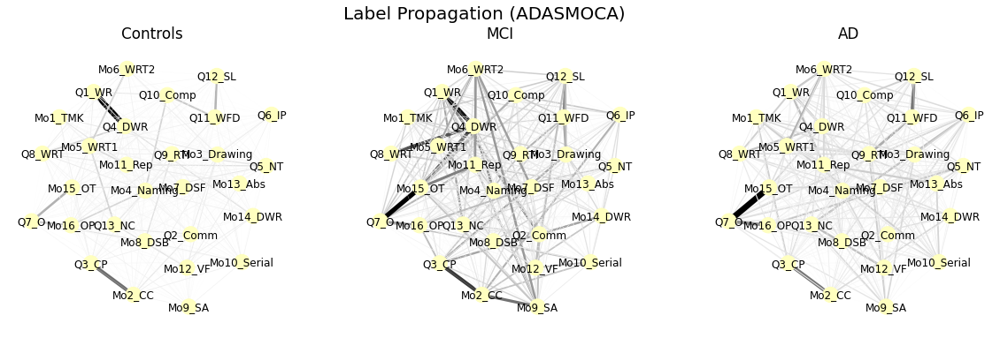

In [399]:
draw_graph_communities(graphs_ls, ADASMOCA_Label_partitions, ADASMOCA_labels, pos_ADASMOCA, 'ADASMOCA', 'Label Propagation')

In [400]:
dx_ls = ['CN', 'MCI', 'AD']
for i in range(len(ADASMOCA_Label_partitions)):
    print(dx_ls[i], "---------------------")
    display(community_metrics(graphs_ls[i], ADASMOCA_Label_partitions[i]))

CN ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Memory,Visuospatial,Attention,Orientation,Language
0,0,29,406,0.021108,1.0,1.284979,1.0,0.054174,983.505172,"[Q1_WR, Q2_Comm, Q3_CP, Q4_DWR, Q5_NT, Q6_IP, ...",0.103448,0.241379,0.103448,0.172414,0.103448,0.275862


MCI ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Memory,Visuospatial,Attention,Orientation,Language
0,0,29,406,0.033058,1.0,2.275699,1.0,0.119834,201.683486,"[Q1_WR, Q2_Comm, Q3_CP, Q4_DWR, Q5_NT, Q6_IP, ...",0.103448,0.241379,0.103448,0.172414,0.103448,0.275862


AD ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Executive,Memory,Visuospatial,Attention,Orientation,Language
0,0,29,406,0.038263,1.0,2.175638,1.0,0.090298,196.199484,"[Q1_WR, Q2_Comm, Q3_CP, Q4_DWR, Q5_NT, Q6_IP, ...",0.103448,0.241379,0.103448,0.172414,0.103448,0.275862


#### Export results

In [401]:
domains_rep(graphs_ls, ADASMOCA_Label_partitions, 'ADASMOCA', 'Asyn')

### 8.6. NEUROBAT

In [402]:
graphs_ls = [NEUROBAT_CN_graph, NEUROBAT_MCI_graph, NEUROBAT_AD_graph]

#### 8.4.1. LOUVAIN ALGORITHM

In [403]:
NEUROBAT_Louvain_partitions = community_detection(graphs_ls, "Louvain")

--------------------------------
Louvain algorithm
--------------------------------
CN :  [{0, 1, 2}, {3, 5, 6, 9, 10}, {8, 11, 4, 7}]
Modularity Index:  0.22844729145831238 

MCI :  [{0, 1, 2}, {3, 4, 5, 6}, {8, 11, 7}, {9, 10}]
Modularity Index:  0.21801316966659456 

AD :  [{0, 1, 2}, {5, 6}, {8, 7}, {3, 4, 9, 10, 11}]
Modularity Index:  0.1375343152262809 



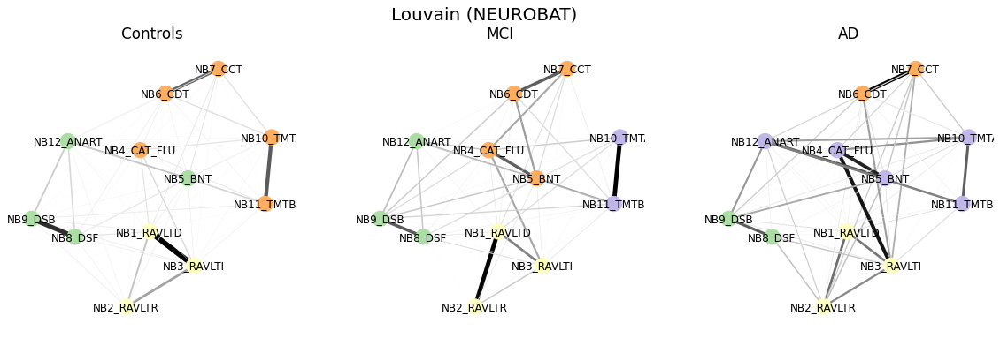

In [404]:
draw_graph_communities(graphs_ls, NEUROBAT_Louvain_partitions, NEUROBAT_labels, pos_NEUROBAT, 'NEUROBAT', 'Louvain')

#### Subgraph metrics

In [405]:
dx_ls = ['CN', 'MCI', 'AD']
for i in range(len(NEUROBAT_Louvain_partitions)):
    print(dx_ls[i], "---------------------")
    display(community_metrics(graphs_ls[i], NEUROBAT_Louvain_partitions[i]))

CN ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Executive,Language,Visuospatial
0,0,3,3,0.484013,1.0,0.721397,1.0,0.542774,7.018772,"[NB1_RAVLTD, NB2_RAVLTR, NB3_RAVLTI]",1.0,0.0,0.0,0.0
1,1,5,10,0.1626,1.0,0.627301,1.0,0.281845,25.768144,"[NB4_CAT_FLU, NB6_CDT, NB7_CCT, NB10_TMTA, NB1...",0.0,0.4,0.2,0.4
2,2,4,6,0.205652,1.0,0.616834,1.0,0.334867,16.31087,"[NB9_DSB, NB12_ANART, NB5_BNT, NB8_DSF]",0.0,0.5,0.5,0.0


MCI ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Executive,Language,Visuospatial
0,0,3,3,0.433217,1.0,0.609358,1.0,0.571498,8.231658,"[NB1_RAVLTD, NB2_RAVLTR, NB3_RAVLTI]",1.0,0.0,0.0,0.0
1,1,4,6,0.281213,1.0,0.653434,1.0,0.520563,14.86742,"[NB4_CAT_FLU, NB5_BNT, NB6_CDT, NB7_CCT]",0.0,0.0,0.5,0.5
2,2,3,3,0.337701,1.0,0.456526,1.0,0.617806,9.899257,"[NB9_DSB, NB12_ANART, NB8_DSF]",0.0,0.666667,0.333333,0.0
3,3,2,1,0.484873,1.0,0.484873,0,0.0,4.124791,"[NB10_TMTA, NB11_TMTB]",0.0,1.0,0.0,0.0


AD ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Executive,Language,Visuospatial
0,0,3,3,0.279033,1.0,0.522341,1.0,0.933754,7.694903,"[NB1_RAVLTD, NB2_RAVLTR, NB3_RAVLTI]",1.0,0.0,0.0,0.0
1,1,2,1,0.436526,1.0,0.436526,0,0.0,4.581631,"[NB6_CDT, NB7_CCT]",0.0,0.0,0.0,1.0
2,2,2,1,0.309478,1.0,0.309478,0,0.0,6.4625,"[NB9_DSB, NB8_DSF]",0.0,1.0,0.0,0.0
3,3,5,10,0.193262,1.0,0.762932,1.0,0.326644,253.576129,"[NB4_CAT_FLU, NB5_BNT, NB10_TMTA, NB11_TMTB, N...",0.0,0.4,0.6,0.0


#### Export results

In [406]:
domains_rep(graphs_ls, NEUROBAT_Louvain_partitions, 'NEUROBAT', 'Louvain')

#### 8.4.2. GREEDY ALGORITHM

In [407]:
NEUROBAT_Greedy_partitions = community_detection(graphs_ls, "Greedy")

--------------------------------
Greedy algorithm
--------------------------------
CN :  [frozenset({3, 5, 6, 9, 10}), frozenset({8, 11, 4, 7}), frozenset({0, 1, 2})]
Modularity Index:  0.22844729145831238 

MCI :  [frozenset({3, 4, 5, 6}), frozenset({0, 1, 2}), frozenset({8, 11, 7}), frozenset({9, 10})]
Modularity Index:  0.21801316966659456 

AD :  [frozenset({0, 1, 2, 3, 4}), frozenset({9, 10, 11}), frozenset({5, 6}), frozenset({8, 7})]
Modularity Index:  0.12926136642932073 



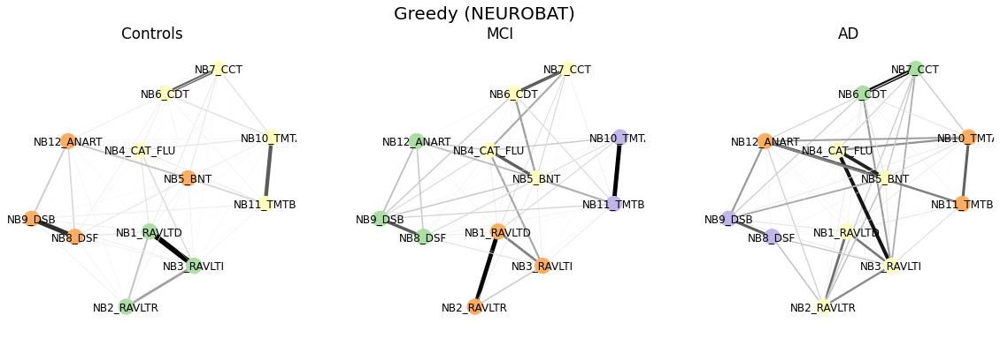

In [408]:
draw_graph_communities(graphs_ls, NEUROBAT_Greedy_partitions, NEUROBAT_labels, pos_NEUROBAT, 'NEUROBAT', 'Greedy')

#### Subgraph metrics

In [409]:
dx_ls = ['CN', 'MCI', 'AD']
for i in range(len(NEUROBAT_Greedy_partitions)):
    print(dx_ls[i], "---------------------")
    display(community_metrics(graphs_ls[i], NEUROBAT_Greedy_partitions[i]))

CN ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Executive,Language,Visuospatial
0,0,5,10,0.1626,1.0,0.627301,1.0,0.281845,25.768144,"[NB4_CAT_FLU, NB6_CDT, NB7_CCT, NB10_TMTA, NB1...",0.0,0.4,0.2,0.4
1,1,4,6,0.205652,1.0,0.616834,1.0,0.334867,16.31087,"[NB9_DSB, NB12_ANART, NB5_BNT, NB8_DSF]",0.0,0.5,0.5,0.0
2,2,3,3,0.484013,1.0,0.721397,1.0,0.542774,7.018772,"[NB1_RAVLTD, NB2_RAVLTR, NB3_RAVLTI]",1.0,0.0,0.0,0.0


MCI ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Executive,Language,Visuospatial
0,0,4,6,0.281213,1.0,0.653434,1.0,0.520563,14.86742,"[NB4_CAT_FLU, NB5_BNT, NB6_CDT, NB7_CCT]",0.0,0.0,0.5,0.5
1,1,3,3,0.433217,1.0,0.609358,1.0,0.571498,8.231658,"[NB1_RAVLTD, NB2_RAVLTR, NB3_RAVLTI]",1.0,0.0,0.0,0.0
2,2,3,3,0.337701,1.0,0.456526,1.0,0.617806,9.899257,"[NB9_DSB, NB12_ANART, NB8_DSF]",0.0,0.666667,0.333333,0.0
3,3,2,1,0.484873,1.0,0.484873,0,0.0,4.124791,"[NB10_TMTA, NB11_TMTB]",0.0,1.0,0.0,0.0


AD ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Executive,Language,Visuospatial
0,0,5,10,0.209581,1.0,0.776383,1.0,0.364814,26.87927,"[NB1_RAVLTD, NB2_RAVLTR, NB3_RAVLTI, NB4_CAT_F...",0.6,0.0,0.4,0.0
1,1,3,3,0.305237,1.0,0.50896,1.0,0.823039,8.0648,"[NB10_TMTA, NB11_TMTB, NB12_ANART]",0.0,0.666667,0.333333,0.0
2,2,2,1,0.436526,1.0,0.436526,0,0.0,4.581631,"[NB6_CDT, NB7_CCT]",0.0,0.0,0.0,1.0
3,3,2,1,0.309478,1.0,0.309478,0,0.0,6.4625,"[NB9_DSB, NB8_DSF]",0.0,1.0,0.0,0.0


In [410]:
domains_rep(graphs_ls, NEUROBAT_Greedy_partitions, 'NEUROBAT', 'Greedy')

#### 8.4.3. BISECTION ALGORITHM

In [411]:
NEUROBAT_Bisection_partitions = community_detection(graphs_ls, "Bisection")

--------------------------------
Bisection algorithm
--------------------------------
CN :  ({0, 1, 2, 3, 9, 10}, {4, 5, 6, 7, 8, 11})
Modularity Index:  0.1468612437517837 

MCI :  ({0, 1, 2, 7, 9, 10}, {3, 4, 5, 6, 8, 11})
Modularity Index:  0.14264098064402922 

AD :  ({0, 1, 2, 5, 6, 7}, {3, 4, 8, 9, 10, 11})
Modularity Index:  0.10883348617278268 



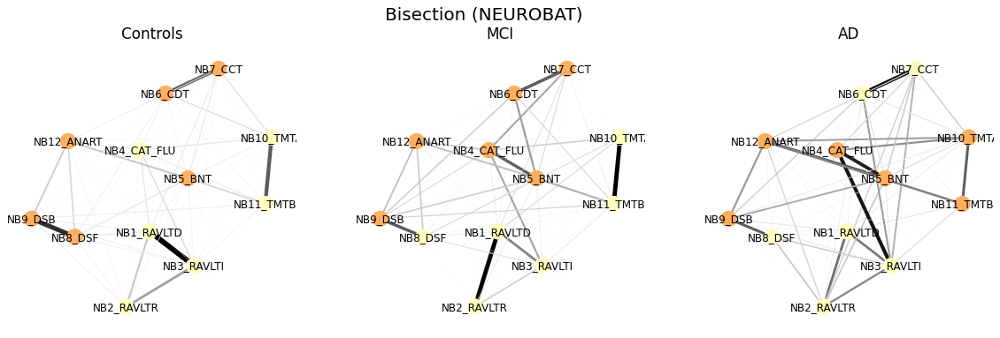

In [412]:
draw_graph_communities(graphs_ls, NEUROBAT_Bisection_partitions, NEUROBAT_labels, pos_NEUROBAT, 'NEUROBAT', 'Bisection')

#### Subgraph metrics

In [413]:
dx_ls = ['CN', 'MCI', 'AD']
for i in range(len(NEUROBAT_Bisection_partitions)):
    print(dx_ls[i], "---------------------")
    display(community_metrics(graphs_ls[i], NEUROBAT_Bisection_partitions[i]))

CN ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Executive,Language,Visuospatial
0,0,6,15,0.109059,1.0,0.770248,1.0,0.180763,47.610103,"[NB1_RAVLTD, NB2_RAVLTR, NB3_RAVLTI, NB4_CAT_F...",0.5,0.333333,0.166667,0.0
1,1,6,15,0.139853,1.0,0.710019,1.0,0.19354,69.612591,"[NB5_BNT, NB6_CDT, NB7_CCT, NB8_DSF, NB9_DSB, ...",0.0,0.333333,0.333333,0.333333


MCI ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Executive,Language,Visuospatial
0,0,6,15,0.122888,1.0,0.711193,1.0,0.203325,45.065512,"[NB1_RAVLTD, NB2_RAVLTR, NB3_RAVLTI, NB8_DSF, ...",0.5,0.5,0.0,0.0
1,1,6,15,0.22847,1.0,0.779953,1.0,0.358685,40.369132,"[NB4_CAT_FLU, NB5_BNT, NB6_CDT, NB7_CCT, NB9_D...",0.0,0.166667,0.5,0.333333


AD ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Executive,Language,Visuospatial
0,0,6,15,0.236863,1.0,0.774613,1.0,0.28432,31.959895,"[NB1_RAVLTD, NB2_RAVLTR, NB3_RAVLTI, NB6_CDT, ...",0.5,0.166667,0.0,0.333333
1,1,6,15,0.178512,1.0,0.814562,1.0,0.293163,198.636356,"[NB4_CAT_FLU, NB5_BNT, NB9_DSB, NB10_TMTA, NB1...",0.0,0.5,0.5,0.0


#### Export results

In [414]:
domains_rep(graphs_ls, NEUROBAT_Bisection_partitions, 'NEUROBAT', 'Bisection')

#### 8.4.4. LABEL PROPAGATION ALGORITHM

In [415]:
NEUROBAT_Label_partitions = community_detection(graphs_ls, "Label Propagation")

--------------------------------
Label Propagation algorithm
--------------------------------
CN :  [{0, 1, 2, 3}, {8, 11, 4, 7}, {5, 6}, {9, 10}]
Modularity Index:  0.22037906464289742 

MCI :  [{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11}]
Modularity Index:  2.220446049250313e-16 

AD :  [{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11}]
Modularity Index:  -1.1102230246251565e-16 



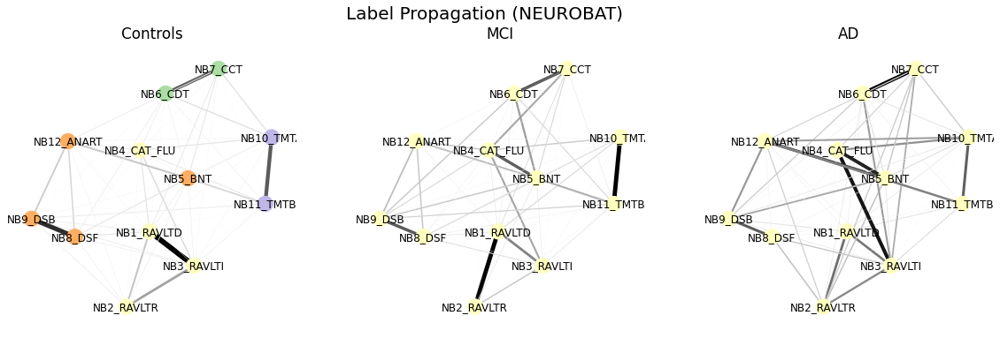

In [416]:
draw_graph_communities(graphs_ls, NEUROBAT_Label_partitions, NEUROBAT_labels, pos_NEUROBAT, 'NEUROBAT', 'Label Propagation')

In [417]:
dx_ls = ['CN', 'MCI', 'AD']
for i in range(len(NEUROBAT_Label_partitions)):
    print(dx_ls[i], "---------------------")
    display(community_metrics(graphs_ls[i], NEUROBAT_Label_partitions[i]))

CN ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Executive,Language,Visuospatial
0,0,4,6,0.266344,1.0,0.69822,1.0,0.3237,16.956588,"[NB1_RAVLTD, NB2_RAVLTR, NB3_RAVLTI, NB4_CAT_FLU]",0.75,0.0,0.25,0.0
1,1,4,6,0.205652,1.0,0.616834,1.0,0.334867,16.31087,"[NB9_DSB, NB12_ANART, NB5_BNT, NB8_DSF]",0.0,0.5,0.5,0.0
2,2,2,1,0.41199,1.0,0.41199,0,0.0,4.854489,"[NB6_CDT, NB7_CCT]",0.0,0.0,0.0,1.0
3,3,2,1,0.429872,1.0,0.429872,0,0.0,4.652548,"[NB10_TMTA, NB11_TMTB]",0.0,1.0,0.0,0.0


MCI ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Executive,Language,Visuospatial
0,0,12,66,0.067576,1.0,1.159377,1.0,0.152114,326.995209,"[NB1_RAVLTD, NB2_RAVLTR, NB3_RAVLTI, NB4_CAT_F...",0.25,0.333333,0.25,0.166667


AD ---------------------


,Index,NNodes,NEdges,Diameter,Density,AvDegree,Transitivity,AvCC,AvGE,Tests,Memory,Executive,Language,Visuospatial
0,0,12,66,0.083914,1.0,1.304847,1.0,0.202276,109.189872,"[NB1_RAVLTD, NB2_RAVLTR, NB3_RAVLTI, NB4_CAT_F...",0.25,0.333333,0.25,0.166667


#### Export results

In [418]:
domains_rep(graphs_ls, NEUROBAT_Label_partitions, 'NEUROBAT', 'Asyn')